In [1]:
import pandas as pd
from pandas_profiling import ProfileReport


In [2]:
df=pd.read_csv("Flight_delay.csv")
pd.set_option('display.max_columns', None)
df.head()

,DayOfWeek,Date,DepTime,ArrTime,CRSArrTime,UniqueCarrier,Airline,FlightNum,TailNum,ActualElapsedTime,CRSElapsedTime,AirTime,ArrDelay,DepDelay,Origin,Org_Airport,Dest,Dest_Airport,Distance,TaxiIn,TaxiOut,Cancelled,CancellationCode,Diverted,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay
0,4,03-01-2019,1829,1959,1925,WN,Southwest Airlines Co.,3920,N464WN,90,90,77,34,34,IND,Indianapolis International Airport,BWI,Baltimore-Washington International Airport,515,3,10,0,N,0,2,0,0,0,32
1,4,03-01-2019,1937,2037,1940,WN,Southwest Airlines Co.,509,N763SW,240,250,230,57,67,IND,Indianapolis International Airport,LAS,McCarran International Airport,1591,3,7,0,N,0,10,0,0,0,47
2,4,03-01-2019,1644,1845,1725,WN,Southwest Airlines Co.,1333,N334SW,121,135,107,80,94,IND,Indianapolis International Airport,MCO,Orlando International Airport,828,6,8,0,N,0,8,0,0,0,72
3,4,03-01-2019,1452,1640,1625,WN,Southwest Airlines Co.,675,N286WN,228,240,213,15,27,IND,Indianapolis International Airport,PHX,Phoenix Sky Harbor International Airport,1489,7,8,0,N,0,3,0,0,0,12
4,4,03-01-2019,1323,1526,1510,WN,Southwest Airlines Co.,4,N674AA,123,135,110,16,28,IND,Indianapolis International Airport,TPA,Tampa International Airport,838,4,9,0,N,0,0,0,0,0,16


In [3]:
df.shape

(484551, 29)

In [4]:
df.columns

Index(['DayOfWeek', 'Date', 'DepTime', 'ArrTime', 'CRSArrTime',
       'UniqueCarrier', 'Airline', 'FlightNum', 'TailNum', 'ActualElapsedTime',
       'CRSElapsedTime', 'AirTime', 'ArrDelay', 'DepDelay', 'Origin',
       'Org_Airport', 'Dest', 'Dest_Airport', 'Distance', 'TaxiIn', 'TaxiOut',
       'Cancelled', 'CancellationCode', 'Diverted', 'CarrierDelay',
       'WeatherDelay', 'NASDelay', 'SecurityDelay', 'LateAircraftDelay'],
      dtype='object')

In [5]:
#profile = ProfileReport(df, title="Report")
#profile

In [6]:
#profile.to_file("FlightDelay_report.html")

* DayOfWeek → 1 (Monday) - 7 (Sunday)
- Date → Scheduled date
- DepTime → Actual departure time (local, hhmm)
- ArrTime → Actual arrival time (local, hhmm)
- CRSArrTime → Scheduled arrival time (local, hhmm)
- UniqueCarrier → Unique carrier code
- Airline → Airline company
- FlightNum → flight number
- TailNum → plane tail number
- ActualElapsedTime → Actual time an airplane spends in the air(in minutes) with TaxiIn/Out
- CRSElapsedTime → CRS Elapsed Time of Flight (estimated elapse time), in minutes
- AirTime → Flight Time (in minutes)
- ArrDelay → Difference in minutes between scheduled and actual arrival time
- Origin → Origin IATA(International Air Transport Association) airport code
- Org_Airport → Origin Airport Name
- Dest → Destination IATA code
- Dest_Airport → Destination Airport Name
- Distance → Distance between airports (miles)
- TaxiIn → Wheels down and arrival at the destination airport gate, in minutes
- TaxiOut → The time elapsed between departure from the origin airport gate and wheels off, in minutes
- Cancelled → Was the flight canceled?
- CancellationCode → Reason for cancellation
- Diverted → 1 = yes, 0 = no
- CarrierDelay → Flight delay due to carrier(e.g. maintenance or crew problems, aircraft cleaning, fueling, etc), 0 = No, yes = (in minutes)
- WeatherDelay → Flight delay due to weather, 0 = No, yes = (in minutes)
- NASDelay → Flight delay by NSA(National Aviation System), 0 = No, yes = (in minutes)
- SecurityDelay → Flight delay by this reason, 0 = No, yes = (in minutes)
- LateAircraftDelay → Flight delay by this reason, 0 = No, yes = (in minutes)

# Idea

1. Clubbing all the Delays columns and make it as Yes or No
2. Categories our Delays CarrierDelay, WeatherDelay , NASDelay , SecurityDelay , LateAircraftDelay
3. Adding all the delay minutes and predict the total delay time using Regression Models

# My Ideas
1. We need to get climate data according to the dates we have around that airport In order to predict the Weather Delay.

# Next Meeting

1. Do some Analysis on Data and come up with your own Ideas.

In [7]:
df['CancellationCode'].unique()

array(['N'], dtype=object)

In [8]:
df['Diverted'].unique()

array([0], dtype=int64)

In [9]:
df['Cancelled'].unique()

array([0], dtype=int64)

In [10]:
df.dtypes

DayOfWeek             int64
Date                 object
DepTime               int64
ArrTime               int64
CRSArrTime            int64
UniqueCarrier        object
Airline              object
FlightNum             int64
TailNum              object
ActualElapsedTime     int64
CRSElapsedTime        int64
AirTime               int64
ArrDelay              int64
DepDelay              int64
Origin               object
Org_Airport          object
Dest                 object
Dest_Airport         object
Distance              int64
TaxiIn                int64
TaxiOut               int64
Cancelled             int64
CancellationCode     object
Diverted              int64
CarrierDelay          int64
WeatherDelay          int64
NASDelay              int64
SecurityDelay         int64
LateAircraftDelay     int64
dtype: object

# Visualization of Each Column

In [11]:
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
sns.set(color_codes=True)

<AxesSubplot:xlabel='count', ylabel='Airline'>

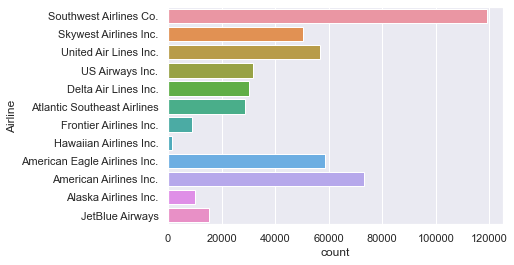

In [12]:
sns.countplot(y=df['Airline'],orient='v')

In [13]:
df['Dest_Airport'].nunique()

259

## Working on Time Columns

In [14]:
df.loc[(df['ArrDelay'] == df['LateAircraftDelay'])]

,DayOfWeek,Date,DepTime,ArrTime,CRSArrTime,UniqueCarrier,Airline,FlightNum,TailNum,ActualElapsedTime,CRSElapsedTime,AirTime,ArrDelay,DepDelay,Origin,Org_Airport,Dest,Dest_Airport,Distance,TaxiIn,TaxiOut,Cancelled,CancellationCode,Diverted,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay
4,4,03-01-2019,1323,1526,1510,WN,Southwest Airlines Co.,4,N674AA,123,135,110,16,28,IND,Indianapolis International Airport,TPA,Tampa International Airport,838,4,9,0,N,0,0,0,0,0,16
10,4,03-01-2019,1326,1559,1530,WN,Southwest Airlines Co.,1056,N459WN,153,180,143,29,56,ISP,Long Island MacArthur Airport,PBI,Palm Beach International Airport,1052,5,5,0,N,0,0,0,0,0,29
16,4,03-01-2019,948,959,940,WN,Southwest Airlines Co.,3430,N487WN,71,75,59,19,23,JAX,Jacksonville International Airport,BHM,Birmingham-Shuttlesworth International Airport,365,3,9,0,N,0,0,0,0,0,19
45,4,03-01-2019,1512,1802,1610,WN,Southwest Airlines Co.,706,N491WN,110,115,88,112,117,LAS,McCarran International Airport,DEN,Denver International Airport,629,8,14,0,N,0,0,0,0,0,112
89,4,03-01-2019,1838,1930,1855,WN,Southwest Airlines Co.,2730,N273WN,52,55,32,35,38,LAS,McCarran International Airport,ONT,Ontario International Airport,197,3,17,0,N,0,0,0,0,0,35
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
484508,4,19-06-2019,2023,2207,1945,AA,American Airlines Inc.,1487,N418AA,104,110,82,142,148,STL,St. Louis International Airport at Lambert Field,DFW,Dallas/Fort Worth International Airport,551,10,12,0,N,0,0,0,0,0,142
484524,6,07-06-2019,1342,1625,1555,AA,American Airlines Inc.,1492,N3BMAA,103,115,89,30,42,MSY,Louis Armstrong New Orleans International Airport,MIA,Miami International Airport,674,3,11,0,N,0,0,0,0,0,30
484526,5,13-06-2019,1347,1636,1555,AA,American Airlines Inc.,1492,N3BAAA,109,115,90,41,47,MSY,Louis Armstrong New Orleans International Airport,MIA,Miami International Airport,674,3,16,0,N,0,0,0,0,0,41
484528,4,19-06-2019,1351,1635,1555,AA,American Airlines Inc.,1492,N3BNAA,104,115,87,40,51,MSY,Louis Armstrong New Orleans International Airport,MIA,Miami International Airport,674,6,11,0,N,0,0,0,0,0,40


In [15]:
df.loc[:,['DepTime','ArrTime','CRSArrTime','ActualElapsedTime','CRSElapsedTime',\
                               'AirTime','ArrDelay','DepDelay','TaxiIn','TaxiOut']]

,DepTime,ArrTime,CRSArrTime,ActualElapsedTime,CRSElapsedTime,AirTime,ArrDelay,DepDelay,TaxiIn,TaxiOut
0,1829,1959,1925,90,90,77,34,34,3,10
1,1937,2037,1940,240,250,230,57,67,3,7
2,1644,1845,1725,121,135,107,80,94,6,8
3,1452,1640,1625,228,240,213,15,27,7,8
4,1323,1526,1510,123,135,110,16,28,4,9
...,...,...,...,...,...,...,...,...,...,...
484546,1609,1942,1915,153,160,131,27,34,7,15
484547,1616,1954,1915,158,160,136,39,41,11,11
484548,1617,2002,1915,165,160,141,47,42,7,17
484549,1607,1941,1915,154,160,137,26,32,5,12


In [16]:
time_df=df.loc[:,['DepTime','ArrTime','CRSArrTime','ActualElapsedTime','CRSElapsedTime','AirTime','ArrDelay','DepDelay','TaxiIn','TaxiOut']]

In [17]:
time_df.rename(columns={'DepTime':'DepTime(hhmm)' ,'ArrTime': 'ArrTime(hhmm)', 'CRSArrTime': 'CRSArrTime(hhmm)',\
                       'ActualElapsedTime':'ActualElapsedTime(min)', 'CRSElapsedTime':'CRSElapsedTime(min)',\
                        'AirTime': 'AirTime(min)', 'ArrDelay':'ArrDelay(min)','DepDelay':'DepDelay(min)',\
                        'TaxiIn':'TaxiIn(min)','TaxiOut':'TaxiOut(min)'\
                       })

,DepTime(hhmm),ArrTime(hhmm),CRSArrTime(hhmm),ActualElapsedTime(min),CRSElapsedTime(min),AirTime(min),ArrDelay(min),DepDelay(min),TaxiIn(min),TaxiOut(min)
0,1829,1959,1925,90,90,77,34,34,3,10
1,1937,2037,1940,240,250,230,57,67,3,7
2,1644,1845,1725,121,135,107,80,94,6,8
3,1452,1640,1625,228,240,213,15,27,7,8
4,1323,1526,1510,123,135,110,16,28,4,9
...,...,...,...,...,...,...,...,...,...,...
484546,1609,1942,1915,153,160,131,27,34,7,15
484547,1616,1954,1915,158,160,136,39,41,11,11
484548,1617,2002,1915,165,160,141,47,42,7,17
484549,1607,1941,1915,154,160,137,26,32,5,12


+ DepTime → Actual departure time (local, hhmm)
+ ArrTime → Actual arrival time (local, hhmm)
+ CRSArrTime → Scheduled arrival time (local, hhmm)
+ ActualElapsedTime → Actual time an airplane spends in the air(in minutes) with TaxiIn/Out
+ CRSElapsedTime → CRS Elapsed Time of Flight (estimated elapse time), in minutes
+ AirTime → Flight Time (in minutes)
+ ArrDelay → Difference in minutes between scheduled and actual arrival time
+ DepDelay → Depdelay
+ TaxiIn → Wheels down and arrival at the destination airport gate, in minutes
+ TaxiOut → The time elapsed between departure from the origin airport gate and wheels off, in minutes

In [18]:
a=pd.DataFrame(data=df.loc[:,['ArrDelay','DepDelay','CarrierDelay','WeatherDelay','NASDelay',\
                   'SecurityDelay','LateAircraftDelay']])

In [19]:
a.head()

,ArrDelay,DepDelay,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay
0,34,34,2,0,0,0,32
1,57,67,10,0,0,0,47
2,80,94,8,0,0,0,72
3,15,27,3,0,0,0,12
4,16,28,0,0,0,0,16


### ArrDelay is the combination of all the other 5 Delays. In short its Total Delay time. 
### ArrDelay = CRSArrTime - ArrTime
### Actual Elapsed Time = AirTime + TaxiIn + Taxi out

### Taxi Time Means Aircraft spending Time on the Ground while moving
### Taxi-In time Means total time for Aircraft to land and Park
### Taxi-Out time Means total time for Aircraft to leave the Parking spot and Take off from the Ground.

### Finding Records for 0 ArrDelay or Minimum Delay

In [20]:
df[df['ArrDelay'] <= 15].tail()

,DayOfWeek,Date,DepTime,ArrTime,CRSArrTime,UniqueCarrier,Airline,FlightNum,TailNum,ActualElapsedTime,CRSElapsedTime,AirTime,ArrDelay,DepDelay,Origin,Org_Airport,Dest,Dest_Airport,Distance,TaxiIn,TaxiOut,Cancelled,CancellationCode,Diverted,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay
484261,7,29-06-2019,1145,1235,1220,AA,American Airlines Inc.,1451,N3CGAA,110,115,92,15,20,MIA,Miami International Airport,MSY,Louis Armstrong New Orleans International Airport,674,5,13,0,N,0,2,0,0,0,13
484275,4,26-06-2019,1146,1305,1250,AA,American Airlines Inc.,1456,N4XXAA,79,75,48,15,11,LAX,Los Angeles International Airport,LAS,McCarran International Airport,236,13,18,0,N,0,2,0,4,0,9
484335,7,22-06-2019,1103,1240,1225,AA,American Airlines Inc.,1461,N4XRAA,217,215,195,15,13,DFW,Dallas/Fort Worth International Airport,SFO,San Francisco International Airport,1464,8,14,0,N,0,13,0,2,0,0
484420,2,24-06-2019,1505,2030,2015,AA,American Airlines Inc.,1474,N458AA,205,215,182,15,25,OAK,Oakland International Airport,DFW,Dallas/Fort Worth International Airport,1456,14,9,0,N,0,0,0,0,0,15
484522,2,24-06-2019,717,825,810,AA,American Airlines Inc.,1491,N497AA,128,120,99,15,7,SDF,Louisville International Airport (Standiford F...,DFW,Dallas/Fort Worth International Airport,733,22,7,0,N,0,7,0,8,0,0


### Finding Records for 0 DepDelay or Minimum Delay

In [21]:
df[df['DepDelay'] <= 7].head(10)

,DayOfWeek,Date,DepTime,ArrTime,CRSArrTime,UniqueCarrier,Airline,FlightNum,TailNum,ActualElapsedTime,CRSElapsedTime,AirTime,ArrDelay,DepDelay,Origin,Org_Airport,Dest,Dest_Airport,Distance,TaxiIn,TaxiOut,Cancelled,CancellationCode,Diverted,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay
70,4,03-01-2019,1506,2122,2030,WN,Southwest Airlines Co.,74,N764SW,256,210,177,52,6,LAS,McCarran International Airport,MDW,Chicago Midway International Airport,1521,62,17,0,N,0,6,0,46,0,0
95,4,03-01-2019,712,932,915,WN,Southwest Airlines Co.,243,N228WN,80,70,49,17,7,LAS,McCarran International Airport,PHX,Phoenix Sky Harbor International Airport,256,7,24,0,N,0,0,0,10,0,7
271,4,03-01-2019,1506,1730,1705,WN,Southwest Airlines Co.,3067,N252WN,144,125,115,25,6,MCO,Orlando International Airport,BWI,Baltimore-Washington International Airport,787,21,8,0,N,0,6,0,19,0,0
293,4,03-01-2019,636,930,915,WN,Southwest Airlines Co.,589,N419WN,174,165,154,15,6,MCO,Orlando International Airport,MHT,Manchester-Boston Regional Airport,1142,4,16,0,N,0,0,0,9,6,0
351,4,03-01-2019,647,931,915,WN,Southwest Airlines Co.,3760,N672SW,104,95,84,16,7,MDW,Chicago Midway International Airport,IAD,Washington Dulles International Airport,577,5,15,0,N,0,0,7,9,0,0
553,4,03-01-2019,1857,2027,2010,WN,Southwest Airlines Co.,80,N422WN,90,80,64,17,7,OAK,Oakland International Airport,SNA,John Wayne Airport (Orange County Airport),371,4,22,0,N,0,0,0,10,0,7
669,4,03-01-2019,1046,1123,1105,WN,Southwest Airlines Co.,769,N608SW,97,85,70,18,6,PHX,Phoenix Sky Harbor International Airport,LAX,Los Angeles International Airport,370,13,14,0,N,0,0,0,12,5,1
672,4,03-01-2019,1321,1351,1335,WN,Southwest Airlines Co.,2360,N618WN,90,80,65,16,6,PHX,Phoenix Sky Harbor International Airport,LAX,Los Angeles International Airport,370,6,19,0,N,0,6,0,10,0,0
677,4,03-01-2019,1502,1615,1600,WN,Southwest Airlines Co.,3240,N282WN,133,125,114,15,7,PHX,Phoenix Sky Harbor International Airport,OAK,Oakland International Airport,646,5,14,0,N,0,7,0,8,0,0
759,4,03-01-2019,1221,1330,1315,WN,Southwest Airlines Co.,1002,N745SW,69,60,57,15,6,RNO,Reno/Tahoe International Airport,SJC,Norman Y. Mineta San José International Airport,188,3,9,0,N,0,4,0,9,0,2


In [22]:
df[df['WeatherDelay'] > 0].head(5)

,DayOfWeek,Date,DepTime,ArrTime,CRSArrTime,UniqueCarrier,Airline,FlightNum,TailNum,ActualElapsedTime,CRSElapsedTime,AirTime,ArrDelay,DepDelay,Origin,Org_Airport,Dest,Dest_Airport,Distance,TaxiIn,TaxiOut,Cancelled,CancellationCode,Diverted,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay
200,4,03-01-2019,2008,2139,1930,WN,Southwest Airlines Co.,646,N738CB,91,85,70,129,123,LAX,Los Angeles International Airport,SFO,San Francisco International Airport,337,5,16,0,N,0,0,24,6,0,99
208,4,03-01-2019,2140,2249,2140,WN,Southwest Airlines Co.,1113,N731SA,69,65,54,69,65,LAX,Los Angeles International Airport,SJC,Norman Y. Mineta San José International Airport,308,6,9,0,N,0,0,12,4,0,53
330,4,03-01-2019,637,838,815,WN,Southwest Airlines Co.,950,N750SA,61,60,49,23,22,MDW,Chicago Midway International Airport,CMH,Port Columbus International Airport,284,5,7,0,N,0,0,22,1,0,0
351,4,03-01-2019,647,931,915,WN,Southwest Airlines Co.,3760,N672SW,104,95,84,16,7,MDW,Chicago Midway International Airport,IAD,Washington Dulles International Airport,577,5,15,0,N,0,0,7,9,0,0
362,4,03-01-2019,650,840,815,WN,Southwest Airlines Co.,891,N400WN,230,240,216,25,35,MDW,Chicago Midway International Airport,LAS,McCarran International Airport,1521,3,11,0,N,0,0,25,0,0,0


## Data Cleaning

#### Finding null values

In [23]:
df.isna().sum()

DayOfWeek               0
Date                    0
DepTime                 0
ArrTime                 0
CRSArrTime              0
UniqueCarrier           0
Airline                 0
FlightNum               0
TailNum                 0
ActualElapsedTime       0
CRSElapsedTime          0
AirTime                 0
ArrDelay                0
DepDelay                0
Origin                  0
Org_Airport          1177
Dest                    0
Dest_Airport         1479
Distance                0
TaxiIn                  0
TaxiOut                 0
Cancelled               0
CancellationCode        0
Diverted                0
CarrierDelay            0
WeatherDelay            0
NASDelay                0
SecurityDelay           0
LateAircraftDelay       0
dtype: int64

In [24]:
df[df.Org_Airport.isna()]

,DayOfWeek,Date,DepTime,ArrTime,CRSArrTime,UniqueCarrier,Airline,FlightNum,TailNum,ActualElapsedTime,CRSElapsedTime,AirTime,ArrDelay,DepDelay,Origin,Org_Airport,Dest,Dest_Airport,Distance,TaxiIn,TaxiOut,Cancelled,CancellationCode,Diverted,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay
17166,2,01-01-2019,1246,1319,1239,OO,Skywest Airlines Inc.,5741,N218SW,33,37,20,40,44,MOD,NaN,SFO,San Francisco International Airport,78,5,8,0,N,0,0,0,0,0,40
17169,2,01-01-2019,1423,1537,1455,OO,Skywest Airlines Inc.,5761,N582SW,74,85,63,42,53,MOD,NaN,LAX,Los Angeles International Airport,292,7,4,0,N,0,0,0,0,0,42
17170,2,01-01-2019,1112,1236,1119,OO,Skywest Airlines Inc.,5769,N295SW,84,90,61,77,83,MOD,NaN,LAX,Los Angeles International Airport,292,10,13,0,N,0,0,77,0,0,0
17622,3,02-01-2019,1120,1253,1119,OO,Skywest Airlines Inc.,5769,N584SW,93,90,67,94,91,MOD,NaN,LAX,Los Angeles International Airport,292,17,9,0,N,0,94,0,0,0,0
18049,4,03-01-2019,935,1018,1000,OO,Skywest Airlines Inc.,5720,N566SW,43,39,32,18,14,MOD,NaN,SFO,San Francisco International Airport,78,4,7,0,N,0,0,0,18,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
461341,5,20-06-2019,1927,2055,1755,EV,Atlantic Southeast Airlines,4903,N936EV,88,86,60,180,178,LYH,NaN,ATL,Hartsfield-Jackson Atlanta International Airport,389,16,12,0,N,0,178,0,2,0,0
461342,7,22-06-2019,1813,1943,1755,EV,Atlantic Southeast Airlines,4903,N909EV,90,86,66,108,104,LYH,NaN,ATL,Hartsfield-Jackson Atlanta International Airport,389,10,14,0,N,0,104,0,4,0,0
461343,1,23-06-2019,1714,1832,1755,EV,Atlantic Southeast Airlines,4903,N981EV,78,86,62,37,45,LYH,NaN,ATL,Hartsfield-Jackson Atlanta International Airport,389,6,10,0,N,0,0,0,0,0,37
461344,4,26-06-2019,1658,1835,1755,EV,Atlantic Southeast Airlines,4903,N901EV,97,86,83,40,29,LYH,NaN,ATL,Hartsfield-Jackson Atlanta International Airport,389,6,8,0,N,0,0,0,40,0,0


In [25]:
#### We Can drop these rows. Since it contribute

In [26]:
print("Missing Origin Airport Percentage ",len(df[df.Org_Airport.isna()])/len(df.index))
print("Missing Origin Airport Percentage ",len(df[df.Dest_Airport.isna()])/len(df['AirTime']))

Missing Origin Airport Percentage  0.0024290528757550806
Missing Origin Airport Percentage  0.0030523102831280916


In [27]:
df_1=df.dropna()

In [28]:
df.shape[0],df_1.shape[0]

(484551, 481895)

In [29]:
df_1.groupby('Dest').count()

,DayOfWeek,Date,DepTime,ArrTime,CRSArrTime,UniqueCarrier,Airline,FlightNum,TailNum,ActualElapsedTime,CRSElapsedTime,AirTime,ArrDelay,DepDelay,Origin,Org_Airport,Dest_Airport,Distance,TaxiIn,TaxiOut,Cancelled,CancellationCode,Diverted,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay
Dest,,,,,,,,,,,,,,,,,,,,,,,,,,,,
ABE,219,219,219,219,219,219,219,219,219,219,219,219,219,219,219,219,219,219,219,219,219,219,219,219,219,219,219,219
ABI,327,327,327,327,327,327,327,327,327,327,327,327,327,327,327,327,327,327,327,327,327,327,327,327,327,327,327,327
ABQ,3289,3289,3289,3289,3289,3289,3289,3289,3289,3289,3289,3289,3289,3289,3289,3289,3289,3289,3289,3289,3289,3289,3289,3289,3289,3289,3289,3289
ABY,130,130,130,130,130,130,130,130,130,130,130,130,130,130,130,130,130,130,130,130,130,130,130,130,130,130,130,130
ACT,227,227,227,227,227,227,227,227,227,227,227,227,227,227,227,227,227,227,227,227,227,227,227,227,227,227,227,227
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
WRG,62,62,62,62,62,62,62,62,62,62,62,62,62,62,62,62,62,62,62,62,62,62,62,62,62,62,62,62
WYS,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5,5
XNA,1325,1325,1325,1325,1325,1325,1325,1325,1325,1325,1325,1325,1325,1325,1325,1325,1325,1325,1325,1325,1325,1325,1325,1325,1325,1325,1325,1325


In [30]:
df_1.groupby('Dest_Airport').count()

,DayOfWeek,Date,DepTime,ArrTime,CRSArrTime,UniqueCarrier,Airline,FlightNum,TailNum,ActualElapsedTime,CRSElapsedTime,AirTime,ArrDelay,DepDelay,Origin,Org_Airport,Dest,Distance,TaxiIn,TaxiOut,Cancelled,CancellationCode,Diverted,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay
Dest_Airport,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Abilene Regional Airport,327,327,327,327,327,327,327,327,327,327,327,327,327,327,327,327,327,327,327,327,327,327,327,327,327,327,327,327
Abraham Lincoln Capital Airport,64,64,64,64,64,64,64,64,64,64,64,64,64,64,64,64,64,64,64,64,64,64,64,64,64,64,64,64
Adak Airport,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10
Akron-Canton Regional Airport,369,369,369,369,369,369,369,369,369,369,369,369,369,369,369,369,369,369,369,369,369,369,369,369,369,369,369,369
Albany International Airport,989,989,989,989,989,989,989,989,989,989,989,989,989,989,989,989,989,989,989,989,989,989,989,989,989,989,989,989
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Yakutat Airport,77,77,77,77,77,77,77,77,77,77,77,77,77,77,77,77,77,77,77,77,77,77,77,77,77,77,77,77
Yampa Valley Airport (Yampa Valley Regional),277,277,277,277,277,277,277,277,277,277,277,277,277,277,277,277,277,277,277,277,277,277,277,277,277,277,277,277
Yeager Airport,266,266,266,266,266,266,266,266,266,266,266,266,266,266,266,266,266,266,266,266,266,266,266,266,266,266,266,266


### Creating Dataset Having Information about Date and Destination Airport for web scraping

In [31]:
df_1.head()

,DayOfWeek,Date,DepTime,ArrTime,CRSArrTime,UniqueCarrier,Airline,FlightNum,TailNum,ActualElapsedTime,CRSElapsedTime,AirTime,ArrDelay,DepDelay,Origin,Org_Airport,Dest,Dest_Airport,Distance,TaxiIn,TaxiOut,Cancelled,CancellationCode,Diverted,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay
0,4,03-01-2019,1829,1959,1925,WN,Southwest Airlines Co.,3920,N464WN,90,90,77,34,34,IND,Indianapolis International Airport,BWI,Baltimore-Washington International Airport,515,3,10,0,N,0,2,0,0,0,32
1,4,03-01-2019,1937,2037,1940,WN,Southwest Airlines Co.,509,N763SW,240,250,230,57,67,IND,Indianapolis International Airport,LAS,McCarran International Airport,1591,3,7,0,N,0,10,0,0,0,47
2,4,03-01-2019,1644,1845,1725,WN,Southwest Airlines Co.,1333,N334SW,121,135,107,80,94,IND,Indianapolis International Airport,MCO,Orlando International Airport,828,6,8,0,N,0,8,0,0,0,72
3,4,03-01-2019,1452,1640,1625,WN,Southwest Airlines Co.,675,N286WN,228,240,213,15,27,IND,Indianapolis International Airport,PHX,Phoenix Sky Harbor International Airport,1489,7,8,0,N,0,3,0,0,0,12
4,4,03-01-2019,1323,1526,1510,WN,Southwest Airlines Co.,4,N674AA,123,135,110,16,28,IND,Indianapolis International Airport,TPA,Tampa International Airport,838,4,9,0,N,0,0,0,0,0,16


In [32]:
Weather_data = df_1.loc[:,['Date','Dest_Airport']]

In [33]:
Weather_data.to_csv("WeatherDateLoc.csv",index=False)

In [34]:
df_1.groupby(by='Dest').get_group('ABE')

,DayOfWeek,Date,DepTime,ArrTime,CRSArrTime,UniqueCarrier,Airline,FlightNum,TailNum,ActualElapsedTime,CRSElapsedTime,AirTime,ArrDelay,DepDelay,Origin,Org_Airport,Dest,Dest_Airport,Distance,TaxiIn,TaxiOut,Cancelled,CancellationCode,Diverted,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay
17254,2,01-01-2019,1736,2030,1919,OO,Skywest Airlines Inc.,5970,N756SK,114,109,82,71,66,ORD,Chicago O'Hare International Airport,ABE,Lehigh Valley International Airport,654,8,24,0,N,0,0,0,0,0,71
18104,4,03-01-2019,1645,1938,1919,OO,Skywest Airlines Inc.,5970,N715SK,113,109,86,19,15,ORD,Chicago O'Hare International Airport,ABE,Lehigh Valley International Airport,654,5,22,0,N,0,0,0,0,0,19
19901,7,06-01-2019,923,1214,1150,OO,Skywest Airlines Inc.,6063,N934SW,111,110,83,24,23,ORD,Chicago O'Hare International Airport,ABE,Lehigh Valley International Airport,654,4,24,0,N,0,0,0,0,0,24
21425,4,10-01-2019,2052,2336,2220,OO,Skywest Airlines Inc.,5931,N413SW,104,110,85,76,82,ORD,Chicago O'Hare International Airport,ABE,Lehigh Valley International Airport,654,7,12,0,N,0,76,0,0,0,0
22026,7,13-01-2019,1959,2252,2220,OO,Skywest Airlines Inc.,5931,N907SW,113,110,89,32,29,ORD,Chicago O'Hare International Airport,ABE,Lehigh Valley International Airport,654,4,20,0,N,0,0,0,0,0,32
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
460480,7,22-06-2019,2131,2333,2216,EV,Atlantic Southeast Airlines,4731,N909EV,122,126,95,77,81,ATL,Hartsfield-Jackson Atlanta International Airport,ABE,Lehigh Valley International Airport,692,5,22,0,N,0,0,0,77,0,0
460481,1,23-06-2019,2113,2324,2216,EV,Atlantic Southeast Airlines,4731,N820AS,131,126,94,68,63,ATL,Hartsfield-Jackson Atlanta International Airport,ABE,Lehigh Valley International Airport,692,4,33,0,N,0,0,0,68,0,0
460482,4,26-06-2019,2228,36,2216,EV,Atlantic Southeast Airlines,4731,N937EV,128,126,92,140,138,ATL,Hartsfield-Jackson Atlanta International Airport,ABE,Lehigh Valley International Airport,692,3,33,0,N,0,10,128,2,0,0
460483,5,27-06-2019,2043,2300,2216,EV,Atlantic Southeast Airlines,4731,N976EV,137,126,101,44,33,ATL,Hartsfield-Jackson Atlanta International Airport,ABE,Lehigh Valley International Airport,692,5,31,0,N,0,0,0,44,0,0


### Weather Delays

In [35]:
df_1[df_1['WeatherDelay'] != 0].shape

(34055, 29)

# WorkFlow Now

#### We need to seperate out month and days from the Year. Then We can use these two columns for prediction

#### Weather Delay Prediction

1. After adding the weather Data we will filter out the location which have weather data and drop those Dest location that    
   have no weather Data. 
   + After adding weather data we found out weather Delays are for 34055 Dest location


2. Then we will treat if flight was delayed due to weather or not. Our Objective here will be to Predict if the Flight was delayed Due to weather or not. If not it has been delayed due to some other Reason.

3. If Flight was Delayed Due to weather we will then apply regressor to check how much minutes it got Delayed

#### Predicting Types of Delays

1. We will Keep all the weather attributes as well as the the attributes which we had initially. Make only one columns of Delays which will have 5 categories those are NASDelay, Weather Delay, Security Delay, Carrier Delay and 	LateAircraftDelay.


Logic:

1. First you need to assign 1 value to highest categorical Delay Column. 
    For this you need to compare the 5 columns Delay and assign 1 to the highest column you can loop through records and pick
    last 5 columns and compare the values among.
    
2. Once you assigned all the 1's and 0's values you can then use multi-classifier,Decision-Tree, KNN, Random Forest,    Multi-logistic regression,Ensemble Methods also you can use unsupervised models on this data 


**Optional**
1. We can also show if delays is from any one of the categories we can then perform regressor on it and give out the results.

##### 



### Data Cleaning Version 2

1. We need to convert all local time into proper hh:mm format. 
2. We need to Drop Cancellation , Cancelled and Diverted columns. 
3. We need to make one more column name Schedue Departure From ActualDeparture - DepDelay
4. Droppin Null Columns

In [36]:
df.head()

,DayOfWeek,Date,DepTime,ArrTime,CRSArrTime,UniqueCarrier,Airline,FlightNum,TailNum,ActualElapsedTime,CRSElapsedTime,AirTime,ArrDelay,DepDelay,Origin,Org_Airport,Dest,Dest_Airport,Distance,TaxiIn,TaxiOut,Cancelled,CancellationCode,Diverted,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay
0,4,03-01-2019,1829,1959,1925,WN,Southwest Airlines Co.,3920,N464WN,90,90,77,34,34,IND,Indianapolis International Airport,BWI,Baltimore-Washington International Airport,515,3,10,0,N,0,2,0,0,0,32
1,4,03-01-2019,1937,2037,1940,WN,Southwest Airlines Co.,509,N763SW,240,250,230,57,67,IND,Indianapolis International Airport,LAS,McCarran International Airport,1591,3,7,0,N,0,10,0,0,0,47
2,4,03-01-2019,1644,1845,1725,WN,Southwest Airlines Co.,1333,N334SW,121,135,107,80,94,IND,Indianapolis International Airport,MCO,Orlando International Airport,828,6,8,0,N,0,8,0,0,0,72
3,4,03-01-2019,1452,1640,1625,WN,Southwest Airlines Co.,675,N286WN,228,240,213,15,27,IND,Indianapolis International Airport,PHX,Phoenix Sky Harbor International Airport,1489,7,8,0,N,0,3,0,0,0,12
4,4,03-01-2019,1323,1526,1510,WN,Southwest Airlines Co.,4,N674AA,123,135,110,16,28,IND,Indianapolis International Airport,TPA,Tampa International Airport,838,4,9,0,N,0,0,0,0,0,16


In [37]:
df.shape

(484551, 29)

### First Weather Data

In [38]:
weather_1=pd.read_csv('web_scrape_CDC_last.csv')

In [39]:
weather_1.head()

,Unnamed: 0,Temp_avg,Temp_min,Dew_max,Dew_avg,Dew_min,Hum_max,Hum_avg,Hum_min,Wind_max,Wind_avg,Wind_min,Pres_max,Pres_avg,Pres_min,Precipitation,Date,Dest
0,0,47.6,41,48,39.5,29,93,75.5,49,22,9.6,0,29.8,29.4,29.2,1.05,2019-01-01,ABE
1,1,39.1,36,33,27.8,26,86,64.4,57,10,5.5,0,29.9,29.8,29.6,0.00,2019-01-02,ABE
2,2,37.7,30,34,29.8,22,89,74.7,53,15,5.5,0,29.6,29.6,29.5,0.01,2019-01-03,ABE
3,3,36.9,27,36,29.0,22,86,73.7,58,15,4.5,0,29.6,29.5,29.3,0.00,2019-01-04,ABE
4,4,42.3,38,42,37.9,31,93,84.9,63,16,7.9,3,29.3,29.2,29.1,0.21,2019-01-05,ABE


In [40]:
weather_1.shape

(15199, 18)

In [41]:
weather_1['Dest'].unique()

array(['ABE', 'ABI', 'ABQ', 'ABY', 'ACT', 'ACV', 'AEX', 'AGS', 'ALB',
       'AMA', 'ASE', 'ATL', 'ATW', 'AUS', 'AVL', 'AVP', 'AZO', 'BDL',
       'BFL', 'BGR', 'BHM', 'BIL', 'BIS', 'BLI', 'BMI', 'BNA', 'BOI',
       'BOS', 'BQK', 'BTM', 'BUF', 'BUR', 'BZN', 'CAK', 'CDC'],
      dtype=object)

### Second Weather Data

In [42]:
weather_2=pd.read_csv('web_scrape_PSC_last.csv')

In [43]:
weather_2.head()

,Unnamed: 0,Unnamed: 0.1,Temp_avg,Temp_min,Dew_max,Dew_avg,Dew_min,Hum_max,Hum_avg,Hum_min,Wind_max,Wind_avg,Wind_min,Pres_max,Pres_avg,Pres_min,Precipitation,Date,Dest
0,0,0.0,47.6,41,48,39.5,29,93,75.5,49,22,9.6,0,29.8,29.4,29.2,1.05,2019-01-01,ABE
1,1,1.0,39.1,36,33,27.8,26,86,64.4,57,10,5.5,0,29.9,29.8,29.6,0.00,2019-01-02,ABE
2,2,2.0,37.7,30,34,29.8,22,89,74.7,53,15,5.5,0,29.6,29.6,29.5,0.01,2019-01-03,ABE
3,3,3.0,36.9,27,36,29.0,22,86,73.7,58,15,4.5,0,29.6,29.5,29.3,0.00,2019-01-04,ABE
4,4,4.0,42.3,38,42,37.9,31,93,84.9,63,16,7.9,3,29.3,29.2,29.1,0.21,2019-01-05,ABE


In [44]:
weather_2.Dest.unique()

array(['ABE', 'ABI', 'ABQ', 'ABY', 'ACT', 'ACV', 'AEX', 'AGS', 'ALB',
       'AMA', 'ASE', 'ATL', 'ATW', 'AUS', 'AVL', 'AVP', 'AZO', 'BDL',
       'BFL', 'BGR', 'BHM', 'BIL', 'BIS', 'BLI', 'BMI', 'BNA', 'BOI',
       'BOS', 'BQK', 'BTM', 'BUF', 'BUR', 'BZN', 'CAK', 'CDC', 'CHA',
       'CHO', 'CHS', 'CID', 'CLE', 'CLL', 'CLT', 'CMH', 'COD', 'COS',
       'CPR', 'CRW', 'CSG', 'CVG', 'CWA', 'DAB', 'DAL', 'DAY', 'DBQ',
       'DFW', 'DRO', 'EGE', 'EKO', 'ELP', 'EUG', 'EWN', 'EYW', 'FAR',
       'FAT', 'FAY', 'FLL', 'FNT', 'FSD', 'FSM', 'FWA', 'GEG', 'GGG',
       'GJT', 'GRR', 'GSO', 'GSP', 'GTF', 'GTR', 'GUC', 'HLN', 'HOU',
       'HPN', 'HRL', 'HSV', 'IAD', 'IAH', 'ICT', 'IDA', 'ILM', 'IND',
       'ISP', 'JAC', 'JAN', 'JAX', 'LAN', 'LAS', 'LEX', 'LGA', 'LGB',
       'LIT', 'LNK', 'LRD', 'LSE', 'LWS', 'MAF', 'MBS', 'MCI', 'MCO',
       'MDW', 'MEI', 'MEM', 'MFR', 'MHT', 'MIA', 'MKE', 'MKG', 'MLB',
       'MLI', 'MOB', 'MRY', 'MSN', 'MSO', 'MSP', 'MSY', 'MTJ', 'MYR',
       'OAK', 'OKC',

### Third weather Data

In [45]:
weather_3=pd.read_csv('web_scrape_XNA_last.csv')

In [46]:
weather_3.head()

,Unnamed: 0,Temp_avg,Temp_min,Dew_max,Dew_avg,Dew_min,Hum_max,Hum_avg,Hum_min,Wind_max,Wind_avg,Wind_min,Pres_max,Pres_avg,Pres_min,Precipitation,Date,Dest
0,0,47.6,41,48,39.5,29,93,75.5,49,22,9.6,0,29.8,29.4,29.2,1.05,1/1/2019,ABE
1,1,39.1,36,33,27.8,26,86,64.4,57,10,5.5,0,29.9,29.8,29.6,0.00,1/2/2019,ABE
2,2,37.7,30,34,29.8,22,89,74.7,53,15,5.5,0,29.6,29.6,29.5,0.01,1/3/2019,ABE
3,3,36.9,27,36,29.0,22,86,73.7,58,15,4.5,0,29.6,29.5,29.3,0.00,1/4/2019,ABE
4,4,42.3,38,42,37.9,31,93,84.9,63,16,7.9,3,29.3,29.2,29.1,0.21,1/5/2019,ABE


In [47]:
print(weather_3.Dest.unique())
print(weather_3.Dest.nunique())

['ABE' 'ABI' 'ABQ' 'ABY' 'ACT' 'ACV' 'AEX' 'AGS' 'ALB' 'AMA' 'ASE' 'ATL'
 'ATW' 'AUS' 'AVL' 'AVP' 'AZO' 'BDL' 'BFL' 'BGR' 'BHM' 'BIL' 'BIS' 'BLI'
 'BMI' 'BNA' 'BOI' 'BOS' 'BQK' 'BTM' 'BUF' 'BUR' 'BZN' 'CAK' 'CDC' 'CHA'
 'CHO' 'CHS' 'CID' 'CLE' 'CLL' 'CLT' 'CMH' 'COD' 'COS' 'CPR' 'CRW' 'CSG'
 'CVG' 'CWA' 'DAB' 'DAL' 'DAY' 'DBQ' 'DFW' 'DRO' 'EGE' 'EKO' 'ELP' 'EUG'
 'EWN' 'EYW' 'FAR' 'FAT' 'FAY' 'FLL' 'FNT' 'FSD' 'FSM' 'FWA' 'GEG' 'GGG'
 'GJT' 'GRR' 'GSO' 'GSP' 'GTF' 'GTR' 'GUC' 'HLN' 'HOU' 'HPN' 'HRL' 'HSV'
 'IAD' 'IAH' 'ICT' 'IDA' 'ILM' 'IND' 'ISP' 'JAC' 'JAN' 'JAX' 'LAN' 'LAS'
 'LEX' 'LGA' 'LGB' 'LIT' 'LNK' 'LRD' 'LSE' 'LWS' 'MAF' 'MBS' 'MCI' 'MCO'
 'MDW' 'MEI' 'MEM' 'MFR' 'MHT' 'MIA' 'MKE' 'MKG' 'MLB' 'MLI' 'MOB' 'MRY'
 'MSN' 'MSO' 'MSP' 'MSY' 'MTJ' 'MYR' 'OAK' 'OKC' 'OMA' 'ONT' 'ORD' 'ORF'
 'PBI' 'PDX' 'PHF' 'PHL' 'PHX' 'PIH' 'PIT' 'PNS' 'PSC' 'PSP' 'PVD' 'PWM'
 'RAP' 'RDD' 'RDM' 'RDU' 'RIC' 'RNO' 'ROA' 'ROC' 'ROW' 'RST' 'RSW' 'SAN'
 'SAV' 'SBA' 'SBN' 'SBP' 'SDF' 'SEA' 'SFO' 'SGU' 'S

In [48]:
weather_3.shape

(70795, 18)

### Finding location which don't have weather Data.

In [49]:
weather_loc=list(weather_3.Dest.unique())

In [50]:
Orginal_loc=list(df.Dest.unique())

In [51]:
import numpy as np
no_weather_data=list(set(Orginal_loc) - set(weather_loc))
print(np.sort(no_weather_data))

['ACY' 'ADK' 'ADQ' 'AKN' 'ANC' 'BET' 'BQN' 'BRW' 'BTR' 'BTV' 'BWI' 'CAE'
 'CDV' 'CEC' 'CIC' 'CLD' 'CMI' 'CRP' 'DCA' 'DEN' 'DHN' 'DLG' 'DSM' 'DTW'
 'EVV' 'EWR' 'FAI' 'FCA' 'FLO' 'GNV' 'GPT' 'GRB' 'GRK' 'HDN' 'HHH' 'HNL'
 'IPL' 'ITO' 'IYK' 'JFK' 'JNU' 'KOA' 'KTN' 'LAW' 'LAX' 'LBB' 'LFT' 'LIH'
 'LWB' 'LYH' 'MCN' 'MDT' 'MFE' 'MGM' 'MLU' 'MOD' 'MQT' 'OAJ' 'OGG' 'OME'
 'OTZ' 'OXR' 'PFN' 'PIA' 'PMD' 'PSE' 'PSG' 'RFD' 'SAT' 'SCC' 'SCE' 'SGF'
 'SIT' 'SJT' 'SJU' 'SLE' 'STT' 'STX' 'TUS' 'VLD' 'WRG' 'YAK' 'YKM' 'YUM']


In [52]:
len(no_weather_data)

84

In [53]:
len(Orginal_loc)

274

In [54]:
fail_to_collect=df[df['Dest'].isin(no_weather_data)]

In [55]:
df_groupby=fail_to_collect.groupby(by=['Dest'])

In [56]:
df_groupby.size()

Dest
ACY      19
ADK      10
ADQ      32
AKN       7
ANC    1300
       ... 
VLD     110
WRG      62
YAK      77
YKM      23
YUM     130
Length: 84, dtype: int64

In [57]:
df_groupby.count()

,DayOfWeek,Date,DepTime,ArrTime,CRSArrTime,UniqueCarrier,Airline,FlightNum,TailNum,ActualElapsedTime,CRSElapsedTime,AirTime,ArrDelay,DepDelay,Origin,Org_Airport,Dest_Airport,Distance,TaxiIn,TaxiOut,Cancelled,CancellationCode,Diverted,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay
Dest,,,,,,,,,,,,,,,,,,,,,,,,,,,,
ACY,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19,19
ADK,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10,10
ADQ,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32,32
AKN,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7
ANC,1300,1300,1300,1300,1300,1300,1300,1300,1300,1300,1300,1300,1300,1300,1300,1300,1300,1300,1300,1300,1300,1300,1300,1300,1300,1300,1300,1300
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
VLD,110,110,110,110,110,110,110,110,110,110,110,110,110,110,110,110,110,110,110,110,110,110,110,110,110,110,110,110
WRG,62,62,62,62,62,62,62,62,62,62,62,62,62,62,62,62,62,62,62,62,62,62,62,62,62,62,62,62
YAK,77,77,77,77,77,77,77,77,77,77,77,77,77,77,77,77,77,77,77,77,77,77,77,77,77,77,77,77


In [58]:
import warnings
warnings.filterwarnings("ignore")


for k in df_groupby:
    Test=df_groupby.get_group(k[0])
    Test['Date'] = pd.to_datetime(Test['Date'])
    Test['Date'].apply(lambda x: x.strftime('%Y-%m')).astype(str)
    dates=[]
    loc=k[0]
    for i in Test['Date']:
        m=str(i)
        if m[:7] in dates:
            continue
        else:
            dates.append(m[:7])
            
        
    print(dates,k[0])
    

['2019-02', '2019-06', '2019-01', '2019-03', '2019-04'] ACY
['2019-01', '2019-03', '2019-10', '2019-06', '2019-04', '2019-11', '2019-05'] ADK
['2019-05', '2019-09', '2019-10', '2019-01', '2019-11', '2019-02', '2019-07', '2019-08', '2019-03', '2019-04'] ADQ
['2019-04', '2019-06', '2019-09', '2019-05'] AKN
['2019-02', '2019-04', '2019-05', '2019-06', '2019-07', '2019-08', '2019-10', '2019-12', '2019-01', '2019-03', '2019-09', '2019-11'] ANC
['2019-05', '2019-09', '2019-10', '2019-01', '2019-04', '2019-08', '2019-11', '2019-02', '2019-03', '2019-06', '2019-07', '2019-12'] BET
['2019-01', '2019-02', '2019-04', '2019-05', '2019-11', '2019-03', '2019-06', '2019-08', '2019-10', '2019-07', '2019-09', '2019-12'] BQN
['2019-03', '2019-06', '2019-07', '2019-08', '2019-10', '2019-11', '2019-01', '2019-04', '2019-02', '2019-05', '2019-12', '2019-09'] BRW
['2019-03', '2019-04', '2019-06', '2019-07', '2019-09', '2019-11', '2019-01', '2019-02', '2019-10', '2019-08', '2019-12', '2019-05'] BTR
['2019-01

['2019-07', '2019-10', '2019-11', '2019-01', '2019-02', '2019-03', '2019-04', '2019-05', '2019-09', '2019-12'] SCC
['2019-02', '2019-03', '2019-04', '2019-05', '2019-06', '2019-01', '2019-07', '2019-10', '2019-11'] SCE
['2019-01', '2019-02', '2019-03', '2019-05', '2019-06', '2019-07', '2019-08', '2019-09', '2019-10', '2019-11', '2019-04', '2019-12'] SGF
['2019-01', '2019-02', '2019-03', '2019-04', '2019-05', '2019-06', '2019-07', '2019-09', '2019-10', '2019-12', '2019-08', '2019-11'] SIT
['2019-01', '2019-06', '2019-08', '2019-02', '2019-03', '2019-05', '2019-12', '2019-04', '2019-11', '2019-07', '2019-09', '2019-10'] SJT
['2019-01', '2019-04', '2019-10', '2019-06', '2019-12', '2019-02', '2019-11', '2019-03', '2019-07', '2019-05', '2019-09', '2019-08'] SJU
['2019-01', '2019-02', '2019-04', '2019-05', '2019-09', '2019-06', '2019-07', '2019-10', '2019-03', '2019-08', '2019-12'] SLE
['2019-01', '2019-03', '2019-04', '2019-10', '2019-06', '2019-12', '2019-02', '2019-05', '2019-07', '2019-0

### Cleaning Data For Predicting Types of Delays

In [59]:
df_2=df

In [60]:
df_2.columns

Index(['DayOfWeek', 'Date', 'DepTime', 'ArrTime', 'CRSArrTime',
       'UniqueCarrier', 'Airline', 'FlightNum', 'TailNum', 'ActualElapsedTime',
       'CRSElapsedTime', 'AirTime', 'ArrDelay', 'DepDelay', 'Origin',
       'Org_Airport', 'Dest', 'Dest_Airport', 'Distance', 'TaxiIn', 'TaxiOut',
       'Cancelled', 'CancellationCode', 'Diverted', 'CarrierDelay',
       'WeatherDelay', 'NASDelay', 'SecurityDelay', 'LateAircraftDelay'],
      dtype='object')

In [79]:
df_3=df_2.iloc[:,24:]

In [81]:
df_3.shape

(484551, 5)

In [73]:
df_4=pd.DataFrame(columns=['CarrierDelay','WeatherDelay', 'NASDelay', 'SecurityDelay', 'LateAircraftDelay'])
df_4.head()

,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay


In [83]:
for ind in df_3.index:
    li=[]
    #print(df['NASDelay'][ind], df['WeatherDelay']
    li=[df_3['CarrierDelay'][ind] , df_3['WeatherDelay'][ind] , df_3['NASDelay'][ind] , \
        df_3['SecurityDelay'][ind] , df_3['LateAircraftDelay'][ind]]
    m=max(li)
    if df_3['LateAircraftDelay'][ind] == m:
        
        df_3['LateAircraftDelay'][ind] = 1
        df_3['SecurityDelay'][ind] = 0
        df_3['CarrierDelay'][ind]  = 0
        df_3['WeatherDelay'][ind] = 0
        df_3['NASDelay'][ind] = 0
        break
        
    elif df_3['SecurityDelay'][ind] == m:
        
        df_3['LateAircraftDelay'][ind] = 0
        df_3['SecurityDelay'][ind] = 1
        df_3['CarrierDelay'][ind]  = 0
        df_3['WeatherDelay'][ind] = 0
        df_3['NASDelay'][ind] = 0 
        break
    elif df_3['CarrierDelay'][ind] == m:
        
        df_3['LateAircraftDelay'][ind] = 0
        df_3['SecurityDelay'][ind] = 0
        df_3['CarrierDelay'][ind]  = 1
        df_3['WeatherDelay'][ind] = 0
        df_3['NASDelay'][ind] = 0
        break
    elif df_3['WeatherDelay'][ind] == m:
        
        df_3['LateAircraftDelay'][ind] = 0
        df_3['SecurityDelay'][ind] = 0
        df_3['CarrierDelay'][ind]  = 0
        df_3['WeatherDelay'][ind] = 1
        df_3['NASDelay'][ind] = 0  
        break
    elif df_3['NASDelay'][ind] == m:    

        df_3['LateAircraftDelay'][ind] = 0
        df_3['SecurityDelay'][ind] = 0
        df_3['CarrierDelay'][ind]  = 0
        df_3['WeatherDelay'][ind] = 0
        df_3['NASDelay'][ind] = 1
        break
df_3.head()

,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay
0,0,0,0,0,1
1,0,0,0,0,1
2,0,0,0,0,1
3,0,0,0,0,1
4,0,0,0,0,1


CarrierDelay         0
WeatherDelay         0
NASDelay             1
SecurityDelay        0
LateAircraftDelay    0
Name: 95, dtype: int64

In [86]:
df_2.iloc[95]

DayOfWeek                                                   4
Date                                               03-01-2019
DepTime                                                   712
ArrTime                                                   932
CRSArrTime                                                915
UniqueCarrier                                              WN
Airline                                Southwest Airlines Co.
FlightNum                                                 243
TailNum                                                N228WN
ActualElapsedTime                                          80
CRSElapsedTime                                             70
AirTime                                                    49
ArrDelay                                                   17
DepDelay                                                    7
Origin                                                    LAS
Org_Airport                    McCarran International Airport
Dest    

#### Changing all Categorical Delay Columns to 0 and 1

In [85]:
df_2.head()

,DayOfWeek,Date,DepTime,ArrTime,CRSArrTime,UniqueCarrier,Airline,FlightNum,TailNum,ActualElapsedTime,CRSElapsedTime,AirTime,ArrDelay,DepDelay,Origin,Org_Airport,Dest,Dest_Airport,Distance,TaxiIn,TaxiOut,Cancelled,CancellationCode,Diverted,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay
0,4,03-01-2019,18:29,19:59,19:25,WN,Southwest Airlines Co.,3920,N464WN,90,90,77,34,34,IND,Indianapolis International Airport,BWI,Baltimore-Washington International Airport,515,3,10,0,N,0,1,0,0,0,1
1,4,03-01-2019,19:37,20:37,19:40,WN,Southwest Airlines Co.,509,N763SW,240,250,230,57,67,IND,Indianapolis International Airport,LAS,McCarran International Airport,1591,3,7,0,N,0,1,0,0,0,1
2,4,03-01-2019,16:44,18:45,17:25,WN,Southwest Airlines Co.,1333,N334SW,121,135,107,80,94,IND,Indianapolis International Airport,MCO,Orlando International Airport,828,6,8,0,N,0,1,0,0,0,1
3,4,03-01-2019,14:52,16:40,16:25,WN,Southwest Airlines Co.,675,N286WN,228,240,213,15,27,IND,Indianapolis International Airport,PHX,Phoenix Sky Harbor International Airport,1489,7,8,0,N,0,1,0,0,0,1
4,4,03-01-2019,13:23,15:26,15:10,WN,Southwest Airlines Co.,4,N674AA,123,135,110,16,28,IND,Indianapolis International Airport,TPA,Tampa International Airport,838,4,9,0,N,0,0,0,0,0,1


In [86]:
df_2['CarrierDelay']=df_2['CarrierDelay'].apply(lambda x: 1 if x != 0 else 0 )

In [87]:
df_2['WeatherDelay']=df_2['WeatherDelay'].apply(lambda x: 1 if x != 0 else 0 )

In [88]:
df_2['NASDelay']=df_2['NASDelay'].apply(lambda x: 1 if x != 0 else 0 )

In [89]:
df_2['SecurityDelay']=df_2['SecurityDelay'].apply(lambda x: 1 if x != 0 else 0 )

In [90]:
df_2['LateAircraftDelay']=df_2['LateAircraftDelay'].apply(lambda x: 1 if x != 0 else 0 )

In [91]:
df_2.head()

,DayOfWeek,Date,DepTime,ArrTime,CRSArrTime,UniqueCarrier,Airline,FlightNum,TailNum,ActualElapsedTime,CRSElapsedTime,AirTime,ArrDelay,DepDelay,Origin,Org_Airport,Dest,Dest_Airport,Distance,TaxiIn,TaxiOut,Cancelled,CancellationCode,Diverted,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay
0,4,03-01-2019,18:29,19:59,19:25,WN,Southwest Airlines Co.,3920,N464WN,90,90,77,34,34,IND,Indianapolis International Airport,BWI,Baltimore-Washington International Airport,515,3,10,0,N,0,1,0,0,0,1
1,4,03-01-2019,19:37,20:37,19:40,WN,Southwest Airlines Co.,509,N763SW,240,250,230,57,67,IND,Indianapolis International Airport,LAS,McCarran International Airport,1591,3,7,0,N,0,1,0,0,0,1
2,4,03-01-2019,16:44,18:45,17:25,WN,Southwest Airlines Co.,1333,N334SW,121,135,107,80,94,IND,Indianapolis International Airport,MCO,Orlando International Airport,828,6,8,0,N,0,1,0,0,0,1
3,4,03-01-2019,14:52,16:40,16:25,WN,Southwest Airlines Co.,675,N286WN,228,240,213,15,27,IND,Indianapolis International Airport,PHX,Phoenix Sky Harbor International Airport,1489,7,8,0,N,0,1,0,0,0,1
4,4,03-01-2019,13:23,15:26,15:10,WN,Southwest Airlines Co.,4,N674AA,123,135,110,16,28,IND,Indianapolis International Airport,TPA,Tampa International Airport,838,4,9,0,N,0,0,0,0,0,1


## Departure Time

In [100]:
#TO CHANGE THE MISSING DIGIT ------ DepTime - 958 to 0958
df_2['DepTime'] = df_2.DepTime.map("{:04}".format)


ValueError: '=' alignment not allowed in string format specifier

In [70]:
#ADDING COLON AFTER TWO CHARACHTER -----DepTime  - 09:58
df_2['DepTime'] =df_2['DepTime'].astype(str).replace(r"(\d{2})(\d+)", r"\1:\2", regex=True)

In [71]:
#changing 24:00 to 00:00
#because while changing to Standard Timestamp, we will get error if the column have 24:00 value)
df_2['DepTime'] = df_2.DepTime.replace(to_replace ='24:', value = '00:', regex = True)

In [72]:
df_2.head(2)

,DayOfWeek,Date,DepTime,ArrTime,CRSArrTime,UniqueCarrier,Airline,FlightNum,TailNum,ActualElapsedTime,CRSElapsedTime,AirTime,ArrDelay,DepDelay,Origin,Org_Airport,Dest,Dest_Airport,Distance,TaxiIn,TaxiOut,Cancelled,CancellationCode,Diverted,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay
0,4,03-01-2019,18:29,1959,1925,WN,Southwest Airlines Co.,3920,N464WN,90,90,77,34,34,IND,Indianapolis International Airport,BWI,Baltimore-Washington International Airport,515,3,10,0,N,0,1,0,0,0,1
1,4,03-01-2019,19:37,2037,1940,WN,Southwest Airlines Co.,509,N763SW,240,250,230,57,67,IND,Indianapolis International Airport,LAS,McCarran International Airport,1591,3,7,0,N,0,1,0,0,0,1


## Arrival Time

In [73]:
#TO CHANGE THE MISSING DIGIT ------ DepTime - 958 to 0958
df_2['ArrTime'] = df_2.ArrTime.map("{:04}".format)

In [74]:
#ADDING COLON AFTER TWO CHARACHTER -----DepTime  - 09:58
df_2['ArrTime'] =df_2['ArrTime'].astype(str).replace(r"(\d{2})(\d+)", r"\1:\2", regex=True)

In [75]:
#changing 24:00 to 00:00
#because while changing to Standard Timestamp, we will get error if the column have 24:00 value)
df_2['ArrTime'] = df_2.ArrTime.replace(to_replace ='24:', value = '00:', regex = True)

In [76]:
df_2.head(5)

,DayOfWeek,Date,DepTime,ArrTime,CRSArrTime,UniqueCarrier,Airline,FlightNum,TailNum,ActualElapsedTime,CRSElapsedTime,AirTime,ArrDelay,DepDelay,Origin,Org_Airport,Dest,Dest_Airport,Distance,TaxiIn,TaxiOut,Cancelled,CancellationCode,Diverted,CarrierDelay,WeatherDelay,NASDelay,SecurityDelay,LateAircraftDelay
0,4,03-01-2019,18:29,19:59,1925,WN,Southwest Airlines Co.,3920,N464WN,90,90,77,34,34,IND,Indianapolis International Airport,BWI,Baltimore-Washington International Airport,515,3,10,0,N,0,1,0,0,0,1
1,4,03-01-2019,19:37,20:37,1940,WN,Southwest Airlines Co.,509,N763SW,240,250,230,57,67,IND,Indianapolis International Airport,LAS,McCarran International Airport,1591,3,7,0,N,0,1,0,0,0,1
2,4,03-01-2019,16:44,18:45,1725,WN,Southwest Airlines Co.,1333,N334SW,121,135,107,80,94,IND,Indianapolis International Airport,MCO,Orlando International Airport,828,6,8,0,N,0,1,0,0,0,1
3,4,03-01-2019,14:52,16:40,1625,WN,Southwest Airlines Co.,675,N286WN,228,240,213,15,27,IND,Indianapolis International Airport,PHX,Phoenix Sky Harbor International Airport,1489,7,8,0,N,0,1,0,0,0,1
4,4,03-01-2019,13:23,15:26,1510,WN,Southwest Airlines Co.,4,N674AA,123,135,110,16,28,IND,Indianapolis International Airport,TPA,Tampa International Airport,838,4,9,0,N,0,0,0,0,0,1


## CRSArrTime

In [82]:
#TO CHANGE THE MISSING DIGIT ------ DepTime - 958 to 0958
df_2['CRSArrTime'] = df_2.CRSArrTime.map("{:04}".format)

ValueError: '=' alignment not allowed in string format specifier

In [78]:
#ADDING COLON AFTER TWO CHARACHTER -----DepTime  - 09:58

df_2['CRSArrTime'] =df_2['CRSArrTime'].astype(str).replace(r"(\d{2})(\d+)", r"\1:\2", regex=True)

In [79]:
#changing 24:00 to 00:00
#because while changing to Standard Timestamp, we will get error if the column have 24:00 value)
df_2['CRSArrTime'] = df_2.CRSArrTime.replace(to_replace ='24:', value = '00:', regex = True)

## Creating CSRDepTime Schedule Departure Time

In [80]:
from datetime import datetime
bf=pd.DataFrame()
#.astype('timedelta64[h]')
#bf['datetime_object'] = pd.to_datetime(df_2['CRSArrTime'],format='%H:%M').dt.time

In [81]:
datetime_object

NameError: name 'datetime_object' is not defined

In [ ]:
bf['datetime_object'] = pd.to_datetime(df['CRSArrTime']).dt.strftime('%H:%M:%S')
bf['datetime_object2'] = pd.to_datetime(df['ArrTime']).dt.strftime('%H:%M:%S')

In [ ]:
bf.head(2)

In [207]:
bf['datetime_object2'].apply(pd.to_timedelta) - bf['datetime_object'].apply(pd.to_timedelta)

0        0 days 00:34:00
1        0 days 00:57:00
2        0 days 01:20:00
3        0 days 00:15:00
4        0 days 00:16:00
               ...      
484546   0 days 00:27:00
484547   0 days 00:39:00
484548   0 days 00:47:00
484549   0 days 00:26:00
484550   0 days 00:18:00
Length: 484551, dtype: timedelta64[ns]

## DepDelay converting to 

In [96]:
gf=pd.DataFrame()
gf['Actual_Departure'] = pd.to_datetime(df['DepTime']).dt.strftime('%H:%M:%S')
#gf['DepDelay'] = pd.to_datetime(df['DepDelay']).dt.strftime('%H:%M:%S')

In [99]:
gf.head(2)

,Actual_Departure,DepDelay
0,18:29:00,0034
1,19:37:00,0067


In [98]:
gf['DepDelay'] = df_2.DepDelay.map("{:04}".format)
#gf['DepDelay'] =gf['DepDelay'].astype(str).replace(r"(\d{2})(\d+)", r"\1\2", regex=True)

In [227]:
gf[gf['DepDelay'].astype(int) > 59]

,Actual_Departure,DepDelay
1,19:37:00,0067
2,16:44:00,0094
7,14:22:00,0087
8,21:07:00,0082
9,18:12:00,0082
...,...,...
484525,14:48:00,0108
484527,16:12:00,0192
484530,15:25:00,0145
484535,13:57:00,0072


In [102]:
gf.DepDelay=pd.to_datetime(gf.DepDelay, unit='m').dt.strftime('%H:%M:%S')

In [238]:
gf.head()

,Actual_Departure,DepDelay
0,18:29:00,00:34:00
1,19:37:00,01:07:00
2,16:44:00,01:34:00
3,14:52:00,00:27:00
4,13:23:00,00:28:00


In [103]:
gf['CSRDepTime']=gf['Actual_Departure'].apply(pd.to_timedelta) - gf['DepDelay'].apply(pd.to_timedelta)

In [104]:
gf.head(10)

,Actual_Departure,DepDelay,CSRDepTime
0,18:29:00,00:34:00,0 days 17:55:00
1,19:37:00,01:07:00,0 days 18:30:00
2,16:44:00,01:34:00,0 days 15:10:00
3,14:52:00,00:27:00,0 days 14:25:00
4,13:23:00,00:28:00,0 days 12:55:00
5,14:16:00,00:51:00,0 days 13:25:00
6,16:57:00,00:32:00,0 days 16:25:00
7,14:22:00,01:27:00,0 days 12:55:00
8,21:07:00,01:22:00,0 days 19:45:00
9,18:12:00,01:22:00,0 days 16:50:00


In [146]:
gf['CSRDepTime2']=gf['CSRDepTime'].astype(str)

In [160]:
gf.head()

,Actual_Departure,DepDelay,CSRDepTime,CSRDepTime2,CSRDepTime3
0,18:29:00,00:34:00,0 days 17:55:00,0 days 17:55:00,17:55
1,19:37:00,01:07:00,0 days 18:30:00,0 days 18:30:00,18:30
2,16:44:00,01:34:00,0 days 15:10:00,0 days 15:10:00,15:10
3,14:52:00,00:27:00,0 days 14:25:00,0 days 14:25:00,14:25
4,13:23:00,00:28:00,0 days 12:55:00,0 days 12:55:00,12:55


In [173]:
gf['CSRDepTime3']=gf['CSRDepTime2'].apply(lambda x: f'{x[7:12]}' if (x[0]=='0') else x[9:14])

In [177]:
gf['CSRDepTime3'] =gf['CSRDepTime3'].astype(str).replace(r"(\d{2}):(\d{2})", r"\1\2", regex=True)

In [166]:
counter = 0
for i in gf['CSRDepTime3']:
    
    print(i,' ', counter)
    counter=counter+1


17:55   0
18:30   1
15:10   2
14:25   3
12:55   4
13:25   5
16:25   6
12:55   7
19:45   8
16:50   9
12:30   10
14:35   11
17:30   12
19:40   13
09:45   14
18:50   15
09:25   16
06:20   17
10:40   18
17:35   19
16:50   20
09:00   21
14:45   22
21:25   23
12:30   24
16:55   25
11:55   26
20:15   27
16:40   28
12:40   29
14:40   30
19:30   31
15:35   32
17:15   33
20:15   34
17:40   35
20:55   36
19:10   37
16:30   38
12:20   39
08:45   40
17:30   41
17:40   42
12:00   43
21:15   44
13:15   45
19:55   46
16:00   47
17:10   48
16:20   49
17:35   50
20:10   51
15:25   52
18:20   53
10:50   54
15:10   55
17:15   56
18:25   57
06:45   58
14:55   59
15:25   60
12:00   61
20:05   62
21:20   63
11:00   64
11:10   65
12:10   66
20:05   67
19:05   68
15:10   69
15:00   70
11:45   71
18:45   72
18:15   73
19:30   74
13:10   75
18:25   76
17:40   77
12:05   78
15:05   79
21:25   80
19:00   81
20:20   82
13:15   83
19:20   84
19:45   85
10:30   86
21:20   87
12:15   88
18:00   89
13:30   90
16:55   9

11:55   1038
19:25   1039
08:50   1040
21:45   1041
12:45   1042
10:15   1043
21:05   1044
10:05   1045
10:25   1046
11:20   1047
17:20   1048
09:15   1049
14:25   1050
15:35   1051
12:30   1052
16:00   1053
11:45   1054
19:25   1055
18:15   1056
17:05   1057
17:35   1058
14:20   1059
21:25   1060
20:05   1061
13:35   1062
13:25   1063
18:50   1064
18:45   1065
20:15   1066
18:10   1067
17:10   1068
16:45   1069
18:45   1070
20:20   1071
15:20   1072
17:55   1073
11:15   1074
15:00   1075
20:05   1076
15:30   1077
18:55   1078
12:50   1079
19:25   1080
15:25   1081
18:25   1082
18:15   1083
16:15   1084
15:40   1085
07:00   1086
19:20   1087
14:50   1088
20:45   1089
19:10   1090
20:25   1091
19:25   1092
17:40   1093
15:35   1094
16:45   1095
18:50   1096
18:35   1097
15:35   1098
17:05   1099
19:05   1100
19:05   1101
20:30   1102
20:05   1103
07:55   1104
18:15   1105
20:30   1106
16:40   1107
09:20   1108
15:25   1109
07:15   1110
18:00   1111
19:40   1112
20:40   1113
20:40   1114

11:10   2050
09:55   2051
17:55   2052
20:10   2053
06:40   2054
13:15   2055
15:35   2056
17:15   2057
10:40   2058
19:50   2059
15:25   2060
21:25   2061
15:05   2062
17:30   2063
12:30   2064
19:00   2065
18:15   2066
08:30   2067
15:55   2068
20:30   2069
14:05   2070
09:45   2071
11:40   2072
17:30   2073
19:20   2074
14:20   2075
21:00   2076
20:30   2077
08:55   2078
20:10   2079
09:15   2080
21:00   2081
17:20   2082
16:30   2083
18:40   2084
16:10   2085
08:45   2086
19:55   2087
16:45   2088
11:30   2089
19:25   2090
15:55   2091
16:45   2092
16:20   2093
10:15   2094
19:50   2095
17:40   2096
15:35   2097
17:35   2098
14:20   2099
21:25   2100
16:10   2101
10:05   2102
19:35   2103
16:25   2104
20:05   2105
13:35   2106
18:50   2107
18:45   2108
16:30   2109
18:10   2110
12:40   2111
16:45   2112
11:40   2113
17:35   2114
10:05   2115
18:45   2116
10:50   2117
17:55   2118
12:00   2119
19:40   2120
15:00   2121
15:30   2122
16:10   2123
18:35   2124
13:20   2125
19:00   2126

20:05   3116
16:10   3117
13:20   3118
19:25   3119
18:00   3120
15:25   3121
16:00   3122
20:45   3123
18:25   3124
12:20   3125
18:15   3126
14:40   3127
17:25   3128
13:25   3129
10:05   3130
16:05   3131
16:15   3132
20:15   3133
13:55   3134
19:45   3135
19:10   3136
19:25   3137
17:40   3138
15:20   3139
15:30   3140
15:15   3141
18:35   3142
16:55   3143
17:50   3144
18:35   3145
19:05   3146
19:40   3147
20:30   3148
12:10   3149
18:15   3150
18:10   3151
19:40   3152
20:40   3153
20:40   3154
16:40   3155
10:00   3156
18:35   3157
18:45   3158
19:05   3159
18:00   3160
15:50   3161
15:40   3162
15:25   3163
16:30   3164
08:40   3165
14:20   3166
13:05   3167
15:35   3168
17:45   3169
21:05   3170
21:40   3171
19:30   3172
13:55   3173
15:20   3174
20:30   3175
17:20   3176
17:50   3177
16:10   3178
13:00   3179
18:30   3180
13:45   3181
19:15   3182
18:30   3183
20:55   3184
13:45   3185
16:15   3186
10:40   3187
19:40   3188
20:55   3189
11:45   3190
16:30   3191
12:15   3192

14:40   4193
16:20   4194
10:15   4195
19:00   4196
17:35   4197
14:20   4198
21:25   4199
16:10   4200
19:35   4201
16:25   4202
20:05   4203
13:35   4204
18:50   4205
16:30   4206
11:30   4207
17:10   4208
16:45   4209
18:45   4210
12:45   4211
15:20   4212
20:05   4213
15:30   4214
16:10   4215
18:55   4216
12:50   4217
11:55   4218
14:00   4219
09:05   4220
18:15   4221
07:05   4222
16:40   4223
19:35   4224
19:45   4225
08:25   4226
19:25   4227
13:55   4228
18:40   4229
13:50   4230
17:05   4231
19:05   4232
19:40   4233
16:05   4234
20:05   4235
17:35   4236
19:40   4237
18:45   4238
09:05   4239
19:05   4240
18:00   4241
13:05   4242
16:30   4243
14:20   4244
14:25   4245
17:20   4246
08:40   4247
10:25   4248
13:00   4249
09:45   4250
15:20   4251
16:30   4252
11:45   4253
18:00   4254
20:45   4255
19:55   4256
13:35   4257
19:55   4258
18:20   4259
21:25   4260
19:55   4261
08:25   4262
15:20   4263
18:55   4264
16:40   4265
19:15   4266
18:55   4267
06:30   4268
19:20   4269

14:25   5266
08:30   5267
16:50   5268
16:40   5269
13:55   5270
13:15   5271
07:40   5272
08:40   5273
12:00   5274
13:00   5275
11:45   5276
18:45   5277
14:50   5278
11:20   5279
17:30   5280
13:50   5281
20:50   5282
09:10   5283
21:05   5284
12:15   5285
16:55   5286
11:00   5287
21:00   5288
15:00   5289
10:50   5290
10:35   5291
13:15   5292
09:40   5293
09:45   5294
08:55   5295
10:15   5296
14:45   5297
15:00   5298
18:30   5299
14:30   5300
10:50   5301
14:55   5302
20:35   5303
13:05   5304
16:05   5305
21:00   5306
18:55   5307
21:00   5308
21:25   5309
10:45   5310
14:50   5311
20:20   5312
17:05   5313
16:30   5314
09:50   5315
13:15   5316
12:50   5317
19:25   5318
12:10   5319
08:20   5320
21:05   5321
13:00   5322
08:05   5323
20:50   5324
15:15   5325
20:30   5326
19:30   5327
08:25   5328
18:55   5329
11:05   5330
19:20   5331
08:25   5332
17:45   5333
12:05   5334
09:05   5335
15:40   5336
16:45   5337
10:10   5338
08:00   5339
16:50   5340
08:55   5341
20:10   5342

14:50   6318
17:20   6319
17:10   6320
17:20   6321
19:50   6322
15:55   6323
16:15   6324
20:30   6325
15:30   6326
19:50   6327
18:50   6328
10:20   6329
14:40   6330
20:45   6331
18:55   6332
17:35   6333
14:15   6334
16:40   6335
15:05   6336
19:45   6337
18:55   6338
17:25   6339
14:30   6340
19:55   6341
12:25   6342
19:30   6343
21:40   6344
17:55   6345
20:10   6346
17:15   6347
17:50   6348
14:25   6349
19:00   6350
15:05   6351
18:05   6352
20:05   6353
13:40   6354
18:55   6355
16:10   6356
16:00   6357
20:55   6358
17:45   6359
17:35   6360
21:30   6361
14:35   6362
17:30   6363
19:10   6364
19:15   6365
20:45   6366
20:05   6367
17:25   6368
14:55   6369
18:25   6370
21:00   6371
14:30   6372
19:30   6373
15:15   6374
14:40   6375
19:05   6376
21:05   6377
15:05   6378
17:35   6379
20:25   6380
18:35   6381
15:00   6382
20:35   6383
18:40   6384
17:00   6385
20:25   6386
16:40   6387
13:45   6388
19:15   6389
20:40   6390
16:30   6391
14:15   6392
16:35   6393
17:15   6394

18:05   7370
15:50   7371
07:30   7372
19:25   7373
19:05   7374
12:35   7375
10:10   7376
16:15   7377
11:45   7378
15:45   7379
20:05   7380
09:50   7381
17:20   7382
14:00   7383
20:00   7384
15:05   7385
11:20   7386
16:35   7387
13:10   7388
09:00   7389
14:45   7390
13:20   7391
18:25   7392
09:25   7393
14:40   7394
17:30   7395
15:10   7396
19:40   7397
09:10   7398
20:40   7399
06:15   7400
07:45   7401
09:20   7402
07:50   7403
19:15   7404
19:35   7405
21:10   7406
19:50   7407
10:20   7408
19:50   7409
19:35   7410
20:30   7411
18:50   7412
21:30   7413
10:40   7414
17:25   7415
18:30   7416
13:25   7417
16:20   7418
11:00   7419
15:50   7420
14:55   7421
18:50   7422
16:50   7423
14:20   7424
17:20   7425
20:30   7426
10:55   7427
14:15   7428
17:25   7429
14:15   7430
14:45   7431
18:40   7432
16:40   7433
20:00   7434
15:05   7435
12:20   7436
18:55   7437
16:55   7438
15:20   7439
19:00   7440
14:30   7441
19:55   7442
16:05   7443
11:40   7444
18:40   7445
19:30   7446

14:50   8441
19:05   8442
18:05   8443
12:05   8444
17:45   8445
17:15   8446
09:00   8447
21:00   8448
16:10   8449
18:50   8450
15:45   8451
16:40   8452
16:20   8453
17:50   8454
20:55   8455
21:00   8456
12:00   8457
18:00   8458
07:05   8459
13:45   8460
18:25   8461
12:05   8462
19:40   8463
09:30   8464
17:10   8465
21:00   8466
10:15   8467
19:45   8468
18:45   8469
16:25   8470
20:35   8471
08:30   8472
20:15   8473
14:40   8474
20:15   8475
16:45   8476
15:35   8477
20:40   8478
16:55   8479
09:55   8480
09:55   8481
19:20   8482
10:45   8483
13:05   8484
08:40   8485
20:15   8486
12:40   8487
17:15   8488
20:25   8489
11:20   8490
16:25   8491
08:50   8492
17:00   8493
15:05   8494
08:40   8495
19:20   8496
18:35   8497
10:15   8498
17:05   8499
10:45   8500
15:00   8501
06:20   8502
20:35   8503
16:40   8504
12:50   8505
10:05   8506
16:10   8507
18:40   8508
06:10   8509
17:00   8510
19:15   8511
13:10   8512
17:15   8513
08:50   8514
21:25   8515
20:15   8516
14:10   8517

15:30   9449
09:25   9450
19:00   9451
13:00   9452
16:35   9453
15:10   9454
12:15   9455
15:30   9456
11:05   9457
20:25   9458
18:05   9459
12:15   9460
17:40   9461
15:45   9462
21:55   9463
19:40   9464
21:00   9465
11:10   9466
20:30   9467
18:10   9468
14:10   9469
09:55   9470
14:10   9471
11:15   9472
21:40   9473
20:15   9474
19:10   9475
15:00   9476
13:50   9477
17:50   9478
18:45   9479
10:50   9480
16:15   9481
11:45   9482
13:30   9483
15:35   9484
17:50   9485
08:10   9486
16:25   9487
12:35   9488
17:05   9489
09:40   9490
18:35   9491
15:15   9492
10:30   9493
21:15   9494
17:30   9495
17:00   9496
17:50   9497
18:15   9498
16:40   9499
11:30   9500
09:40   9501
16:45   9502
19:45   9503
19:35   9504
19:55   9505
19:55   9506
14:45   9507
17:50   9508
21:00   9509
21:45   9510
16:30   9511
13:05   9512
20:00   9513
19:05   9514
15:05   9515
12:30   9516
11:20   9517
22:10   9518
17:10   9519
17:40   9520
16:20   9521
20:05   9522
15:15   9523
06:50   9524
19:45   9525

18:35   10453
21:10   10454
06:55   10455
15:10   10456
12:30   10457
07:25   10458
11:30   10459
14:40   10460
19:40   10461
09:05   10462
18:05   10463
06:00   10464
16:15   10465
14:30   10466
10:10   10467
17:35   10468
21:30   10469
06:30   10470
15:55   10471
07:45   10472
10:45   10473
13:20   10474
06:20   10475
16:25   10476
12:15   10477
14:50   10478
12:25   10479
21:10   10480
10:15   10481
19:45   10482
17:30   10483
13:50   10484
10:35   10485
06:40   10486
15:45   10487
11:50   10488
17:20   10489
15:10   10490
19:35   10491
10:40   10492
20:45   10493
18:10   10494
19:40   10495
12:15   10496
17:55   10497
16:20   10498
12:45   10499
06:35   10500
21:55   10501
20:35   10502
19:25   10503
19:00   10504
15:55   10505
06:20   10506
13:55   10507
20:45   10508
21:30   10509
16:45   10510
13:20   10511
13:15   10512
20:40   10513
17:50   10514
07:45   10515
12:30   10516
16:40   10517
11:20   10518
18:35   10519
21:25   10520
18:25   10521
16:35   10522
20:25   10523
14:50 

12:05   11475
19:45   11476
20:15   11477
14:40   11478
16:55   11479
08:40   11480
08:50   11481
08:40   11482
15:05   11483
13:45   11484
15:35   11485
09:15   11486
12:50   11487
16:40   11488
08:25   11489
07:20   11490
07:45   11491
07:10   11492
14:05   11493
18:25   11494
06:40   11495
17:35   11496
17:05   11497
13:00   11498
16:00   11499
19:30   11500
18:20   11501
21:05   11502
16:20   11503
20:05   11504
17:40   11505
12:55   11506
17:30   11507
08:50   11508
18:55   11509
12:50   11510
19:50   11511
13:35   11512
20:40   11513
18:30   11514
19:50   11515
13:00   11516
20:30   11517
18:20   11518
16:20   11519
10:40   11520
08:40   11521
08:15   11522
20:40   11523
09:00   11524
15:40   11525
11:20   11526
17:45   11527
20:30   11528
09:50   11529
16:30   11530
17:25   11531
20:55   11532
15:00   11533
17:00   11534
17:30   11535
18:30   11536
20:00   11537
17:55   11538
11:45   11539
15:50   11540
17:05   11541
21:25   11542
16:50   11543
15:20   11544
19:55   11545
09:50 

08:00   12522
21:00   12523
17:00   12524
13:55   12525
14:45   12526
18:45   12527
14:45   12528
13:30   12529
20:25   12530
21:05   12531
16:00   12532
17:50   12533
17:45   12534
14:30   12535
18:40   12536
13:40   12537
16:10   12538
12:35   12539
07:45   12540
20:35   12541
17:25   12542
12:10   12543
15:10   12544
13:05   12545
18:15   12546
19:55   12547
13:45   12548
17:00   12549
17:40   12550
10:00   12551
19:20   12552
16:00   12553
16:50   12554
21:05   12555
18:45   12556
12:40   12557
16:40   12558
20:45   12559
20:30   12560
14:50   12561
18:35   12562
10:50   12563
13:25   12564
18:50   12565
13:00   12566
13:45   12567
19:10   12568
15:40   12569
20:05   12570
19:05   12571
16:40   12572
18:15   12573
21:00   12574
13:35   12575
10:25   12576
18:00   12577
20:20   12578
21:35   12579
09:00   12580
19:30   12581
17:05   12582
18:00   12583
16:25   12584
21:15   12585
18:30   12586
19:20   12587
15:05   12588
09:30   12589
17:05   12590
06:35   12591
15:40   12592
15:05 

17:15   13565
18:05   13566
20:40   13567
10:15   13568
06:10   13569
15:50   13570
12:15   13571
19:40   13572
09:15   13573
18:50   13574
17:15   13575
13:55   13576
21:15   13577
 +21:   13578
11:10   13579
14:35   13580
17:40   13581
15:45   13582
17:05   13583
11:20   13584
10:55   13585
12:55   13586
15:00   13587
14:30   13588
09:45   13589
13:35   13590
15:00   13591
10:10   13592
11:45   13593
 +21:   13594
19:40   13595
12:30   13596
21:00   13597
18:20   13598
17:05   13599
15:40   13600
11:10   13601
20:30   13602
18:10   13603
20:25   13604
18:10   13605
11:40   13606
14:10   13607
12:30   13608
 +21:   13609
19:35   13610
16:20   13611
09:55   13612
19:55   13613
14:10   13614
12:50   13615
15:30   13616
 +21:   13617
 +18:   13618
11:50   13619
15:15   13620
 +20:   13621
22:05   13622
16:50   13623
13:40   13624
17:55   13625
15:50   13626
10:15   13627
11:15   13628
21:40   13629
20:55   13630
13:30   13631
12:50   13632
14:55   13633
17:00   13634
20:05   13635
10:40 

16:30   14399
19:35   14400
15:15   14401
11:30   14402
21:10   14403
15:55   14404
21:10   14405
20:20   14406
15:10   14407
07:15   14408
12:40   14409
08:30   14410
10:40   14411
16:25   14412
18:25   14413
10:20   14414
16:20   14415
21:20   14416
13:45   14417
18:05   14418
16:55   14419
14:30   14420
19:35   14421
18:55   14422
11:50   14423
19:00   14424
17:45   14425
10:30   14426
13:30   14427
16:15   14428
20:30   14429
15:35   14430
13:50   14431
16:45   14432
17:30   14433
19:35   14434
10:20   14435
13:55   14436
17:35   14437
17:00   14438
12:20   14439
16:50   14440
20:00   14441
07:25   14442
16:55   14443
21:10   14444
07:40   14445
16:45   14446
19:40   14447
09:45   14448
12:55   14449
19:30   14450
13:25   14451
20:35   14452
08:55   14453
16:10   14454
20:45   14455
21:15   14456
20:05   14457
10:20   14458
12:40   14459
08:30   14460
18:55   14461
13:05   14462
16:10   14463
06:20   14464
13:55   14465
08:30   14466
14:40   14467
10:15   14468
18:50   14469
18:50 

19:45   15302
16:30   15303
10:50   15304
19:35   15305
16:15   15306
08:15   15307
14:20   15308
18:00   15309
20:50   15310
14:35   15311
20:30   15312
13:05   15313
20:00   15314
17:25   15315
16:00   15316
20:20   15317
20:05   15318
12:50   15319
18:10   15320
06:30   15321
15:00   15322
12:30   15323
09:00   15324
20:15   15325
17:40   15326
16:20   15327
21:00   15328
14:50   15329
06:20   15330
20:40   15331
18:00   15332
13:20   15333
18:10   15334
08:30   15335
14:25   15336
18:15   15337
11:35   15338
12:55   15339
19:15   15340
11:55   15341
16:25   15342
14:30   15343
07:40   15344
17:35   15345
18:10   15346
17:25   15347
19:40   15348
21:30   15349
19:05   15350
10:15   15351
13:20   15352
10:35   15353
18:45   15354
11:00   15355
12:15   15356
17:05   15357
20:50   15358
16:10   15359
15:20   15360
18:00   15361
15:20   15362
15:40   15363
12:40   15364
19:55   15365
16:10   15366
17:50   15367
07:10   15368
19:05   15369
09:05   15370
21:45   15371
11:45   15372
19:30 

18:15   16265
15:25   16266
18:50   16267
19:55   16268
11:35   16269
21:50   16270
21:20   16271
17:10   16272
19:00   16273
14:55   16274
21:15   16275
18:55   16276
13:35   16277
16:30   16278
18:25   16279
10:20   16280
16:10   16281
17:05   16282
19:00   16283
11:30   16284
13:45   16285
17:40   16286
17:20   16287
11:35   16288
18:10   16289
09:15   16290
14:50   16291
17:40   16292
12:35   16293
16:15   16294
19:15   16295
19:35   16296
20:30   16297
14:05   16298
19:05   16299
15:50   16300
18:10   16301
09:55   16302
19:30   16303
17:15   16304
13:25   16305
11:35   16306
06:35   16307
11:35   16308
16:45   16309
12:30   16310
17:20   16311
15:00   16312
19:40   16313
20:35   16314
18:00   16315
09:10   16316
15:40   16317
14:20   16318
14:30   16319
17:45   16320
10:15   16321
14:30   16322
18:30   16323
18:00   16324
14:45   16325
18:45   16326
10:05   16327
18:40   16328
17:10   16329
18:40   16330
16:20   16331
14:00   16332
14:20   16333
18:40   16334
07:15   16335
16:15 

11:05   17022
16:00   17023
14:43   17024
22:35   17025
21:34   17026
07:45   17027
17:11   17028
16:25   17029
18:00   17030
16:10   17031
19:50   17032
21:45   17033
14:35   17034
19:35   17035
19:50   17036
19:55   17037
19:30   17038
18:45   17039
14:30   17040
17:55   17041
19:40   17042
11:30   17043
14:55   17044
11:15   17045
11:40   17046
15:25   17047
13:15   17048
17:25   17049
19:35   17050
20:50   17051
16:50   17052
14:00   17053
16:30   17054
09:40   17055
15:25   17056
11:40   17057
09:51   17058
11:20   17059
08:05   17060
15:20   17061
17:30   17062
20:55   17063
19:50   17064
16:25   17065
19:40   17066
13:35   17067
15:30   17068
20:55   17069
14:53   17070
09:46   17071
19:30   17072
11:30   17073
17:15   17074
15:45   17075
11:25   17076
15:06   17077
19:30   17078
10:10   17079
17:59   17080
16:42   17081
17:53   17082
17:05   17083
21:05   17084
16:59   17085
19:45   17086
16:59   17087
15:10   17088
11:11   17089
11:45   17090
11:05   17091
20:55   17092
13:15 

18:00   18046
20:00   18047
20:50   18048
09:21   18049
17:00   18050
12:20   18051
12:23   18052
11:05   18053
18:55   18054
17:25   18055
14:36   18056
13:05   18057
15:57   18058
14:40   18059
10:40   18060
06:55   18061
13:07   18062
11:21   18063
18:04   18064
16:36   18065
17:25   18066
14:58   18067
20:35   18068
12:36   18069
09:00   18070
09:45   18071
15:56   18072
15:45   18073
18:30   18074
15:24   18075
19:20   18076
10:50   18077
13:51   18078
12:50   18079
16:30   18080
16:14   18081
11:55   18082
21:20   18083
12:48   18084
13:30   18085
14:08   18086
06:00   18087
16:50   18088
19:07   18089
08:00   18090
15:42   18091
19:31   18092
16:53   18093
19:55   18094
 +22:   18095
17:29   18096
16:39   18097
15:25   18098
06:40   18099
20:40   18100
17:42   18101
15:15   18102
17:14   18103
16:30   18104
17:45   18105
19:07   18106
06:00   18107
14:15   18108
16:08   18109
14:50   18110
16:58   18111
13:27   18112
07:00   18113
18:22   18114
05:00   18115
12:19   18116
14:29 

15:49   19183
13:10   19184
18:28   19185
15:49   19186
14:24   19187
13:53   19188
20:00   19189
08:53   19190
17:00   19191
14:06   19192
20:23   19193
19:01   19194
 +21:   19195
19:16   19196
17:45   19197
17:45   19198
13:17   19199
14:29   19200
12:37   19201
07:05   19202
18:25   19203
11:30   19204
18:26   19205
08:25   19206
06:38   19207
12:06   19208
20:55   19209
09:35   19210
08:04   19211
15:22   19212
10:55   19213
16:19   19214
08:33   19215
10:35   19216
10:25   19217
18:50   19218
21:15   19219
14:52   19220
18:11   19221
16:28   19222
13:27   19223
12:40   19224
12:21   19225
10:50   19226
07:51   19227
13:31   19228
20:42   19229
11:48   19230
15:40   19231
14:00   19232
12:04   19233
14:51   19234
10:18   19235
11:25   19236
05:20   19237
15:40   19238
13:40   19239
16:20   19240
22:30   19241
16:15   19242
12:25   19243
18:54   19244
12:05   19245
18:50   19246
16:22   19247
18:01   19248
13:39   19249
22:40   19250
20:30   19251
20:30   19252
 +22:   19253
17:44 

18:39   20228
18:14   20229
15:30   20230
10:41   20231
09:50   20232
09:06   20233
13:00   20234
09:45   20235
17:12   20236
10:12   20237
13:05   20238
12:02   20239
10:30   20240
13:50   20241
15:31   20242
14:10   20243
15:28   20244
14:00   20245
12:25   20246
09:45   20247
09:07   20248
07:20   20249
12:21   20250
13:39   20251
20:07   20252
07:01   20253
20:45   20254
13:00   20255
07:56   20256
08:53   20257
11:35   20258
10:05   20259
11:29   20260
08:59   20261
17:30   20262
12:20   20263
15:20   20264
09:10   20265
08:51   20266
09:50   20267
16:05   20268
10:30   20269
12:20   20270
10:25   20271
08:25   20272
11:30   20273
07:36   20274
09:16   20275
14:30   20276
06:23   20277
12:06   20278
09:11   20279
11:35   20280
09:21   20281
07:55   20282
13:15   20283
11:55   20284
08:25   20285
11:04   20286
07:15   20287
14:46   20288
13:40   20289
13:40   20290
15:53   20291
14:51   20292
11:45   20293
13:31   20294
09:49   20295
17:50   20296
10:40   20297
13:00   20298
11:00 

21:30   21287
16:30   21288
21:20   21289
08:35   21290
13:05   21291
17:57   21292
16:40   21293
11:45   21294
16:37   21295
18:53   21296
18:11   21297
19:50   21298
11:05   21299
18:32   21300
17:10   21301
14:43   21302
21:20   21303
14:19   21304
10:22   21305
18:20   21306
15:05   21307
16:49   21308
12:40   21309
19:25   21310
19:30   21311
15:54   21312
14:51   21313
09:08   21314
18:14   21315
15:30   21316
16:06   21317
14:31   21318
12:09   21319
10:41   21320
09:06   21321
17:10   21322
20:12   21323
18:25   21324
11:32   21325
13:05   21326
12:02   21327
10:30   21328
13:50   21329
15:31   21330
14:10   21331
15:28   21332
14:00   21333
12:25   21334
17:28   21335
15:40   21336
11:35   21337
09:45   21338
14:46   21339
12:50   21340
13:28   21341
21:00   21342
22:30   21343
 +22:   21344
06:32   21345
07:26   21346
13:00   21347
14:14   21348
07:56   21349
11:35   21350
18:22   21351
19:45   21352
10:05   21353
12:42   21354
19:13   21355
17:30   21356
15:16   21357
13:35 

12:50   22377
13:28   22378
22:30   22379
17:10   22380
09:07   22381
07:20   22382
06:20   22383
20:30   22384
22:10   22385
07:37   22386
13:00   22387
14:14   22388
07:59   22389
07:56   22390
12:12   22391
10:59   22392
18:22   22393
19:45   22394
16:57   22395
12:42   22396
11:29   22397
17:21   22398
15:20   22399
07:25   22400
09:10   22401
10:37   22402
09:50   22403
11:18   22404
16:05   22405
12:06   22406
19:40   22407
17:20   22408
10:30   22409
12:20   22410
10:25   22411
08:25   22412
19:15   22413
18:30   22414
15:23   22415
18:05   22416
19:55   22417
19:40   22418
09:15   22419
10:45   22420
15:25   22421
07:55   22422
18:40   22423
21:05   22424
18:00   22425
20:00   22426
13:35   22427
09:11   22428
06:10   22429
17:07   22430
15:20   22431
16:45   22432
12:17   22433
08:00   22434
21:25   22435
16:48   22436
14:28   22437
16:59   22438
11:57   22439
14:46   22440
13:40   22441
14:46   22442
13:05   22443
08:00   22444
09:49   22445
14:40   22446
13:17   22447
08:14 

11:45   23434
16:59   23435
14:50   23436
08:40   23437
07:25   23438
13:20   23439
11:30   23440
09:53   23441
07:30   23442
16:37   23443
11:05   23444
16:51   23445
13:05   23446
06:15   23447
13:00   23448
11:40   23449
16:55   23450
11:19   23451
09:40   23452
13:35   23453
15:05   23454
07:40   23455
06:35   23456
12:40   23457
16:35   23458
09:57   23459
18:58   23460
07:00   23461
13:30   23462
14:00   23463
16:40   23464
13:42   23465
15:10   23466
11:00   23467
12:00   23468
13:14   23469
16:00   23470
17:12   23471
14:53   23472
13:45   23473
12:45   23474
13:58   23475
18:15   23476
19:58   23477
13:00   23478
10:12   23479
13:20   23480
12:12   23481
10:59   23482
08:53   23483
14:20   23484
08:59   23485
09:10   23486
18:45   23487
11:30   23488
07:36   23489
15:25   23490
16:55   23491
08:00   23492
05:25   23493
06:45   23494
10:25   23495
16:48   23496
14:28   23497
16:59   23498
12:41   23499
13:10   23500
16:11   23501
17:54   23502
14:49   23503
15:50   23504
11:00 

12:15   24488
13:21   24489
12:17   24490
07:06   24491
07:00   24492
18:55   24493
11:41   24494
07:14   24495
09:00   24496
17:56   24497
16:19   24498
 +22:   24499
11:28   24500
09:23   24501
20:07   24502
19:30   24503
14:31   24504
12:34   24505
07:02   24506
09:22   24507
17:20   24508
18:32   24509
14:54   24510
15:28   24511
10:09   24512
06:08   24513
12:04   24514
17:02   24515
20:19   24516
08:29   24517
09:46   24518
08:23   24519
10:12   24520
09:45   24521
07:58   24522
11:18   24523
19:28   24524
10:48   24525
21:14   24526
16:01   24527
19:20   24528
10:05   24529
11:19   24530
14:00   24531
13:10   24532
10:44   24533
13:28   24534
 +21:   24535
18:50   24536
15:43   24537
05:45   24538
11:54   24539
07:00   24540
16:14   24541
14:28   24542
18:40   24543
11:06   24544
12:00   24545
16:04   24546
13:54   24547
16:00   24548
14:22   24549
22:25   24550
12:30   24551
17:33   24552
18:55   24553
12:34   24554
18:13   24555
14:08   24556
 +22:   24557
13:29   24558
21:30 

13:27   25509
10:30   25510
12:05   25511
13:10   25512
14:05   25513
16:31   25514
12:49   25515
21:30   25516
08:00   25517
08:30   25518
20:10   25519
11:34   25520
17:40   25521
11:35   25522
10:15   25523
07:47   25524
20:00   25525
12:55   25526
13:15   25527
14:07   25528
06:00   25529
20:40   25530
08:00   25531
13:18   25532
15:52   25533
15:51   25534
13:10   25535
14:59   25536
17:14   25537
20:35   25538
13:26   25539
06:20   25540
12:33   25541
21:30   25542
12:43   25543
20:05   25544
14:52   25545
10:40   25546
14:27   25547
07:35   25548
12:23   25549
14:45   25550
10:30   25551
17:01   25552
18:06   25553
15:15   25554
10:44   25555
19:20   25556
06:57   25557
16:40   25558
19:52   25559
14:34   25560
16:40   25561
18:50   25562
06:00   25563
13:43   25564
17:24   25565
13:46   25566
20:00   25567
21:30   25568
19:33   25569
19:55   25570
15:25   25571
12:08   25572
06:32   25573
09:15   25574
17:20   25575
13:30   25576
17:16   25577
13:15   25578
15:39   25579
13:34 

19:30   26573
11:11   26574
08:25   26575
16:45   26576
16:10   26577
19:30   26578
19:30   26579
14:00   26580
14:54   26581
13:05   26582
10:07   26583
16:45   26584
06:20   26585
14:40   26586
10:16   26587
12:34   26588
19:50   26589
17:59   26590
10:45   26591
12:55   26592
09:55   26593
16:59   26594
14:50   26595
11:05   26596
18:50   26597
21:35   26598
12:27   26599
11:27   26600
19:40   26601
08:00   26602
11:05   26603
07:00   26604
13:05   26605
13:00   26606
16:55   26607
14:19   26608
13:35   26609
06:35   26610
16:30   26611
12:40   26612
19:25   26613
15:05   26614
16:35   26615
13:10   26616
11:10   26617
16:35   26618
09:35   26619
08:30   26620
14:00   26621
13:14   26622
13:02   26623
14:16   26624
14:00   26625
15:15   26626
16:07   26627
16:00   26628
17:12   26629
07:44   26630
06:30   26631
09:08   26632
12:45   26633
13:58   26634
12:43   26635
14:27   26636
15:08   26637
13:40   26638
12:09   26639
10:41   26640
16:51   26641
16:15   26642
11:13   26643
17:12 

06:24   27544
13:07   27545
11:45   27546
10:30   27547
08:40   27548
12:20   27549
10:25   27550
15:23   27551
07:36   27552
09:16   27553
10:20   27554
19:40   27555
18:15   27556
15:56   27557
14:30   27558
06:23   27559
06:15   27560
07:55   27561
12:06   27562
11:10   27563
11:35   27564
16:45   27565
09:15   27566
09:08   27567
07:45   27568
13:15   27569
11:55   27570
05:25   27571
21:50   27572
10:25   27573
14:28   27574
08:42   27575
07:40   27576
16:11   27577
17:54   27578
14:46   27579
13:40   27580
15:53   27581
11:45   27582
08:15   27583
09:30   27584
14:40   27585
08:55   27586
16:35   27587
17:50   27588
11:00   27589
12:40   27590
13:00   27591
11:00   27592
06:00   27593
14:40   27594
16:24   27595
07:01   27596
20:25   27597
11:56   27598
10:35   27599
10:32   27600
12:57   27601
12:44   27602
09:23   27603
19:10   27604
15:25   27605
11:45   27606
17:45   27607
10:58   27608
15:35   27609
13:10   27610
13:27   27611
10:49   27612
13:10   27613
14:05   27614
12:45 

11:27   28500
11:30   28501
09:40   28502
21:11   28503
14:55   28504
13:45   28505
17:59   28506
06:00   28507
12:55   28508
16:44   28509
19:45   28510
16:10   28511
11:37   28512
19:35   28513
17:15   28514
19:32   28515
16:30   28516
16:45   28517
16:17   28518
10:15   28519
14:50   28520
18:10   28521
19:50   28522
13:10   28523
21:16   28524
13:41   28525
17:11   28526
17:51   28527
 +21:   28528
21:45   28529
17:56   28530
16:15   28531
19:45   28532
16:30   28533
13:00   28534
13:05   28535
06:25   28536
17:57   28537
21:16   28538
14:23   28539
17:55   28540
09:45   28541
17:56   28542
16:35   28543
13:53   28544
07:20   28545
07:25   28546
11:42   28547
15:59   28548
14:15   28549
16:40   28550
12:32   28551
13:07   28552
11:10   28553
19:55   28554
18:53   28555
10:00   28556
11:10   28557
18:32   28558
13:35   28559
10:16   28560
16:30   28561
16:50   28562
16:15   28563
18:22   28564
21:20   28565
16:55   28566
09:40   28567
06:40   28568
12:45   28569
13:51   28570
16:35 

16:00   29548
16:00   29549
16:00   29550
16:00   29551
16:00   29552
16:00   29553
08:08   29554
08:08   29555
08:12   29556
08:12   29557
08:12   29558
15:00   29559
15:00   29560
15:00   29561
15:00   29562
15:00   29563
15:05   29564
15:05   29565
15:05   29566
15:05   29567
15:00   29568
15:05   29569
15:05   29570
15:05   29571
15:05   29572
15:00   29573
15:04   29574
15:05   29575
15:05   29576
16:50   29577
16:50   29578
17:00   29579
17:00   29580
17:00   29581
17:00   29582
17:00   29583
17:00   29584
17:00   29585
17:00   29586
11:52   29587
11:52   29588
11:52   29589
18:27   29590
18:27   29591
18:27   29592
18:27   29593
18:27   29594
14:22   29595
23:00   29596
23:00   29597
 +23:   29598
23:10   29599
 +23:   29600
23:10   29601
16:33   29602
16:33   29603
16:33   29604
16:33   29605
16:33   29606
16:33   29607
16:33   29608
16:33   29609
16:33   29610
16:33   29611
18:30   29612
18:30   29613
18:30   29614
18:30   29615
18:30   29616
18:30   29617
18:30   29618
18:30 

17:52   30524
17:45   30525
17:45   30526
17:45   30527
15:45   30528
15:45   30529
15:45   30530
16:25   30531
15:45   30532
15:45   30533
15:45   30534
15:45   30535
13:21   30536
13:21   30537
13:21   30538
13:21   30539
13:21   30540
13:21   30541
13:21   30542
13:21   30543
17:45   30544
17:45   30545
17:48   30546
17:48   30547
17:48   30548
17:48   30549
17:45   30550
17:48   30551
17:48   30552
17:48   30553
17:55   30554
17:48   30555
17:48   30556
15:25   30557
15:25   30558
15:25   30559
15:25   30560
15:25   30561
15:25   30562
15:25   30563
15:29   30564
15:25   30565
15:25   30566
21:23   30567
21:23   30568
08:41   30569
18:35   30570
18:35   30571
18:35   30572
18:35   30573
18:35   30574
18:35   30575
18:35   30576
18:35   30577
18:35   30578
18:35   30579
18:35   30580
18:35   30581
19:55   30582
19:55   30583
19:55   30584
15:25   30585
15:25   30586
15:29   30587
15:30   30588
16:52   30589
16:52   30590
16:45   30591
16:52   30592
16:52   30593
16:52   30594
16:52 

10:20   31537
09:55   31538
10:14   31539
10:20   31540
15:45   31541
15:45   31542
15:04   31543
15:04   31544
15:04   31545
15:20   31546
15:20   31547
15:20   31548
15:20   31549
15:20   31550
15:20   31551
15:20   31552
13:14   31553
13:14   31554
13:14   31555
13:14   31556
13:14   31557
19:30   31558
19:30   31559
18:55   31560
18:55   31561
19:05   31562
18:55   31563
19:05   31564
19:05   31565
19:05   31566
14:28   31567
14:28   31568
14:28   31569
14:28   31570
14:28   31571
14:28   31572
14:28   31573
08:30   31574
08:30   31575
08:30   31576
08:30   31577
08:30   31578
08:30   31579
08:30   31580
08:30   31581
11:36   31582
11:36   31583
11:15   31584
11:15   31585
11:15   31586
11:15   31587
11:15   31588
11:15   31589
11:15   31590
16:40   31591
16:40   31592
16:40   31593
16:40   31594
16:40   31595
15:28   31596
15:28   31597
15:28   31598
15:28   31599
15:28   31600
15:28   31601
12:51   31602
12:51   31603
12:51   31604
17:26   31605
17:26   31606
17:26   31607
17:26 

20:53   32580
20:53   32581
20:53   32582
20:53   32583
20:53   32584
20:56   32585
20:56   32586
20:56   32587
21:03   32588
20:56   32589
 +20:   32590
20:56   32591
20:56   32592
20:56   32593
20:56   32594
20:56   32595
 +20:   32596
08:26   32597
08:26   32598
08:26   32599
08:26   32600
06:45   32601
06:45   32602
06:45   32603
06:45   32604
06:45   32605
13:10   32606
14:10   32607
13:10   32608
07:27   32609
07:27   32610
07:00   32611
07:03   32612
06:10   32613
06:10   32614
06:10   32615
17:02   32616
17:02   32617
17:40   32618
17:02   32619
17:02   32620
17:02   32621
17:40   32622
17:02   32623
17:02   32624
17:02   32625
17:02   32626
09:46   32627
19:55   32628
19:55   32629
19:55   32630
19:55   32631
19:55   32632
19:55   32633
07:13   32634
09:32   32635
09:32   32636
16:40   32637
16:40   32638
16:40   32639
16:40   32640
16:40   32641
16:40   32642
16:40   32643
16:40   32644
16:40   32645
16:40   32646
19:10   32647
08:45   32648
08:45   32649
12:05   32650
12:05 

13:00   33593
13:45   33594
13:45   33595
13:45   33596
13:55   33597
13:45   33598
11:34   33599
11:34   33600
11:34   33601
15:10   33602
15:10   33603
15:10   33604
15:15   33605
15:15   33606
15:15   33607
15:15   33608
15:15   33609
15:15   33610
15:15   33611
15:15   33612
15:15   33613
11:15   33614
11:15   33615
11:15   33616
11:15   33617
11:15   33618
11:15   33619
11:15   33620
11:15   33621
11:15   33622
07:35   33623
14:37   33624
14:37   33625
14:37   33626
14:37   33627
14:37   33628
14:37   33629
14:37   33630
14:37   33631
06:58   33632
06:58   33633
10:00   33634
10:00   33635
10:00   33636
10:00   33637
11:15   33638
11:15   33639
11:15   33640
11:15   33641
11:15   33642
11:15   33643
11:15   33644
11:15   33645
11:15   33646
11:15   33647
08:15   33648
10:40   33649
10:40   33650
10:40   33651
10:59   33652
10:59   33653
11:55   33654
11:55   33655
11:55   33656
11:55   33657
11:55   33658
09:05   33659
09:05   33660
09:05   33661
13:53   33662
13:53   33663
13:53 

17:00   34603
17:00   34604
17:00   34605
17:00   34606
17:00   34607
17:00   34608
08:45   34609
08:44   34610
18:00   34611
18:00   34612
18:00   34613
18:00   34614
18:00   34615
18:00   34616
18:00   34617
18:00   34618
18:00   34619
18:00   34620
18:00   34621
20:45   34622
20:45   34623
20:45   34624
20:58   34625
20:45   34626
20:45   34627
20:45   34628
20:45   34629
20:45   34630
20:45   34631
20:45   34632
20:45   34633
20:45   34634
20:45   34635
20:45   34636
20:45   34637
 +20:   34638
20:45   34639
19:00   34640
19:00   34641
19:00   34642
19:00   34643
19:00   34644
19:00   34645
19:00   34646
19:00   34647
19:00   34648
19:00   34649
20:45   34650
20:45   34651
20:45   34652
20:45   34653
19:55   34654
19:55   34655
19:55   34656
19:55   34657
19:55   34658
19:55   34659
19:55   34660
19:55   34661
19:55   34662
19:55   34663
19:55   34664
19:55   34665
19:55   34666
19:55   34667
08:18   34668
08:18   34669
08:18   34670
10:15   34671
10:15   34672
10:15   34673
10:15 

13:07   35610
13:07   35611
13:07   35612
12:55   35613
13:07   35614
13:45   35615
13:45   35616
13:37   35617
13:45   35618
18:29   35619
18:29   35620
18:29   35621
18:29   35622
20:45   35623
20:45   35624
20:45   35625
20:45   35626
20:45   35627
20:45   35628
20:45   35629
20:45   35630
20:45   35631
20:45   35632
20:45   35633
20:45   35634
20:45   35635
20:45   35636
20:45   35637
20:45   35638
20:45   35639
20:45   35640
 +20:   35641
11:00   35642
11:00   35643
10:40   35644
10:40   35645
10:40   35646
10:40   35647
10:40   35648
10:40   35649
10:40   35650
10:40   35651
10:40   35652
07:00   35653
07:00   35654
07:00   35655
07:03   35656
13:46   35657
13:46   35658
13:46   35659
14:00   35660
13:46   35661
14:00   35662
13:46   35663
06:00   35664
07:59   35665
18:00   35666
18:00   35667
18:00   35668
18:00   35669
18:00   35670
18:00   35671
18:00   35672
18:00   35673
18:00   35674
18:00   35675
18:00   35676
18:00   35677
18:00   35678
18:00   35679
18:00   35680
07:25 

15:30   36565
15:45   36566
15:45   36567
15:45   36568
16:00   36569
16:00   36570
16:00   36571
16:00   36572
16:00   36573
16:00   36574
16:00   36575
16:00   36576
16:00   36577
16:00   36578
16:00   36579
10:35   36580
16:37   36581
16:37   36582
08:21   36583
08:21   36584
08:21   36585
08:24   36586
08:24   36587
08:24   36588
08:24   36589
19:45   36590
19:45   36591
19:45   36592
19:45   36593
19:50   36594
 +20:   36595
20:00   36596
20:00   36597
20:00   36598
20:00   36599
20:00   36600
20:00   36601
20:00   36602
20:00   36603
20:00   36604
20:00   36605
20:00   36606
20:00   36607
20:00   36608
20:55   36609
20:55   36610
20:50   36611
18:29   36612
13:15   36613
13:15   36614
13:15   36615
13:15   36616
13:55   36617
06:00   36618
06:00   36619
16:40   36620
16:40   36621
16:40   36622
16:40   36623
16:40   36624
16:40   36625
16:40   36626
16:40   36627
16:40   36628
16:40   36629
08:15   36630
08:15   36631
07:44   36632
09:00   36633
09:08   36634
10:40   36635
10:40 

18:34   37610
18:34   37611
12:15   37612
12:15   37613
12:15   37614
12:15   37615
07:30   37616
20:28   37617
20:28   37618
20:28   37619
20:28   37620
20:28   37621
20:28   37622
19:10   37623
19:25   37624
11:17   37625
11:17   37626
11:17   37627
11:17   37628
11:17   37629
11:17   37630
11:17   37631
15:07   37632
15:07   37633
17:30   37634
17:30   37635
17:30   37636
17:30   37637
17:30   37638
18:00   37639
17:30   37640
17:30   37641
17:30   37642
17:30   37643
18:00   37644
17:30   37645
17:30   37646
17:30   37647
17:30   37648
16:30   37649
16:25   37650
16:30   37651
14:37   37652
14:19   37653
07:00   37654
07:00   37655
07:00   37656
07:00   37657
09:35   37658
09:35   37659
09:30   37660
09:30   37661
09:30   37662
09:30   37663
09:30   37664
09:30   37665
09:30   37666
09:30   37667
10:37   37668
10:54   37669
10:54   37670
10:54   37671
06:30   37672
07:05   37673
07:05   37674
20:45   37675
20:45   37676
21:05   37677
21:10   37678
 +20:   37679
20:41   37680
20:41 

16:45   38592
15:35   38593
16:25   38594
15:35   38595
15:35   38596
15:35   38597
11:12   38598
11:12   38599
11:25   38600
11:25   38601
11:25   38602
17:12   38603
17:12   38604
17:25   38605
17:45   38606
17:45   38607
17:45   38608
18:15   38609
17:45   38610
17:45   38611
14:32   38612
14:32   38613
14:32   38614
14:32   38615
 +22:   38616
 +22:   38617
 +22:   38618
22:30   38619
22:30   38620
22:30   38621
22:30   38622
 +22:   38623
 +22:   38624
22:30   38625
12:50   38626
12:38   38627
12:38   38628
13:55   38629
12:38   38630
13:55   38631
12:38   38632
12:22   38633
12:50   38634
07:48   38635
12:06   38636
12:00   38637
12:00   38638
12:00   38639
14:55   38640
14:55   38641
14:55   38642
21:00   38643
21:00   38644
21:00   38645
21:00   38646
21:00   38647
18:14   38648
18:14   38649
18:14   38650
14:59   38651
14:59   38652
14:59   38653
17:40   38654
17:40   38655
17:40   38656
17:40   38657
17:45   38658
17:46   38659
17:46   38660
17:46   38661
17:46   38662
17:46 

08:05   39653
08:05   39654
08:05   39655
08:05   39656
15:40   39657
16:51   39658
15:25   39659
15:25   39660
15:25   39661
15:25   39662
15:25   39663
15:25   39664
15:34   39665
15:33   39666
15:25   39667
18:00   39668
18:00   39669
18:00   39670
17:45   39671
17:55   39672
17:55   39673
10:51   39674
10:51   39675
10:51   39676
10:51   39677
10:51   39678
10:51   39679
10:51   39680
10:51   39681
13:44   39682
13:44   39683
13:44   39684
13:44   39685
13:44   39686
13:44   39687
08:15   39688
08:22   39689
08:22   39690
08:22   39691
08:22   39692
18:55   39693
01:46   39694
21:42   39695
17:55   39696
07:56   39697
16:30   39698
18:58   39699
06:30   39700
06:15   39701
19:55   39702
10:40   39703
19:50   39704
16:15   39705
14:30   39706
22:05   39707
11:45   39708
13:15   39709
19:55   39710
17:50   39711
08:15   39712
13:10   39713
13:00   39714
18:15   39715
22:10   39716
11:20   39717
18:20   39718
14:55   39719
09:25   39720
18:10   39721
22:00   39722
07:50   39723
20:15 

14:25   40649
19:55   40650
22:15   40651
17:45   40652
14:25   40653
19:50   40654
19:45   40655
09:50   40656
18:00   40657
16:35   40658
18:15   40659
13:00   40660
19:09   40661
10:40   40662
15:12   40663
10:20   40664
19:00   40665
16:55   40666
17:30   40667
10:15   40668
15:25   40669
21:30   40670
14:02   40671
06:35   40672
08:25   40673
07:00   40674
11:55   40675
08:19   40676
18:40   40677
07:03   40678
14:00   40679
12:00   40680
15:00   40681
11:25   40682
16:05   40683
 +23:   40684
11:27   40685
11:45   40686
13:40   40687
11:50   40688
 +23:   40689
10:43   40690
09:15   40691
 +23:   40692
11:40   40693
 +23:   40694
09:56   40695
11:53   40696
 +23:   40697
19:15   40698
11:25   40699
11:30   40700
13:09   40701
14:22   40702
13:05   40703
11:40   40704
09:29   40705
11:35   40706
21:32   40707
 +23:   40708
09:28   40709
12:05   40710
16:09   40711
 +23:   40712
21:07   40713
16:12   40714
 +23:   40715
21:10   40716
09:46   40717
11:09   40718
12:35   40719
07:30 

10:40   41653
21:13   41654
17:53   41655
09:50   41656
10:45   41657
13:12   41658
10:06   41659
16:31   41660
16:15   41661
20:50   41662
11:02   41663
21:32   41664
10:58   41665
14:57   41666
10:09   41667
13:10   41668
09:50   41669
19:57   41670
14:39   41671
22:54   41672
08:23   41673
14:49   41674
21:10   41675
07:55   41676
21:12   41677
18:15   41678
18:00   41679
14:15   41680
11:35   41681
07:25   41682
22:30   41683
08:00   41684
22:40   41685
20:45   41686
15:45   41687
12:00   41688
07:00   41689
22:00   41690
15:40   41691
16:12   41692
11:15   41693
19:44   41694
14:39   41695
01:43   41696
07:25   41697
14:40   41698
12:45   41699
12:01   41700
11:25   41701
07:55   41702
09:00   41703
12:00   41704
15:00   41705
08:00   41706
10:00   41707
15:00   41708
17:00   41709
19:00   41710
20:00   41711
07:30   41712
15:30   41713
16:30   41714
11:30   41715
14:30   41716
18:30   41717
19:30   41718
12:30   41719
06:25   41720
08:05   41721
20:15   41722
18:15   41723
09:45 

18:45   42684
17:00   42685
15:35   42686
17:59   42687
07:30   42688
18:00   42689
19:40   42690
18:00   42691
15:45   42692
17:10   42693
18:05   42694
19:13   42695
16:30   42696
13:15   42697
22:30   42698
20:34   42699
17:55   42700
09:00   42701
20:45   42702
13:35   42703
13:20   42704
09:10   42705
12:44   42706
20:15   42707
16:25   42708
17:48   42709
16:00   42710
19:40   42711
14:15   42712
08:45   42713
19:10   42714
20:10   42715
07:55   42716
14:35   42717
11:10   42718
10:30   42719
19:30   42720
06:25   42721
09:00   42722
17:15   42723
19:55   42724
17:15   42725
19:50   42726
11:25   42727
14:50   42728
19:45   42729
17:45   42730
16:10   42731
20:10   42732
20:05   42733
18:20   42734
22:15   42735
13:15   42736
11:35   42737
18:15   42738
19:50   42739
14:55   42740
11:45   42741
14:25   42742
22:05   42743
13:20   42744
20:15   42745
18:10   42746
20:10   42747
11:20   42748
13:05   42749
22:30   42750
13:15   42751
20:35   42752
18:10   42753
20:15   42754
11:45 

13:59   43700
18:25   43701
15:20   43702
16:25   43703
17:10   43704
17:05   43705
12:05   43706
21:10   43707
16:15   43708
20:30   43709
19:05   43710
20:35   43711
20:35   43712
15:40   43713
09:35   43714
08:15   43715
13:45   43716
07:45   43717
09:50   43718
15:30   43719
20:25   43720
13:35   43721
07:25   43722
18:00   43723
09:40   43724
17:55   43725
17:50   43726
20:30   43727
11:31   43728
 +23:   43729
13:08   43730
10:25   43731
11:01   43732
22:54   43733
20:54   43734
09:49   43735
16:05   43736
18:15   43737
11:24   43738
22:54   43739
17:45   43740
21:00   43741
17:58   43742
19:48   43743
10:35   43744
18:15   43745
09:35   43746
15:40   43747
17:00   43748
12:55   43749
13:40   43750
22:10   43751
19:25   43752
15:45   43753
17:15   43754
19:25   43755
13:40   43756
13:55   43757
19:05   43758
17:15   43759
12:45   43760
17:45   43761
15:20   43762
19:10   43763
07:15   43764
06:14   43765
18:50   43766
12:00   43767
18:30   43768
13:30   43769
19:05   43770
06:25 

11:25   44771
11:27   44772
21:07   44773
16:29   44774
09:00   44775
11:00   44776
12:00   44777
13:00   44778
15:00   44779
17:05   44780
13:05   44781
18:55   44782
11:00   44783
15:40   44784
09:45   44785
13:35   44786
17:05   44787
16:25   44788
13:55   44789
16:00   44790
07:00   44791
08:55   44792
13:50   44793
08:29   44794
09:45   44795
07:25   44796
17:05   44797
15:40   44798
07:45   44799
05:20   44800
 +20:   44801
09:30   44802
20:30   44803
16:15   44804
10:15   44805
17:50   44806
10:05   44807
07:35   44808
18:55   44809
12:00   44810
18:00   44811
15:40   44812
20:20   44813
07:40   44814
09:45   44815
11:15   44816
16:00   44817
20:40   44818
09:55   44819
12:15   44820
17:50   44821
12:00   44822
19:10   44823
14:00   44824
14:35   44825
08:20   44826
18:20   44827
18:25   44828
17:55   44829
17:53   44830
13:00   44831
16:27   44832
12:54   44833
10:25   44834
09:58   44835
14:35   44836
18:53   44837
21:02   44838
17:45   44839
08:00   44840
18:01   44841
09:49 

20:20   45810
18:25   45811
17:30   45812
21:10   45813
17:00   45814
19:50   45815
18:40   45816
13:45   45817
07:00   45818
17:40   45819
21:00   45820
18:25   45821
17:10   45822
11:00   45823
19:25   45824
19:25   45825
16:20   45826
13:10   45827
19:55   45828
20:55   45829
14:25   45830
19:55   45831
18:25   45832
18:55   45833
21:30   45834
20:40   45835
13:50   45836
16:10   45837
18:35   45838
21:30   45839
16:50   45840
18:25   45841
 +21:   45842
21:15   45843
19:25   45844
18:30   45845
21:05   45846
15:45   45847
19:45   45848
20:45   45849
08:30   45850
16:25   45851
20:15   45852
06:35   45853
18:15   45854
11:15   45855
19:40   45856
20:45   45857
19:35   45858
18:15   45859
13:15   45860
19:15   45861
13:30   45862
21:05   45863
13:30   45864
14:10   45865
17:05   45866
19:20   45867
21:30   45868
19:50   45869
20:00   45870
14:05   45871
17:30   45872
16:15   45873
20:40   45874
16:10   45875
11:25   45876
19:45   45877
21:00   45878
20:10   45879
14:50   45880
18:25 

18:45   46836
07:30   46837
 +21:   46838
15:50   46839
20:05   46840
06:15   46841
07:40   46842
15:00   46843
19:25   46844
14:30   46845
08:40   46846
06:55   46847
21:00   46848
15:00   46849
11:40   46850
14:00   46851
17:35   46852
15:00   46853
07:15   46854
10:40   46855
17:20   46856
12:45   46857
21:35   46858
08:45   46859
09:25   46860
06:20   46861
19:35   46862
11:45   46863
15:05   46864
16:20   46865
13:00   46866
20:05   46867
10:20   46868
19:35   46869
20:15   46870
18:05   46871
13:45   46872
10:40   46873
09:05   46874
11:55   46875
20:10   46876
16:30   46877
13:30   46878
09:55   46879
12:35   46880
17:35   46881
21:15   46882
16:00   46883
13:25   46884
19:15   46885
08:35   46886
 +18:   46887
06:30   46888
12:45   46889
17:15   46890
09:35   46891
 +21:   46892
15:10   46893
20:10   46894
17:25   46895
 +21:   46896
20:50   46897
07:30   46898
15:15   46899
11:15   46900
17:55   46901
06:50   46902
20:30   46903
12:35   46904
18:15   46905
15:15   46906
12:10 

18:55   47811
20:55   47812
15:55   47813
18:15   47814
07:00   47815
08:40   47816
07:45   47817
20:35   47818
18:45   47819
12:05   47820
17:00   47821
13:50   47822
18:00   47823
18:55   47824
10:20   47825
09:25   47826
08:40   47827
19:35   47828
20:05   47829
15:20   47830
16:50   47831
19:50   47832
16:50   47833
08:00   47834
11:00   47835
12:00   47836
13:30   47837
14:00   47838
14:30   47839
15:00   47840
17:30   47841
18:30   47842
21:00   47843
12:15   47844
20:45   47845
21:15   47846
14:30   47847
16:55   47848
07:45   47849
08:20   47850
19:15   47851
10:40   47852
15:10   47853
19:45   47854
18:00   47855
17:55   47856
17:00   47857
12:35   47858
18:00   47859
11:30   47860
19:05   47861
13:25   47862
11:15   47863
15:45   47864
14:15   47865
19:10   47866
15:55   47867
13:45   47868
17:00   47869
16:20   47870
20:10   47871
09:30   47872
18:45   47873
14:25   47874
18:25   47875
15:35   47876
16:35   47877
20:35   47878
17:45   47879
13:20   47880
06:50   47881
15:05 

14:40   48877
18:05   48878
19:45   48879
22:45   48880
19:25   48881
05:50   48882
15:05   48883
18:30   48884
16:30   48885
16:44   48886
18:59   48887
15:10   48888
13:15   48889
16:23   48890
07:15   48891
15:30   48892
16:41   48893
15:45   48894
10:19   48895
18:15   48896
21:30   48897
18:50   48898
19:21   48899
06:05   48900
20:15   48901
08:43   48902
20:20   48903
19:35   48904
13:50   48905
13:22   48906
18:55   48907
21:40   48908
06:00   48909
13:57   48910
19:30   48911
07:10   48912
21:15   48913
20:00   48914
09:54   48915
21:13   48916
07:15   48917
18:40   48918
08:50   48919
21:35   48920
06:55   48921
14:15   48922
15:00   48923
16:45   48924
21:58   48925
14:30   48926
16:50   48927
16:11   48928
 +22:   48929
12:45   48930
21:45   48931
08:40   48932
16:50   48933
14:59   48934
20:00   48935
12:00   48936
06:00   48937
21:20   48938
08:30   48939
21:35   48940
17:30   48941
09:15   48942
13:31   48943
14:30   48944
16:35   48945
21:20   48946
21:39   48947
07:40 

 +23:   49872
20:00   49873
16:59   49874
13:38   49875
19:45   49876
12:05   49877
00:55   49878
15:20   49879
19:39   49880
16:26   49881
17:19   49882
17:45   49883
14:45   49884
13:45   49885
21:15   49886
10:15   49887
13:45   49888
16:10   49889
17:35   49890
22:40   49891
14:10   49892
15:05   49893
16:40   49894
17:35   49895
16:15   49896
01:08   49897
18:45   49898
11:00   49899
16:16   49900
11:25   49901
08:45   49902
23:33   49903
14:40   49904
18:05   49905
15:05   49906
11:41   49907
13:15   49908
14:01   49909
15:11   49910
08:35   49911
14:40   49912
12:45   49913
14:00   49914
13:02   49915
10:19   49916
07:15   49917
21:05   49918
18:50   49919
09:25   49920
21:15   49921
19:35   49922
08:27   49923
13:50   49924
15:35   49925
13:22   49926
13:36   49927
21:20   49928
19:25   49929
21:13   49930
14:27   49931
18:40   49932
13:30   49933
16:53   49934
07:20   49935
17:45   49936
19:15   49937
20:00   49938
21:20   49939
08:30   49940
21:35   49941
07:45   49942
09:30 

19:10   50797
19:10   50798
19:10   50799
19:10   50800
19:10   50801
19:10   50802
19:10   50803
19:59   50804
15:40   50805
10:15   50806
06:00   50807
11:37   50808
17:36   50809
18:52   50810
10:59   50811
10:59   50812
10:59   50813
10:59   50814
10:59   50815
10:59   50816
10:59   50817
11:42   50818
11:42   50819
11:42   50820
11:42   50821
11:42   50822
11:42   50823
11:42   50824
11:42   50825
10:07   50826
10:07   50827
10:07   50828
10:07   50829
10:07   50830
10:07   50831
12:48   50832
12:48   50833
12:48   50834
12:48   50835
12:48   50836
12:48   50837
12:48   50838
08:50   50839
11:28   50840
11:28   50841
11:28   50842
11:28   50843
08:44   50844
11:00   50845
11:00   50846
13:40   50847
13:40   50848
13:40   50849
15:00   50850
15:01   50851
15:01   50852
15:01   50853
15:01   50854
15:01   50855
15:01   50856
15:01   50857
12:20   50858
12:20   50859
12:20   50860
12:20   50861
06:00   50862
17:03   50863
08:24   50864
08:24   50865
12:19   50866
13:30   50867
13:30 

15:20   51840
15:20   51841
15:20   51842
15:16   51843
15:45   51844
21:50   51845
21:50   51846
21:50   51847
21:50   51848
17:50   51849
17:50   51850
17:50   51851
17:50   51852
17:50   51853
17:50   51854
17:50   51855
17:50   51856
17:50   51857
07:45   51858
08:30   51859
08:30   51860
08:30   51861
08:30   51862
08:30   51863
08:30   51864
08:30   51865
08:30   51866
08:30   51867
08:30   51868
13:06   51869
13:05   51870
13:05   51871
13:05   51872
13:05   51873
13:05   51874
11:00   51875
11:00   51876
20:50   51877
20:50   51878
20:50   51879
20:50   51880
17:50   51881
 +20:   51882
20:26   51883
20:26   51884
20:26   51885
20:26   51886
20:26   51887
20:26   51888
20:26   51889
09:28   51890
09:28   51891
09:28   51892
09:28   51893
09:28   51894
09:28   51895
09:28   51896
10:28   51897
10:28   51898
10:28   51899
10:28   51900
10:28   51901
10:28   51902
10:28   51903
12:59   51904
11:55   51905
11:55   51906
11:55   51907
14:30   51908
15:45   51909
15:45   51910
15:45 

11:21   52786
11:21   52787
11:21   52788
11:21   52789
11:21   52790
11:21   52791
11:20   52792
09:24   52793
09:24   52794
09:24   52795
09:24   52796
09:24   52797
06:00   52798
06:00   52799
06:00   52800
09:43   52801
09:43   52802
09:43   52803
09:43   52804
09:43   52805
09:43   52806
09:43   52807
09:43   52808
09:43   52809
09:43   52810
09:43   52811
11:48   52812
11:48   52813
11:48   52814
11:48   52815
11:48   52816
11:48   52817
11:48   52818
14:48   52819
14:48   52820
14:48   52821
14:48   52822
14:48   52823
14:48   52824
13:00   52825
13:00   52826
13:00   52827
13:00   52828
13:00   52829
13:00   52830
07:15   52831
13:00   52832
13:00   52833
13:00   52834
13:00   52835
07:15   52836
21:14   52837
21:25   52838
21:25   52839
21:25   52840
21:25   52841
12:25   52842
12:25   52843
12:25   52844
12:25   52845
12:25   52846
12:25   52847
12:25   52848
12:25   52849
10:10   52850
10:10   52851
10:10   52852
10:10   52853
10:10   52854
10:10   52855
10:10   52856
10:10 

10:20   53845
10:20   53846
10:20   53847
09:45   53848
09:45   53849
09:45   53850
09:45   53851
09:45   53852
11:40   53853
11:40   53854
11:40   53855
11:40   53856
06:40   53857
06:40   53858
20:11   53859
20:11   53860
20:11   53861
20:11   53862
20:11   53863
20:11   53864
20:11   53865
20:11   53866
20:11   53867
20:11   53868
20:11   53869
 +20:   53870
20:11   53871
16:59   53872
16:59   53873
16:59   53874
16:59   53875
16:59   53876
16:59   53877
16:59   53878
16:59   53879
16:59   53880
16:59   53881
16:59   53882
16:59   53883
16:59   53884
16:59   53885
16:59   53886
14:10   53887
14:10   53888
14:10   53889
14:10   53890
14:40   53891
14:40   53892
16:25   53893
16:30   53894
16:30   53895
16:30   53896
16:30   53897
16:30   53898
16:30   53899
10:52   53900
10:52   53901
10:52   53902
10:52   53903
10:52   53904
12:35   53905
12:35   53906
12:35   53907
12:35   53908
12:35   53909
20:11   53910
20:15   53911
20:15   53912
08:51   53913
08:51   53914
08:51   53915
08:51 

16:25   54887
17:30   54888
17:30   54889
17:30   54890
17:30   54891
13:35   54892
13:35   54893
13:35   54894
13:35   54895
13:35   54896
17:55   54897
17:10   54898
17:10   54899
17:10   54900
17:10   54901
17:10   54902
17:10   54903
17:10   54904
17:10   54905
17:10   54906
17:10   54907
17:10   54908
17:10   54909
17:10   54910
17:10   54911
17:10   54912
17:10   54913
21:10   54914
21:10   54915
21:10   54916
21:10   54917
21:10   54918
21:10   54919
09:36   54920
09:35   54921
09:35   54922
09:35   54923
09:35   54924
09:35   54925
09:35   54926
09:35   54927
06:00   54928
06:00   54929
09:35   54930
09:35   54931
09:35   54932
09:35   54933
09:35   54934
09:35   54935
09:35   54936
19:35   54937
19:35   54938
19:35   54939
19:35   54940
17:10   54941
17:10   54942
17:10   54943
11:18   54944
11:18   54945
11:18   54946
11:18   54947
11:18   54948
11:18   54949
20:48   54950
20:48   54951
20:48   54952
20:48   54953
20:48   54954
20:48   54955
20:48   54956
20:48   54957
16:30 

14:35   55894
17:10   55895
19:16   55896
16:45   55897
20:35   55898
13:30   55899
17:00   55900
19:10   55901
21:40   55902
21:45   55903
19:30   55904
12:40   55905
18:43   55906
21:25   55907
21:40   55908
08:25   55909
10:46   55910
14:50   55911
18:55   55912
21:25   55913
00:25   55914
07:35   55915
09:40   55916
13:15   55917
15:00   55918
20:01   55919
21:30   55920
09:24   55921
15:05   55922
17:05   55923
20:45   55924
09:15   55925
11:27   55926
15:25   55927
19:26   55928
21:40   55929
13:15   55930
15:35   55931
08:15   55932
10:27   55933
22:00   55934
08:15   55935
15:15   55936
10:25   55937
14:05   55938
16:06   55939
18:15   55940
20:40   55941
21:45   55942
07:00   55943
10:45   55944
13:30   55945
19:15   55946
 +23:   55947
13:15   55948
15:20   55949
07:00   55950
09:05   55951
09:22   55952
13:20   55953
15:25   55954
19:20   55955
06:22   55956
19:30   55957
08:15   55958
09:51   55959
20:40   55960
16:12   55961
19:45   55962
20:20   55963
18:05   55964
19:40 

19:10   56891
21:41   56892
21:40   56893
09:40   56894
13:14   56895
15:00   56896
18:32   56897
09:30   56898
11:06   56899
21:45   56900
13:29   56901
16:45   56902
18:21   56903
08:00   56904
14:16   56905
08:20   56906
10:24   56907
17:12   56908
19:18   56909
06:05   56910
15:40   56911
17:55   56912
20:30   56913
17:15   56914
20:45   56915
08:26   56916
13:15   56917
15:20   56918
16:45   56919
06:00   56920
17:00   56921
08:25   56922
10:46   56923
13:29   56924
17:00   56925
19:45   56926
19:05   56927
08:20   56928
09:56   56929
13:25   56930
16:38   56931
18:07   56932
06:40   56933
08:15   56934
14:21   56935
15:55   56936
10:25   56937
13:40   56938
20:35   56939
06:22   56940
10:27   56941
14:28   56942
10:30   56943
10:25   56944
11:48   56945
13:15   56946
15:25   56947
14:55   56948
08:20   56949
10:57   56950
19:25   56951
21:40   56952
11:30   56953
13:20   56954
15:40   56955
19:45   56956
13:30   56957
17:00   56958
18:51   56959
20:11   56960
21:40   56961
11:20 

13:20   57928
13:20   57929
13:20   57930
09:23   57931
09:23   57932
09:23   57933
09:23   57934
09:23   57935
09:22   57936
16:30   57937
16:30   57938
16:30   57939
16:30   57940
16:30   57941
16:30   57942
16:30   57943
16:30   57944
10:55   57945
10:55   57946
10:55   57947
18:50   57948
18:50   57949
18:50   57950
18:50   57951
18:50   57952
18:50   57953
18:50   57954
14:54   57955
14:54   57956
14:54   57957
14:54   57958
14:54   57959
14:56   57960
13:43   57961
13:43   57962
13:43   57963
13:43   57964
13:43   57965
13:43   57966
13:43   57967
06:49   57968
06:49   57969
06:49   57970
06:49   57971
06:49   57972
06:49   57973
06:49   57974
14:23   57975
14:23   57976
14:23   57977
14:23   57978
14:22   57979
12:55   57980
12:55   57981
12:55   57982
12:55   57983
12:55   57984
12:55   57985
12:55   57986
12:55   57987
12:55   57988
12:55   57989
12:55   57990
14:58   57991
14:58   57992
14:58   57993
14:58   57994
14:58   57995
10:00   57996
10:00   57997
10:00   57998
10:00 

15:15   58992
15:15   58993
18:35   58994
18:35   58995
18:35   58996
05:40   58997
05:40   58998
05:40   58999
05:40   59000
10:10   59001
11:55   59002
11:55   59003
11:55   59004
11:55   59005
11:55   59006
11:55   59007
21:40   59008
18:45   59009
21:40   59010
21:40   59011
21:40   59012
21:40   59013
21:40   59014
11:50   59015
11:50   59016
11:50   59017
11:50   59018
11:30   59019
11:30   59020
11:30   59021
11:30   59022
11:30   59023
11:30   59024
11:30   59025
11:30   59026
11:30   59027
11:30   59028
11:30   59029
11:30   59030
11:30   59031
11:25   59032
20:40   59033
20:35   59034
20:35   59035
20:35   59036
20:35   59037
20:35   59038
11:30   59039
11:30   59040
11:30   59041
11:30   59042
11:35   59043
13:10   59044
13:10   59045
13:10   59046
13:10   59047
13:15   59048
10:20   59049
10:20   59050
10:20   59051
10:20   59052
16:05   59053
16:05   59054
16:05   59055
16:05   59056
16:05   59057
16:05   59058
16:40   59059
20:30   59060
20:30   59061
20:30   59062
20:30 

11:30   59976
11:30   59977
11:30   59978
11:30   59979
06:25   59980
14:45   59981
14:45   59982
14:45   59983
14:45   59984
18:35   59985
18:50   59986
18:50   59987
18:50   59988
18:50   59989
18:50   59990
17:45   59991
17:45   59992
17:45   59993
17:45   59994
17:45   59995
17:45   59996
17:45   59997
11:40   59998
11:40   59999
11:40   60000
11:40   60001
11:40   60002
11:40   60003
08:15   60004
08:15   60005
08:15   60006
08:15   60007
06:00   60008
12:55   60009
12:55   60010
12:55   60011
12:55   60012
18:00   60013
 +18:   60014
18:00   60015
18:00   60016
18:00   60017
15:50   60018
15:50   60019
15:50   60020
15:50   60021
18:30   60022
18:30   60023
18:30   60024
18:25   60025
19:20   60026
19:20   60027
19:20   60028
19:20   60029
19:20   60030
19:20   60031
19:20   60032
19:20   60033
10:00   60034
10:00   60035
10:00   60036
10:00   60037
08:45   60038
17:20   60039
17:20   60040
17:20   60041
08:05   60042
08:05   60043
08:05   60044
08:05   60045
20:25   60046
20:25 

16:55   60982
16:55   60983
16:55   60984
16:55   60985
16:55   60986
16:55   60987
18:50   60988
18:50   60989
18:50   60990
18:50   60991
18:50   60992
18:50   60993
18:50   60994
18:50   60995
18:50   60996
18:50   60997
06:25   60998
06:25   60999
06:25   61000
06:25   61001
06:25   61002
06:25   61003
06:25   61004
06:25   61005
06:25   61006
06:25   61007
12:35   61008
12:35   61009
12:35   61010
12:35   61011
12:35   61012
12:35   61013
12:35   61014
12:30   61015
12:30   61016
12:30   61017
12:30   61018
12:30   61019
12:30   61020
12:30   61021
12:30   61022
10:45   61023
10:45   61024
10:45   61025
10:45   61026
10:45   61027
10:45   61028
10:45   61029
10:45   61030
10:45   61031
10:45   61032
17:35   61033
17:35   61034
17:35   61035
17:35   61036
17:35   61037
17:35   61038
17:35   61039
20:10   61040
20:10   61041
20:10   61042
20:10   61043
20:10   61044
20:10   61045
20:10   61046
20:10   61047
20:10   61048
20:10   61049
20:10   61050
20:10   61051
20:10   61052
20:10 

11:20   61976
11:20   61977
11:20   61978
11:20   61979
11:20   61980
11:20   61981
11:20   61982
11:20   61983
11:20   61984
11:20   61985
11:20   61986
07:50   61987
07:45   61988
07:45   61989
07:45   61990
07:45   61991
07:45   61992
07:45   61993
07:45   61994
07:45   61995
07:40   61996
16:25   61997
16:25   61998
16:25   61999
16:25   62000
16:25   62001
16:25   62002
16:25   62003
16:25   62004
16:25   62005
16:25   62006
16:25   62007
16:25   62008
16:25   62009
16:25   62010
10:55   62011
10:40   62012
10:40   62013
10:40   62014
10:40   62015
10:40   62016
10:40   62017
10:40   62018
10:40   62019
10:40   62020
10:40   62021
10:40   62022
10:35   62023
14:05   62024
14:05   62025
14:05   62026
14:05   62027
14:05   62028
14:05   62029
14:05   62030
14:05   62031
14:05   62032
14:05   62033
09:15   62034
09:15   62035
09:15   62036
09:15   62037
09:15   62038
09:15   62039
21:00   62040
21:00   62041
21:00   62042
21:00   62043
21:00   62044
21:00   62045
21:00   62046
21:00 

12:45   62997
12:45   62998
12:45   62999
12:45   63000
12:45   63001
12:45   63002
12:45   63003
12:45   63004
14:20   63005
14:20   63006
14:20   63007
14:20   63008
14:20   63009
14:20   63010
14:20   63011
14:20   63012
14:20   63013
14:20   63014
14:20   63015
14:20   63016
14:20   63017
14:20   63018
14:20   63019
14:15   63020
14:15   63021
14:15   63022
14:15   63023
14:15   63024
14:15   63025
14:15   63026
14:15   63027
14:15   63028
14:15   63029
14:15   63030
14:15   63031
14:15   63032
14:15   63033
09:55   63034
09:55   63035
09:55   63036
09:55   63037
09:55   63038
09:55   63039
09:55   63040
09:55   63041
09:55   63042
12:55   63043
12:55   63044
12:55   63045
12:55   63046
12:55   63047
12:55   63048
12:55   63049
12:55   63050
12:55   63051
12:55   63052
06:45   63053
06:45   63054
06:45   63055
06:45   63056
06:45   63057
06:45   63058
06:45   63059
06:45   63060
06:45   63061
06:45   63062
06:45   63063
13:00   63064
13:00   63065
13:00   63066
13:00   63067
13:00 

17:10   63997
16:40   63998
16:40   63999
16:40   64000
16:40   64001
16:40   64002
16:40   64003
16:40   64004
16:40   64005
16:40   64006
16:40   64007
16:40   64008
16:40   64009
16:40   64010
16:40   64011
16:40   64012
16:40   64013
16:40   64014
16:40   64015
18:40   64016
18:10   64017
18:10   64018
18:10   64019
18:10   64020
18:10   64021
18:10   64022
18:10   64023
18:10   64024
18:10   64025
18:10   64026
13:05   64027
13:05   64028
13:05   64029
13:05   64030
13:05   64031
13:05   64032
13:05   64033
13:05   64034
13:05   64035
13:05   64036
13:05   64037
13:05   64038
13:05   64039
13:05   64040
13:05   64041
16:00   64042
16:15   64043
16:15   64044
16:15   64045
16:15   64046
16:15   64047
16:15   64048
16:15   64049
16:15   64050
16:15   64051
16:15   64052
16:15   64053
16:15   64054
16:15   64055
16:15   64056
16:10   64057
06:05   64058
06:05   64059
06:05   64060
06:05   64061
06:05   64062
11:20   64063
11:20   64064
11:20   64065
11:20   64066
11:20   64067
11:20 

14:55   65077
14:55   65078
18:10   65079
18:10   65080
18:10   65081
18:10   65082
18:10   65083
18:10   65084
18:10   65085
18:10   65086
18:10   65087
18:10   65088
18:10   65089
18:10   65090
18:10   65091
18:10   65092
18:10   65093
18:30   65094
11:30   65095
11:30   65096
11:30   65097
20:50   65098
20:15   65099
20:15   65100
20:15   65101
20:15   65102
20:15   65103
20:15   65104
20:15   65105
20:15   65106
20:15   65107
20:15   65108
20:15   65109
20:15   65110
20:15   65111
11:30   65112
11:30   65113
11:30   65114
11:30   65115
11:30   65116
11:30   65117
11:30   65118
11:30   65119
11:30   65120
11:35   65121
10:55   65122
10:55   65123
10:55   65124
10:55   65125
10:55   65126
10:55   65127
10:55   65128
10:55   65129
10:55   65130
10:55   65131
07:40   65132
07:40   65133
07:40   65134
07:40   65135
07:40   65136
07:40   65137
07:40   65138
07:40   65139
10:00   65140
10:00   65141
10:00   65142
10:00   65143
10:00   65144
10:00   65145
10:00   65146
10:00   65147
10:00 

17:30   66151
17:30   66152
17:30   66153
17:30   66154
17:30   66155
17:30   66156
17:30   66157
17:30   66158
17:30   66159
17:30   66160
17:20   66161
11:25   66162
11:25   66163
11:25   66164
11:25   66165
11:25   66166
11:25   66167
11:25   66168
11:25   66169
11:25   66170
14:20   66171
14:20   66172
14:20   66173
14:20   66174
14:20   66175
14:20   66176
14:20   66177
14:20   66178
14:20   66179
14:20   66180
09:40   66181
09:30   66182
09:30   66183
09:30   66184
09:30   66185
09:30   66186
09:30   66187
09:30   66188
09:30   66189
07:10   66190
07:10   66191
07:10   66192
15:45   66193
15:45   66194
15:45   66195
15:45   66196
15:45   66197
15:45   66198
15:45   66199
15:45   66200
15:45   66201
15:45   66202
15:45   66203
15:45   66204
15:45   66205
15:45   66206
15:45   66207
15:45   66208
15:45   66209
09:55   66210
09:55   66211
09:55   66212
13:20   66213
13:20   66214
13:20   66215
13:20   66216
13:20   66217
13:20   66218
13:20   66219
13:20   66220
13:20   66221
13:20 

18:15   67255
11:55   67256
11:55   67257
11:55   67258
11:55   67259
11:55   67260
11:55   67261
19:40   67262
19:40   67263
19:40   67264
19:40   67265
19:40   67266
19:40   67267
13:25   67268
13:25   67269
13:25   67270
15:20   67271
15:15   67272
15:15   67273
15:15   67274
15:15   67275
15:15   67276
07:45   67277
06:00   67278
07:45   67279
17:55   67280
17:55   67281
16:55   67282
16:55   67283
16:55   67284
16:55   67285
16:55   67286
16:55   67287
16:55   67288
14:30   67289
14:30   67290
14:30   67291
14:30   67292
14:30   67293
14:30   67294
14:30   67295
13:40   67296
12:45   67297
13:40   67298
13:40   67299
12:45   67300
13:40   67301
13:30   67302
16:20   67303
16:20   67304
16:20   67305
16:20   67306
16:20   67307
16:20   67308
16:20   67309
16:50   67310
16:20   67311
14:10   67312
14:10   67313
14:10   67314
14:10   67315
14:10   67316
14:10   67317
14:10   67318
14:10   67319
14:10   67320
14:10   67321
20:05   67322
20:05   67323
20:05   67324
20:05   67325
20:05 

15:40   68249
15:40   68250
15:40   68251
15:40   68252
15:40   68253
15:20   68254
15:20   68255
15:20   68256
15:20   68257
15:20   68258
15:20   68259
15:20   68260
15:20   68261
15:20   68262
11:05   68263
11:05   68264
11:05   68265
11:05   68266
11:05   68267
15:55   68268
15:55   68269
15:55   68270
15:55   68271
15:55   68272
15:55   68273
15:55   68274
15:55   68275
15:55   68276
17:00   68277
17:00   68278
17:00   68279
17:00   68280
22:30   68281
 +22:   68282
 +22:   68283
 +22:   68284
10:45   68285
10:45   68286
10:45   68287
10:45   68288
10:45   68289
10:45   68290
10:45   68291
10:50   68292
15:55   68293
15:55   68294
15:55   68295
15:55   68296
15:55   68297
15:55   68298
15:55   68299
15:55   68300
15:55   68301
15:55   68302
15:55   68303
15:55   68304
15:55   68305
15:55   68306
15:55   68307
15:55   68308
15:55   68309
15:55   68310
15:55   68311
17:30   68312
17:30   68313
17:30   68314
17:30   68315
17:30   68316
17:30   68317
17:30   68318
17:30   68319
17:30 

22:40   69271
22:40   69272
22:40   69273
22:40   69274
22:40   69275
22:40   69276
22:40   69277
22:40   69278
10:30   69279
10:30   69280
10:30   69281
13:10   69282
21:35   69283
21:35   69284
21:35   69285
21:35   69286
21:35   69287
21:35   69288
21:35   69289
21:35   69290
21:35   69291
19:15   69292
19:15   69293
19:15   69294
13:25   69295
13:25   69296
13:25   69297
13:25   69298
15:10   69299
15:10   69300
15:10   69301
15:10   69302
15:10   69303
07:35   69304
10:20   69305
10:20   69306
10:20   69307
10:20   69308
10:20   69309
10:20   69310
09:25   69311
09:25   69312
09:25   69313
09:25   69314
09:25   69315
14:15   69316
14:15   69317
14:15   69318
14:15   69319
16:00   69320
16:00   69321
16:00   69322
16:10   69323
16:00   69324
16:00   69325
16:00   69326
16:00   69327
16:00   69328
11:30   69329
11:30   69330
11:30   69331
11:30   69332
11:30   69333
11:50   69334
11:50   69335
11:50   69336
11:50   69337
11:50   69338
11:50   69339
11:50   69340
11:50   69341
11:50 

12:15   70349
12:15   70350
12:15   70351
18:55   70352
18:55   70353
18:55   70354
18:55   70355
 +18:   70356
18:55   70357
12:55   70358
12:55   70359
12:55   70360
12:55   70361
12:55   70362
12:55   70363
12:55   70364
12:55   70365
12:55   70366
12:55   70367
12:55   70368
07:15   70369
07:15   70370
19:50   70371
19:50   70372
19:50   70373
19:50   70374
19:50   70375
19:50   70376
19:50   70377
19:50   70378
19:50   70379
19:50   70380
19:50   70381
19:50   70382
19:50   70383
19:50   70384
19:50   70385
15:00   70386
15:00   70387
15:00   70388
18:35   70389
18:35   70390
18:35   70391
18:35   70392
18:35   70393
18:35   70394
18:35   70395
18:35   70396
18:35   70397
18:35   70398
18:35   70399
18:35   70400
18:35   70401
18:35   70402
18:35   70403
18:35   70404
17:50   70405
17:50   70406
17:50   70407
17:50   70408
17:50   70409
17:50   70410
17:50   70411
17:50   70412
17:50   70413
17:50   70414
17:50   70415
17:50   70416
11:45   70417
11:45   70418
11:45   70419
11:45 

08:25   71394
10:20   71395
10:20   71396
10:20   71397
10:20   71398
10:20   71399
10:20   71400
10:20   71401
10:20   71402
10:20   71403
06:15   71404
06:15   71405
06:15   71406
06:15   71407
06:15   71408
19:50   71409
19:50   71410
19:50   71411
19:50   71412
19:50   71413
19:50   71414
19:50   71415
19:50   71416
19:50   71417
19:50   71418
19:50   71419
19:50   71420
19:50   71421
19:50   71422
19:50   71423
19:50   71424
19:50   71425
18:40   71426
18:40   71427
18:40   71428
18:40   71429
18:40   71430
18:40   71431
18:40   71432
18:40   71433
18:40   71434
18:40   71435
18:40   71436
12:55   71437
12:55   71438
12:55   71439
12:55   71440
12:55   71441
12:55   71442
12:55   71443
07:25   71444
07:25   71445
07:25   71446
12:45   71447
12:45   71448
12:45   71449
12:45   71450
12:45   71451
12:45   71452
12:45   71453
12:45   71454
12:45   71455
12:45   71456
12:45   71457
12:45   71458
12:45   71459
12:45   71460
15:50   71461
15:50   71462
15:50   71463
15:50   71464
15:50 

14:00   72438
14:00   72439
14:00   72440
14:00   72441
14:00   72442
14:00   72443
13:55   72444
07:05   72445
07:05   72446
07:05   72447
16:55   72448
16:55   72449
16:55   72450
16:55   72451
16:55   72452
16:55   72453
16:55   72454
16:55   72455
16:55   72456
16:55   72457
16:55   72458
11:05   72459
11:05   72460
11:05   72461
11:05   72462
11:05   72463
11:05   72464
11:05   72465
11:05   72466
06:30   72467
08:35   72468
08:35   72469
08:35   72470
08:35   72471
08:35   72472
08:35   72473
08:35   72474
08:35   72475
08:35   72476
08:35   72477
08:35   72478
08:35   72479
08:35   72480
08:35   72481
08:35   72482
08:35   72483
08:35   72484
09:15   72485
09:15   72486
09:15   72487
09:15   72488
09:15   72489
09:15   72490
09:15   72491
09:15   72492
09:15   72493
09:15   72494
09:15   72495
09:15   72496
09:15   72497
09:50   72498
09:50   72499
09:50   72500
09:50   72501
16:25   72502
16:25   72503
16:25   72504
16:25   72505
16:25   72506
16:25   72507
16:25   72508
18:55 

15:55   73446
15:55   73447
15:55   73448
15:55   73449
15:55   73450
18:00   73451
18:00   73452
18:00   73453
18:00   73454
18:00   73455
18:00   73456
18:00   73457
18:00   73458
18:00   73459
18:00   73460
18:00   73461
18:00   73462
13:50   73463
13:50   73464
13:50   73465
13:50   73466
13:50   73467
13:50   73468
13:50   73469
15:35   73470
15:35   73471
15:35   73472
15:35   73473
15:35   73474
15:35   73475
15:35   73476
15:35   73477
15:35   73478
15:35   73479
15:35   73480
06:50   73481
06:50   73482
22:15   73483
22:15   73484
22:15   73485
22:15   73486
22:15   73487
22:15   73488
19:05   73489
19:05   73490
19:05   73491
19:05   73492
12:00   73493
12:00   73494
12:00   73495
12:00   73496
12:00   73497
12:00   73498
12:00   73499
12:00   73500
12:00   73501
12:00   73502
12:00   73503
12:00   73504
12:00   73505
12:00   73506
12:00   73507
10:05   73508
10:05   73509
10:05   73510
10:05   73511
10:05   73512
10:05   73513
10:05   73514
09:35   73515
09:35   73516
09:35 

06:45   74418
06:45   74419
06:45   74420
06:45   74421
06:45   74422
06:45   74423
06:45   74424
06:45   74425
11:20   74426
11:20   74427
11:20   74428
14:55   74429
14:55   74430
14:55   74431
15:05   74432
15:05   74433
15:05   74434
15:05   74435
15:05   74436
17:59   74437
17:59   74438
17:59   74439
17:59   74440
17:59   74441
17:59   74442
17:59   74443
20:10   74444
20:10   74445
20:10   74446
20:10   74447
18:05   74448
18:05   74449
18:05   74450
18:05   74451
18:05   74452
18:05   74453
18:05   74454
20:25   74455
20:25   74456
20:25   74457
20:25   74458
14:30   74459
14:30   74460
06:00   74461
06:00   74462
06:00   74463
07:05   74464
07:05   74465
18:20   74466
18:20   74467
18:20   74468
18:20   74469
18:20   74470
18:20   74471
17:55   74472
17:55   74473
17:55   74474
17:55   74475
17:55   74476
17:55   74477
17:55   74478
17:55   74479
17:55   74480
17:55   74481
17:55   74482
17:55   74483
17:55   74484
17:55   74485
17:55   74486
17:55   74487
07:30   74488
07:30 

07:05   75394
08:25   75395
11:15   75396
11:15   75397
11:15   75398
11:15   75399
13:40   75400
13:40   75401
13:40   75402
13:40   75403
13:40   75404
13:40   75405
13:40   75406
13:40   75407
13:40   75408
13:40   75409
13:40   75410
13:40   75411
13:40   75412
13:40   75413
13:40   75414
13:40   75415
13:40   75416
13:40   75417
13:40   75418
13:40   75419
15:55   75420
15:55   75421
15:10   75422
15:10   75423
15:10   75424
15:10   75425
15:10   75426
15:10   75427
10:40   75428
10:40   75429
10:40   75430
14:10   75431
14:10   75432
14:10   75433
14:10   75434
14:10   75435
14:10   75436
14:10   75437
14:10   75438
14:10   75439
14:05   75440
16:40   75441
16:40   75442
12:15   75443
12:15   75444
12:15   75445
12:15   75446
12:15   75447
12:20   75448
07:40   75449
07:40   75450
10:40   75451
10:40   75452
10:40   75453
10:40   75454
10:40   75455
10:40   75456
20:00   75457
20:00   75458
20:00   75459
20:00   75460
20:00   75461
20:00   75462
20:00   75463
20:00   75464
20:00 

08:05   76446
08:05   76447
08:05   76448
08:05   76449
20:05   76450
20:05   76451
20:20   76452
20:05   76453
20:05   76454
20:05   76455
20:05   76456
20:05   76457
20:05   76458
09:40   76459
09:40   76460
09:40   76461
09:40   76462
09:40   76463
09:40   76464
09:40   76465
09:40   76466
09:40   76467
09:40   76468
09:40   76469
09:40   76470
09:40   76471
09:40   76472
09:40   76473
09:40   76474
09:40   76475
09:40   76476
09:40   76477
09:40   76478
11:10   76479
11:10   76480
11:10   76481
11:10   76482
11:10   76483
11:10   76484
06:20   76485
06:20   76486
17:05   76487
17:05   76488
13:30   76489
13:30   76490
13:40   76491
13:40   76492
13:40   76493
13:40   76494
13:40   76495
13:40   76496
13:40   76497
13:40   76498
13:40   76499
13:40   76500
13:40   76501
11:50   76502
11:50   76503
11:50   76504
11:50   76505
11:50   76506
11:50   76507
11:50   76508
00:40   76509
00:40   76510
00:40   76511
00:40   76512
00:40   76513
00:40   76514
00:40   76515
14:15   76516
14:15 

11:40   77406
11:40   77407
11:40   77408
18:25   77409
18:25   77410
18:25   77411
18:25   77412
18:25   77413
18:25   77414
18:25   77415
18:25   77416
18:25   77417
18:25   77418
18:25   77419
18:25   77420
18:25   77421
18:25   77422
18:25   77423
14:15   77424
14:15   77425
14:15   77426
14:15   77427
14:15   77428
14:15   77429
14:15   77430
19:55   77431
19:55   77432
19:55   77433
19:55   77434
19:55   77435
19:55   77436
19:55   77437
19:55   77438
19:55   77439
19:55   77440
19:55   77441
19:55   77442
19:55   77443
19:55   77444
19:55   77445
10:15   77446
10:15   77447
10:15   77448
16:15   77449
16:15   77450
16:15   77451
16:15   77452
16:15   77453
16:15   77454
16:15   77455
16:15   77456
16:15   77457
16:15   77458
16:15   77459
16:15   77460
16:15   77461
16:15   77462
16:15   77463
00:45   77464
00:45   77465
00:45   77466
00:45   77467
00:45   77468
00:45   77469
00:45   77470
00:45   77471
00:45   77472
16:20   77473
16:25   77474
16:25   77475
16:25   77476
16:25 

14:15   78462
22:00   78463
22:00   78464
22:00   78465
 +22:   78466
22:00   78467
22:00   78468
22:00   78469
22:00   78470
22:00   78471
22:00   78472
22:00   78473
22:00   78474
22:00   78475
10:00   78476
10:00   78477
10:00   78478
10:00   78479
10:00   78480
10:00   78481
10:00   78482
10:00   78483
21:25   78484
21:25   78485
21:25   78486
21:25   78487
21:25   78488
21:25   78489
21:25   78490
21:25   78491
21:25   78492
21:25   78493
21:25   78494
21:25   78495
 +21:   78496
21:25   78497
21:25   78498
21:25   78499
07:40   78500
15:05   78501
15:05   78502
15:05   78503
13:20   78504
13:20   78505
13:20   78506
13:20   78507
13:20   78508
13:20   78509
13:20   78510
13:20   78511
17:00   78512
17:00   78513
17:00   78514
17:00   78515
17:00   78516
17:00   78517
17:00   78518
16:20   78519
16:20   78520
16:20   78521
16:20   78522
16:20   78523
16:20   78524
16:20   78525
16:20   78526
16:20   78527
16:20   78528
19:10   78529
19:10   78530
19:10   78531
19:10   78532
19:10 

16:15   79542
16:15   79543
16:15   79544
16:15   79545
16:15   79546
16:15   79547
16:15   79548
16:15   79549
16:15   79550
16:15   79551
16:15   79552
14:05   79553
14:05   79554
14:05   79555
14:05   79556
14:05   79557
14:05   79558
14:05   79559
14:05   79560
14:05   79561
14:05   79562
14:05   79563
14:05   79564
14:05   79565
14:05   79566
14:05   79567
14:05   79568
12:45   79569
12:45   79570
12:45   79571
12:45   79572
12:45   79573
12:45   79574
12:45   79575
12:45   79576
12:45   79577
12:45   79578
12:45   79579
12:45   79580
12:45   79581
12:45   79582
12:45   79583
12:45   79584
12:45   79585
12:45   79586
12:45   79587
20:55   79588
20:55   79589
20:55   79590
20:55   79591
20:55   79592
20:55   79593
20:55   79594
20:55   79595
20:55   79596
20:55   79597
20:55   79598
18:35   79599
18:35   79600
18:35   79601
18:35   79602
18:35   79603
18:35   79604
18:35   79605
18:35   79606
18:35   79607
18:35   79608
17:35   79609
17:35   79610
17:35   79611
17:35   79612
17:35 

17:30   80564
17:30   80565
17:30   80566
17:30   80567
17:30   80568
17:30   80569
17:30   80570
17:35   80571
09:55   80572
09:55   80573
09:55   80574
09:55   80575
09:55   80576
09:55   80577
09:55   80578
09:55   80579
09:55   80580
07:35   80581
06:00   80582
15:00   80583
15:00   80584
15:00   80585
15:00   80586
15:00   80587
15:00   80588
11:40   80589
11:40   80590
11:40   80591
11:40   80592
11:40   80593
11:40   80594
11:40   80595
11:40   80596
11:40   80597
14:05   80598
14:05   80599
14:05   80600
14:05   80601
14:05   80602
14:05   80603
14:05   80604
17:25   80605
17:25   80606
17:25   80607
17:25   80608
17:25   80609
17:25   80610
21:35   80611
21:35   80612
21:35   80613
21:35   80614
21:35   80615
21:35   80616
21:35   80617
21:35   80618
21:35   80619
21:35   80620
21:35   80621
21:35   80622
21:35   80623
21:35   80624
 +21:   80625
22:40   80626
22:40   80627
22:40   80628
22:40   80629
22:40   80630
22:40   80631
22:40   80632
 +22:   80633
22:40   80634
18:55 

 +23:   81587
10:38   81588
17:40   81589
14:30   81590
11:00   81591
06:00   81592
07:30   81593
15:25   81594
19:40   81595
17:45   81596
15:25   81597
16:34   81598
16:55   81599
08:50   81600
08:44   81601
18:37   81602
15:02   81603
15:23   81604
21:23   81605
12:25   81606
21:18   81607
21:43   81608
20:40   81609
16:20   81610
18:17   81611
13:09   81612
20:25   81613
14:10   81614
19:22   81615
15:16   81616
22:25   81617
13:28   81618
11:26   81619
16:29   81620
07:00   81621
10:10   81622
11:00   81623
21:38   81624
16:11   81625
12:00   81626
06:40   81627
19:39   81628
12:50   81629
20:45   81630
08:05   81631
16:31   81632
11:31   81633
00:30   81634
17:53   81635
07:00   81636
19:55   81637
12:10   81638
12:14   81639
20:35   81640
10:45   81641
12:20   81642
20:55   81643
16:58   81644
19:28   81645
08:00   81646
08:00   81647
11:25   81648
19:42   81649
11:20   81650
20:00   81651
20:52   81652
12:14   81653
09:10   81654
18:25   81655
07:00   81656
08:53   81657
17:15 

20:55   82554
19:58   82555
18:28   82556
17:53   82557
07:36   82558
21:20   82559
20:25   82560
19:35   82561
10:29   82562
18:33   82563
19:40   82564
18:12   82565
11:00   82566
14:55   82567
13:15   82568
06:45   82569
15:45   82570
08:05   82571
10:10   82572
11:00   82573
14:10   82574
10:45   82575
08:05   82576
18:37   82577
12:45   82578
16:11   82579
18:00   82580
21:15   82581
17:00   82582
15:00   82583
19:27   82584
16:05   82585
12:33   82586
08:30   82587
19:28   82588
18:37   82589
07:30   82590
16:20   82591
17:53   82592
07:00   82593
07:00   82594
10:10   82595
15:23   82596
12:30   82597
14:30   82598
13:57   82599
18:12   82600
16:31   82601
17:53   82602
07:05   82603
18:28   82604
08:50   82605
11:31   82606
14:05   82607
16:45   82608
15:37   82609
10:25   82610
12:44   82611
08:44   82612
06:50   82613
10:31   82614
18:46   82615
07:20   82616
21:23   82617
20:40   82618
21:37   82619
23:10   82620
21:38   82621
13:52   82622
17:40   82623
22:31   82624
20:55 

06:00   83622
19:40   83623
09:20   83624
15:35   83625
16:40   83626
16:15   83627
21:45   83628
21:25   83629
11:00   83630
20:20   83631
10:30   83632
21:20   83633
14:25   83634
18:35   83635
12:45   83636
13:30   83637
11:45   83638
07:05   83639
 +23:   83640
00:35   83641
11:30   83642
 +23:   83643
 +23:   83644
13:20   83645
00:30   83646
12:10   83647
15:50   83648
14:30   83649
20:45   83650
21:55   83651
09:25   83652
13:25   83653
18:45   83654
07:30   83655
13:55   83656
18:45   83657
04:35   83658
04:15   83659
11:05   83660
15:15   83661
14:45   83662
16:55   83663
13:30   83664
18:55   83665
06:00   83666
15:00   83667
10:55   83668
18:40   83669
20:15   83670
21:05   83671
 +23:   83672
21:25   83673
12:25   83674
 +23:   83675
15:35   83676
13:50   83677
12:45   83678
03:25   83679
11:30   83680
14:30   83681
21:05   83682
05:00   83683
19:00   83684
00:15   83685
15:50   83686
20:30   83687
14:20   83688
07:00   83689
17:30   83690
20:45   83691
20:00   83692
07:40 

18:35   84685
19:40   84686
11:50   84687
09:15   84688
18:45   84689
16:00   84690
11:50   84691
10:55   84692
18:50   84693
16:00   84694
15:25   84695
17:10   84696
15:40   84697
16:25   84698
19:45   84699
14:55   84700
17:15   84701
15:35   84702
18:05   84703
18:15   84704
11:20   84705
15:50   84706
21:00   84707
12:25   84708
13:25   84709
17:05   84710
10:40   84711
10:55   84712
18:50   84713
16:50   84714
19:40   84715
18:10   84716
09:50   84717
18:00   84718
20:10   84719
 +23:   84720
17:55   84721
20:45   84722
08:00   84723
14:40   84724
13:45   84725
19:40   84726
14:15   84727
08:05   84728
17:00   84729
20:45   84730
09:50   84731
15:10   84732
20:10   84733
09:35   84734
08:10   84735
19:50   84736
14:50   84737
19:50   84738
22:15   84739
08:15   84740
13:45   84741
16:50   84742
12:50   84743
07:00   84744
19:20   84745
18:30   84746
16:20   84747
21:15   84748
14:00   84749
15:35   84750
20:15   84751
12:05   84752
21:45   84753
22:55   84754
17:35   84755
16:25 

15:10   85722
20:10   85723
19:40   85724
16:15   85725
08:10   85726
13:20   85727
16:15   85728
21:45   85729
14:55   85730
17:45   85731
10:45   85732
19:20   85733
14:25   85734
11:45   85735
18:35   85736
11:45   85737
19:05   85738
17:45   85739
14:30   85740
17:10   85741
 +21:   85742
11:00   85743
11:10   85744
12:00   85745
18:55   85746
19:45   85747
17:10   85748
08:00   85749
11:55   85750
11:45   85751
08:05   85752
18:00   85753
18:25   85754
19:25   85755
12:00   85756
08:50   85757
20:45   85758
18:55   85759
20:00   85760
09:35   85761
07:00   85762
11:00   85763
08:50   85764
16:30   85765
19:45   85766
23:35   85767
14:55   85768
12:00   85769
11:55   85770
19:55   85771
20:45   85772
21:45   85773
22:15   85774
15:10   85775
16:20   85776
 +21:   85777
15:55   85778
17:35   85779
18:25   85780
20:10   85781
16:15   85782
17:00   85783
19:10   85784
13:00   85785
23:30   85786
15:30   85787
12:55   85788
21:20   85789
21:45   85790
12:30   85791
16:15   85792
21:50 

14:56   86774
07:20   86775
12:05   86776
11:15   86777
00:55   86778
07:45   86779
19:53   86780
12:25   86781
06:55   86782
11:00   86783
10:25   86784
13:45   86785
07:25   86786
18:30   86787
21:35   86788
06:40   86789
10:25   86790
15:05   86791
21:15   86792
13:45   86793
14:35   86794
18:06   86795
11:40   86796
08:17   86797
16:15   86798
21:30   86799
11:35   86800
17:00   86801
08:50   86802
11:40   86803
15:25   86804
11:31   86805
07:00   86806
11:15   86807
13:50   86808
16:16   86809
09:40   86810
11:25   86811
11:30   86812
11:56   86813
16:00   86814
08:45   86815
14:40   86816
18:05   86817
22:45   86818
19:25   86819
18:30   86820
11:41   86821
09:10   86822
07:17   86823
09:55   86824
19:45   86825
09:30   86826
10:20   86827
17:12   86828
11:35   86829
11:50   86830
17:17   86831
13:15   86832
13:00   86833
18:15   86834
17:25   86835
18:40   86836
14:45   86837
18:35   86838
07:15   86839
10:21   86840
07:20   86841
13:55   86842
13:50   86843
15:35   86844
07:15 

08:50   87819
19:25   87820
21:30   87821
22:30   87822
08:43   87823
08:45   87824
17:30   87825
09:35   87826
14:01   87827
12:15   87828
15:20   87829
19:40   87830
14:51   87831
07:15   87832
18:15   87833
10:59   87834
16:10   87835
18:50   87836
17:48   87837
13:36   87838
18:04   87839
10:25   87840
18:40   87841
15:15   87842
14:30   87843
09:55   87844
13:30   87845
22:10   87846
17:40   87847
10:00   87848
13:32   87849
06:00   87850
07:02   87851
21:20   87852
09:59   87853
09:25   87854
06:00   87855
08:35   87856
10:58   87857
08:55   87858
22:50   87859
17:45   87860
22:35   87861
17:55   87862
12:07   87863
20:25   87864
21:55   87865
06:20   87866
07:30   87867
19:50   87868
09:00   87869
17:20   87870
08:20   87871
10:20   87872
10:55   87873
15:00   87874
10:05   87875
18:30   87876
19:30   87877
19:30   87878
11:35   87879
12:20   87880
11:40   87881
10:00   87882
12:55   87883
 +22:   87884
20:20   87885
16:30   87886
19:55   87887
16:30   87888
09:45   87889
17:05 

21:50   88857
15:40   88858
17:35   88859
21:00   88860
13:05   88861
14:05   88862
17:45   88863
19:45   88864
22:00   88865
21:20   88866
18:10   88867
21:25   88868
11:40   88869
20:15   88870
16:45   88871
13:50   88872
19:05   88873
21:25   88874
20:50   88875
11:40   88876
10:10   88877
16:50   88878
14:55   88879
13:40   88880
18:10   88881
13:25   88882
20:50   88883
21:05   88884
17:25   88885
18:35   88886
15:10   88887
11:30   88888
14:40   88889
19:40   88890
18:05   88891
16:15   88892
14:30   88893
17:35   88894
16:25   88895
12:25   88896
 +21:   88897
19:45   88898
17:30   88899
17:20   88900
15:45   88901
17:20   88902
15:10   88903
19:35   88904
10:40   88905
19:40   88906
12:15   88907
17:55   88908
10:15   88909
13:20   88910
21:15   88911
15:15   88912
13:45   88913
 +22:   88914
17:10   88915
20:00   88916
16:20   88917
17:25   88918
19:25   88919
15:25   88920
19:00   88921
15:55   88922
21:25   88923
18:45   88924
20:50   88925
20:45   88926
13:20   88927
12:05 

10:30   89878
20:20   89879
09:05   89880
15:15   89881
15:05   89882
09:40   89883
17:45   89884
13:20   89885
19:35   89886
19:15   89887
10:20   89888
08:15   89889
16:30   89890
15:30   89891
22:10   89892
13:50   89893
12:00   89894
21:35   89895
16:45   89896
13:50   89897
14:10   89898
11:45   89899
20:35   89900
15:35   89901
09:00   89902
18:00   89903
18:30   89904
11:10   89905
21:05   89906
15:10   89907
09:50   89908
20:35   89909
13:55   89910
18:50   89911
09:55   89912
19:50   89913
09:20   89914
15:50   89915
10:55   89916
13:25   89917
08:20   89918
21:10   89919
18:10   89920
18:00   89921
18:10   89922
19:25   89923
14:15   89924
10:45   89925
17:10   89926
17:45   89927
13:10   89928
12:35   89929
14:50   89930
16:45   89931
20:00   89932
11:30   89933
18:30   89934
12:45   89935
18:50   89936
18:35   89937
10:15   89938
11:45   89939
16:15   89940
20:30   89941
13:05   89942
08:55   89943
17:35   89944
18:05   89945
20:00   89946
11:15   89947
17:25   89948
12:25 

10:50   90847
08:35   90848
13:15   90849
11:50   90850
08:25   90851
21:25   90852
11:20   90853
06:50   90854
07:25   90855
21:10   90856
08:05   90857
10:05   90858
13:05   90859
07:10   90860
10:05   90861
07:10   90862
17:40   90863
14:15   90864
20:40   90865
18:10   90866
14:05   90867
09:05   90868
16:50   90869
07:35   90870
19:35   90871
11:10   90872
14:30   90873
21:15   90874
13:05   90875
 +21:   90876
18:25   90877
16:55   90878
15:15   90879
19:50   90880
16:25   90881
16:10   90882
19:35   90883
15:50   90884
07:45   90885
19:15   90886
17:30   90887
21:05   90888
13:40   90889
20:55   90890
13:25   90891
10:10   90892
16:25   90893
18:50   90894
13:00   90895
15:40   90896
16:55   90897
12:25   90898
08:50   90899
14:50   90900
19:30   90901
16:55   90902
18:15   90903
16:40   90904
14:15   90905
21:20   90906
13:40   90907
12:05   90908
19:00   90909
17:35   90910
19:15   90911
15:20   90912
16:35   90913
15:25   90914
18:15   90915
11:30   90916
20:15   90917
12:55 

18:35   91939
18:50   91940
14:50   91941
14:20   91942
17:20   91943
09:00   91944
10:55   91945
19:15   91946
16:45   91947
19:40   91948
14:45   91949
16:40   91950
20:00   91951
15:25   91952
17:25   91953
19:00   91954
06:35   91955
12:10   91956
16:05   91957
11:40   91958
12:25   91959
19:30   91960
21:40   91961
19:35   91962
18:30   91963
13:25   91964
09:05   91965
17:15   91966
20:30   91967
12:45   91968
07:55   91969
21:05   91970
17:45   91971
13:55   91972
11:35   91973
19:10   91974
17:50   91975
20:55   91976
14:25   91977
11:35   91978
19:00   91979
20:45   91980
09:35   91981
15:05   91982
18:05   91983
09:30   91984
13:40   91985
18:55   91986
18:05   91987
06:25   91988
08:30   91989
07:15   91990
12:15   91991
12:05   91992
17:45   91993
07:10   91994
19:10   91995
06:30   91996
17:15   91997
08:00   91998
13:55   91999
12:25   92000
21:00   92001
21:30   92002
19:45   92003
15:10   92004
17:30   92005
09:40   92006
19:10   92007
20:45   92008
14:00   92009
07:40 

17:45   93006
20:30   93007
16:20   93008
13:40   93009
18:00   93010
19:55   93011
21:15   93012
16:20   93013
16:30   93014
17:25   93015
13:10   93016
15:20   93017
16:30   93018
18:25   93019
20:55   93020
12:00   93021
12:30   93022
13:30   93023
14:00   93024
15:00   93025
15:30   93026
16:00   93027
16:30   93028
17:00   93029
17:30   93030
18:30   93031
19:00   93032
19:30   93033
20:00   93034
21:30   93035
17:55   93036
15:00   93037
17:55   93038
10:50   93039
14:20   93040
15:50   93041
17:05   93042
19:25   93043
21:25   93044
20:55   93045
16:50   93046
13:25   93047
19:20   93048
15:30   93049
15:20   93050
18:40   93051
13:55   93052
20:20   93053
17:30   93054
14:50   93055
11:40   93056
20:00   93057
16:55   93058
15:30   93059
13:50   93060
14:00   93061
15:25   93062
17:25   93063
10:45   93064
18:30   93065
18:40   93066
14:55   93067
16:30   93068
19:50   93069
12:10   93070
15:40   93071
17:10   93072
18:35   93073
20:45   93074
20:05   93075
19:45   93076
13:25 

19:40   94096
16:25   94097
19:05   94098
13:50   94099
21:35   94100
19:00   94101
13:10   94102
19:20   94103
09:30   94104
18:30   94105
16:05   94106
07:40   94107
20:55   94108
13:50   94109
18:05   94110
13:15   94111
21:25   94112
11:20   94113
16:45   94114
19:45   94115
21:00   94116
14:15   94117
18:10   94118
19:15   94119
18:25   94120
21:15   94121
19:35   94122
20:35   94123
18:35   94124
15:10   94125
06:45   94126
19:10   94127
20:00   94128
19:30   94129
18:00   94130
13:00   94131
18:15   94132
21:05   94133
21:00   94134
20:35   94135
15:10   94136
18:45   94137
16:40   94138
14:50   94139
18:35   94140
18:15   94141
16:55   94142
19:30   94143
20:05   94144
13:35   94145
20:20   94146
21:35   94147
17:05   94148
19:50   94149
18:50   94150
20:35   94151
15:20   94152
16:30   94153
13:40   94154
20:50   94155
14:55   94156
20:30   94157
17:50   94158
19:45   94159
16:05   94160
19:45   94161
18:15   94162
18:55   94163
20:35   94164
18:25   94165
21:10   94166
17:20 

19:55   95181
12:10   95182
15:20   95183
10:00   95184
13:55   95185
20:20   95186
17:05   95187
17:30   95188
14:50   95189
20:20   95190
18:15   95191
20:00   95192
16:55   95193
15:30   95194
13:50   95195
17:30   95196
11:50   95197
14:00   95198
08:30   95199
07:55   95200
13:05   95201
17:25   95202
14:55   95203
10:45   95204
16:25   95205
08:45   95206
20:45   95207
13:30   95208
18:30   95209
06:50   95210
18:40   95211
12:20   95212
11:25   95213
14:55   95214
16:30   95215
19:50   95216
14:25   95217
12:10   95218
13:40   95219
15:40   95220
17:10   95221
20:45   95222
09:35   95223
20:05   95224
13:45   95225
17:35   95226
15:20   95227
19:45   95228
11:50   95229
19:15   95230
11:10   95231
17:10   95232
19:10   95233
11:30   95234
18:30   95235
18:05   95236
16:00   95237
13:25   95238
17:25   95239
14:50   95240
07:30   95241
12:50   95242
08:45   95243
17:35   95244
20:10   95245
17:10   95246
21:05   95247
17:05   95248
12:00   95249
18:20   95250
15:05   95251
20:00 

21:00   96248
22:00   96249
17:55   96250
11:45   96251
21:05   96252
15:00   96253
12:20   96254
14:20   96255
19:25   96256
21:25   96257
20:55   96258
12:55   96259
15:30   96260
19:55   96261
12:10   96262
15:20   96263
19:55   96264
17:05   96265
17:30   96266
14:50   96267
20:20   96268
21:50   96269
11:40   96270
20:00   96271
16:55   96272
11:50   96273
14:00   96274
15:25   96275
20:00   96276
14:55   96277
16:25   96278
13:30   96279
18:30   96280
10:05   96281
18:40   96282
14:55   96283
19:50   96284
13:40   96285
15:40   96286
20:45   96287
07:00   96288
13:45   96289
17:35   96290
10:20   96291
06:55   96292
07:45   96293
19:15   96294
11:10   96295
18:05   96296
13:25   96297
14:50   96298
15:25   96299
10:40   96300
17:35   96301
20:10   96302
17:10   96303
17:05   96304
14:30   96305
18:20   96306
15:05   96307
20:00   96308
16:35   96309
14:25   96310
10:35   96311
19:45   96312
15:10   96313
18:50   96314
10:50   96315
17:55   96316
09:15   96317
12:45   96318
15:30 

19:30   97277
14:40   97278
17:25   97279
18:50   97280
12:15   97281
10:45   97282
19:15   97283
15:20   97284
17:15   97285
08:15   97286
15:25   97287
19:00   97288
08:15   97289
17:15   97290
18:05   97291
07:10   97292
21:15   97293
21:45   97294
14:35   97295
17:40   97296
15:45   97297
10:50   97298
22:35   97299
15:00   97300
17:05   97301
14:30   97302
07:30   97303
15:50   97304
09:45   97305
15:00   97306
07:40   97307
08:25   97308
15:50   97309
21:55   97310
18:20   97311
17:05   97312
15:40   97313
20:25   97314
18:10   97315
07:30   97316
12:30   97317
21:05   97318
06:25   97319
10:45   97320
12:50   97321
08:20   97322
15:30   97323
18:55   97324
11:50   97325
15:15   97326
20:25   97327
08:45   97328
22:05   97329
16:50   97330
17:55   97331
15:50   97332
20:55   97333
09:55   97334
07:50   97335
20:05   97336
17:25   97337
13:35   97338
06:40   97339
20:20   97340
21:45   97341
16:55   97342
17:10   97343
09:45   97344
09:45   97345
15:30   97346
14:30   97347
10:15 

21:40   98327
19:45   98328
20:15   98329
16:00   98330
11:05   98331
20:40   98332
20:35   98333
15:15   98334
21:15   98335
08:05   98336
20:40   98337
18:00   98338
20:40   98339
16:40   98340
20:30   98341
19:20   98342
15:50   98343
12:40   98344
21:05   98345
07:35   98346
21:10   98347
20:35   98348
17:40   98349
22:00   98350
19:45   98351
19:25   98352
17:10   98353
19:15   98354
07:05   98355
21:35   98356
18:35   98357
20:55   98358
11:50   98359
21:25   98360
11:20   98361
19:55   98362
14:00   98363
21:00   98364
20:40   98365
18:10   98366
19:15   98367
16:45   98368
19:35   98369
18:25   98370
21:15   98371
16:55   98372
15:15   98373
16:25   98374
10:45   98375
17:50   98376
14:20   98377
06:45   98378
17:05   98379
09:45   98380
13:05   98381
17:20   98382
20:00   98383
14:00   98384
08:30   98385
21:00   98386
13:00   98387
14:45   98388
18:45   98389
14:45   98390
17:50   98391
17:45   98392
13:40   98393
11:25   98394
16:10   98395
06:00   98396
17:25   98397
12:10 

17:55   99386
15:20   99387
18:00   99388
09:35   99389
18:40   99390
16:15   99391
21:10   99392
17:25   99393
13:05   99394
21:30   99395
13:40   99396
13:15   99397
10:05   99398
20:40   99399
15:50   99400
19:40   99401
18:50   99402
17:15   99403
13:55   99404
21:15   99405
14:35   99406
12:55   99407
17:05   99408
18:15   99409
15:00   99410
21:55   99411
19:40   99412
21:00   99413
15:40   99414
18:10   99415
21:05   99416
16:20   99417
09:55   99418
19:55   99419
22:05   99420
17:10   99421
15:30   99422
14:30   99423
17:40   99424
15:35   99425
15:00   99426
13:40   99427
16:25   99428
11:30   99429
14:10   99430
17:20   99431
14:35   99432
16:30   99433
20:00   99434
16:00   99435
15:00   99436
18:00   99437
17:30   99438
16:25   99439
20:35   99440
13:50   99441
19:30   99442
17:45   99443
21:15   99444
18:15   99445
15:25   99446
16:40   99447
19:55   99448
17:50   99449
17:10   99450
13:10   99451
15:45   99452
21:15   99453
18:45   99454
18:55   99455
17:45   99456
13:35 

15:05   100450
19:40   100451
12:25   100452
18:50   100453
10:05   100454
09:55   100455
20:50   100456
12:30   100457
08:35   100458
18:55   100459
11:20   100460
19:20   100461
22:10   100462
18:05   100463
19:55   100464
09:55   100465
20:15   100466
09:15   100467
15:45   100468
14:15   100469
16:20   100470
16:50   100471
18:20   100472
16:15   100473
07:55   100474
10:55   100475
06:30   100476
12:50   100477
16:20   100478
21:00   100479
18:50   100480
15:05   100481
18:10   100482
20:40   100483
13:20   100484
19:25   100485
14:25   100486
11:35   100487
11:00   100488
12:55   100489
19:15   100490
15:45   100491
14:25   100492
11:55   100493
16:25   100494
13:15   100495
14:30   100496
10:35   100497
20:50   100498
08:20   100499
21:35   100500
20:20   100501
19:40   100502
14:40   100503
21:00   100504
16:25   100505
21:20   100506
15:10   100507
21:25   100508
19:05   100509
21:25   100510
20:50   100511
18:50   100512
21:30   100513
19:05   100514
10:15   100515
19:45   10

15:40   101485
14:00   101486
15:30   101487
12:15   101488
14:45   101489
20:35   101490
14:30   101491
21:00   101492
17:25   101493
19:55   101494
16:50   101495
20:45   101496
19:50   101497
14:35   101498
18:15   101499
19:10   101500
14:50   101501
16:40   101502
11:05   101503
14:15   101504
21:35   101505
19:20   101506
20:30   101507
15:05   101508
18:50   101509
09:25   101510
13:55   101511
15:20   101512
10:45   101513
13:40   101514
16:35   101515
14:55   101516
17:50   101517
20:45   101518
18:15   101519
20:15   101520
19:35   101521
08:25   101522
18:55   101523
18:10   101524
20:35   101525
18:25   101526
21:10   101527
17:20   101528
20:20   101529
16:45   101530
19:55   101531
19:55   101532
13:35   101533
20:40   101534
17:25   101535
19:30   101536
19:55   101537
18:30   101538
21:25   101539
10:05   101540
22:20   101541
15:55   101542
17:45   101543
14:55   101544
16:30   101545
17:15   101546
19:30   101547
12:25   101548
18:45   101549
17:05   101550
16:05   10

09:40   102501
18:45   102502
14:45   102503
20:25   102504
21:05   102505
17:50   102506
20:35   102507
09:30   102508
14:30   102509
11:25   102510
20:35   102511
17:25   102512
12:10   102513
15:10   102514
19:55   102515
13:45   102516
17:00   102517
17:40   102518
19:20   102519
06:40   102520
08:30   102521
10:15   102522
21:05   102523
18:45   102524
07:00   102525
12:40   102526
20:45   102527
14:50   102528
18:50   102529
19:50   102530
16:25   102531
11:30   102532
18:50   102533
08:05   102534
14:35   102535
13:00   102536
18:15   102537
13:45   102538
19:10   102539
15:40   102540
10:05   102541
07:10   102542
15:40   102543
07:25   102544
16:55   102545
19:30   102546
16:55   102547
20:05   102548
07:25   102549
11:45   102550
16:40   102551
18:15   102552
14:15   102553
13:35   102554
20:20   102555
15:40   102556
12:15   102557
21:35   102558
19:30   102559
18:00   102560
08:25   102561
16:25   102562
15:05   102563
12:10   102564
22:00   102565
19:50   102566
19:15   10

10:30   103544
15:05   103545
19:45   103546
16:30   103547
19:55   103548
16:35   103549
15:10   103550
21:00   103551
15:00   103552
19:55   103553
14:10   103554
16:35   103555
11:25   103556
18:30   103557
10:25   103558
12:15   103559
17:55   103560
10:10   103561
15:20   103562
18:00   103563
14:15   103564
18:40   103565
19:35   103566
15:30   103567
16:15   103568
11:55   103569
21:10   103570
19:30   103571
14:40   103572
09:55   103573
17:25   103574
13:05   103575
22:05   103576
15:30   103577
18:50   103578
19:35   103579
10:45   103580
19:15   103581
 +21:   103582
20:25   103583
15:20   103584
17:15   103585
08:15   103586
15:25   103587
21:30   103588
19:00   103589
10:05   103590
17:15   103591
15:50   103592
13:05   103593
12:15   103594
19:40   103595
17:15   103596
21:15   103597
21:45   103598
17:40   103599
15:45   103600
17:05   103601
20:05   103602
10:50   103603
22:35   103604
12:55   103605
15:00   103606
17:05   103607
18:15   103608
14:30   103609
15:50   10

11:15   104620
18:55   104621
15:15   104622
14:30   104623
20:15   104624
16:45   104625
11:30   104626
18:15   104627
21:10   104628
10:45   104629
17:50   104630
20:55   104631
11:05   104632
12:30   104633
21:10   104634
16:40   104635
07:30   104636
19:50   104637
13:45   104638
10:25   104639
12:45   104640
18:45   104641
07:45   104642
11:30   104643
18:35   104644
15:10   104645
09:50   104646
10:40   104647
10:15   104648
19:50   104649
15:50   104650
19:00   104651
11:30   104652
18:15   104653
13:05   104654
11:35   104655
18:25   104656
21:20   104657
18:05   104658
11:35   104659
14:20   104660
18:55   104661
11:05   104662
20:30   104663
12:05   104664
16:20   104665
10:20   104666
12:55   104667
12:45   104668
14:50   104669
11:35   104670
14:15   104671
15:05   104672
19:45   104673
12:20   104674
18:55   104675
14:50   104676
12:25   104677
17:15   104678
15:15   104679
15:05   104680
18:05   104681
13:55   104682
16:00   104683
06:45   104684
17:45   104685
13:55   10

13:35   105649
10:25   105650
18:00   105651
15:40   105652
21:35   105653
19:30   105654
17:05   105655
21:20   105656
19:20   105657
09:30   105658
17:05   105659
12:05   105660
15:40   105661
08:25   105662
15:05   105663
22:00   105664
13:50   105665
17:40   105666
15:20   105667
13:40   105668
20:50   105669
14:55   105670
13:45   105671
13:50   105672
17:50   105673
16:05   105674
15:25   105675
14:30   105676
18:50   105677
18:15   105678
12:55   105679
12:25   105680
15:10   105681
19:55   105682
16:40   105683
19:55   105684
17:00   105685
10:55   105686
20:40   105687
18:20   105688
19:30   105689
19:45   105690
12:40   105691
17:20   105692
21:15   105693
17:40   105694
16:35   105695
19:10   105696
11:25   105697
14:20   105698
21:55   105699
22:20   105700
17:45   105701
14:55   105702
18:45   105703
18:00   105704
13:45   105705
10:40   105706
14:50   105707
17:05   105708
17:25   105709
12:45   105710
17:25   105711
12:40   105712
19:35   105713
21:20   105714
19:45   10

13:55   106828
10:25   106829
14:45   106830
19:35   106831
11:55   106832
21:00   106833
14:20   106834
17:20   106835
20:10   106836
16:05   106837
13:15   106838
15:30   106839
19:05   106840
18:05   106841
20:40   106842
13:25   106843
12:05   106844
18:55   106845
17:10   106846
14:00   106847
12:55   106848
21:10   106849
15:40   106850
19:30   106851
16:20   106852
12:00   106853
17:45   106854
14:20   106855
20:30   106856
18:10   106857
16:20   106858
09:45   106859
10:20   106860
06:40   106861
10:50   106862
07:10   106863
07:00   106864
09:40   106865
19:55   106866
21:15   106867
16:20   106868
18:00   106869
16:30   106870
17:25   106871
20:50   106872
19:30   106873
15:20   106874
16:30   106875
18:25   106876
20:55   106877
14:00   106878
14:30   106879
15:00   106880
15:30   106881
16:30   106882
17:00   106883
17:30   106884
18:00   106885
19:00   106886
19:30   106887
21:30   106888
17:55   106889
21:05   106890
12:20   106891
17:05   106892
21:25   106893
20:55   10

12:20   107767
19:55   107768
09:50   107769
17:25   107770
10:25   107771
17:55   107772
13:25   107773
18:40   107774
19:55   107775
17:30   107776
12:05   107777
18:15   107778
20:00   107779
17:30   107780
15:25   107781
19:50   107782
13:45   107783
17:35   107784
18:05   107785
14:50   107786
15:25   107787
15:10   107788
16:50   107789
20:55   107790
15:00   107791
19:45   107792
12:25   107793
19:55   107794
14:10   107795
12:15   107796
10:10   107797
18:40   107798
15:30   107799
16:15   107800
19:10   107801
11:55   107802
14:40   107803
12:10   107804
19:35   107805
12:15   107806
15:20   107807
13:15   107808
15:50   107809
12:15   107810
17:40   107811
22:35   107812
14:30   107813
08:35   107814
15:00   107815
21:55   107816
17:05   107817
15:30   107818
22:05   107819
15:00   107820
11:05   107821
20:20   107822
16:55   107823
09:45   107824
17:40   107825
18:15   107826
21:45   107827
15:40   107828
06:40   107829
13:50   107830
19:30   107831
14:40   107832
16:40   10

19:19   108794
09:08   108795
12:45   108796
13:58   108797
15:08   108798
19:58   108799
17:01   108800
19:30   108801
15:14   108802
16:27   108803
17:45   108804
18:59   108805
15:40   108806
12:50   108807
05:10   108808
22:10   108809
07:26   108810
14:20   108811
09:50   108812
11:18   108813
12:20   108814
10:25   108815
08:25   108816
18:05   108817
19:40   108818
18:15   108819
15:25   108820
18:40   108821
13:35   108822
16:32   108823
06:10   108824
21:25   108825
16:11   108826
14:46   108827
22:10   108828
15:53   108829
14:51   108830
11:45   108831
13:31   108832
15:35   108833
16:35   108834
08:00   108835
09:49   108836
15:57   108837
21:00   108838
14:40   108839
16:24   108840
14:45   108841
17:00   108842
10:32   108843
12:36   108844
14:49   108845
19:29   108846
19:10   108847
09:20   108848
08:00   108849
17:45   108850
19:30   108851
15:15   108852
15:35   108853
10:49   108854
07:49   108855
14:05   108856
12:15   108857
12:45   108858
16:31   108859
09:30   10

13:20   109810
11:20   109811
09:40   109812
21:10   109813
11:40   109814
11:25   109815
13:05   109816
15:25   109817
17:15   109818
19:00   109819
14:00   109820
13:35   109821
11:40   109822
09:51   109823
13:00   109824
11:20   109825
08:39   109826
12:10   109827
11:30   109828
12:57   109829
11:15   109830
12:47   109831
11:05   109832
07:50   109833
17:05   109834
15:20   109835
11:30   109836
17:30   109837
14:56   109838
13:30   109839
14:50   109840
13:03   109841
15:00   109842
11:35   109843
10:25   109844
12:55   109845
16:44   109846
19:45   109847
16:10   109848
15:00   109849
06:10   109850
20:55   109851
09:49   109852
11:37   109853
14:55   109854
17:15   109855
19:32   109856
16:30   109857
21:22   109858
08:38   109859
11:16   109860
16:55   109861
11:20   109862
13:05   109863
16:19   109864
14:53   109865
12:30   109866
12:04   109867
15:10   109868
11:25   109869
11:16   109870
12:20   109871
16:17   109872
12:34   109873
14:50   109874
08:30   109875
11:20   10

14:39   110746
15:49   110747
17:19   110748
10:30   110749
13:50   110750
15:28   110751
14:00   110752
12:25   110753
17:28   110754
15:40   110755
11:35   110756
12:50   110757
09:07   110758
13:00   110759
14:14   110760
12:12   110761
19:13   110762
15:16   110763
13:35   110764
15:44   110765
12:20   110766
15:20   110767
17:40   110768
10:37   110769
13:07   110770
11:45   110771
16:05   110772
12:06   110773
10:30   110774
12:20   110775
10:25   110776
08:25   110777
10:20   110778
15:56   110779
14:30   110780
09:11   110781
09:21   110782
15:45   110783
09:15   110784
16:52   110785
15:30   110786
11:57   110787
18:50   110788
14:46   110789
13:05   110790
15:53   110791
14:51   110792
14:40   110793
20:20   110794
18:40   110795
13:00   110796
11:00   110797
16:15   110798
20:30   110799
17:15   110800
14:45   110801
17:00   110802
14:07   110803
09:05   110804
16:47   110805
09:23   110806
16:44   110807
19:29   110808
15:25   110809
19:30   110810
15:15   110811
10:30   11

11:45   111816
21:40   111817
07:20   111818
13:02   111819
11:05   111820
13:20   111821
11:47   111822
16:40   111823
18:14   111824
16:15   111825
19:15   111826
16:55   111827
09:40   111828
10:08   111829
16:59   111830
21:30   111831
10:08   111832
07:00   111833
16:28   111834
11:19   111835
16:35   111836
14:00   111837
15:10   111838
14:16   111839
14:55   111840
16:07   111841
13:45   111842
08:38   111843
09:53   111844
11:10   111845
16:00   111846
09:50   111847
11:13   111848
13:40   111849
14:05   111850
12:17   111851
07:30   111852
12:25   111853
13:39   111854
13:00   111855
14:14   111856
08:59   111857
13:00   111858
12:20   111859
11:45   111860
05:25   111861
11:57   111862
15:50   111863
10:30   111864
08:27   111865
10:32   111866
17:00   111867
09:28   111868
07:00   111869
19:30   111870
09:00   111871
12:25   111872
18:23   111873
13:15   111874
20:10   111875
18:02   111876
11:35   111877
10:15   111878
20:00   111879
14:07   111880
18:14   111881
20:05   11

11:56   112840
16:05   112841
14:42   112842
20:00   112843
20:55   112844
13:11   112845
19:55   112846
11:11   112847
20:50   112848
16:55   112849
06:00   112850
17:45   112851
14:25   112852
15:25   112853
18:30   112854
10:47   112855
13:45   112856
17:58   112857
15:53   112858
18:42   112859
10:25   112860
16:35   112861
14:55   112862
11:05   112863
09:15   112864
16:30   112865
18:45   112866
08:20   112867
10:00   112868
18:00   112869
21:45   112870
10:25   112871
10:55   112872
14:35   112873
19:35   112874
13:20   112875
14:25   112876
19:45   112877
07:40   112878
07:30   112879
09:20   112880
11:15   112881
19:30   112882
08:15   112883
11:45   112884
11:30   112885
14:55   112886
11:15   112887
11:40   112888
15:25   112889
16:50   112890
15:15   112891
17:30   112892
21:03   112893
17:15   112894
19:00   112895
19:30   112896
20:50   112897
17:20   112898
19:20   112899
21:05   112900
17:20   112901
21:05   112902
12:47   112903
17:05   112904
15:20   112905
17:30   11

17:53   113853
22:20   113854
14:51   113855
15:58   113856
 +22:   113857
21:26   113858
20:47   113859
14:35   113860
16:24   113861
17:55   113862
16:40   113863
20:30   113864
11:10   113865
16:50   113866
19:30   113867
10:50   113868
10:21   113869
12:01   113870
12:35   113871
16:11   113872
21:40   113873
17:09   113874
08:01   113875
08:36   113876
11:51   113877
10:12   113878
17:50   113879
12:51   113880
17:50   113881
20:06   113882
13:24   113883
15:26   113884
13:10   113885
06:00   113886
06:44   113887
18:24   113888
17:12   113889
14:10   113890
15:07   113891
19:50   113892
16:37   113893
16:23   113894
10:14   113895
16:56   113896
18:19   113897
16:35   113898
19:41   113899
10:07   113900
18:51   113901
20:30   113902
20:45   113903
19:50   113904
12:28   113905
17:40   113906
13:12   113907
07:19   113908
11:55   113909
15:52   113910
08:01   113911
09:45   113912
07:10   113913
12:25   113914
10:50   113915
15:52   113916
17:32   113917
10:16   113918
15:28   11

17:50   114845
13:10   114846
16:50   114847
15:51   114848
19:05   114849
15:13   114850
09:21   114851
16:01   114852
11:45   114853
10:31   114854
17:56   114855
19:51   114856
18:00   114857
12:01   114858
14:16   114859
12:40   114860
16:11   114861
09:04   114862
07:42   114863
12:30   114864
21:40   114865
08:36   114866
10:12   114867
11:34   114868
12:37   114869
07:25   114870
12:51   114871
14:02   114872
14:29   114873
14:45   114874
19:15   114875
13:18   114876
13:10   114877
15:26   114878
13:10   114879
15:41   114880
13:24   114881
10:40   114882
18:24   114883
17:10   114884
10:41   114885
13:10   114886
17:12   114887
14:10   114888
18:01   114889
15:07   114890
16:42   114891
18:05   114892
15:30   114893
17:45   114894
13:30   114895
16:37   114896
16:23   114897
10:44   114898
08:25   114899
15:33   114900
10:14   114901
10:15   114902
07:30   114903
18:14   114904
20:31   114905
16:35   114906
19:41   114907
08:06   114908
06:44   114909
08:14   114910
10:10   11

17:20   115915
19:15   115916
20:10   115917
10:15   115918
18:48   115919
16:25   115920
16:50   115921
16:10   115922
20:30   115923
07:21   115924
10:50   115925
15:52   115926
18:48   115927
12:03   115928
 +20:   115929
18:55   115930
12:59   115931
16:21   115932
12:53   115933
18:57   115934
09:04   115935
22:39   115936
14:46   115937
16:47   115938
18:12   115939
16:45   115940
14:54   115941
14:29   115942
12:24   115943
09:33   115944
19:14   115945
17:50   115946
08:01   115947
16:00   115948
15:52   115949
18:08   115950
20:21   115951
17:45   115952
15:39   115953
12:45   115954
17:13   115955
 +21:   115956
09:32   115957
09:23   115958
07:40   115959
10:34   115960
19:52   115961
10:53   115962
19:51   115963
20:31   115964
15:28   115965
16:50   115966
19:08   115967
18:20   115968
12:05   115969
11:08   115970
10:41   115971
14:07   115972
17:57   115973
14:58   115974
19:24   115975
16:24   115976
11:51   115977
14:35   115978
12:45   115979
21:25   115980
17:47   11

16:50   117028
15:51   117029
19:05   117030
15:12   117031
16:43   117032
19:30   117033
17:56   117034
10:50   117035
12:40   117036
12:35   117037
18:10   117038
17:50   117039
10:43   117040
12:41   117041
12:51   117042
14:02   117043
08:00   117044
19:15   117045
13:24   117046
09:45   117047
19:58   117048
11:48   117049
09:52   117050
15:53   117051
10:40   117052
20:32   117053
08:10   117054
08:51   117055
17:00   117056
13:30   117057
16:41   117058
20:31   117059
20:55   117060
20:45   117061
21:14   117062
19:18   117063
11:36   117064
13:12   117065
19:15   117066
16:15   117067
20:10   117068
14:30   117069
07:10   117070
07:21   117071
10:50   117072
15:52   117073
10:16   117074
18:48   117075
20:35   117076
12:59   117077
16:14   117078
12:53   117079
16:59   117080
09:04   117081
22:39   117082
06:30   117083
12:34   117084
07:02   117085
16:00   117086
20:35   117087
12:45   117088
17:13   117089
21:35   117090
09:32   117091
09:23   117092
10:34   117093
19:28   11

22:20   118063
11:42   118064
13:28   118065
08:15   118066
12:28   118067
22:52   118068
21:26   118069
20:47   118070
12:33   118071
11:10   118072
07:02   118073
15:51   118074
19:05   118075
21:40   118076
13:24   118077
13:10   118078
18:24   118079
19:50   118080
19:01   118081
16:45   118082
20:30   118083
20:55   118084
21:14   118085
19:50   118086
17:20   118087
15:25   118088
07:11   118089
20:30   118090
19:50   118091
16:10   118092
18:15   118093
09:08   118094
06:54   118095
17:23   118096
18:24   118097
08:31   118098
12:59   118099
19:51   118100
10:40   118101
17:40   118102
20:10   118103
17:20   118104
13:18   118105
13:22   118106
21:00   118107
19:23   118108
12:57   118109
14:18   118110
19:20   118111
14:45   118112
08:32   118113
17:09   118114
15:45   118115
16:03   118116
14:45   118117
14:30   118118
18:53   118119
15:53   118120
18:08   118121
19:15   118122
06:25   118123
15:25   118124
12:20   118125
08:20   118126
10:00   118127
16:25   118128
18:00   11

17:15   119114
17:20   119115
17:20   119116
17:20   119117
17:20   119118
17:20   119119
17:20   119120
17:20   119121
19:55   119122
19:55   119123
19:55   119124
19:55   119125
19:55   119126
19:55   119127
19:55   119128
19:55   119129
20:15   119130
20:10   119131
19:48   119132
20:10   119133
20:15   119134
20:10   119135
20:10   119136
20:15   119137
20:10   119138
15:14   119139
15:14   119140
15:14   119141
14:58   119142
14:58   119143
14:58   119144
14:58   119145
14:58   119146
14:58   119147
14:58   119148
14:56   119149
14:59   119150
16:00   119151
16:00   119152
16:00   119153
16:00   119154
16:00   119155
16:00   119156
16:00   119157
16:00   119158
16:00   119159
16:00   119160
15:58   119161
11:23   119162
11:23   119163
11:23   119164
11:23   119165
11:23   119166
15:05   119167
15:00   119168
15:04   119169
15:05   119170
15:05   119171
15:05   119172
15:04   119173
15:05   119174
15:05   119175
15:05   119176
15:00   119177
15:00   119178
15:05   119179
17:00   11

16:49   120181
16:49   120182
16:39   120183
16:49   120184
16:49   120185
16:39   120186
16:49   120187
16:49   120188
16:49   120189
10:40   120190
10:40   120191
10:40   120192
10:40   120193
10:40   120194
10:40   120195
07:05   120196
07:05   120197
07:05   120198
11:36   120199
11:21   120200
10:40   120201
10:40   120202
10:40   120203
10:40   120204
17:20   120205
17:20   120206
17:30   120207
17:44   120208
16:45   120209
16:45   120210
16:45   120211
19:04   120212
19:04   120213
19:09   120214
19:09   120215
19:09   120216
19:09   120217
19:09   120218
19:09   120219
18:45   120220
18:45   120221
12:09   120222
12:12   120223
12:12   120224
10:53   120225
10:53   120226
10:43   120227
10:43   120228
10:56   120229
10:56   120230
10:56   120231
10:56   120232
10:56   120233
10:56   120234
10:56   120235
10:56   120236
06:56   120237
07:00   120238
07:00   120239
07:00   120240
07:00   120241
17:12   120242
17:14   120243
17:14   120244
17:24   120245
17:14   120246
17:14   12

16:12   121278
16:14   121279
16:12   121280
16:12   121281
16:12   121282
16:12   121283
16:00   121284
16:10   121285
18:03   121286
18:03   121287
18:03   121288
18:03   121289
18:03   121290
18:03   121291
19:20   121292
19:20   121293
19:55   121294
19:55   121295
19:55   121296
19:55   121297
 +19:   121298
14:15   121299
14:15   121300
14:15   121301
14:15   121302
14:15   121303
14:15   121304
14:15   121305
06:00   121306
07:20   121307
07:20   121308
06:00   121309
07:20   121310
07:20   121311
07:20   121312
10:20   121313
10:20   121314
10:20   121315
10:20   121316
10:20   121317
10:20   121318
10:25   121319
10:25   121320
10:25   121321
10:25   121322
19:20   121323
19:20   121324
19:40   121325
 +21:   121326
19:41   121327
 +21:   121328
19:34   121329
21:35   121330
16:32   121331
16:35   121332
16:33   121333
16:33   121334
16:33   121335
16:32   121336
16:27   121337
16:27   121338
16:22   121339
16:18   121340
16:27   121341
16:27   121342
16:27   121343
16:22   12

18:00   122309
10:42   122310
10:42   122311
10:42   122312
10:42   122313
10:42   122314
10:42   122315
18:45   122316
18:00   122317
18:00   122318
18:00   122319
18:00   122320
18:00   122321
18:00   122322
17:00   122323
17:00   122324
16:00   122325
16:00   122326
16:00   122327
15:42   122328
15:42   122329
19:30   122330
19:35   122331
19:30   122332
19:30   122333
19:30   122334
19:30   122335
19:30   122336
19:30   122337
19:30   122338
17:00   122339
17:00   122340
17:00   122341
17:00   122342
17:11   122343
17:00   122344
17:00   122345
17:05   122346
16:55   122347
17:05   122348
17:05   122349
17:05   122350
17:05   122351
20:20   122352
20:30   122353
20:30   122354
20:30   122355
20:29   122356
20:20   122357
20:30   122358
20:25   122359
20:25   122360
20:25   122361
20:25   122362
 +20:   122363
20:25   122364
20:25   122365
20:25   122366
16:09   122367
16:09   122368
17:26   122369
17:26   122370
17:30   122371
17:26   122372
17:26   122373
17:26   122374
17:26   12

19:20   123224
19:20   123225
19:20   123226
19:20   123227
17:23   123228
17:23   123229
17:23   123230
17:23   123231
17:23   123232
17:23   123233
17:23   123234
17:20   123235
17:20   123236
17:20   123237
17:20   123238
17:20   123239
17:20   123240
17:20   123241
17:20   123242
17:20   123243
20:10   123244
20:10   123245
20:10   123246
20:10   123247
20:10   123248
20:10   123249
20:10   123250
20:10   123251
20:10   123252
20:10   123253
20:10   123254
13:22   123255
13:22   123256
13:28   123257
16:40   123258
16:40   123259
20:10   123260
20:10   123261
20:10   123262
20:10   123263
20:10   123264
20:10   123265
20:10   123266
20:10   123267
20:10   123268
20:10   123269
20:10   123270
20:10   123271
 +20:   123272
20:10   123273
20:10   123274
20:10   123275
15:45   123276
16:00   123277
16:00   123278
16:00   123279
16:00   123280
16:00   123281
16:20   123282
16:20   123283
16:20   123284
16:20   123285
16:20   123286
16:20   123287
16:20   123288
16:20   123289
08:14   12

12:00   124269
12:00   124270
12:00   124271
12:00   124272
 +21:   124273
21:40   124274
21:50   124275
 +21:   124276
21:45   124277
06:15   124278
06:05   124279
06:05   124280
13:24   124281
11:22   124282
13:24   124283
13:24   124284
13:24   124285
10:49   124286
10:49   124287
10:49   124288
10:49   124289
10:49   124290
10:49   124291
10:49   124292
10:49   124293
06:30   124294
06:30   124295
21:07   124296
21:00   124297
21:00   124298
21:00   124299
21:00   124300
21:00   124301
21:00   124302
13:00   124303
14:00   124304
14:00   124305
14:00   124306
14:00   124307
14:00   124308
14:00   124309
14:00   124310
14:00   124311
14:00   124312
20:00   124313
20:10   124314
20:10   124315
20:10   124316
20:10   124317
20:10   124318
20:05   124319
20:10   124320
20:10   124321
12:45   124322
12:45   124323
12:45   124324
13:00   124325
13:00   124326
13:00   124327
13:00   124328
13:00   124329
13:00   124330
13:00   124331
17:30   124332
18:24   124333
18:23   124334
18:23   12

21:00   125320
21:40   125321
21:40   125322
12:40   125323
12:40   125324
15:30   125325
12:53   125326
12:53   125327
12:53   125328
12:53   125329
11:15   125330
11:15   125331
11:15   125332
22:40   125333
16:20   125334
13:55   125335
14:24   125336
08:45   125337
11:40   125338
23:20   125339
11:30   125340
11:30   125341
11:30   125342
11:50   125343
08:27   125344
08:25   125345
08:25   125346
15:39   125347
15:31   125348
15:37   125349
14:02   125350
14:02   125351
14:00   125352
14:00   125353
08:25   125354
08:17   125355
08:20   125356
08:20   125357
08:25   125358
08:25   125359
08:25   125360
17:45   125361
17:46   125362
16:00   125363
16:00   125364
16:00   125365
16:00   125366
16:00   125367
22:45   125368
16:10   125369
17:40   125370
16:20   125371
16:20   125372
13:00   125373
11:37   125374
09:45   125375
14:00   125376
13:15   125377
10:55   125378
15:40   125379
15:40   125380
15:15   125381
15:00   125382
08:10   125383
08:00   125384
08:00   125385
08:00   12

15:26   126288
15:26   126289
15:26   126290
10:41   126291
10:35   126292
07:56   126293
06:00   126294
19:58   126295
19:58   126296
19:58   126297
19:58   126298
19:58   126299
19:58   126300
19:58   126301
19:21   126302
19:21   126303
19:30   126304
19:21   126305
19:21   126306
19:21   126307
18:30   126308
18:30   126309
18:30   126310
18:30   126311
18:30   126312
18:30   126313
18:30   126314
18:30   126315
19:50   126316
19:59   126317
19:50   126318
19:50   126319
19:50   126320
19:50   126321
20:25   126322
21:22   126323
20:25   126324
20:25   126325
20:25   126326
20:25   126327
16:39   126328
16:39   126329
16:39   126330
16:39   126331
16:39   126332
21:20   126333
21:20   126334
21:20   126335
21:20   126336
21:20   126337
21:20   126338
21:20   126339
21:20   126340
21:20   126341
21:20   126342
 +21:   126343
21:20   126344
13:15   126345
13:17   126346
13:15   126347
13:15   126348
13:15   126349
13:15   126350
13:15   126351
13:20   126352
13:25   126353
13:20   12

14:50   127282
14:50   127283
15:05   127284
15:05   127285
15:05   127286
15:05   127287
14:50   127288
10:45   127289
10:45   127290
10:45   127291
10:45   127292
20:56   127293
10:41   127294
20:56   127295
10:41   127296
08:25   127297
08:25   127298
08:35   127299
08:15   127300
08:15   127301
08:15   127302
18:10   127303
18:30   127304
18:30   127305
18:10   127306
18:10   127307
17:29   127308
17:29   127309
17:29   127310
17:29   127311
17:29   127312
17:29   127313
17:29   127314
17:29   127315
07:40   127316
16:00   127317
16:26   127318
16:00   127319
16:00   127320
16:00   127321
16:06   127322
16:00   127323
16:21   127324
16:21   127325
16:21   127326
16:21   127327
16:21   127328
16:21   127329
23:35   127330
 +23:   127331
 +23:   127332
23:25   127333
 +23:   127334
 +23:   127335
14:50   127336
14:50   127337
14:50   127338
14:50   127339
14:50   127340
14:50   127341
14:50   127342
14:50   127343
14:50   127344
09:28   127345
09:28   127346
08:45   127347
08:45   12

06:25   128296
08:25   128297
06:15   128298
08:05   128299
07:00   128300
07:20   128301
20:00   128302
17:45   128303
14:45   128304
13:15   128305
14:55   128306
17:50   128307
14:45   128308
08:00   128309
18:15   128310
16:15   128311
09:25   128312
14:25   128313
16:35   128314
14:25   128315
11:35   128316
21:59   128317
17:50   128318
09:25   128319
16:35   128320
11:35   128321
17:40   128322
08:30   128323
08:25   128324
08:15   128325
18:30   128326
14:13   128327
15:00   128328
09:45   128329
08:15   128330
11:30   128331
14:20   128332
11:25   128333
10:43   128334
16:01   128335
14:35   128336
11:34   128337
11:25   128338
16:17   128339
11:30   128340
14:22   128341
09:28   128342
11:50   128343
13:36   128344
16:09   128345
16:10   128346
18:00   128347
12:35   128348
16:35   128349
12:40   128350
13:00   128351
11:10   128352
14:51   128353
12:30   128354
11:30   128355
16:25   128356
08:15   128357
16:15   128358
06:45   128359
18:10   128360
14:35   128361
16:15   12

15:00   129308
20:10   129309
19:25   129310
15:10   129311
20:16   129312
21:30   129313
11:15   129314
11:55   129315
19:30   129316
19:40   129317
08:10   129318
19:55   129319
17:51   129320
13:15   129321
11:45   129322
21:55   129323
 +23:   129324
07:10   129325
16:15   129326
21:20   129327
18:30   129328
19:00   129329
20:00   129330
13:55   129331
18:15   129332
12:25   129333
06:05   129334
13:00   129335
07:09   129336
16:15   129337
12:55   129338
18:10   129339
09:35   129340
07:40   129341
08:29   129342
21:03   129343
15:20   129344
09:45   129345
16:25   129346
10:40   129347
18:50   129348
07:25   129349
18:15   129350
15:15   129351
17:15   129352
07:15   129353
10:20   129354
17:50   129355
09:30   129356
12:00   129357
15:50   129358
20:20   129359
16:00   129360
18:15   129361
07:45   129362
20:25   129363
17:50   129364
09:45   129365
19:51   129366
10:40   129367
11:17   129368
13:08   129369
16:11   129370
10:08   129371
10:05   129372
19:52   129373
09:58   12

09:30   130319
19:50   130320
17:45   130321
09:25   130322
11:35   130323
17:50   130324
09:40   130325
20:05   130326
16:20   130327
19:45   130328
11:50   130329
09:45   130330
22:35   130331
18:05   130332
18:00   130333
16:35   130334
09:40   130335
20:15   130336
16:15   130337
18:10   130338
13:00   130339
09:35   130340
10:05   130341
08:30   130342
21:00   130343
17:30   130344
19:30   130345
08:45   130346
14:05   130347
15:30   130348
08:35   130349
14:15   130350
19:50   130351
09:00   130352
11:00   130353
08:35   130354
19:55   130355
15:00   130356
19:25   130357
21:15   130358
21:15   130359
10:15   130360
15:10   130361
13:45   130362
07:09   130363
13:15   130364
06:20   130365
16:30   130366
08:00   130367
17:10   130368
11:30   130369
14:55   130370
13:05   130371
19:10   130372
11:55   130373
15:55   130374
17:45   130375
14:10   130376
19:30   130377
16:30   130378
10:45   130379
07:40   130380
17:05   130381
11:50   130382
14:00   130383
09:05   130384
07:00   13

13:35   131283
09:31   131284
16:12   131285
19:12   131286
09:35   131287
18:55   131288
17:35   131289
13:05   131290
09:50   131291
19:00   131292
13:35   131293
12:45   131294
06:10   131295
07:10   131296
09:15   131297
14:40   131298
12:45   131299
11:00   131300
10:20   131301
12:01   131302
09:40   131303
11:25   131304
14:35   131305
18:15   131306
15:00   131307
18:00   131308
19:00   131309
17:30   131310
15:30   131311
07:15   131312
11:30   131313
20:30   131314
09:30   131315
18:30   131316
13:30   131317
10:30   131318
08:30   131319
12:30   131320
06:15   131321
08:45   131322
07:15   131323
18:35   131324
12:56   131325
20:15   131326
14:45   131327
11:20   131328
11:25   131329
13:15   131330
18:15   131331
19:50   131332
14:55   131333
20:15   131334
11:20   131335
14:50   131336
11:40   131337
09:45   131338
21:50   131339
20:10   131340
14:30   131341
09:50   131342
14:25   131343
20:20   131344
17:45   131345
16:15   131346
14:35   131347
13:20   131348
09:30   13

06:45   132382
11:55   132383
08:25   132384
14:45   132385
07:55   132386
10:15   132387
13:35   132388
17:05   132389
06:10   132390
07:09   132391
17:12   132392
12:40   132393
06:05   132394
16:25   132395
13:00   132396
14:50   132397
20:30   132398
19:30   132399
16:00   132400
17:20   132401
16:15   132402
18:25   132403
10:59   132404
15:00   132405
19:45   132406
18:10   132407
16:10   132408
21:55   132409
18:45   132410
12:30   132411
18:00   132412
13:59   132413
13:50   132414
16:25   132415
15:40   132416
11:10   132417
14:00   132418
20:45   132419
20:25   132420
21:10   132421
15:15   132422
14:15   132423
20:30   132424
10:15   132425
11:15   132426
09:15   132427
23:00   132428
18:25   132429
16:30   132430
13:45   132431
20:35   132432
06:45   132433
10:20   132434
17:50   132435
10:05   132436
11:30   132437
07:40   132438
20:35   132439
10:10   132440
12:00   132441
14:00   132442
18:55   132443
18:00   132444
09:35   132445
07:40   132446
14:35   132447
18:15   13

11:59   133357
13:09   133358
22:48   133359
08:20   133360
09:49   133361
13:20   133362
10:58   133363
17:55   133364
10:09   133365
11:05   133366
13:10   133367
16:15   133368
14:39   133369
17:45   133370
21:10   133371
14:48   133372
21:05   133373
10:56   133374
19:48   133375
12:00   133376
18:15   133377
09:35   133378
15:40   133379
20:45   133380
15:35   133381
12:55   133382
15:45   133383
06:15   133384
11:40   133385
19:35   133386
13:00   133387
12:10   133388
19:25   133389
13:35   133390
11:15   133391
17:15   133392
11:45   133393
18:20   133394
20:45   133395
19:40   133396
14:15   133397
17:15   133398
06:10   133399
07:55   133400
17:00   133401
07:15   133402
06:25   133403
07:15   133404
17:15   133405
08:45   133406
17:15   133407
07:20   133408
22:00   133409
20:15   133410
11:40   133411
19:45   133412
17:45   133413
09:25   133414
18:15   133415
19:50   133416
14:55   133417
14:25   133418
07:40   133419
20:15   133420
18:10   133421
17:50   133422
16:40   13

12:20   134307
14:55   134308
16:30   134309
11:20   134310
19:50   134311
17:10   134312
20:05   134313
10:20   134314
06:55   134315
15:20   134316
19:45   134317
07:45   134318
11:10   134319
19:10   134320
11:30   134321
18:05   134322
16:00   134323
08:00   134324
14:50   134325
12:50   134326
13:20   134327
17:35   134328
20:10   134329
17:10   134330
10:55   134331
21:05   134332
17:05   134333
07:20   134334
18:20   134335
16:35   134336
19:05   134337
10:35   134338
07:15   134339
10:40   134340
18:50   134341
09:30   134342
15:30   134343
21:25   134344
18:00   134345
16:50   134346
18:35   134347
16:30   134348
12:35   134349
19:00   134350
14:45   134351
17:10   134352
15:00   134353
17:20   134354
20:10   134355
14:00   134356
13:10   134357
16:05   134358
10:40   134359
09:00   134360
17:25   134361
13:40   134362
13:00   134363
14:00   134364
19:45   134365
21:20   134366
13:00   134367
16:30   134368
12:25   134369
19:55   134370
18:00   134371
15:10   134372
21:00   13

18:10   135282
19:40   135283
12:15   135284
17:55   135285
22:10   135286
17:10   135287
16:20   135288
12:45   135289
17:25   135290
20:35   135291
15:25   135292
15:55   135293
13:55   135294
21:25   135295
11:10   135296
18:10   135297
16:45   135298
12:05   135299
13:15   135300
17:50   135301
13:30   135302
13:00   135303
15:05   135304
20:20   135305
19:40   135306
16:40   135307
11:20   135308
18:35   135309
15:20   135310
21:25   135311
14:40   135312
18:25   135313
16:35   135314
12:35   135315
20:25   135316
21:05   135317
16:10   135318
19:00   135319
10:25   135320
14:25   135321
11:35   135322
12:15   135323
17:05   135324
20:50   135325
14:40   135326
08:35   135327
11:20   135328
21:10   135329
12:55   135330
15:20   135331
18:00   135332
08:50   135333
09:05   135334
09:10   135335
08:15   135336
20:35   135337
15:20   135338
15:40   135339
08:00   135340
14:50   135341
17:35   135342
18:10   135343
20:05   135344
09:40   135345
15:55   135346
15:55   135347
16:10   13

15:09   136237
14:15   136238
06:45   136239
17:40   136240
18:01   136241
10:00   136242
16:50   136243
10:18   136244
08:00   136245
07:05   136246
13:53   136247
11:00   136248
16:50   136249
21:45   136250
14:29   136251
19:20   136252
16:15   136253
18:05   136254
11:40   136255
15:40   136256
06:00   136257
15:00   136258
21:55   136259
17:00   136260
14:01   136261
08:15   136262
11:10   136263
19:35   136264
07:15   136265
14:51   136266
07:00   136267
15:40   136268
19:05   136269
12:45   136270
13:02   136271
08:35   136272
19:45   136273
20:03   136274
10:46   136275
17:00   136276
13:45   136277
14:55   136278
14:17   136279
16:23   136280
07:40   136281
17:45   136282
07:10   136283
14:47   136284
10:20   136285
13:50   136286
11:51   136287
14:35   136288
14:00   136289
13:43   136290
07:05   136291
18:59   136292
10:45   136293
07:05   136294
10:07   136295
16:00   136296
07:30   136297
13:25   136298
07:15   136299
16:39   136300
10:06   136301
13:21   136302
10:10   13

07:15   137189
11:10   137190
16:45   137191
13:45   137192
19:35   137193
10:50   137194
14:30   137195
11:30   137196
10:34   137197
16:41   137198
20:35   137199
19:05   137200
14:52   137201
13:02   137202
19:45   137203
16:55   137204
12:05   137205
20:03   137206
 +23:   137207
10:46   137208
17:00   137209
13:00   137210
17:00   137211
08:50   137212
08:46   137213
18:10   137214
21:25   137215
14:17   137216
11:00   137217
16:23   137218
18:53   137219
19:30   137220
19:25   137221
12:58   137222
16:15   137223
18:55   137224
08:04   137225
12:09   137226
11:05   137227
22:40   137228
10:20   137229
13:22   137230
20:00   137231
20:15   137232
13:50   137233
10:30   137234
14:58   137235
17:07   137236
11:51   137237
20:30   137238
20:45   137239
16:00   137240
19:15   137241
14:35   137242
14:00   137243
19:30   137244
18:59   137245
17:30   137246
07:05   137247
10:07   137248
15:45   137249
09:55   137250
18:35   137251
19:25   137252
21:55   137253
16:00   137254
10:50   13

19:06   138212
16:00   138213
07:15   138214
07:30   138215
13:25   138216
10:20   138217
17:35   138218
10:06   138219
14:57   138220
 +22:   138221
08:23   138222
21:30   138223
12:50   138224
16:05   138225
07:15   138226
09:30   138227
12:20   138228
21:15   138229
15:35   138230
18:41   138231
14:18   138232
11:26   138233
14:07   138234
14:26   138235
18:59   138236
14:30   138237
18:55   138238
07:30   138239
10:12   138240
07:30   138241
09:39   138242
07:15   138243
08:55   138244
11:05   138245
12:30   138246
09:05   138247
12:25   138248
07:15   138249
09:11   138250
07:15   138251
08:35   138252
19:10   138253
15:50   138254
17:24   138255
08:45   138256
17:25   138257
20:00   138258
06:00   138259
09:52   138260
20:00   138261
14:50   138262
11:50   138263
13:56   138264
12:50   138265
07:30   138266
08:00   138267
17:05   138268
12:10   138269
10:45   138270
12:20   138271
11:07   138272
16:30   138273
12:27   138274
17:23   138275
11:20   138276
10:22   138277
16:15   13

07:40   139282
20:20   139283
20:20   139284
20:20   139285
20:20   139286
20:20   139287
20:20   139288
20:20   139289
20:20   139290
20:20   139291
17:30   139292
17:30   139293
17:30   139294
17:30   139295
17:30   139296
17:50   139297
17:50   139298
17:50   139299
17:50   139300
17:50   139301
20:14   139302
17:05   139303
17:05   139304
17:05   139305
17:05   139306
17:05   139307
17:05   139308
17:05   139309
17:05   139310
17:05   139311
18:45   139312
18:45   139313
14:59   139314
14:59   139315
14:59   139316
14:59   139317
14:59   139318
14:57   139319
14:57   139320
14:57   139321
14:57   139322
14:57   139323
16:29   139324
16:29   139325
16:29   139326
17:50   139327
17:50   139328
17:50   139329
17:50   139330
17:50   139331
17:50   139332
17:50   139333
17:50   139334
17:50   139335
17:50   139336
16:00   139337
06:25   139338
16:25   139339
16:25   139340
16:25   139341
16:25   139342
16:25   139343
11:42   139344
11:42   139345
11:42   139346
07:20   139347
11:10   13

19:45   140276
19:45   140277
19:45   140278
19:45   140279
19:45   140280
16:20   140281
16:20   140282
16:20   140283
16:20   140284
16:20   140285
16:20   140286
16:23   140287
16:23   140288
16:23   140289
16:23   140290
16:23   140291
16:23   140292
12:30   140293
12:30   140294
12:30   140295
12:30   140296
12:35   140297
12:35   140298
12:35   140299
12:35   140300
12:35   140301
20:50   140302
20:50   140303
20:50   140304
20:00   140305
20:00   140306
20:00   140307
20:00   140308
20:00   140309
21:15   140310
21:15   140311
21:15   140312
21:15   140313
21:15   140314
21:15   140315
21:15   140316
21:15   140317
21:15   140318
18:50   140319
18:50   140320
18:50   140321
18:50   140322
18:50   140323
18:50   140324
18:50   140325
18:50   140326
18:50   140327
18:50   140328
18:50   140329
18:50   140330
18:50   140331
16:35   140332
16:35   140333
16:35   140334
16:35   140335
16:35   140336
16:35   140337
10:21   140338
10:21   140339
10:20   140340
10:20   140341
10:20   14

13:00   141229
13:00   141230
13:00   141231
13:00   141232
13:00   141233
21:25   141234
21:25   141235
21:25   141236
21:25   141237
21:25   141238
21:25   141239
21:25   141240
21:25   141241
21:25   141242
21:25   141243
21:25   141244
21:25   141245
12:25   141246
12:25   141247
12:25   141248
12:25   141249
12:25   141250
12:25   141251
12:25   141252
10:10   141253
10:10   141254
10:10   141255
10:10   141256
10:10   141257
10:19   141258
10:19   141259
10:19   141260
10:19   141261
10:19   141262
10:19   141263
06:20   141264
06:20   141265
11:50   141266
11:50   141267
11:50   141268
11:50   141269
11:50   141270
11:50   141271
11:50   141272
14:15   141273
11:45   141274
11:45   141275
11:37   141276
11:37   141277
08:15   141278
07:30   141279
07:30   141280
10:00   141281
06:00   141282
06:00   141283
09:21   141284
09:21   141285
07:00   141286
08:00   141287
07:10   141288
07:10   141289
07:10   141290
07:10   141291
07:10   141292
07:10   141293
07:05   141294
17:55   14

13:35   142101
13:35   142102
13:35   142103
13:35   142104
13:35   142105
13:35   142106
13:35   142107
13:35   142108
13:35   142109
13:35   142110
09:59   142111
09:59   142112
09:59   142113
09:59   142114
09:59   142115
09:59   142116
09:59   142117
11:45   142118
11:45   142119
11:45   142120
11:45   142121
11:45   142122
11:45   142123
10:20   142124
10:20   142125
10:20   142126
10:20   142127
10:20   142128
14:35   142129
14:35   142130
14:35   142131
14:35   142132
14:50   142133
14:50   142134
14:50   142135
11:55   142136
11:55   142137
16:40   142138
13:44   142139
18:50   142140
14:07   142141
14:07   142142
14:25   142143
14:25   142144
14:25   142145
07:45   142146
07:45   142147
07:45   142148
07:45   142149
07:45   142150
15:50   142151
15:50   142152
15:50   142153
15:50   142154
15:50   142155
15:50   142156
15:50   142157
15:50   142158
15:50   142159
15:50   142160
14:50   142161
14:50   142162
14:50   142163
14:50   142164
14:50   142165
13:14   142166
11:03   14

07:00   143091
07:00   143092
07:00   143093
17:26   143094
17:26   143095
17:26   143096
17:26   143097
15:30   143098
15:30   143099
15:30   143100
15:30   143101
16:25   143102
16:25   143103
16:25   143104
12:33   143105
12:33   143106
12:33   143107
12:33   143108
12:33   143109
11:20   143110
11:20   143111
11:20   143112
15:40   143113
15:40   143114
15:40   143115
15:40   143116
15:40   143117
16:00   143118
16:00   143119
16:00   143120
16:00   143121
14:15   143122
14:15   143123
14:15   143124
14:15   143125
07:00   143126
07:00   143127
07:00   143128
11:34   143129
11:20   143130
 +19:   143131
19:30   143132
19:30   143133
19:30   143134
17:15   143135
17:15   143136
17:15   143137
17:15   143138
17:15   143139
17:15   143140
17:15   143141
17:15   143142
17:15   143143
17:15   143144
16:55   143145
21:30   143146
21:30   143147
21:30   143148
21:27   143149
21:27   143150
21:27   143151
21:27   143152
21:27   143153
21:27   143154
21:27   143155
15:35   143156
15:35   14

17:20   144063
17:20   144064
17:20   144065
17:20   144066
17:20   144067
17:20   144068
17:20   144069
19:30   144070
19:30   144071
19:30   144072
13:30   144073
06:00   144074
07:30   144075
17:33   144076
17:33   144077
17:28   144078
17:28   144079
17:28   144080
17:28   144081
14:35   144082
14:35   144083
14:35   144084
14:35   144085
14:35   144086
11:07   144087
11:07   144088
11:07   144089
11:07   144090
11:07   144091
11:05   144092
11:05   144093
11:05   144094
11:05   144095
07:40   144096
14:50   144097
14:50   144098
12:42   144099
12:42   144100
12:42   144101
12:42   144102
12:42   144103
12:40   144104
12:40   144105
12:40   144106
12:40   144107
12:40   144108
12:40   144109
12:40   144110
12:40   144111
13:28   144112
13:28   144113
13:28   144114
13:28   144115
13:28   144116
13:28   144117
13:28   144118
13:28   144119
13:28   144120
13:28   144121
13:28   144122
13:28   144123
15:59   144124
15:59   144125
15:59   144126
15:59   144127
15:59   144128
15:59   14

21:00   145037
21:40   145038
00:35   145039
14:55   145040
17:05   145041
19:10   145042
21:41   145043
15:10   145044
20:11   145045
20:40   145046
10:45   145047
17:30   145048
06:45   145049
15:15   145050
21:40   145051
10:25   145052
14:33   145053
 +19:   145054
10:50   145055
15:00   145056
19:05   145057
06:15   145058
08:20   145059
14:15   145060
18:15   145061
13:29   145062
18:49   145063
20:50   145064
16:38   145065
18:07   145066
20:11   145067
14:21   145068
10:29   145069
11:30   145070
13:35   145071
19:05   145072
07:15   145073
09:20   145074
18:21   145075
19:45   145076
21:45   145077
00:25   145078
21:40   145079
10:50   145080
17:05   145081
21:45   145082
07:05   145083
10:25   145084
15:50   145085
15:30   145086
19:25   145087
21:40   145088
08:20   145089
10:55   145090
13:30   145091
17:00   145092
07:15   145093
16:45   145094
12:45   145095
15:10   145096
20:11   145097
21:40   145098
19:45   145099
08:25   145100
10:46   145101
10:50   145102
14:55   14

17:10   145995
17:10   145996
19:45   145997
19:45   145998
19:45   145999
19:45   146000
17:19   146001
15:15   146002
15:15   146003
15:15   146004
06:35   146005
06:35   146006
06:35   146007
12:20   146008
14:48   146009
19:20   146010
19:20   146011
12:54   146012
12:54   146013
11:30   146014
11:30   146015
11:30   146016
21:00   146017
16:35   146018
16:35   146019
16:35   146020
09:20   146021
09:20   146022
07:55   146023
07:55   146024
11:25   146025
11:25   146026
11:25   146027
09:55   146028
09:55   146029
09:55   146030
09:55   146031
09:55   146032
09:55   146033
14:13   146034
14:13   146035
14:13   146036
12:55   146037
12:55   146038
12:55   146039
12:55   146040
12:55   146041
12:55   146042
11:15   146043
11:15   146044
11:15   146045
10:03   146046
08:30   146047
13:36   146048
13:36   146049
13:36   146050
13:36   146051
13:36   146052
13:36   146053
13:36   146054
12:05   146055
12:05   146056
12:05   146057
12:05   146058
12:05   146059
12:05   146060
18:57   14

19:50   146972
19:50   146973
19:50   146974
19:50   146975
19:50   146976
19:40   146977
19:50   146978
19:50   146979
19:50   146980
19:50   146981
19:50   146982
19:50   146983
12:20   146984
12:20   146985
12:20   146986
12:20   146987
12:20   146988
12:20   146989
12:20   146990
12:40   146991
12:40   146992
12:40   146993
12:40   146994
12:40   146995
12:40   146996
12:40   146997
12:40   146998
12:40   146999
15:50   147000
17:10   147001
15:50   147002
17:10   147003
15:50   147004
17:10   147005
15:50   147006
17:10   147007
16:10   147008
18:05   147009
18:05   147010
18:05   147011
18:05   147012
18:05   147013
18:05   147014
18:05   147015
18:05   147016
10:50   147017
10:50   147018
10:50   147019
10:50   147020
10:50   147021
10:50   147022
10:40   147023
10:40   147024
10:40   147025
10:40   147026
12:20   147027
12:20   147028
12:20   147029
12:20   147030
12:20   147031
14:10   147032
14:10   147033
14:10   147034
14:10   147035
14:10   147036
14:10   147037
14:10   14

07:30   148047
07:30   148048
07:30   148049
07:30   148050
07:30   148051
07:30   148052
07:30   148053
07:30   148054
07:30   148055
07:30   148056
07:30   148057
07:30   148058
07:30   148059
07:30   148060
12:35   148061
12:35   148062
12:35   148063
12:35   148064
12:35   148065
12:35   148066
12:35   148067
12:35   148068
10:25   148069
10:25   148070
10:25   148071
10:25   148072
10:25   148073
10:25   148074
10:25   148075
10:25   148076
10:25   148077
15:30   148078
15:30   148079
15:30   148080
15:30   148081
13:40   148082
13:40   148083
13:40   148084
13:40   148085
13:40   148086
13:40   148087
11:00   148088
11:00   148089
11:00   148090
11:00   148091
11:00   148092
13:15   148093
13:15   148094
13:15   148095
13:15   148096
13:15   148097
13:15   148098
13:15   148099
13:15   148100
13:15   148101
13:15   148102
13:15   148103
13:15   148104
13:15   148105
08:25   148106
08:25   148107
08:25   148108
08:25   148109
08:25   148110
08:25   148111
08:25   148112
10:10   14

13:40   149037
13:40   149038
13:40   149039
13:40   149040
13:40   149041
13:40   149042
13:40   149043
13:40   149044
13:40   149045
09:15   149046
09:15   149047
09:15   149048
09:15   149049
10:55   149050
10:55   149051
10:55   149052
10:55   149053
08:05   149054
08:05   149055
15:10   149056
15:10   149057
15:10   149058
15:10   149059
15:10   149060
15:10   149061
17:00   149062
17:00   149063
17:00   149064
17:00   149065
17:00   149066
17:00   149067
17:00   149068
17:00   149069
17:00   149070
17:00   149071
13:40   149072
13:40   149073
13:40   149074
13:40   149075
13:40   149076
13:40   149077
13:40   149078
13:40   149079
13:40   149080
13:40   149081
17:55   149082
17:55   149083
17:55   149084
17:55   149085
17:55   149086
17:55   149087
17:55   149088
17:55   149089
17:55   149090
17:55   149091
17:55   149092
11:55   149093
11:55   149094
11:55   149095
11:55   149096
11:55   149097
11:55   149098
11:55   149099
11:55   149100
10:25   149101
10:25   149102
10:25   14

21:30   150080
21:30   150081
21:30   150082
21:30   150083
21:30   150084
06:15   150085
06:15   150086
13:50   150087
13:50   150088
13:50   150089
13:50   150090
13:50   150091
13:50   150092
13:50   150093
13:50   150094
13:50   150095
16:40   150096
16:40   150097
16:40   150098
16:40   150099
16:40   150100
16:40   150101
16:40   150102
16:40   150103
16:40   150104
09:25   150105
09:25   150106
09:25   150107
09:25   150108
09:25   150109
09:25   150110
09:25   150111
09:25   150112
12:25   150113
12:25   150114
12:25   150115
12:25   150116
12:25   150117
12:25   150118
12:25   150119
12:25   150120
12:25   150121
07:45   150122
07:45   150123
07:45   150124
07:45   150125
07:45   150126
07:45   150127
16:05   150128
16:05   150129
16:05   150130
16:05   150131
16:05   150132
16:05   150133
16:05   150134
16:05   150135
16:05   150136
16:05   150137
16:05   150138
16:05   150139
16:05   150140
14:05   150141
14:05   150142
14:05   150143
14:05   150144
14:05   150145
14:05   15

20:40   151082
20:40   151083
20:40   151084
20:40   151085
20:40   151086
20:40   151087
20:40   151088
20:40   151089
11:30   151090
11:30   151091
11:30   151092
11:30   151093
11:30   151094
11:30   151095
11:30   151096
11:30   151097
11:30   151098
11:30   151099
11:30   151100
11:30   151101
11:30   151102
10:50   151103
10:50   151104
10:50   151105
10:50   151106
10:50   151107
10:50   151108
10:50   151109
10:50   151110
10:50   151111
10:50   151112
10:50   151113
10:50   151114
10:50   151115
12:45   151116
12:45   151117
12:45   151118
12:45   151119
12:45   151120
12:45   151121
12:45   151122
12:45   151123
12:45   151124
12:45   151125
12:45   151126
12:45   151127
12:45   151128
12:45   151129
12:45   151130
12:45   151131
17:55   151132
17:55   151133
17:55   151134
17:55   151135
17:55   151136
17:55   151137
17:55   151138
17:55   151139
06:45   151140
07:15   151141
07:15   151142
06:45   151143
07:15   151144
06:45   151145
06:45   151146
16:05   151147
16:05   15

14:15   152154
14:15   152155
14:15   152156
14:15   152157
14:15   152158
14:15   152159
17:35   152160
17:35   152161
17:35   152162
17:35   152163
17:35   152164
17:35   152165
17:35   152166
17:35   152167
17:35   152168
18:45   152169
18:45   152170
18:45   152171
18:45   152172
18:45   152173
18:45   152174
18:45   152175
18:45   152176
18:45   152177
18:45   152178
18:45   152179
18:45   152180
18:45   152181
18:45   152182
18:45   152183
18:45   152184
15:25   152185
15:25   152186
15:25   152187
15:25   152188
15:25   152189
15:25   152190
15:25   152191
15:25   152192
15:25   152193
15:25   152194
15:40   152195
15:40   152196
15:40   152197
15:40   152198
15:40   152199
15:40   152200
15:40   152201
15:40   152202
15:40   152203
08:30   152204
08:30   152205
08:30   152206
08:30   152207
08:30   152208
08:30   152209
08:30   152210
08:30   152211
08:30   152212
08:30   152213
06:50   152214
06:50   152215
06:50   152216
06:50   152217
06:50   152218
11:00   152219
11:00   15

18:25   153100
18:25   153101
18:25   153102
18:25   153103
18:25   153104
18:25   153105
18:25   153106
18:25   153107
18:25   153108
18:25   153109
18:25   153110
18:25   153111
18:25   153112
11:00   153113
11:00   153114
11:00   153115
11:00   153116
11:00   153117
11:00   153118
11:00   153119
11:00   153120
11:00   153121
11:00   153122
11:00   153123
09:55   153124
09:55   153125
09:55   153126
09:55   153127
09:55   153128
15:35   153129
15:35   153130
15:35   153131
15:35   153132
15:35   153133
15:35   153134
15:35   153135
15:35   153136
15:35   153137
15:35   153138
18:10   153139
18:10   153140
18:10   153141
18:10   153142
18:10   153143
18:10   153144
18:10   153145
18:10   153146
18:10   153147
18:10   153148
18:10   153149
18:10   153150
18:10   153151
18:10   153152
18:10   153153
18:10   153154
18:10   153155
18:10   153156
08:55   153157
08:55   153158
08:55   153159
08:55   153160
08:55   153161
08:55   153162
08:55   153163
08:55   153164
08:55   153165
08:55   15

18:25   154156
18:25   154157
18:25   154158
18:25   154159
18:25   154160
18:25   154161
18:25   154162
18:25   154163
18:25   154164
18:25   154165
18:30   154166
18:30   154167
18:30   154168
18:30   154169
18:30   154170
18:30   154171
18:30   154172
18:30   154173
18:30   154174
18:30   154175
18:30   154176
18:30   154177
18:30   154178
18:30   154179
13:45   154180
13:45   154181
13:45   154182
13:45   154183
13:45   154184
13:45   154185
13:45   154186
13:45   154187
13:45   154188
13:45   154189
13:45   154190
13:45   154191
13:45   154192
13:45   154193
18:50   154194
18:50   154195
18:50   154196
18:50   154197
18:50   154198
18:50   154199
18:50   154200
18:50   154201
18:50   154202
18:50   154203
06:40   154204
06:40   154205
06:40   154206
06:40   154207
06:40   154208
06:40   154209
20:05   154210
20:05   154211
20:05   154212
20:05   154213
20:05   154214
20:05   154215
20:05   154216
20:05   154217
20:05   154218
20:05   154219
20:05   154220
20:05   154221
20:05   15

09:15   155143
09:15   155144
09:15   155145
09:15   155146
09:15   155147
09:15   155148
09:15   155149
13:00   155150
13:00   155151
13:00   155152
13:00   155153
13:00   155154
13:00   155155
13:00   155156
13:00   155157
13:00   155158
13:00   155159
13:00   155160
15:55   155161
15:55   155162
15:55   155163
15:55   155164
15:55   155165
15:55   155166
15:55   155167
15:55   155168
15:55   155169
15:55   155170
15:55   155171
15:55   155172
 +15:   155173
15:55   155174
15:55   155175
15:55   155176
15:55   155177
15:55   155178
12:10   155179
12:10   155180
12:10   155181
12:10   155182
12:10   155183
12:10   155184
12:10   155185
12:10   155186
12:10   155187
12:10   155188
12:10   155189
 +12:   155190
10:00   155191
10:00   155192
10:00   155193
10:00   155194
10:00   155195
10:00   155196
07:30   155197
07:30   155198
07:30   155199
07:30   155200
07:00   155201
07:00   155202
07:00   155203
07:00   155204
07:00   155205
07:00   155206
07:00   155207
07:00   155208
07:00   15

17:40   156133
17:40   156134
17:40   156135
17:40   156136
19:40   156137
19:40   156138
19:40   156139
19:40   156140
19:40   156141
19:40   156142
19:40   156143
19:40   156144
19:40   156145
19:40   156146
19:40   156147
19:40   156148
19:40   156149
19:40   156150
18:55   156151
18:55   156152
18:55   156153
18:55   156154
18:55   156155
18:55   156156
18:55   156157
18:55   156158
18:55   156159
18:55   156160
18:55   156161
18:55   156162
18:55   156163
09:50   156164
09:50   156165
09:50   156166
09:50   156167
09:50   156168
09:50   156169
08:40   156170
08:40   156171
08:40   156172
07:55   156173
07:55   156174
10:25   156175
10:25   156176
10:25   156177
10:25   156178
10:25   156179
10:25   156180
10:25   156181
09:05   156182
10:25   156183
08:20   156184
08:20   156185
08:20   156186
07:00   156187
13:20   156188
13:20   156189
13:20   156190
13:20   156191
13:20   156192
13:20   156193
13:20   156194
10:50   156195
10:50   156196
10:50   156197
10:50   156198
10:50   15

08:55   157181
20:50   157182
20:50   157183
20:50   157184
09:10   157185
09:10   157186
09:10   157187
09:10   157188
09:10   157189
09:10   157190
09:10   157191
09:10   157192
14:30   157193
14:30   157194
14:30   157195
14:30   157196
14:30   157197
14:30   157198
14:30   157199
14:30   157200
14:30   157201
14:30   157202
06:45   157203
06:45   157204
06:45   157205
06:45   157206
18:30   157207
18:30   157208
18:30   157209
18:30   157210
18:30   157211
18:30   157212
18:30   157213
18:30   157214
18:30   157215
18:30   157216
11:40   157217
18:20   157218
18:20   157219
18:20   157220
18:20   157221
18:20   157222
18:20   157223
16:05   157224
16:05   157225
16:05   157226
16:05   157227
16:05   157228
16:05   157229
16:05   157230
16:05   157231
16:05   157232
16:05   157233
16:05   157234
11:40   157235
11:40   157236
11:40   157237
14:50   157238
14:50   157239
14:50   157240
14:50   157241
14:50   157242
14:50   157243
14:50   157244
14:50   157245
14:50   157246
14:50   15

19:29   158127
19:29   158128
19:29   158129
19:29   158130
19:29   158131
19:29   158132
19:29   158133
19:29   158134
19:29   158135
19:29   158136
19:29   158137
17:35   158138
17:35   158139
17:35   158140
17:35   158141
17:35   158142
17:35   158143
17:35   158144
17:35   158145
17:35   158146
17:35   158147
16:35   158148
16:35   158149
16:35   158150
16:35   158151
16:35   158152
14:00   158153
14:00   158154
14:00   158155
14:00   158156
14:00   158157
14:00   158158
14:00   158159
17:45   158160
17:45   158161
17:45   158162
17:45   158163
17:45   158164
17:45   158165
17:45   158166
17:45   158167
17:45   158168
17:45   158169
17:45   158170
17:45   158171
14:25   158172
14:25   158173
14:25   158174
14:25   158175
14:25   158176
14:25   158177
14:25   158178
14:25   158179
14:25   158180
16:40   158181
16:40   158182
16:40   158183
16:40   158184
16:40   158185
16:40   158186
16:40   158187
16:40   158188
16:40   158189
16:40   158190
16:40   158191
16:40   158192
16:40   15

19:45   159145
19:45   159146
19:45   159147
19:45   159148
19:45   159149
19:45   159150
19:45   159151
19:45   159152
19:45   159153
19:45   159154
19:45   159155
19:45   159156
12:20   159157
12:20   159158
12:20   159159
12:20   159160
12:20   159161
12:20   159162
12:20   159163
06:00   159164
16:10   159165
16:10   159166
16:10   159167
16:10   159168
16:10   159169
14:45   159170
14:45   159171
18:50   159172
18:50   159173
18:50   159174
18:50   159175
14:45   159176
14:45   159177
14:45   159178
15:00   159179
14:45   159180
15:00   159181
14:45   159182
16:15   159183
16:15   159184
16:15   159185
16:15   159186
16:15   159187
16:15   159188
16:15   159189
16:15   159190
16:15   159191
16:15   159192
16:15   159193
12:50   159194
12:50   159195
12:50   159196
12:50   159197
12:50   159198
12:50   159199
12:50   159200
11:50   159201
11:50   159202
11:50   159203
11:50   159204
11:50   159205
11:50   159206
11:50   159207
17:40   159208
17:40   159209
17:40   159210
17:40   15

18:25   160018
18:25   160019
18:25   160020
18:25   160021
18:25   160022
18:25   160023
18:25   160024
18:25   160025
18:25   160026
18:25   160027
18:25   160028
16:15   160029
16:15   160030
16:15   160031
16:15   160032
16:15   160033
16:15   160034
16:15   160035
16:15   160036
16:15   160037
16:15   160038
16:15   160039
16:15   160040
16:15   160041
16:15   160042
16:15   160043
16:15   160044
16:15   160045
13:05   160046
13:05   160047
13:05   160048
13:05   160049
13:05   160050
13:05   160051
13:05   160052
13:05   160053
13:05   160054
13:05   160055
13:05   160056
13:05   160057
13:05   160058
13:05   160059
13:05   160060
13:05   160061
13:05   160062
13:05   160063
13:05   160064
13:05   160065
20:10   160066
20:10   160067
20:10   160068
20:10   160069
20:10   160070
20:10   160071
20:10   160072
20:10   160073
20:10   160074
20:10   160075
20:10   160076
20:10   160077
20:10   160078
20:10   160079
20:10   160080
20:10   160081
20:10   160082
20:10   160083
20:10   16

08:25   161044
08:25   161045
06:00   161046
06:00   161047
10:00   161048
10:00   161049
10:00   161050
10:00   161051
10:00   161052
10:00   161053
10:00   161054
10:00   161055
10:00   161056
06:00   161057
06:00   161058
11:35   161059
11:35   161060
11:35   161061
11:35   161062
11:35   161063
11:35   161064
08:45   161065
08:45   161066
18:15   161067
18:15   161068
18:15   161069
18:15   161070
18:15   161071
18:15   161072
18:15   161073
18:15   161074
12:40   161075
12:40   161076
12:40   161077
12:40   161078
12:40   161079
21:30   161080
21:30   161081
21:30   161082
21:30   161083
21:30   161084
21:30   161085
21:30   161086
21:30   161087
21:30   161088
21:30   161089
21:30   161090
18:30   161091
18:30   161092
18:30   161093
18:30   161094
18:30   161095
18:30   161096
18:30   161097
21:10   161098
21:10   161099
21:10   161100
21:10   161101
21:10   161102
21:10   161103
21:10   161104
09:35   161105
09:35   161106
09:35   161107
09:35   161108
09:35   161109
09:35   16

16:40   161992
16:40   161993
16:40   161994
16:40   161995
16:40   161996
16:40   161997
16:40   161998
16:40   161999
19:55   162000
19:55   162001
19:55   162002
19:55   162003
19:55   162004
19:55   162005
19:55   162006
19:55   162007
19:55   162008
19:55   162009
19:55   162010
19:55   162011
19:55   162012
19:55   162013
16:45   162014
16:45   162015
16:45   162016
16:45   162017
16:45   162018
16:45   162019
16:45   162020
16:45   162021
16:45   162022
16:45   162023
12:50   162024
12:50   162025
12:50   162026
12:50   162027
12:50   162028
12:50   162029
12:50   162030
12:50   162031
12:50   162032
12:50   162033
09:50   162034
09:50   162035
09:50   162036
09:50   162037
09:50   162038
09:50   162039
09:35   162040
09:35   162041
09:35   162042
09:35   162043
09:35   162044
09:35   162045
09:35   162046
09:20   162047
09:20   162048
09:20   162049
09:20   162050
09:20   162051
18:25   162052
18:25   162053
18:25   162054
18:25   162055
18:25   162056
18:25   162057
18:25   16

08:15   162989
14:50   162990
14:50   162991
14:50   162992
14:50   162993
14:50   162994
15:00   162995
15:00   162996
15:00   162997
15:00   162998
15:00   162999
15:00   163000
15:00   163001
15:00   163002
15:00   163003
15:00   163004
15:00   163005
15:00   163006
15:00   163007
15:00   163008
19:35   163009
19:35   163010
19:35   163011
19:35   163012
19:35   163013
19:35   163014
19:35   163015
19:35   163016
19:35   163017
13:55   163018
13:55   163019
13:55   163020
13:55   163021
13:55   163022
13:55   163023
13:55   163024
13:55   163025
14:20   163026
14:20   163027
14:20   163028
14:20   163029
14:20   163030
10:55   163031
10:55   163032
10:55   163033
10:55   163034
10:55   163035
10:55   163036
09:55   163037
09:55   163038
09:55   163039
09:55   163040
09:55   163041
09:55   163042
09:55   163043
09:55   163044
12:20   163045
12:20   163046
12:20   163047
12:20   163048
12:20   163049
12:20   163050
12:20   163051
08:55   163052
08:55   163053
08:55   163054
08:55   16

16:10   164068
16:10   164069
16:10   164070
16:10   164071
12:30   164072
12:30   164073
12:30   164074
20:55   164075
20:55   164076
20:55   164077
20:55   164078
20:55   164079
20:55   164080
20:55   164081
20:55   164082
11:20   164083
11:20   164084
11:20   164085
11:20   164086
11:20   164087
11:20   164088
13:05   164089
13:05   164090
13:05   164091
13:05   164092
09:40   164093
09:40   164094
09:40   164095
09:40   164096
09:40   164097
09:40   164098
09:35   164099
09:35   164100
09:35   164101
09:35   164102
09:35   164103
11:45   164104
11:45   164105
11:45   164106
11:45   164107
11:45   164108
11:45   164109
09:50   164110
09:40   164111
09:40   164112
09:40   164113
09:40   164114
09:40   164115
14:50   164116
14:50   164117
14:50   164118
14:50   164119
17:10   164120
17:10   164121
17:10   164122
17:10   164123
17:10   164124
17:10   164125
17:00   164126
17:00   164127
17:00   164128
17:00   164129
17:00   164130
17:00   164131
17:00   164132
17:00   164133
19:15   16

10:30   165107
10:30   165108
10:30   165109
10:30   165110
10:30   165111
10:30   165112
10:30   165113
09:20   165114
09:20   165115
09:20   165116
09:20   165117
16:05   165118
16:05   165119
16:05   165120
16:05   165121
16:05   165122
16:05   165123
16:05   165124
16:05   165125
16:05   165126
16:05   165127
16:05   165128
16:05   165129
16:05   165130
16:05   165131
16:05   165132
18:50   165133
18:50   165134
18:50   165135
18:50   165136
18:50   165137
18:50   165138
18:50   165139
18:50   165140
18:50   165141
18:50   165142
18:50   165143
18:50   165144
18:50   165145
18:50   165146
18:50   165147
18:50   165148
18:50   165149
18:50   165150
16:00   165151
16:00   165152
16:00   165153
16:00   165154
16:00   165155
15:55   165156
15:55   165157
15:55   165158
15:55   165159
15:55   165160
15:55   165161
15:55   165162
15:55   165163
15:55   165164
12:00   165165
12:00   165166
12:00   165167
12:00   165168
17:25   165169
17:25   165170
17:25   165171
17:25   165172
17:25   16

18:20   166168
18:20   166169
18:20   166170
18:20   166171
18:20   166172
18:20   166173
09:15   166174
09:15   166175
09:15   166176
09:15   166177
09:15   166178
10:05   166179
10:05   166180
10:05   166181
10:05   166182
10:05   166183
10:05   166184
08:00   166185
08:00   166186
08:00   166187
15:15   166188
15:15   166189
15:15   166190
15:15   166191
15:15   166192
15:15   166193
15:15   166194
15:15   166195
15:15   166196
15:15   166197
15:15   166198
15:15   166199
15:15   166200
15:15   166201
20:20   166202
20:20   166203
20:20   166204
20:20   166205
20:20   166206
 +20:   166207
20:20   166208
20:20   166209
20:20   166210
20:20   166211
20:20   166212
20:20   166213
20:20   166214
20:15   166215
20:15   166216
20:15   166217
20:15   166218
20:15   166219
20:15   166220
15:20   166221
15:20   166222
15:20   166223
15:20   166224
15:20   166225
15:20   166226
15:20   166227
15:20   166228
15:20   166229
15:20   166230
07:15   166231
07:15   166232
07:15   166233
07:15   16

20:40   167103
08:10   167104
08:10   167105
15:35   167106
15:35   167107
15:35   167108
15:35   167109
15:35   167110
15:35   167111
15:35   167112
15:35   167113
15:35   167114
15:35   167115
15:35   167116
15:35   167117
13:35   167118
13:35   167119
13:35   167120
13:35   167121
13:35   167122
13:35   167123
13:35   167124
13:35   167125
13:35   167126
09:50   167127
09:50   167128
09:50   167129
09:50   167130
09:50   167131
09:50   167132
07:05   167133
23:10   167134
23:10   167135
23:10   167136
10:25   167137
10:25   167138
10:25   167139
10:25   167140
10:25   167141
10:25   167142
11:30   167143
11:30   167144
11:30   167145
11:30   167146
11:30   167147
11:30   167148
11:30   167149
11:30   167150
11:30   167151
07:10   167152
10:00   167153
10:00   167154
10:00   167155
10:00   167156
10:00   167157
10:00   167158
10:00   167159
10:00   167160
10:00   167161
15:35   167162
15:35   167163
11:30   167164
11:30   167165
11:30   167166
16:05   167167
09:55   167168
09:55   16

16:10   168115
16:10   168116
16:10   168117
13:25   168118
13:25   168119
13:25   168120
13:25   168121
13:25   168122
13:25   168123
13:25   168124
13:25   168125
19:45   168126
19:45   168127
19:45   168128
19:45   168129
19:45   168130
19:45   168131
19:45   168132
19:45   168133
19:45   168134
19:45   168135
19:45   168136
19:45   168137
21:30   168138
21:30   168139
21:30   168140
21:30   168141
21:30   168142
21:30   168143
21:30   168144
21:30   168145
21:30   168146
21:30   168147
21:30   168148
21:30   168149
21:30   168150
15:15   168151
15:15   168152
15:15   168153
15:15   168154
15:15   168155
15:15   168156
15:15   168157
15:15   168158
15:15   168159
15:15   168160
15:15   168161
15:15   168162
15:15   168163
15:15   168164
13:20   168165
13:20   168166
13:20   168167
12:55   168168
12:55   168169
12:55   168170
06:00   168171
06:00   168172
12:40   168173
12:40   168174
12:40   168175
16:25   168176
16:25   168177
16:25   168178
16:25   168179
16:25   168180
16:25   16

17:45   169132
17:45   169133
17:45   169134
17:45   169135
17:45   169136
17:45   169137
17:45   169138
15:30   169139
15:30   169140
15:30   169141
15:30   169142
15:30   169143
15:30   169144
15:30   169145
15:30   169146
08:30   169147
08:30   169148
08:30   169149
08:30   169150
08:30   169151
13:05   169152
13:05   169153
13:05   169154
13:05   169155
13:05   169156
13:05   169157
13:05   169158
13:05   169159
13:05   169160
13:05   169161
13:05   169162
13:05   169163
13:05   169164
13:05   169165
11:05   169166
11:05   169167
06:00   169168
06:00   169169
06:00   169170
06:00   169171
06:45   169172
06:45   169173
06:45   169174
06:45   169175
06:45   169176
06:45   169177
06:45   169178
06:45   169179
07:35   169180
07:35   169181
07:35   169182
07:35   169183
07:35   169184
08:30   169185
08:30   169186
08:30   169187
08:30   169188
08:30   169189
17:20   169190
17:20   169191
17:20   169192
17:20   169193
17:20   169194
17:20   169195
17:20   169196
17:20   169197
17:20   16

19:35   170026
19:35   170027
19:35   170028
19:35   170029
19:35   170030
18:45   170031
18:45   170032
18:45   170033
18:45   170034
18:45   170035
18:45   170036
18:45   170037
18:45   170038
18:45   170039
18:45   170040
18:45   170041
18:45   170042
18:20   170043
18:20   170044
18:20   170045
18:20   170046
18:20   170047
18:20   170048
18:20   170049
18:20   170050
18:20   170051
18:20   170052
18:20   170053
18:20   170054
18:20   170055
18:20   170056
19:45   170057
19:45   170058
19:45   170059
19:45   170060
19:45   170061
19:45   170062
19:45   170063
19:45   170064
19:45   170065
19:45   170066
19:45   170067
19:45   170068
19:45   170069
19:45   170070
19:45   170071
19:45   170072
19:45   170073
19:45   170074
16:55   170075
16:55   170076
16:55   170077
16:55   170078
16:55   170079
16:55   170080
16:55   170081
16:55   170082
16:55   170083
16:55   170084
16:55   170085
11:00   170086
11:00   170087
11:00   170088
11:00   170089
11:00   170090
11:00   170091
21:10   17

20:45   171099
13:30   171100
10:35   171101
09:15   171102
17:11   171103
20:15   171104
18:05   171105
18:49   171106
15:21   171107
15:16   171108
 +20:   171109
 +20:   171110
08:25   171111
21:20   171112
14:15   171113
16:56   171114
20:35   171115
16:20   171116
15:25   171117
14:05   171118
18:04   171119
16:35   171120
21:43   171121
15:55   171122
12:16   171123
 +21:   171124
08:10   171125
11:21   171126
17:40   171127
09:12   171128
13:19   171129
16:50   171130
19:26   171131
20:00   171132
13:35   171133
06:20   171134
07:00   171135
16:31   171136
07:40   171137
16:27   171138
16:22   171139
13:57   171140
16:25   171141
13:45   171142
19:27   171143
19:55   171144
06:45   171145
18:35   171146
19:55   171147
08:35   171148
15:00   171149
16:27   171150
19:00   171151
19:42   171152
17:53   171153
11:20   171154
10:10   171155
16:10   171156
10:38   171157
19:58   171158
21:15   171159
20:11   171160
06:00   171161
11:56   171162
06:00   171163
14:20   171164
19:26   17

18:23   172099
10:05   172100
20:30   172101
21:37   172102
10:33   172103
08:25   172104
19:27   172105
20:45   172106
06:40   172107
15:23   172108
16:55   172109
18:09   172110
16:29   172111
17:00   172112
12:25   172113
17:15   172114
11:51   172115
19:42   172116
12:25   172117
08:45   172118
18:00   172119
17:35   172120
08:25   172121
13:00   172122
18:35   172123
10:35   172124
19:27   172125
15:36   172126
18:12   172127
17:56   172128
19:27   172129
12:00   172130
11:00   172131
13:15   172132
13:30   172133
16:05   172134
06:00   172135
22:20   172136
23:10   172137
16:50   172138
16:55   172139
17:10   172140
19:21   172141
05:55   172142
19:00   172143
07:20   172144
07:00   172145
17:53   172146
15:15   172147
10:10   172148
11:22   172149
15:16   172150
21:40   172151
07:25   172152
15:00   172153
19:35   172154
15:45   172155
20:00   172156
18:23   172157
15:25   172158
20:31   172159
15:23   172160
12:30   172161
18:05   172162
12:43   172163
16:10   172164
13:09   17

17:35   173099
07:00   173100
20:35   173101
17:50   173102
18:25   173103
20:10   173104
11:40   173105
17:00   173106
19:10   173107
 +22:   173108
23:30   173109
16:15   173110
 +21:   173111
21:05   173112
15:25   173113
09:20   173114
17:00   173115
13:10   173116
21:20   173117
23:20   173118
08:20   173119
10:45   173120
19:20   173121
14:25   173122
20:30   173123
19:50   173124
 +21:   173125
07:05   173126
18:35   173127
16:00   173128
19:05   173129
11:20   173130
07:05   173131
07:10   173132
18:10   173133
19:00   173134
15:50   173135
14:30   173136
17:10   173137
20:45   173138
 +21:   173139
16:35   173140
13:25   173141
18:35   173142
23:30   173143
12:00   173144
17:55   173145
13:25   173146
16:00   173147
18:25   173148
16:55   173149
18:55   173150
19:45   173151
17:10   173152
14:40   173153
15:00   173154
13:00   173155
11:55   173156
14:15   173157
18:40   173158
17:30   173159
20:15   173160
 +22:   173161
13:25   173162
22:20   173163
 +23:   173164
11:30   17

18:25   174043
16:55   174044
16:15   174045
13:00   174046
11:55   174047
14:15   174048
13:25   174049
19:05   174050
 +23:   174051
 +22:   174052
17:30   174053
00:15   174054
14:15   174055
15:50   174056
11:25   174057
18:05   174058
14:55   174059
14:20   174060
20:45   174061
20:00   174062
11:50   174063
13:40   174064
13:00   174065
20:30   174066
17:55   174067
19:10   174068
17:10   174069
15:00   174070
12:45   174071
13:00   174072
 +19:   174073
 +23:   174074
13:10   174075
13:10   174076
20:50   174077
21:25   174078
15:50   174079
09:35   174080
17:05   174081
10:45   174082
19:10   174083
13:45   174084
15:30   174085
19:40   174086
18:10   174087
18:50   174088
20:00   174089
08:25   174090
09:50   174091
18:00   174092
16:15   174093
14:30   174094
20:55   174095
15:55   174096
14:40   174097
18:50   174098
22:55   174099
13:10   174100
22:55   174101
21:45   174102
21:20   174103
09:35   174104
14:50   174105
22:15   174106
19:50   174107
19:20   174108
21:40   17

14:50   175025
07:50   175026
18:00   175027
19:55   175028
11:00   175029
07:10   175030
14:55   175031
20:30   175032
19:25   175033
14:20   175034
07:40   175035
08:45   175036
18:55   175037
07:40   175038
10:10   175039
09:00   175040
05:50   175041
08:00   175042
09:45   175043
07:00   175044
17:05   175045
09:15   175046
06:50   175047
13:00   175048
16:00   175049
20:30   175050
14:30   175051
14:15   175052
18:05   175053
11:00   175054
 +23:   175055
08:05   175056
15:25   175057
17:10   175058
15:00   175059
07:35   175060
15:40   175061
16:30   175062
00:55   175063
13:10   175064
20:50   175065
08:45   175066
11:35   175067
18:05   175068
21:25   175069
18:15   175070
07:45   175071
14:45   175072
11:20   175073
14:10   175074
16:55   175075
09:35   175076
17:05   175077
10:45   175078
19:10   175079
10:55   175080
16:50   175081
19:40   175082
14:40   175083
18:50   175084
09:35   175085
12:30   175086
18:00   175087
20:10   175088
16:15   175089
12:10   175090
07:55   17

17:35   176099
13:23   176100
16:51   176101
16:30   176102
13:42   176103
12:48   176104
16:11   176105
15:55   176106
07:50   176107
11:40   176108
21:05   176109
17:35   176110
10:11   176111
16:00   176112
09:45   176113
21:30   176114
20:20   176115
19:11   176116
12:20   176117
14:59   176118
15:55   176119
14:00   176120
19:50   176121
14:45   176122
20:05   176123
18:30   176124
12:30   176125
15:59   176126
07:20   176127
18:40   176128
18:45   176129
 +23:   176130
12:10   176131
16:29   176132
17:29   176133
18:30   176134
18:30   176135
19:30   176136
20:30   176137
09:30   176138
14:30   176139
15:30   176140
17:30   176141
20:30   176142
20:30   176143
16:50   176144
17:50   176145
18:35   176146
16:10   176147
10:25   176148
08:30   176149
12:45   176150
20:46   176151
00:25   176152
16:31   176153
20:20   176154
09:00   176155
15:20   176156
08:00   176157
11:00   176158
10:25   176159
13:45   176160
12:20   176161
15:55   176162
07:45   176163
08:40   176164
14:35   17

11:45   176932
15:20   176933
11:05   176934
19:20   176935
19:30   176936
08:50   176937
10:00   176938
18:40   176939
13:05   176940
16:50   176941
16:20   176942
14:47   176943
15:45   176944
13:38   176945
14:13   176946
10:55   176947
13:26   176948
18:15   176949
15:17   176950
16:10   176951
10:55   176952
18:45   176953
16:00   176954
18:41   176955
10:40   176956
14:14   176957
09:40   176958
10:10   176959
09:02   176960
17:15   176961
17:12   176962
08:04   176963
12:16   176964
17:15   176965
13:22   176966
13:25   176967
14:50   176968
06:15   176969
19:50   176970
12:02   176971
11:00   176972
15:20   176973
18:47   176974
09:55   176975
14:40   176976
08:40   176977
10:01   176978
10:05   176979
19:18   176980
12:25   176981
11:15   176982
12:25   176983
10:54   176984
12:52   176985
21:42   176986
20:35   176987
09:51   176988
12:50   176989
08:15   176990
07:15   176991
18:10   176992
16:35   176993
19:35   176994
09:05   176995
16:00   176996
10:55   176997
21:30   17

09:10   177932
 +23:   177933
08:35   177934
11:10   177935
14:30   177936
14:03   177937
07:30   177938
17:12   177939
10:19   177940
20:03   177941
14:55   177942
12:58   177943
22:40   177944
13:50   177945
10:30   177946
10:07   177947
15:45   177948
12:14   177949
19:06   177950
10:50   177951
19:50   177952
12:50   177953
06:10   177954
12:20   177955
15:20   177956
12:55   177957
18:59   177958
18:55   177959
06:15   177960
07:15   177961
19:10   177962
08:45   177963
20:45   177964
18:35   177965
17:25   177966
13:05   177967
19:45   177968
16:25   177969
20:35   177970
20:15   177971
12:15   177972
20:15   177973
15:35   177974
21:20   177975
21:05   177976
19:40   177977
18:05   177978
21:25   177979
20:35   177980
14:45   177981
21:10   177982
17:50   177983
17:40   177984
16:00   177985
21:25   177986
09:40   177987
11:40   177988
14:10   177989
17:45   177990
19:40   177991
09:50   177992
11:45   177993
11:15   177994
09:25   177995
11:45   177996
10:00   177997
20:00   17

14:50   178717
10:05   178718
20:05   178719
07:10   178720
08:30   178721
07:10   178722
19:05   178723
19:15   178724
09:55   178725
07:35   178726
19:15   178727
18:50   178728
07:05   178729
21:10   178730
16:25   178731
15:50   178732
15:30   178733
08:25   178734
20:30   178735
08:45   178736
19:15   178737
15:35   178738
11:15   178739
18:55   178740
14:30   178741
16:45   178742
18:15   178743
10:45   178744
17:50   178745
20:55   178746
11:05   178747
12:30   178748
16:40   178749
19:50   178750
10:25   178751
11:30   178752
18:35   178753
18:15   178754
11:35   178755
13:45   178756
15:55   178757
19:00   178758
10:30   178759
14:30   178760
18:50   178761
17:30   178762
13:55   178763
20:00   178764
19:15   178765
09:45   178766
20:00   178767
15:05   178768
19:45   178769
17:25   178770
19:55   178771
11:40   178772
12:25   178773
09:50   178774
11:00   178775
19:35   178776
08:30   178777
13:25   178778
10:55   178779
12:25   178780
13:55   178781
16:10   178782
15:15   17

19:35   179706
19:40   179707
20:10   179708
19:10   179709
18:00   179710
18:45   179711
20:25   179712
21:05   179713
14:30   179714
13:40   179715
11:25   179716
21:25   179717
19:55   179718
13:45   179719
18:45   179720
20:30   179721
16:35   179722
06:30   179723
19:50   179724
10:10   179725
16:25   179726
18:50   179727
18:15   179728
19:10   179729
15:40   179730
20:05   179731
19:05   179732
18:00   179733
20:20   179734
17:05   179735
16:25   179736
19:50   179737
07:10   179738
17:35   179739
20:35   179740
19:15   179741
15:20   179742
16:30   179743
20:50   179744
16:35   179745
21:10   179746
11:05   179747
06:00   179748
16:00   179749
18:15   179750
 +21:   179751
07:45   179752
19:30   179753
18:20   179754
18:30   179755
16:35   179756
19:10   179757
19:00   179758
11:15   179759
 +22:   179760
19:00   179761
19:50   179762
19:45   179763
22:25   179764
21:15   179765
19:15   179766
08:15   179767
22:10   179768
19:55   179769
21:35   179770
20:35   179771
07:15   17

15:15   180764
13:40   180765
14:50   180766
19:50   180767
11:30   180768
08:50   180769
12:55   180770
16:25   180771
08:55   180772
11:35   180773
19:35   180774
19:40   180775
20:35   180776
20:05   180777
19:35   180778
20:10   180779
18:00   180780
17:20   180781
20:00   180782
19:15   180783
17:30   180784
21:00   180785
13:55   180786
18:15   180787
18:45   180788
20:25   180789
11:45   180790
17:50   180791
20:35   180792
20:55   180793
21:25   180794
18:15   180795
19:55   180796
17:40   180797
19:20   180798
21:05   180799
18:45   180800
20:45   180801
18:35   180802
13:25   180803
16:25   180804
18:50   180805
13:00   180806
18:15   180807
15:40   180808
10:05   180809
16:55   180810
19:30   180811
20:05   180812
18:15   180813
19:05   180814
16:40   180815
09:25   180816
11:05   180817
12:40   180818
21:00   180819
18:00   180820
20:20   180821
15:40   180822
12:15   180823
21:35   180824
19:30   180825
17:05   180826
08:25   180827
13:25   180828
21:20   180829
09:30   18

14:05   181760
09:25   181761
17:05   181762
21:10   181763
19:55   181764
14:35   181765
10:00   181766
19:50   181767
13:05   181768
09:50   181769
12:55   181770
15:40   181771
21:25   181772
14:35   181773
10:30   181774
08:55   181775
18:20   181776
16:05   181777
11:10   181778
16:20   181779
17:25   181780
19:40   181781
13:50   181782
20:50   181783
16:10   181784
19:30   181785
16:00   181786
16:55   181787
15:50   181788
18:40   181789
16:30   181790
20:55   181791
16:30   181792
10:20   181793
19:10   181794
10:55   181795
16:50   181796
16:05   181797
19:35   181798
18:15   181799
10:25   181800
20:35   181801
13:10   181802
20:20   181803
15:35   181804
11:35   181805
16:50   181806
09:05   181807
16:35   181808
17:05   181809
19:25   181810
14:10   181811
06:20   181812
11:00   181813
15:20   181814
19:15   181815
07:20   181816
15:15   181817
11:25   181818
12:20   181819
16:10   181820
19:25   181821
15:15   181822
17:45   181823
14:05   181824
09:00   181825
17:05   18

18:35   182626
21:35   182627
18:05   182628
10:05   182629
13:10   182630
21:55   182631
10:55   182632
15:45   182633
19:20   182634
09:35   182635
11:00   182636
18:05   182637
12:00   182638
19:00   182639
13:15   182640
12:35   182641
18:30   182642
18:10   182643
16:50   182644
10:35   182645
12:55   182646
14:05   182647
13:00   182648
10:40   182649
19:25   182650
20:15   182651
12:05   182652
19:00   182653
08:45   182654
16:00   182655
08:15   182656
13:25   182657
10:45   182658
07:30   182659
07:05   182660
13:45   182661
15:50   182662
11:25   182663
11:00   182664
14:40   182665
09:35   182666
08:30   182667
16:35   182668
09:45   182669
20:45   182670
07:45   182671
11:45   182672
15:00   182673
17:55   182674
11:45   182675
18:55   182676
11:20   182677
08:50   182678
19:30   182679
08:50   182680
11:05   182681
07:40   182682
17:30   182683
15:25   182684
09:20   182685
19:55   182686
07:35   182687
12:15   182688
15:25   182689
17:35   182690
09:45   182691
10:20   18

12:55   183643
14:05   183644
14:05   183645
16:00   183646
13:00   183647
19:50   183648
19:30   183649
15:10   183650
11:50   183651
19:45   183652
20:45   183653
12:40   183654
09:45   183655
16:05   183656
14:10   183657
14:55   183658
17:05   183659
11:20   183660
08:00   183661
10:05   183662
13:10   183663
21:55   183664
16:45   183665
14:35   183666
13:05   183667
09:10   183668
10:25   183669
20:30   183670
15:20   183671
19:55   183672
20:25   183673
06:50   183674
19:25   183675
12:55   183676
21:05   183677
20:35   183678
13:00   183679
13:00   183680
18:55   183681
19:25   183682
16:15   183683
20:15   183684
16:00   183685
10:35   183686
21:15   183687
16:05   183688
10:45   183689
17:00   183690
12:45   183691
18:50   183692
15:50   183693
19:45   183694
20:45   183695
18:55   183696
15:00   183697
08:50   183698
13:55   183699
12:55   183700
19:30   183701
17:30   183702
19:25   183703
15:35   183704
15:00   183705
15:15   183706
19:55   183707
19:50   183708
08:20   18

11:20   184639
14:10   184640
07:25   184641
17:35   184642
16:05   184643
12:40   184644
18:00   184645
17:25   184646
19:20   184647
20:25   184648
20:35   184649
18:55   184650
20:55   184651
17:30   184652
19:30   184653
15:40   184654
17:30   184655
12:35   184656
21:05   184657
20:25   184658
20:35   184659
18:05   184660
14:40   184661
21:00   184662
18:15   184663
07:50   184664
21:25   184665
14:30   184666
20:50   184667
16:50   184668
10:45   184669
16:05   184670
21:55   184671
15:45   184672
16:40   184673
16:10   184674
17:45   184675
19:55   184676
10:35   184677
20:05   184678
17:15   184679
12:45   184680
19:35   184681
20:15   184682
17:35   184683
18:25   184684
13:00   184685
13:30   184686
15:00   184687
17:30   184688
18:30   184689
20:30   184690
21:00   184691
14:50   184692
20:50   184693
12:05   184694
19:20   184695
20:45   184696
13:45   184697
21:00   184698
10:20   184699
19:45   184700
13:50   184701
17:55   184702
19:05   184703
09:55   184704
20:15   18

21:00   185533
 +22:   185534
12:50   185535
17:55   185536
15:05   185537
15:25   185538
15:50   185539
19:25   185540
21:20   185541
13:10   185542
10:50   185543
15:15   185544
12:05   185545
16:45   185546
19:15   185547
08:30   185548
19:55   185549
09:15   185550
20:20   185551
17:10   185552
11:45   185553
15:40   185554
19:30   185555
17:50   185556
10:05   185557
07:55   185558
13:10   185559
09:00   185560
19:55   185561
10:50   185562
21:15   185563
17:30   185564
08:15   185565
10:15   185566
11:00   185567
17:05   185568
18:40   185569
20:40   185570
19:00   185571
18:05   185572
09:35   185573
15:10   185574
13:30   185575
11:10   185576
16:50   185577
14:40   185578
18:50   185579
17:50   185580
14:00   185581
17:45   185582
19:20   185583
17:00   185584
09:10   185585
16:40   185586
20:40   185587
11:30   185588
08:25   185589
17:55   185590
12:40   185591
09:55   185592
19:35   185593
16:00   185594
12:10   185595
13:40   185596
21:35   185597
17:25   185598
13:50   18

09:20   186627
18:05   186628
13:20   186629
12:25   186630
12:25   186631
19:30   186632
13:30   186633
10:05   186634
16:00   186635
17:00   186636
15:30   186637
11:50   186638
19:45   186639
18:25   186640
13:55   186641
17:30   186642
10:30   186643
12:20   186644
13:45   186645
19:00   186646
12:30   186647
16:25   186648
15:25   186649
11:20   186650
17:05   186651
11:45   186652
10:40   186653
14:40   186654
08:00   186655
08:45   186656
16:45   186657
12:45   186658
12:45   186659
15:45   186660
15:05   186661
17:30   186662
10:35   186663
14:50   186664
17:25   186665
18:55   186666
13:15   186667
15:40   186668
20:15   186669
18:30   186670
11:50   186671
19:35   186672
16:35   186673
11:05   186674
17:25   186675
14:35   186676
15:00   186677
12:35   186678
17:00   186679
11:25   186680
16:20   186681
14:00   186682
13:30   186683
18:40   186684
11:00   186685
14:50   186686
12:05   186687
18:30   186688
17:20   186689
16:00   186690
10:55   186691
09:40   186692
19:55   18

14:40   187583
18:35   187584
15:05   187585
11:55   187586
17:45   187587
19:40   187588
14:15   187589
12:35   187590
19:20   187591
12:30   187592
17:00   187593
12:55   187594
19:25   187595
15:00   187596
15:25   187597
16:40   187598
20:40   187599
11:30   187600
14:25   187601
17:55   187602
13:35   187603
12:40   187604
09:55   187605
19:35   187606
15:05   187607
17:05   187608
12:10   187609
13:40   187610
18:05   187611
19:45   187612
21:35   187613
12:00   187614
17:25   187615
13:50   187616
16:35   187617
13:10   187618
17:30   187619
11:25   187620
15:10   187621
18:00   187622
14:55   187623
16:10   187624
11:20   187625
18:25   187626
21:30   187627
15:00   187628
14:25   187629
17:20   187630
13:25   187631
12:50   187632
11:00   187633
10:20   187634
10:40   187635
12:40   187636
15:55   187637
20:10   187638
14:40   187639
10:55   187640
16:40   187641
18:35   187642
17:25   187643
19:35   187644
16:00   187645
19:05   187646
20:55   187647
10:20   187648
17:45   18

12:25   188514
08:50   188515
09:55   188516
20:15   188517
10:45   188518
14:20   188519
21:05   188520
16:10   188521
20:15   188522
12:30   188523
09:50   188524
14:10   188525
07:50   188526
12:05   188527
11:00   188528
06:35   188529
16:50   188530
08:20   188531
14:30   188532
10:00   188533
13:40   188534
11:00   188535
15:45   188536
12:05   188537
07:20   188538
19:45   188539
18:00   188540
21:35   188541
12:55   188542
14:00   188543
11:45   188544
16:20   188545
12:25   188546
19:30   188547
20:55   188548
15:15   188549
18:00   188550
19:20   188551
20:40   188552
11:25   188553
13:20   188554
19:55   188555
19:45   188556
17:10   188557
15:30   188558
12:05   188559
18:35   188560
07:35   188561
17:30   188562
09:30   188563
13:05   188564
18:45   188565
14:30   188566
21:15   188567
16:20   188568
10:40   188569
13:45   188570
10:00   188571
17:35   188572
16:20   188573
20:50   188574
12:30   188575
13:30   188576
14:00   188577
15:00   188578
17:00   188579
18:30   18

20:10   189430
19:30   189431
18:35   189432
15:05   189433
19:50   189434
10:55   189435
 +21:   189436
15:30   189437
16:30   189438
14:00   189439
21:45   189440
19:20   189441
19:25   189442
15:00   189443
08:25   189444
16:00   189445
15:05   189446
18:05   189447
14:20   189448
17:25   189449
16:35   189450
20:00   189451
16:10   189452
18:25   189453
21:30   189454
10:20   189455
10:55   189456
20:55   189457
09:10   189458
13:10   189459
20:20   189460
16:05   189461
12:15   189462
20:45   189463
15:40   189464
21:50   189465
10:25   189466
15:35   189467
21:55   189468
20:45   189469
13:45   189470
20:30   189471
18:55   189472
19:40   189473
15:55   189474
20:25   189475
18:00   189476
19:50   189477
17:05   189478
09:20   189479
18:05   189480
15:50   189481
21:25   189482
21:40   189483
13:30   189484
20:55   189485
21:10   189486
15:55   189487
17:30   189488
12:50   189489
15:45   189490
13:35   189491
18:50   189492
19:30   189493
21:10   189494
12:40   189495
08:10   18

15:15   190306
18:35   190307
15:45   190308
09:10   190309
12:05   190310
19:45   190311
18:00   190312
21:35   190313
21:05   190314
19:55   190315
20:50   190316
11:45   190317
11:10   190318
06:20   190319
20:25   190320
16:20   190321
18:50   190322
20:30   190323
14:20   190324
19:30   190325
20:55   190326
11:05   190327
14:10   190328
19:20   190329
15:45   190330
13:20   190331
19:55   190332
17:10   190333
11:55   190334
19:45   190335
14:05   190336
17:05   190337
21:00   190338
19:05   190339
12:15   190340
15:30   190341
17:45   190342
12:45   190343
18:35   190344
16:10   190345
14:25   190346
07:30   190347
19:25   190348
09:00   190349
14:30   190350
21:15   190351
16:20   190352
10:40   190353
16:50   190354
10:00   190355
17:35   190356
20:25   190357
19:55   190358
20:50   190359
09:00   190360
10:00   190361
10:30   190362
12:00   190363
13:30   190364
14:00   190365
15:00   190366
16:00   190367
17:00   190368
18:00   190369
18:30   190370
 +19:   190371
20:00   19

19:00   191252
21:00   191253
11:20   191254
18:55   191255
19:20   191256
20:45   191257
17:05   191258
12:35   191259
13:45   191260
18:10   191261
21:00   191262
10:20   191263
19:45   191264
19:05   191265
20:15   191266
15:30   191267
10:20   191268
15:00   191269
21:05   191270
20:15   191271
12:30   191272
09:50   191273
19:10   191274
21:30   191275
16:50   191276
14:30   191277
19:50   191278
17:00   191279
09:00   191280
14:40   191281
12:55   191282
20:40   191283
10:35   191284
18:05   191285
20:30   191286
20:30   191287
10:45   191288
18:35   191289
14:00   191290
12:10   191291
19:45   191292
09:25   191293
12:25   191294
21:35   191295
21:05   191296
19:55   191297
20:50   191298
11:45   191299
20:25   191300
16:20   191301
18:50   191302
12:25   191303
20:30   191304
14:20   191305
19:30   191306
17:45   191307
20:55   191308
18:00   191309
14:10   191310
19:20   191311
12:30   191312
15:45   191313
19:35   191314
13:20   191315
08:25   191316
13:20   191317
19:55   19

18:20   192325
10:55   192326
08:25   192327
20:00   192328
15:25   192329
09:00   192330
10:30   192331
09:05   192332
20:50   192333
09:20   192334
16:05   192335
09:30   192336
13:50   192337
19:35   192338
16:35   192339
11:55   192340
11:25   192341
18:45   192342
20:55   192343
16:30   192344
10:30   192345
16:40   192346
18:20   192347
14:00   192348
13:00   192349
14:45   192350
16:00   192351
07:45   192352
17:15   192353
12:45   192354
16:10   192355
11:45   192356
17:40   192357
11:00   192358
13:30   192359
20:30   192360
21:00   192361
14:50   192362
17:05   192363
12:35   192364
13:45   192365
10:45   192366
19:00   192367
15:00   192368
16:10   192369
20:15   192370
12:30   192371
21:30   192372
11:00   192373
12:55   192374
20:40   192375
20:30   192376
15:15   192377
19:45   192378
18:00   192379
21:35   192380
17:40   192381
12:55   192382
19:10   192383
15:40   192384
10:50   192385
17:05   192386
 +21:   192387
15:25   192388
13:05   192389
19:55   192390
20:50   19

10:40   193096
18:05   193097
13:15   193098
19:50   193099
18:20   193100
14:20   193101
09:00   193102
11:45   193103
06:50   193104
18:40   193105
19:15   193106
18:25   193107
19:10   193108
15:05   193109
17:00   193110
18:30   193111
15:25   193112
14:25   193113
11:40   193114
15:10   193115
14:05   193116
07:40   193117
15:00   193118
19:20   193119
16:25   193120
11:15   193121
10:45   193122
18:10   193123
12:05   193124
18:15   193125
18:55   193126
09:40   193127
11:50   193128
09:10   193129
15:40   193130
09:15   193131
18:15   193132
19:55   193133
12:55   193134
15:40   193135
19:35   193136
17:25   193137
12:20   193138
18:55   193139
16:25   193140
14:30   193141
16:20   193142
18:10   193143
10:25   193144
13:05   193145
14:25   193146
20:00   193147
16:20   193148
09:55   193149
20:30   193150
16:45   193151
09:45   193152
17:35   193153
11:35   193154
14:45   193155
17:05   193156
14:25   193157
20:15   193158
13:15   193159
10:40   193160
19:00   193161
11:10   19

16:05   194262
18:00   194263
18:50   194264
21:45   194265
09:20   194266
18:50   194267
17:30   194268
10:05   194269
21:30   194270
09:45   194271
10:15   194272
13:35   194273
18:50   194274
14:20   194275
06:10   194276
11:00   194277
09:55   194278
08:45   194279
06:30   194280
10:25   194281
20:25   194282
21:25   194283
12:50   194284
06:25   194285
20:50   194286
13:30   194287
20:15   194288
19:35   194289
15:40   194290
10:35   194291
18:25   194292
15:15   194293
15:20   194294
12:40   194295
14:00   194296
17:10   194297
21:15   194298
06:10   194299
19:55   194300
10:45   194301
20:55   194302
18:35   194303
12:10   194304
21:30   194305
19:45   194306
14:05   194307
16:50   194308
17:10   194309
21:45   194310
11:15   194311
14:15   194312
11:35   194313
15:15   194314
14:20   194315
12:05   194316
11:45   194317
17:10   194318
21:10   194319
15:15   194320
16:25   194321
21:30   194322
13:40   194323
13:25   194324
20:00   194325
16:50   194326
10:50   194327
16:20   19

13:30   195279
13:25   195280
13:20   195281
16:30   195282
20:40   195283
17:30   195284
21:10   195285
21:10   195286
18:25   195287
17:45   195288
14:05   195289
13:35   195290
15:55   195291
18:15   195292
09:50   195293
18:00   195294
09:25   195295
14:10   195296
13:00   195297
15:40   195298
11:05   195299
08:30   195300
14:10   195301
17:25   195302
20:20   195303
11:50   195304
08:10   195305
16:05   195306
16:40   195307
15:50   195308
06:50   195309
14:15   195310
18:00   195311
16:05   195312
21:45   195313
14:55   195314
20:55   195315
18:10   195316
17:05   195317
10:50   195318
09:00   195319
20:20   195320
06:05   195321
16:45   195322
15:45   195323
19:20   195324
14:50   195325
18:15   195326
10:40   195327
18:05   195328
08:20   195329
15:20   195330
10:00   195331
13:15   195332
12:35   195333
14:15   195334
11:10   195335
18:30   195336
16:10   195337
17:10   195338
16:50   195339
12:55   195340
20:25   195341
12:25   195342
15:05   195343
13:00   195344
13:00   19

13:05   196262
20:55   196263
17:00   196264
19:45   196265
20:25   196266
12:10   196267
19:35   196268
15:15   196269
18:10   196270
16:00   196271
21:35   196272
20:20   196273
21:55   196274
20:00   196275
15:55   196276
21:25   196277
18:25   196278
12:20   196279
06:00   196280
14:00   196281
15:45   196282
18:50   196283
15:55   196284
20:25   196285
20:25   196286
18:35   196287
15:00   196288
20:20   196289
 +21:   196290
17:50   196291
16:55   196292
12:15   196293
20:35   196294
12:30   196295
17:25   196296
21:20   196297
13:05   196298
19:30   196299
08:10   196300
11:15   196301
19:35   196302
21:35   196303
14:40   196304
18:50   196305
15:50   196306
17:15   196307
15:20   196308
21:00   196309
12:10   196310
16:50   196311
19:30   196312
15:20   196313
21:10   196314
09:25   196315
13:45   196316
17:20   196317
19:00   196318
16:40   196319
20:55   196320
11:15   196321
21:00   196322
17:30   196323
09:25   196324
14:20   196325
20:10   196326
15:45   196327
21:25   19

21:45   197106
19:50   197107
21:55   197108
15:50   197109
21:25   197110
13:30   197111
20:55   197112
16:00   197113
18:10   197114
21:10   197115
15:55   197116
11:50   197117
14:45   197118
17:30   197119
21:30   197120
06:40   197121
15:45   197122
17:40   197123
15:05   197124
19:30   197125
13:05   197126
21:10   197127
12:40   197128
14:30   197129
18:45   197130
13:00   197131
18:00   197132
19:00   197133
15:00   197134
17:00   197135
14:30   197136
20:40   197137
18:15   197138
12:30   197139
18:10   197140
13:00   197141
19:00   197142
17:40   197143
21:15   197144
16:25   197145
09:50   197146
20:20   197147
09:35   197148
17:35   197149
19:15   197150
21:25   197151
16:55   197152
12:50   197153
21:40   197154
21:45   197155
13:30   197156
19:00   197157
17:30   197158
13:30   197159
16:45   197160
08:50   197161
15:40   197162
18:25   197163
21:55   197164
14:00   197165
14:05   197166
14:40   197167
18:35   197168
21:30   197169
15:45   197170
07:50   197171
14:05   19

13:55   198095
20:30   198096
19:30   198097
17:30   198098
17:25   198099
15:25   198100
19:25   198101
14:25   198102
15:35   198103
15:15   198104
11:05   198105
07:10   198106
12:15   198107
12:25   198108
10:35   198109
15:25   198110
13:05   198111
18:05   198112
17:35   198113
17:05   198114
19:35   198115
19:50   198116
18:50   198117
19:55   198118
16:30   198119
19:50   198120
20:10   198121
19:50   198122
20:55   198123
21:00   198124
18:40   198125
21:20   198126
16:10   198127
19:55   198128
14:00   198129
16:50   198130
17:55   198131
15:05   198132
19:15   198133
20:50   198134
18:00   198135
15:35   198136
18:30   198137
16:05   198138
18:30   198139
18:25   198140
12:20   198141
18:00   198142
16:00   198143
16:05   198144
16:35   198145
21:25   198146
12:40   198147
18:45   198148
19:20   198149
16:35   198150
20:25   198151
14:35   198152
20:35   198153
19:45   198154
14:10   198155
17:30   198156
12:55   198157
09:45   198158
15:40   198159
14:15   198160
17:30   19

20:55   199058
17:05   199059
21:00   199060
09:00   199061
21:30   199062
11:35   199063
21:15   199064
21:20   199065
07:35   199066
16:10   199067
19:55   199068
17:35   199069
06:05   199070
13:25   199071
20:40   199072
17:50   199073
14:00   199074
14:25   199075
16:50   199076
11:45   199077
17:55   199078
15:05   199079
07:00   199080
20:50   199081
14:50   199082
18:00   199083
18:30   199084
14:55   199085
21:00   199086
15:10   199087
12:25   199088
18:25   199089
12:20   199090
19:50   199091
19:05   199092
19:10   199093
06:40   199094
18:00   199095
16:00   199096
13:45   199097
18:05   199098
15:05   199099
13:20   199100
21:25   199101
12:40   199102
19:20   199103
10:10   199104
16:35   199105
20:25   199106
12:25   199107
18:55   199108
20:55   199109
17:30   199110
12:55   199111
09:45   199112
15:40   199113
14:15   199114
20:55   199115
21:55   199116
15:40   199117
20:40   199118
08:50   199119
12:40   199120
15:35   199121
12:35   199122
21:05   199123
20:25   19

17:55   200047
12:30   200048
20:45   200049
12:45   200050
13:20   200051
16:30   200052
18:45   200053
21:40   200054
12:15   200055
18:25   200056
17:35   200057
13:00   200058
09:00   200059
07:05   200060
18:30   200061
14:50   200062
14:50   200063
16:25   200064
20:55   200065
12:15   200066
21:35   200067
13:45   200068
18:45   200069
20:20   200070
12:50   200071
17:25   200072
18:20   200073
11:30   200074
09:40   200075
18:30   200076
21:55   200077
13:55   200078
12:05   200079
07:30   200080
11:20   200081
20:30   200082
16:05   200083
19:40   200084
16:05   200085
12:30   200086
18:50   200087
15:25   200088
20:55   200089
17:55   200090
07:40   200091
11:35   200092
18:40   200093
17:30   200094
11:55   200095
14:00   200096
18:50   200097
18:00   200098
14:45   200099
16:30   200100
19:55   200101
12:05   200102
09:20   200103
11:10   200104
10:55   200105
07:30   200106
21:15   200107
14:35   200108
12:05   200109
15:20   200110
12:10   200111
12:35   200112
19:45   20

17:55   201491
20:15   201492
19:38   201493
19:43   201494
08:25   201495
18:59   201496
07:20   201497
19:51   201498
15:53   201499
14:14   201500
10:15   201501
06:00   201502
17:23   201503
19:45   201504
16:45   201505
10:15   201506
12:52   201507
07:55   201508
14:11   201509
19:50   201510
10:48   201511
13:33   201512
11:55   201513
14:02   201514
06:00   201515
18:11   201516
12:20   201517
08:30   201518
10:10   201519
14:05   201520
09:00   201521
11:35   201522
21:40   201523
11:00   201524
07:30   201525
18:00   201526
19:40   201527
19:50   201528
20:25   201529
15:25   201530
21:45   201531
14:30   201532
11:50   201533
07:25   201534
17:45   201535
19:40   201536
06:40   201537
19:45   201538
15:45   201539
14:20   201540
21:55   201541
11:40   201542
15:25   201543
13:15   201544
17:25   201545
20:50   201546
16:50   201547
09:05   201548
14:00   201549
16:30   201550
21:03   201551
21:10   201552
07:10   201553
17:20   201554
12:47   201555
18:35   201556
16:45   20

19:50   202542
20:28   202543
09:06   202544
06:52   202545
13:21   202546
10:42   202547
08:55   202548
13:10   202549
11:06   202550
16:27   202551
12:42   202552
14:54   202553
08:00   202554
14:34   202555
14:29   202556
12:24   202557
09:31   202558
19:14   202559
17:50   202560
11:55   202561
21:40   202562
16:00   202563
18:08   202564
14:18   202565
11:24   202566
20:21   202567
17:45   202568
20:48   202569
15:39   202570
20:26   202571
18:35   202572
19:45   202573
22:25   202574
17:40   202575
19:10   202576
10:45   202577
17:24   202578
15:34   202579
12:29   202580
17:45   202581
13:17   202582
11:55   202583
21:02   202584
09:26   202585
14:21   202586
18:26   202587
18:30   202588
20:42   202589
20:13   202590
10:29   202591
09:45   202592
10:05   202593
08:32   202594
18:05   202595
20:41   202596
10:15   202597
17:36   202598
14:45   202599
14:02   202600
07:45   202601
11:29   202602
13:19   202603
10:43   202604
19:58   202605
19:25   202606
17:13   202607
14:30   20

17:35   203329
08:55   203330
12:35   203331
15:50   203332
09:55   203333
20:25   203334
14:10   203335
18:30   203336
19:55   203337
15:55   203338
21:45   203339
18:00   203340
17:45   203341
14:30   203342
09:20   203343
19:40   203344
09:20   203345
11:15   203346
07:30   203347
18:45   203348
21:55   203349
11:30   203350
14:55   203351
11:15   203352
13:15   203353
17:25   203354
20:50   203355
16:50   203356
09:10   203357
10:20   203358
14:25   203359
15:35   203360
14:00   203361
16:30   203362
09:40   203363
08:20   203364
19:30   203365
14:00   203366
09:51   203367
11:20   203368
05:50   203369
11:15   203370
13:45   203371
16:17   203372
11:15   203373
16:45   203374
17:57   203375
12:59   203376
16:10   203377
11:05   203378
13:00   203379
19:05   203380
17:15   203381
10:05   203382
11:25   203383
16:15   203384
14:50   203385
14:50   203386
12:23   203387
15:06   203388
08:30   203389
08:36   203390
15:30   203391
17:48   203392
21:23   203393
13:32   203394
16:44   20

21:25   204317
18:38   204318
07:32   204319
09:45   204320
16:56   204321
19:15   204322
11:29   204323
13:21   204324
16:18   204325
13:15   204326
18:55   204327
17:25   204328
13:52   204329
14:51   204330
15:58   204331
07:35   204332
06:05   204333
17:55   204334
16:40   204335
17:20   204336
14:55   204337
13:23   204338
18:00   204339
17:42   204340
15:51   204341
10:48   204342
08:40   204343
15:13   204344
17:56   204345
19:55   204346
12:40   204347
10:34   204348
21:40   204349
17:09   204350
15:35   204351
12:51   204352
14:02   204353
17:50   204354
20:06   204355
19:15   204356
19:55   204357
18:24   204358
08:16   204359
17:12   204360
14:10   204361
17:58   204362
19:50   204363
19:01   204364
18:05   204365
17:45   204366
08:05   204367
06:30   204368
20:31   204369
18:19   204370
16:45   204371
19:41   204372
13:10   204373
06:44   204374
12:44   204375
18:51   204376
14:14   204377
14:06   204378
20:30   204379
20:55   204380
20:55   204381
21:14   204382
19:50   20

17:10   205310
07:32   205311
12:42   205312
15:15   205313
08:57   205314
19:10   205315
10:40   205316
10:07   205317
15:31   205318
19:25   205319
20:35   205320
18:15   205321
19:26   205322
20:15   205323
07:35   205324
10:25   205325
09:20   205326
12:40   205327
11:34   205328
12:40   205329
12:33   205330
11:10   205331
13:38   205332
13:07   205333
11:21   205334
13:30   205335
17:20   205336
14:55   205337
15:51   205338
19:20   205339
16:43   205340
09:45   205341
19:55   205342
20:58   205343
21:40   205344
16:23   205345
10:44   205346
08:25   205347
13:10   205348
14:33   205349
08:14   205350
18:51   205351
14:14   205352
18:03   205353
20:55   205354
20:55   205355
12:28   205356
17:54   205357
15:35   205358
19:47   205359
19:00   205360
15:24   205361
16:00   205362
21:40   205363
17:09   205364
13:50   205365
10:39   205366
06:00   205367
19:50   205368
14:54   205369
05:10   205370
07:45   205371
19:50   205372
10:41   205373
17:49   205374
20:16   205375
13:24   20

12:42   206427
15:15   206428
08:57   206429
20:30   206430
20:09   206431
06:57   206432
19:00   206433
10:40   206434
15:28   206435
19:40   206436
10:25   206437
13:49   206438
08:41   206439
18:39   206440
15:31   206441
19:25   206442
20:35   206443
18:15   206444
19:26   206445
07:35   206446
17:55   206447
18:05   206448
19:50   206449
13:21   206450
16:18   206451
12:20   206452
06:45   206453
16:50   206454
15:59   206455
10:25   206456
09:20   206457
18:55   206458
12:40   206459
11:34   206460
06:00   206461
13:40   206462
17:25   206463
22:20   206464
13:52   206465
11:42   206466
13:28   206467
11:15   206468
12:33   206469
11:10   206470
13:38   206471
06:20   206472
17:20   206473
20:00   206474
09:38   206475
16:55   206476
14:10   206477
13:23   206478
18:00   206479
11:10   206480
14:10   206481
13:10   206482
10:48   206483
08:40   206484
09:21   206485
16:01   206486
11:45   206487
10:31   206488
10:50   206489
07:52   206490
14:16   206491
12:40   206492
10:34   20

19:55   207299
10:30   207300
13:34   207301
15:01   207302
08:29   207303
16:45   207304
19:41   207305
18:51   207306
14:06   207307
20:30   207308
12:28   207309
09:17   207310
06:00   207311
11:36   207312
20:09   207313
10:15   207314
06:00   207315
19:50   207316
07:30   207317
10:50   207318
15:52   207319
19:00   207320
15:28   207321
18:48   207322
13:44   207323
20:25   207324
12:59   207325
17:31   207326
15:24   207327
06:00   207328
12:45   207329
17:13   207330
21:40   207331
08:31   207332
10:34   207333
12:25   207334
19:28   207335
20:40   207336
20:31   207337
19:08   207338
18:20   207339
17:57   207340
14:58   207341
19:24   207342
16:24   207343
21:25   207344
17:43   207345
 +22:   207346
21:12   207347
12:25   207348
17:49   207349
19:15   207350
20:16   207351
14:29   207352
08:27   207353
19:33   207354
16:19   207355
14:51   207356
20:13   207357
11:55   207358
13:48   207359
08:18   207360
10:05   207361
15:07   207362
10:01   207363
13:22   207364
19:19   20

13:09   208328
14:13   208329
12:00   208330
08:00   208331
10:08   208332
11:55   208333
16:31   208334
09:23   208335
08:00   208336
12:09   208337
21:50   208338
18:06   208339
16:42   208340
15:40   208341
13:10   208342
08:11   208343
07:30   208344
19:55   208345
06:30   208346
17:40   208347
17:38   208348
12:57   208349
15:48   208350
14:15   208351
14:29   208352
14:50   208353
14:49   208354
12:45   208355
09:45   208356
18:10   208357
06:00   208358
06:10   208359
13:10   208360
15:46   208361
18:21   208362
12:19   208363
09:12   208364
14:20   208365
08:26   208366
06:49   208367
17:22   208368
17:06   208369
06:03   208370
08:23   208371
06:00   208372
10:42   208373
09:10   208374
12:25   208375
09:00   208376
17:22   208377
14:28   208378
14:31   208379
08:33   208380
11:05   208381
08:59   208382
21:22   208383
11:12   208384
09:45   208385
07:45   208386
13:10   208387
12:00   208388
09:21   208389
09:49   208390
10:13   208391
10:15   208392
07:40   208393
06:00   20

16:05   209148
16:05   209149
10:32   209150
18:05   209151
18:05   209152
18:05   209153
18:05   209154
18:05   209155
18:05   209156
18:05   209157
18:05   209158
18:05   209159
18:05   209160
16:59   209161
16:59   209162
23:00   209163
23:00   209164
23:00   209165
23:00   209166
16:35   209167
16:31   209168
16:35   209169
16:31   209170
16:31   209171
16:31   209172
16:24   209173
16:43   209174
18:30   209175
18:30   209176
18:35   209177
18:35   209178
08:00   209179
07:48   209180
07:48   209181
18:57   209182
18:57   209183
18:57   209184
18:57   209185
18:57   209186
19:02   209187
20:40   209188
20:40   209189
20:40   209190
20:40   209191
20:40   209192
20:42   209193
20:42   209194
18:42   209195
18:37   209196
18:37   209197
18:37   209198
18:37   209199
18:37   209200
18:37   209201
18:37   209202
18:44   209203
18:44   209204
 +22:   209205
22:00   209206
21:30   209207
22:00   209208
22:00   209209
21:42   209210
 +21:   209211
22:00   209212
 +22:   209213
21:42   20

10:50   210093
10:50   210094
16:45   210095
16:45   210096
16:45   210097
16:45   210098
16:45   210099
16:45   210100
16:45   210101
16:45   210102
16:45   210103
16:52   210104
19:40   210105
19:09   210106
19:09   210107
19:09   210108
19:09   210109
19:20   210110
19:20   210111
19:20   210112
09:30   210113
09:30   210114
09:30   210115
09:30   210116
12:09   210117
12:09   210118
12:12   210119
12:14   210120
10:56   210121
10:56   210122
10:56   210123
07:00   210124
06:45   210125
07:00   210126
06:45   210127
06:45   210128
15:52   210129
15:43   210130
09:00   210131
09:00   210132
09:09   210133
09:09   210134
09:09   210135
09:15   210136
09:25   210137
18:30   210138
18:30   210139
18:40   210140
18:30   210141
18:30   210142
18:40   210143
18:16   210144
18:21   210145
07:04   210146
07:04   210147
06:45   210148
15:27   210149
15:27   210150
15:27   210151
15:27   210152
07:49   210153
07:49   210154
07:49   210155
07:55   210156
17:27   210157
17:35   210158
17:27   21

20:37   211214
20:37   211215
20:37   211216
20:37   211217
20:37   211218
15:04   211219
15:04   211220
15:04   211221
15:04   211222
15:04   211223
15:04   211224
15:04   211225
15:04   211226
14:54   211227
07:20   211228
07:20   211229
07:20   211230
09:50   211231
09:50   211232
09:50   211233
09:50   211234
09:54   211235
09:50   211236
09:50   211237
09:50   211238
09:50   211239
10:04   211240
10:04   211241
10:04   211242
10:04   211243
10:04   211244
10:04   211245
10:04   211246
10:04   211247
10:04   211248
10:04   211249
10:04   211250
10:04   211251
10:04   211252
10:30   211253
21:20   211254
21:20   211255
21:20   211256
21:20   211257
21:20   211258
21:09   211259
12:15   211260
12:15   211261
12:15   211262
12:15   211263
12:15   211264
12:20   211265
08:30   211266
08:30   211267
08:30   211268
08:30   211269
11:15   211270
11:15   211271
11:15   211272
11:15   211273
11:15   211274
11:15   211275
11:20   211276
11:15   211277
11:20   211278
11:18   211279
11:18   21

14:50   212289
15:47   212290
15:47   212291
15:47   212292
15:36   212293
15:47   212294
15:47   212295
15:47   212296
06:45   212297
06:45   212298
15:28   212299
15:28   212300
15:38   212301
15:38   212302
15:28   212303
15:28   212304
15:28   212305
15:38   212306
15:38   212307
15:38   212308
15:38   212309
15:26   212310
15:26   212311
14:02   212312
14:02   212313
14:02   212314
14:02   212315
14:02   212316
14:00   212317
13:30   212318
06:27   212319
08:50   212320
08:40   212321
14:16   212322
14:15   212323
14:15   212324
14:16   212325
14:15   212326
14:15   212327
14:16   212328
14:13   212329
11:16   212330
11:16   212331
11:16   212332
11:16   212333
11:15   212334
11:41   212335
15:00   212336
15:10   212337
15:10   212338
14:45   212339
15:10   212340
15:10   212341
15:10   212342
15:00   212343
15:10   212344
15:10   212345
15:15   212346
11:15   212347
11:15   212348
11:15   212349
11:15   212350
11:15   212351
11:15   212352
11:15   212353
11:15   212354
11:15   21

18:00   213259
18:00   213260
20:45   213261
20:45   213262
20:45   213263
20:45   213264
20:45   213265
20:45   213266
20:45   213267
20:45   213268
20:45   213269
20:45   213270
20:45   213271
20:45   213272
20:45   213273
20:45   213274
20:45   213275
20:45   213276
19:00   213277
19:00   213278
19:00   213279
19:00   213280
19:00   213281
19:00   213282
19:00   213283
19:00   213284
19:00   213285
19:00   213286
19:00   213287
19:00   213288
19:00   213289
19:00   213290
19:55   213291
19:55   213292
19:55   213293
19:55   213294
19:55   213295
19:55   213296
19:55   213297
19:55   213298
19:55   213299
19:55   213300
19:55   213301
19:55   213302
19:55   213303
19:55   213304
19:55   213305
19:59   213306
10:15   213307
10:15   213308
10:11   213309
10:15   213310
10:15   213311
06:00   213312
07:15   213313
16:46   213314
16:46   213315
16:46   213316
16:44   213317
16:44   213318
16:44   213319
16:44   213320
16:44   213321
16:44   213322
16:44   213323
16:44   213324
16:50   21

08:20   214273
08:20   214274
08:27   214275
08:30   214276
11:10   214277
11:07   214278
11:07   214279
08:33   214280
08:33   214281
08:33   214282
08:25   214283
11:22   214284
11:22   214285
11:22   214286
11:15   214287
11:15   214288
07:20   214289
11:00   214290
11:00   214291
11:48   214292
11:55   214293
11:43   214294
11:48   214295
11:48   214296
11:48   214297
11:48   214298
11:48   214299
15:50   214300
15:45   214301
15:55   214302
17:00   214303
17:00   214304
17:00   214305
17:00   214306
17:00   214307
17:00   214308
17:00   214309
17:00   214310
17:00   214311
16:00   214312
09:00   214313
10:28   214314
13:15   214315
16:15   214316
16:15   214317
16:15   214318
16:07   214319
16:15   214320
16:15   214321
17:55   214322
17:55   214323
08:25   214324
08:25   214325
14:00   214326
14:00   214327
14:00   214328
14:00   214329
14:00   214330
14:00   214331
15:15   214332
15:10   214333
15:10   214334
11:34   214335
11:34   214336
11:27   214337
08:35   214338
13:10   21

12:25   215425
12:25   215426
14:50   215427
14:50   215428
14:50   215429
14:50   215430
14:50   215431
14:50   215432
14:50   215433
13:21   215434
13:21   215435
13:21   215436
13:24   215437
18:45   215438
18:54   215439
18:45   215440
18:54   215441
18:54   215442
18:54   215443
18:50   215444
18:48   215445
18:25   215446
18:26   215447
18:26   215448
18:26   215449
18:26   215450
18:25   215451
18:26   215452
18:26   215453
18:26   215454
18:26   215455
18:26   215456
18:32   215457
18:32   215458
12:20   215459
12:15   215460
12:15   215461
12:15   215462
12:15   215463
12:15   215464
12:15   215465
12:42   215466
20:28   215467
20:28   215468
20:28   215469
20:28   215470
20:28   215471
20:28   215472
20:28   215473
20:28   215474
20:28   215475
20:28   215476
20:28   215477
20:05   215478
18:10   215479
17:40   215480
17:40   215481
13:57   215482
13:57   215483
13:57   215484
13:59   215485
07:04   215486
07:00   215487
07:04   215488
07:04   215489
09:42   215490
09:30   21

14:50   216425
14:50   216426
14:50   216427
14:50   216428
14:50   216429
14:50   216430
11:17   216431
13:10   216432
13:10   216433
13:10   216434
13:10   216435
13:10   216436
13:10   216437
09:15   216438
09:15   216439
09:14   216440
09:15   216441
09:14   216442
09:14   216443
09:15   216444
09:14   216445
09:14   216446
08:55   216447
08:55   216448
08:55   216449
15:36   216450
15:36   216451
15:36   216452
15:36   216453
15:36   216454
15:36   216455
15:36   216456
16:15   216457
14:56   216458
14:55   216459
14:55   216460
14:55   216461
14:55   216462
14:55   216463
14:55   216464
14:55   216465
14:55   216466
14:55   216467
14:55   216468
14:55   216469
14:55   216470
19:20   216471
19:32   216472
19:20   216473
20:00   216474
20:00   216475
19:20   216476
19:20   216477
20:00   216478
19:20   216479
19:20   216480
20:00   216481
20:00   216482
19:20   216483
19:20   216484
19:32   216485
19:14   216486
19:14   216487
15:45   216488
15:45   216489
15:45   216490
15:45   21

15:40   217384
09:35   217385
11:15   217386
21:08   217387
21:40   217388
07:40   217389
16:30   217390
08:30   217391
08:45   217392
19:55   217393
18:15   217394
14:50   217395
09:25   217396
13:15   217397
18:15   217398
13:20   217399
20:10   217400
13:00   217401
20:10   217402
16:20   217403
16:15   217404
11:45   217405
11:45   217406
14:25   217407
09:25   217408
17:45   217409
19:50   217410
19:45   217411
18:15   217412
20:15   217413
19:30   217414
21:00   217415
17:30   217416
08:30   217417
19:00   217418
21:00   217419
17:15   217420
10:25   217421
12:10   217422
08:35   217423
07:05   217424
15:10   217425
20:14   217426
08:25   217427
21:24   217428
16:30   217429
20:23   217430
08:15   217431
17:00   217432
15:39   217433
08:35   217434
12:55   217435
00:20   217436
 +23:   217437
13:15   217438
 +23:   217439
13:34   217440
16:16   217441
14:35   217442
21:54   217443
 +23:   217444
09:47   217445
16:17   217446
11:53   217447
07:10   217448
 +23:   217449
09:28   21

13:40   218347
19:35   218348
16:30   218349
22:10   218350
09:40   218351
22:45   218352
22:40   218353
20:45   218354
07:00   218355
15:40   218356
19:05   218357
17:10   218358
20:15   218359
06:00   218360
11:15   218361
13:55   218362
21:08   218363
16:25   218364
19:05   218365
10:25   218366
19:00   218367
13:35   218368
17:15   218369
11:45   218370
13:35   218371
18:20   218372
20:45   218373
19:40   218374
15:10   218375
07:10   218376
12:00   218377
14:40   218378
17:45   218379
11:00   218380
06:30   218381
16:30   218382
18:15   218383
16:00   218384
18:00   218385
05:30   218386
09:00   218387
10:30   218388
19:55   218389
07:45   218390
07:40   218391
09:45   218392
20:15   218393
11:30   218394
22:00   218395
17:49   218396
22:25   218397
17:45   218398
18:00   218399
20:05   218400
14:45   218401
16:10   218402
13:15   218403
18:15   218404
19:50   218405
14:25   218406
22:05   218407
07:40   218408
16:15   218409
13:20   218410
20:15   218411
18:15   218412
21:59   21

06:35   219134
17:55   219135
13:00   219136
10:50   219137
09:10   219138
14:39   219139
14:25   219140
16:51   219141
01:43   219142
17:45   219143
10:20   219144
06:00   219145
07:00   219146
19:00   219147
20:00   219148
06:00   219149
19:00   219150
07:15   219151
07:45   219152
19:55   219153
14:45   219154
14:50   219155
11:20   219156
08:00   219157
20:05   219158
07:55   219159
13:15   219160
11:35   219161
18:15   219162
19:50   219163
14:55   219164
13:15   219165
16:10   219166
21:59   219167
18:15   219168
17:55   219169
19:55   219170
22:20   219171
 +22:   219172
17:55   219173
16:10   219174
16:25   219175
22:35   219176
09:25   219177
16:35   219178
11:30   219179
17:30   219180
13:00   219181
17:00   219182
21:00   219183
19:25   219184
10:15   219185
19:20   219186
15:10   219187
18:10   219188
11:35   219189
11:55   219190
17:05   219191
17:00   219192
15:40   219193
20:10   219194
 +23:   219195
17:13   219196
07:45   219197
16:16   219198
11:26   219199
21:54   21

20:30   220091
20:30   220092
08:30   220093
20:35   220094
06:45   220095
10:05   220096
20:35   220097
18:05   220098
18:00   220099
20:20   220100
11:20   220101
09:35   220102
07:35   220103
18:15   220104
16:00   220105
14:35   220106
18:15   220107
16:00   220108
12:00   220109
17:55   220110
09:55   220111
08:20   220112
20:55   220113
20:35   220114
17:55   220115
11:45   220116
09:50   220117
08:00   220118
19:50   220119
15:22   220120
18:55   220121
20:46   220122
12:00   220123
13:35   220124
15:11   220125
18:43   220126
15:34   220127
10:32   220128
20:11   220129
13:34   220130
15:15   220131
13:55   220132
08:52   220133
10:01   220134
16:57   220135
10:02   220136
13:35   220137
10:15   220138
09:58   220139
13:57   220140
16:55   220141
20:10   220142
09:05   220143
16:45   220144
10:05   220145
20:15   220146
18:57   220147
20:02   220148
16:45   220149
13:39   220150
07:23   220151
10:30   220152
18:48   220153
10:35   220154
15:50   220155
18:15   220156
17:10   22

08:10   221091
09:30   221092
15:50   221093
18:30   221094
08:05   221095
06:30   221096
06:10   221097
14:30   221098
18:00   221099
06:00   221100
18:00   221101
09:45   221102
19:13   221103
22:30   221104
20:45   221105
09:35   221106
12:39   221107
16:10   221108
14:50   221109
19:00   221110
12:00   221111
18:20   221112
17:00   221113
06:15   221114
08:05   221115
19:55   221116
18:15   221117
14:45   221118
11:30   221119
19:45   221120
11:20   221121
09:25   221122
13:15   221123
11:35   221124
18:15   221125
19:50   221126
14:55   221127
14:25   221128
09:45   221129
20:10   221130
11:35   221131
14:25   221132
20:20   221133
16:10   221134
16:20   221135
20:00   221136
18:15   221137
09:40   221138
21:15   221139
14:30   221140
 +20:   221141
16:00   221142
08:35   221143
08:40   221144
06:20   221145
08:25   221146
07:00   221147
16:30   221148
14:45   221149
08:00   221150
18:25   221151
06:35   221152
18:10   221153
11:35   221154
07:40   221155
17:45   221156
12:10   22

18:30   222091
19:00   222092
18:00   222093
19:24   222094
20:30   222095
11:00   222096
20:00   222097
21:00   222098
10:00   222099
13:55   222100
11:45   222101
08:40   222102
11:51   222103
06:05   222104
15:00   222105
10:40   222106
18:50   222107
17:05   222108
15:10   222109
17:54   222110
19:30   222111
11:35   222112
10:20   222113
18:20   222114
10:10   222115
18:05   222116
18:00   222117
08:00   222118
09:45   222119
16:00   222120
20:25   222121
17:55   222122
08:20   222123
20:35   222124
07:25   222125
09:40   222126
17:55   222127
20:35   222128
17:45   222129
07:40   222130
09:50   222131
18:45   222132
12:00   222133
16:15   222134
11:54   222135
09:25   222136
13:34   222137
21:54   222138
18:58   222139
09:07   222140
18:54   222141
07:27   222142
16:49   222143
09:58   222144
16:55   222145
20:10   222146
09:09   222147
21:53   222148
20:02   222149
10:23   222150
13:49   222151
20:10   222152
09:57   222153
20:05   222154
12:11   222155
20:30   222156
09:30   22

14:35   223097
15:05   223098
20:35   223099
21:10   223100
17:40   223101
21:25   223102
18:45   223103
17:45   223104
19:15   223105
20:20   223106
20:00   223107
14:00   223108
18:30   223109
19:50   223110
16:00   223111
17:30   223112
19:30   223113
20:50   223114
14:50   223115
21:35   223116
19:00   223117
09:00   223118
13:15   223119
18:20   223120
21:05   223121
18:15   223122
20:05   223123
17:40   223124
19:55   223125
18:10   223126
20:05   223127
13:50   223128
 +21:   223129
08:20   223130
14:35   223131
10:35   223132
16:55   223133
13:35   223134
17:20   223135
08:45   223136
19:25   223137
19:50   223138
20:55   223139
15:05   223140
11:25   223141
10:40   223142
16:15   223143
12:15   223144
20:20   223145
08:50   223146
10:50   223147
13:35   223148
20:40   223149
12:25   223150
19:50   223151
15:55   223152
13:45   223153
19:05   223154
20:10   223155
20:30   223156
18:35   223157
21:00   223158
17:25   223159
14:20   223160
12:05   223161
06:35   223162
14:20   22

21:41   224174
16:45   224175
13:45   224176
17:45   224177
18:10   224178
21:55   224179
16:29   224180
17:30   224181
07:10   224182
14:33   224183
21:30   224184
21:45   224185
22:40   224186
16:40   224187
17:15   224188
11:15   224189
15:26   224190
17:37   224191
14:46   224192
19:20   224193
21:25   224194
19:15   224195
17:12   224196
20:10   224197
17:20   224198
19:18   224199
16:15   224200
18:55   224201
17:25   224202
16:45   224203
07:00   224204
15:00   224205
11:05   224206
17:10   224207
18:10   224208
21:15   224209
14:45   224210
22:20   224211
15:20   224212
17:25   224213
16:10   224214
10:15   224215
20:01   224216
20:09   224217
20:00   224218
09:12   224219
10:25   224220
13:30   224221
21:45   224222
15:40   224223
21:30   224224
11:07   224225
15:25   224226
18:20   224227
13:45   224228
18:30   224229
19:05   224230
11:48   224231
14:49   224232
21:45   224233
16:40   224234
14:50   224235
14:38   224236
19:57   224237
19:26   224238
15:50   224239
17:43   22

18:05   225357
08:25   225358
21:35   225359
21:40   225360
19:36   225361
17:40   225362
14:51   225363
13:25   225364
20:10   225365
17:09   225366
10:15   225367
22:45   225368
18:45   225369
07:45   225370
07:30   225371
11:30   225372
16:20   225373
09:00   225374
07:00   225375
19:40   225376
10:25   225377
16:25   225378
18:40   225379
09:35   225380
15:55   225381
17:00   225382
18:55   225383
17:20   225384
10:00   225385
12:00   225386
11:15   225387
15:29   225388
16:40   225389
15:05   225390
08:30   225391
13:00   225392
20:50   225393
22:30   225394
18:50   225395
12:05   225396
09:51   225397
10:20   225398
14:30   225399
13:20   225400
14:20   225401
16:55   225402
19:42   225403
13:29   225404
21:40   225405
20:20   225406
20:00   225407
22:50   225408
18:05   225409
21:40   225410
16:25   225411
19:05   225412
16:20   225413
20:00   225414
16:50   225415
09:00   225416
13:10   225417
12:15   225418
14:30   225419
11:40   225420
15:40   225421
18:55   225422
19:55   22

06:15   226423
10:03   226424
16:10   226425
07:45   226426
18:40   226427
14:10   226428
17:30   226429
15:15   226430
06:50   226431
14:20   226432
14:35   226433
21:36   226434
18:50   226435
20:56   226436
11:10   226437
13:15   226438
16:50   226439
16:00   226440
18:40   226441
18:20   226442
08:35   226443
12:08   226444
07:35   226445
09:30   226446
09:50   226447
13:25   226448
15:05   226449
19:00   226450
21:19   226451
17:35   226452
17:46   226453
17:20   226454
15:40   226455
19:59   226456
16:15   226457
18:50   226458
16:57   226459
05:40   226460
20:00   226461
18:40   226462
15:42   226463
18:38   226464
16:24   226465
11:49   226466
21:20   226467
21:41   226468
16:45   226469
13:45   226470
17:45   226471
21:05   226472
18:10   226473
09:50   226474
21:55   226475
16:29   226476
13:40   226477
14:33   226478
20:16   226479
21:30   226480
21:45   226481
17:00   226482
17:15   226483
15:45   226484
19:20   226485
19:15   226486
17:12   226487
20:10   226488
21:06   22

15:25   227594
15:25   227595
15:25   227596
15:25   227597
15:25   227598
15:25   227599
15:25   227600
15:25   227601
15:25   227602
15:25   227603
14:41   227604
14:41   227605
12:40   227606
12:40   227607
12:40   227608
12:40   227609
12:40   227610
12:40   227611
12:40   227612
12:40   227613
12:40   227614
15:40   227615
15:40   227616
15:40   227617
15:40   227618
15:40   227619
15:40   227620
18:59   227621
18:59   227622
18:59   227623
18:59   227624
18:59   227625
12:10   227626
12:10   227627
11:30   227628
12:10   227629
12:10   227630
11:30   227631
07:00   227632
07:00   227633
08:45   227634
08:45   227635
08:45   227636
08:45   227637
08:45   227638
18:55   227639
18:55   227640
08:05   227641
08:05   227642
08:05   227643
08:05   227644
08:05   227645
08:05   227646
11:15   227647
11:15   227648
11:15   227649
11:15   227650
11:15   227651
11:15   227652
11:15   227653
11:52   227654
11:52   227655
11:52   227656
11:52   227657
11:52   227658
11:52   227659
11:52   22

10:14   228528
10:14   228529
10:14   228530
10:14   228531
10:14   228532
10:14   228533
08:38   228534
13:10   228535
12:00   228536
12:00   228537
12:00   228538
12:00   228539
12:00   228540
12:00   228541
12:00   228542
12:00   228543
12:00   228544
12:00   228545
17:15   228546
17:15   228547
17:15   228548
17:15   228549
17:15   228550
17:15   228551
17:15   228552
17:15   228553
15:35   228554
15:35   228555
15:35   228556
15:35   228557
15:35   228558
15:35   228559
15:35   228560
13:35   228561
13:35   228562
13:35   228563
13:35   228564
13:35   228565
13:35   228566
13:35   228567
13:35   228568
13:35   228569
13:35   228570
13:35   228571
13:35   228572
13:35   228573
21:15   228574
21:15   228575
09:45   228576
09:45   228577
09:45   228578
09:45   228579
09:45   228580
09:45   228581
09:45   228582
11:05   228583
11:05   228584
11:05   228585
11:05   228586
11:05   228587
11:05   228588
11:18   228589
11:05   228590
12:00   228591
13:25   228592
13:25   228593
13:25   22

15:00   229478
15:00   229479
15:00   229480
15:00   229481
15:00   229482
15:00   229483
16:30   229484
06:00   229485
06:00   229486
12:13   229487
12:13   229488
12:13   229489
12:13   229490
12:13   229491
12:13   229492
12:13   229493
12:13   229494
09:35   229495
09:35   229496
12:30   229497
12:30   229498
12:30   229499
12:30   229500
12:30   229501
15:40   229502
15:40   229503
15:40   229504
15:40   229505
15:40   229506
15:40   229507
15:40   229508
15:40   229509
15:40   229510
15:40   229511
15:40   229512
15:40   229513
09:45   229514
09:45   229515
09:45   229516
09:45   229517
09:45   229518
11:45   229519
11:45   229520
11:45   229521
11:45   229522
11:45   229523
11:45   229524
11:45   229525
11:45   229526
14:29   229527
14:29   229528
14:29   229529
14:29   229530
14:29   229531
14:29   229532
14:29   229533
14:29   229534
14:29   229535
14:29   229536
18:15   229537
18:35   229538
18:15   229539
18:15   229540
18:15   229541
18:15   229542
18:35   229543
18:15   22

09:42   230756
09:42   230757
09:42   230758
09:42   230759
09:42   230760
09:42   230761
14:45   230762
14:45   230763
14:45   230764
14:45   230765
14:45   230766
14:45   230767
14:45   230768
14:45   230769
14:45   230770
17:10   230771
17:10   230772
17:10   230773
17:10   230774
17:10   230775
17:10   230776
17:10   230777
17:10   230778
17:10   230779
17:10   230780
11:10   230781
11:10   230782
11:10   230783
11:10   230784
11:10   230785
11:10   230786
11:10   230787
11:10   230788
17:30   230789
17:30   230790
17:30   230791
17:30   230792
17:30   230793
17:30   230794
17:30   230795
17:30   230796
14:55   230797
14:55   230798
14:55   230799
14:55   230800
14:55   230801
14:55   230802
18:35   230803
18:35   230804
18:35   230805
18:35   230806
18:35   230807
18:35   230808
18:35   230809
18:35   230810
18:35   230811
19:00   230812
19:00   230813
19:00   230814
19:00   230815
19:00   230816
19:00   230817
11:41   230818
11:41   230819
11:41   230820
11:41   230821
11:46   23

12:34   231756
12:34   231757
12:34   231758
14:50   231759
15:00   231760
15:00   231761
15:00   231762
15:00   231763
15:00   231764
15:00   231765
15:00   231766
15:00   231767
15:00   231768
15:00   231769
15:57   231770
15:57   231771
15:57   231772
15:57   231773
11:57   231774
11:57   231775
16:25   231776
16:25   231777
16:25   231778
16:25   231779
16:25   231780
16:25   231781
16:25   231782
16:25   231783
16:25   231784
12:40   231785
12:40   231786
12:40   231787
12:40   231788
12:40   231789
12:40   231790
12:40   231791
12:40   231792
12:40   231793
19:44   231794
19:44   231795
19:44   231796
19:44   231797
19:44   231798
19:44   231799
19:44   231800
19:44   231801
14:52   231802
14:52   231803
14:52   231804
14:50   231805
14:50   231806
14:50   231807
14:50   231808
14:50   231809
14:25   231810
14:25   231811
14:25   231812
13:40   231813
14:25   231814
14:25   231815
14:25   231816
14:25   231817
15:55   231818
15:55   231819
15:15   231820
15:15   231821
15:15   23

14:25   232756
14:25   232757
14:25   232758
14:25   232759
14:25   232760
14:25   232761
14:25   232762
07:30   232763
07:30   232764
07:30   232765
07:30   232766
17:30   232767
17:30   232768
17:30   232769
14:35   232770
14:35   232771
14:35   232772
14:35   232773
14:35   232774
15:06   232775
15:06   232776
15:06   232777
15:06   232778
15:06   232779
12:35   232780
12:35   232781
12:35   232782
12:35   232783
12:35   232784
12:35   232785
12:35   232786
12:35   232787
12:35   232788
13:15   232789
13:15   232790
13:15   232791
13:15   232792
13:15   232793
13:15   232794
13:15   232795
13:15   232796
13:15   232797
13:15   232798
13:15   232799
13:15   232800
13:15   232801
18:00   232802
20:26   232803
20:26   232804
20:26   232805
20:26   232806
18:00   232807
20:26   232808
20:26   232809
10:00   232810
10:00   232811
10:00   232812
10:00   232813
10:00   232814
10:00   232815
10:00   232816
10:00   232817
21:35   232818
21:35   232819
21:35   232820
21:35   232821
21:35   23

08:20   233755
13:27   233756
15:28   233757
21:45   233758
06:20   233759
20:11   233760
21:40   233761
21:40   233762
11:06   233763
08:15   233764
10:27   233765
14:21   233766
15:55   233767
08:15   233768
10:30   233769
13:10   233770
06:20   233771
15:20   233772
16:56   233773
20:30   233774
17:00   233775
18:51   233776
21:00   233777
 +23:   233778
19:45   233779
21:40   233780
00:35   233781
17:05   233782
14:23   233783
06:22   233784
16:40   233785
18:49   233786
10:57   233787
16:07   233788
19:30   233789
08:20   233790
09:40   233791
13:14   233792
06:45   233793
08:20   233794
09:57   233795
13:35   233796
06:10   233797
16:38   233798
19:30   233799
10:30   233800
16:47   233801
08:26   233802
14:55   233803
16:52   233804
21:30   233805
17:14   233806
19:19   233807
 +23:   233808
08:20   233809
09:56   233810
13:25   233811
18:54   233812
21:40   233813
15:57   233814
21:45   233815
08:20   233816
15:50   233817
20:12   233818
21:40   233819
21:45   233820
08:15   23

16:11   234587
10:57   234588
16:07   234589
17:55   234590
20:30   234591
18:05   234592
15:20   234593
16:56   234594
17:05   234595
19:10   234596
06:40   234597
08:20   234598
10:24   234599
10:50   234600
21:40   234601
19:45   234602
16:45   234603
08:26   234604
10:50   234605
14:55   234606
16:52   234607
06:05   234608
09:35   234609
13:35   234610
21:45   234611
13:15   234612
19:15   234613
06:25   234614
08:20   234615
00:25   234616
10:25   234617
18:15   234618
20:15   234619
10:25   234620
15:50   234621
08:25   234622
21:40   234623
09:10   234624
11:20   234625
20:30   234626
21:30   234627
08:21   234628
10:50   234629
19:30   234630
15:15   234631
21:40   234632
08:15   234633
21:40   234634
20:20   234635
18:07   234636
08:15   234637
10:30   234638
13:10   234639
15:15   234640
19:35   234641
18:05   234642
09:21   234643
11:30   234644
13:35   234645
15:44   234646
14:32   234647
07:28   234648
17:00   234649
18:51   234650
21:45   234651
17:14   234652
19:19   23

13:45   235480
13:45   235481
13:45   235482
13:45   235483
13:45   235484
13:45   235485
13:45   235486
10:21   235487
10:21   235488
10:21   235489
10:21   235490
10:21   235491
10:21   235492
10:21   235493
10:21   235494
10:21   235495
10:21   235496
10:21   235497
10:21   235498
18:36   235499
18:36   235500
18:36   235501
18:36   235502
18:36   235503
18:36   235504
16:50   235505
16:50   235506
16:50   235507
16:50   235508
16:50   235509
16:50   235510
16:50   235511
16:50   235512
16:50   235513
14:30   235514
14:30   235515
14:30   235516
14:30   235517
14:30   235518
14:30   235519
14:30   235520
13:35   235521
13:30   235522
13:30   235523
13:30   235524
13:30   235525
13:30   235526
13:30   235527
18:08   235528
18:08   235529
18:08   235530
18:08   235531
18:08   235532
18:08   235533
16:55   235534
16:55   235535
16:55   235536
16:55   235537
16:55   235538
16:55   235539
16:20   235540
16:20   235541
16:20   235542
16:20   235543
16:20   235544
16:20   235545
16:20   23

15:55   236256
15:55   236257
15:55   236258
15:55   236259
15:55   236260
15:55   236261
15:55   236262
15:55   236263
15:55   236264
15:55   236265
17:55   236266
17:55   236267
17:55   236268
17:55   236269
17:55   236270
17:55   236271
17:55   236272
16:10   236273
16:10   236274
16:10   236275
16:10   236276
16:10   236277
05:50   236278
05:50   236279
21:00   236280
21:00   236281
21:00   236282
21:00   236283
21:00   236284
21:00   236285
21:00   236286
21:00   236287
18:50   236288
17:30   236289
18:50   236290
17:30   236291
17:30   236292
18:50   236293
17:30   236294
17:30   236295
18:50   236296
18:50   236297
17:30   236298
17:30   236299
18:50   236300
17:30   236301
18:50   236302
10:00   236303
10:00   236304
10:00   236305
10:00   236306
10:00   236307
10:00   236308
10:00   236309
11:20   236310
11:20   236311
11:20   236312
11:20   236313
11:20   236314
11:20   236315
09:45   236316
09:45   236317
09:45   236318
09:45   236319
09:45   236320
15:30   236321
15:30   23

16:45   237193
16:45   237194
16:45   237195
16:45   237196
16:45   237197
16:45   237198
18:35   237199
18:35   237200
18:35   237201
18:35   237202
18:35   237203
18:35   237204
18:35   237205
18:35   237206
09:40   237207
09:40   237208
09:40   237209
09:40   237210
09:40   237211
11:20   237212
11:20   237213
11:20   237214
21:00   237215
21:00   237216
21:00   237217
21:00   237218
21:00   237219
21:00   237220
21:00   237221
21:00   237222
21:00   237223
21:00   237224
21:00   237225
21:00   237226
21:00   237227
21:00   237228
21:00   237229
15:20   237230
15:20   237231
15:20   237232
15:20   237233
15:20   237234
15:20   237235
15:20   237236
15:20   237237
15:20   237238
07:25   237239
07:25   237240
07:25   237241
07:25   237242
07:25   237243
07:25   237244
07:25   237245
07:25   237246
08:40   237247
08:40   237248
08:40   237249
08:40   237250
08:40   237251
08:40   237252
08:40   237253
10:25   237254
10:25   237255
10:25   237256
10:25   237257
10:25   237258
10:25   23

19:20   238089
19:20   238090
19:20   238091
19:20   238092
19:20   238093
10:00   238094
10:00   238095
10:00   238096
10:00   238097
10:00   238098
10:00   238099
10:00   238100
10:00   238101
08:45   238102
08:45   238103
08:45   238104
08:45   238105
08:45   238106
08:45   238107
17:20   238108
17:20   238109
17:20   238110
17:20   238111
17:20   238112
17:20   238113
17:20   238114
08:05   238115
08:05   238116
08:05   238117
20:25   238118
20:25   238119
20:25   238120
20:25   238121
20:25   238122
20:25   238123
20:25   238124
20:25   238125
18:00   238126
18:00   238127
18:00   238128
18:00   238129
18:00   238130
18:00   238131
18:00   238132
07:20   238133
07:20   238134
07:20   238135
07:20   238136
15:45   238137
15:45   238138
15:45   238139
15:45   238140
15:45   238141
15:45   238142
15:45   238143
05:55   238144
05:55   238145
05:55   238146
17:45   238147
17:45   238148
17:45   238149
17:45   238150
17:45   238151
17:45   238152
17:45   238153
17:45   238154
17:45   23

14:35   239088
14:35   239089
12:05   239090
12:05   239091
12:05   239092
12:05   239093
12:05   239094
12:05   239095
12:05   239096
17:25   239097
17:25   239098
17:25   239099
17:25   239100
17:25   239101
17:25   239102
17:25   239103
17:25   239104
17:25   239105
17:25   239106
09:00   239107
09:00   239108
09:00   239109
09:00   239110
09:00   239111
09:00   239112
09:00   239113
06:10   239114
09:15   239115
09:15   239116
09:15   239117
09:15   239118
09:15   239119
09:15   239120
16:40   239121
16:40   239122
16:40   239123
16:40   239124
16:40   239125
16:40   239126
16:40   239127
16:40   239128
16:40   239129
16:40   239130
16:40   239131
16:40   239132
19:50   239133
19:50   239134
19:50   239135
19:50   239136
19:50   239137
19:50   239138
19:50   239139
19:50   239140
19:50   239141
21:30   239142
21:30   239143
21:30   239144
21:30   239145
21:30   239146
21:30   239147
21:30   239148
21:30   239149
21:30   239150
21:30   239151
21:30   239152
21:30   239153
11:45   23

21:00   240083
21:00   240084
21:00   240085
21:00   240086
21:00   240087
21:00   240088
21:00   240089
22:05   240090
 +22:   240091
22:05   240092
22:05   240093
 +22:   240094
22:05   240095
13:15   240096
13:15   240097
13:15   240098
13:15   240099
13:15   240100
13:15   240101
05:55   240102
05:55   240103
05:55   240104
05:55   240105
05:55   240106
11:55   240107
11:55   240108
11:55   240109
11:55   240110
11:55   240111
11:55   240112
11:55   240113
11:55   240114
11:55   240115
11:55   240116
08:10   240117
08:10   240118
08:10   240119
08:10   240120
08:10   240121
08:10   240122
08:10   240123
08:10   240124
08:10   240125
08:40   240126
08:40   240127
08:40   240128
08:40   240129
08:40   240130
08:40   240131
08:40   240132
08:40   240133
14:20   240134
14:20   240135
14:20   240136
14:20   240137
14:20   240138
14:20   240139
14:20   240140
14:20   240141
14:20   240142
14:20   240143
14:20   240144
14:20   240145
14:20   240146
14:20   240147
15:40   240148
15:40   24

10:55   240867
10:55   240868
10:40   240869
10:40   240870
10:55   240871
10:55   240872
10:40   240873
10:55   240874
10:55   240875
07:00   240876
07:00   240877
15:10   240878
15:10   240879
15:10   240880
15:10   240881
15:10   240882
15:10   240883
15:10   240884
07:10   240885
07:10   240886
07:10   240887
06:30   240888
17:55   240889
17:55   240890
17:55   240891
17:55   240892
17:55   240893
17:55   240894
 +17:   240895
17:55   240896
17:55   240897
17:55   240898
17:55   240899
17:55   240900
17:55   240901
17:55   240902
17:55   240903
17:55   240904
17:55   240905
17:55   240906
07:05   240907
07:05   240908
14:40   240909
14:40   240910
14:40   240911
14:40   240912
14:40   240913
14:40   240914
14:40   240915
14:40   240916
14:40   240917
09:15   240918
09:15   240919
09:15   240920
09:15   240921
09:15   240922
09:15   240923
09:15   240924
09:15   240925
09:15   240926
06:55   240927
07:00   240928
07:00   240929
07:00   240930
07:00   240931
16:20   240932
16:20   24

16:10   241754
16:10   241755
16:10   241756
16:10   241757
16:15   241758
16:15   241759
16:15   241760
16:15   241761
16:15   241762
16:15   241763
16:15   241764
16:15   241765
16:15   241766
16:15   241767
16:15   241768
07:10   241769
07:10   241770
07:10   241771
17:40   241772
17:40   241773
17:40   241774
17:40   241775
17:40   241776
17:40   241777
17:40   241778
17:40   241779
17:40   241780
17:40   241781
17:40   241782
18:25   241783
18:25   241784
18:25   241785
18:25   241786
18:30   241787
18:30   241788
18:30   241789
18:30   241790
18:30   241791
18:30   241792
18:30   241793
11:00   241794
11:00   241795
11:00   241796
11:00   241797
09:55   241798
09:55   241799
09:55   241800
09:55   241801
09:55   241802
09:55   241803
09:55   241804
15:35   241805
15:35   241806
15:35   241807
15:35   241808
15:35   241809
15:35   241810
15:35   241811
15:35   241812
18:10   241813
18:10   241814
18:10   241815
18:10   241816
18:10   241817
18:10   241818
18:10   241819
18:10   24

18:40   242745
12:30   242746
12:30   242747
12:30   242748
12:30   242749
19:40   242750
19:40   242751
19:40   242752
19:40   242753
19:40   242754
19:40   242755
19:40   242756
19:40   242757
19:40   242758
19:40   242759
14:50   242760
14:50   242761
14:50   242762
14:50   242763
14:50   242764
14:50   242765
14:50   242766
14:50   242767
14:50   242768
06:25   242769
06:25   242770
06:25   242771
19:50   242772
19:50   242773
19:50   242774
19:50   242775
19:50   242776
19:50   242777
19:50   242778
19:50   242779
19:50   242780
13:10   242781
13:10   242782
13:10   242783
13:10   242784
18:50   242785
18:50   242786
18:50   242787
18:50   242788
18:50   242789
18:50   242790
18:50   242791
18:50   242792
09:55   242793
09:55   242794
09:55   242795
09:55   242796
09:55   242797
09:55   242798
09:55   242799
09:55   242800
16:40   242801
16:40   242802
16:40   242803
16:40   242804
16:40   242805
16:40   242806
19:00   242807
19:00   242808
19:00   242809
19:00   242810
17:25   24

17:00   243610
19:59   243611
17:00   243612
17:00   243613
19:59   243614
17:00   243615
 +19:   243616
17:00   243617
19:59   243618
17:00   243619
19:59   243620
12:05   243621
12:05   243622
12:05   243623
12:05   243624
12:05   243625
15:35   243626
15:35   243627
15:35   243628
15:35   243629
15:30   243630
15:35   243631
15:35   243632
15:30   243633
15:35   243634
06:05   243635
22:30   243636
22:30   243637
22:30   243638
22:30   243639
22:30   243640
08:10   243641
08:10   243642
08:10   243643
08:10   243644
08:10   243645
08:45   243646
08:45   243647
08:45   243648
08:45   243649
08:45   243650
19:15   243651
19:15   243652
19:15   243653
19:15   243654
19:15   243655
19:15   243656
19:15   243657
19:15   243658
20:15   243659
20:15   243660
20:15   243661
20:15   243662
20:15   243663
20:15   243664
20:15   243665
20:15   243666
14:15   243667
14:15   243668
14:30   243669
14:30   243670
14:30   243671
14:30   243672
17:15   243673
17:15   243674
17:15   243675
17:15   24

11:40   244648
10:10   244649
11:40   244650
11:40   244651
11:40   244652
11:40   244653
11:40   244654
10:10   244655
11:40   244656
11:40   244657
11:40   244658
06:35   244659
06:35   244660
06:35   244661
18:35   244662
18:35   244663
18:35   244664
18:35   244665
18:35   244666
18:35   244667
18:35   244668
18:35   244669
18:35   244670
18:35   244671
18:35   244672
18:35   244673
19:00   244674
19:00   244675
19:00   244676
19:00   244677
19:00   244678
19:00   244679
19:00   244680
19:00   244681
19:00   244682
19:00   244683
19:00   244684
19:00   244685
19:00   244686
19:00   244687
19:00   244688
19:00   244689
19:00   244690
05:40   244691
13:05   244692
13:05   244693
13:05   244694
13:05   244695
13:05   244696
13:05   244697
13:05   244698
13:05   244699
13:05   244700
13:05   244701
13:05   244702
13:05   244703
13:05   244704
13:05   244705
13:05   244706
13:05   244707
13:05   244708
08:15   244709
08:15   244710
08:55   244711
08:55   244712
08:55   244713
08:55   24

17:15   245429
17:15   245430
17:15   245431
17:15   245432
17:15   245433
17:15   245434
07:40   245435
07:40   245436
16:50   245437
16:50   245438
16:50   245439
16:50   245440
16:50   245441
16:50   245442
16:50   245443
16:50   245444
16:50   245445
16:50   245446
16:50   245447
12:32   245448
12:32   245449
12:32   245450
12:32   245451
12:32   245452
15:20   245453
15:20   245454
15:20   245455
15:20   245456
15:20   245457
15:20   245458
15:20   245459
15:20   245460
15:20   245461
15:20   245462
15:20   245463
15:20   245464
15:20   245465
15:20   245466
15:20   245467
17:45   245468
17:45   245469
17:45   245470
17:45   245471
17:45   245472
17:45   245473
17:45   245474
17:45   245475
13:30   245476
13:30   245477
13:30   245478
13:30   245479
13:30   245480
13:30   245481
13:30   245482
08:45   245483
08:45   245484
08:45   245485
08:45   245486
16:15   245487
16:15   245488
16:15   245489
16:15   245490
16:15   245491
16:15   245492
16:15   245493
16:15   245494
16:15   24

14:25   246420
14:25   246421
14:25   246422
16:40   246423
16:40   246424
16:40   246425
16:40   246426
16:40   246427
16:40   246428
16:40   246429
16:40   246430
16:40   246431
16:40   246432
16:40   246433
16:40   246434
16:40   246435
16:40   246436
16:40   246437
16:40   246438
16:40   246439
07:50   246440
13:50   246441
13:50   246442
13:50   246443
13:50   246444
13:50   246445
13:50   246446
13:50   246447
13:50   246448
13:50   246449
16:00   246450
16:00   246451
16:00   246452
16:00   246453
16:00   246454
16:00   246455
16:00   246456
16:00   246457
16:00   246458
16:00   246459
16:00   246460
16:00   246461
16:00   246462
16:00   246463
08:20   246464
08:20   246465
08:20   246466
08:20   246467
08:20   246468
08:20   246469
08:20   246470
08:20   246471
08:20   246472
06:15   246473
06:15   246474
06:15   246475
06:15   246476
15:30   246477
15:30   246478
15:30   246479
15:30   246480
15:30   246481
15:30   246482
15:30   246483
15:30   246484
15:30   246485
12:45   24

17:50   247420
17:50   247421
17:50   247422
17:50   247423
07:55   247424
07:55   247425
07:55   247426
07:55   247427
07:55   247428
07:55   247429
19:00   247430
19:00   247431
19:00   247432
19:00   247433
19:00   247434
19:00   247435
19:00   247436
19:00   247437
19:00   247438
19:00   247439
13:30   247440
12:30   247441
12:30   247442
12:30   247443
12:30   247444
12:30   247445
12:30   247446
12:30   247447
09:45   247448
09:45   247449
09:45   247450
09:45   247451
11:45   247452
11:45   247453
11:45   247454
06:25   247455
06:25   247456
06:25   247457
06:25   247458
15:40   247459
15:40   247460
15:40   247461
15:40   247462
15:40   247463
12:55   247464
12:55   247465
12:55   247466
07:50   247467
07:50   247468
08:10   247469
08:10   247470
08:10   247471
19:45   247472
19:45   247473
19:45   247474
19:45   247475
19:45   247476
19:45   247477
19:45   247478
19:45   247479
19:45   247480
19:45   247481
19:45   247482
19:45   247483
19:45   247484
19:45   247485
19:45   24

14:25   248412
14:25   248413
14:25   248414
14:25   248415
08:50   248416
08:50   248417
08:50   248418
08:50   248419
08:50   248420
17:00   248421
17:00   248422
17:00   248423
17:00   248424
17:00   248425
17:00   248426
17:00   248427
18:25   248428
18:25   248429
18:25   248430
18:25   248431
18:25   248432
18:25   248433
16:15   248434
16:15   248435
16:15   248436
16:15   248437
16:15   248438
16:15   248439
16:15   248440
16:15   248441
16:15   248442
13:05   248443
13:05   248444
13:05   248445
13:05   248446
13:05   248447
13:05   248448
13:05   248449
13:05   248450
13:05   248451
13:05   248452
13:05   248453
13:05   248454
13:05   248455
13:05   248456
13:05   248457
13:05   248458
13:05   248459
20:10   248460
20:10   248461
20:10   248462
20:10   248463
20:10   248464
20:10   248465
20:10   248466
20:10   248467
20:10   248468
20:10   248469
20:10   248470
20:10   248471
20:10   248472
20:10   248473
20:10   248474
20:10   248475
20:10   248476
20:10   248477
20:10   24

17:15   249419
17:15   249420
17:15   249421
17:15   249422
17:15   249423
17:15   249424
17:15   249425
17:15   249426
10:40   249427
10:40   249428
10:40   249429
19:20   249430
19:20   249431
19:20   249432
19:20   249433
19:20   249434
19:20   249435
19:20   249436
19:20   249437
19:20   249438
19:20   249439
19:20   249440
19:20   249441
19:20   249442
19:20   249443
06:55   249444
12:50   249445
12:50   249446
12:50   249447
12:50   249448
12:50   249449
12:50   249450
20:05   249451
20:05   249452
20:05   249453
20:05   249454
20:05   249455
20:05   249456
20:05   249457
20:05   249458
20:05   249459
20:05   249460
20:05   249461
20:05   249462
20:05   249463
20:05   249464
20:05   249465
20:05   249466
16:50   249467
16:50   249468
16:50   249469
16:50   249470
16:50   249471
16:50   249472
16:50   249473
16:50   249474
16:50   249475
16:50   249476
18:00   249477
18:00   249478
18:00   249479
18:00   249480
18:00   249481
18:00   249482
18:00   249483
18:00   249484
18:00   24

16:20   250555
16:15   250556
12:10   250557
12:10   250558
12:10   250559
12:10   250560
12:10   250561
12:10   250562
12:10   250563
12:10   250564
12:10   250565
12:10   250566
12:10   250567
12:10   250568
12:10   250569
15:25   250570
15:25   250571
15:25   250572
15:25   250573
15:25   250574
15:25   250575
08:20   250576
08:20   250577
08:20   250578
08:20   250579
20:15   250580
20:15   250581
20:15   250582
20:15   250583
20:15   250584
20:15   250585
21:00   250586
20:40   250587
21:00   250588
20:40   250589
21:00   250590
21:00   250591
21:00   250592
21:00   250593
21:00   250594
21:00   250595
21:00   250596
20:05   250597
20:05   250598
20:05   250599
20:05   250600
20:05   250601
20:05   250602
20:05   250603
20:05   250604
20:05   250605
11:20   250606
11:20   250607
11:20   250608
11:20   250609
11:20   250610
11:20   250611
11:20   250612
11:20   250613
11:20   250614
11:20   250615
11:20   250616
06:35   250617
06:35   250618
19:10   250619
19:10   250620
19:10   25

17:30   251419
17:30   251420
17:30   251421
17:30   251422
17:30   251423
17:30   251424
17:30   251425
17:30   251426
17:55   251427
17:55   251428
17:55   251429
17:55   251430
17:55   251431
17:55   251432
17:55   251433
17:55   251434
17:55   251435
17:55   251436
17:55   251437
17:55   251438
17:55   251439
17:55   251440
18:50   251441
18:50   251442
18:50   251443
18:50   251444
18:50   251445
18:50   251446
18:50   251447
18:50   251448
18:50   251449
18:50   251450
21:20   251451
21:20   251452
21:20   251453
21:20   251454
21:20   251455
21:20   251456
21:20   251457
21:20   251458
21:20   251459
21:20   251460
21:20   251461
21:20   251462
21:20   251463
21:20   251464
21:20   251465
21:20   251466
14:45   251467
14:45   251468
14:45   251469
18:40   251470
18:40   251471
18:40   251472
18:40   251473
18:40   251474
18:40   251475
18:40   251476
18:40   251477
16:45   251478
16:45   251479
16:45   251480
16:45   251481
16:45   251482
16:45   251483
16:45   251484
12:25   25

11:40   252252
16:40   252253
16:40   252254
16:40   252255
16:40   252256
16:40   252257
16:40   252258
16:40   252259
16:40   252260
16:40   252261
16:40   252262
16:40   252263
16:40   252264
16:40   252265
20:40   252266
20:40   252267
20:40   252268
20:40   252269
20:40   252270
20:40   252271
20:40   252272
14:55   252273
14:55   252274
14:55   252275
14:55   252276
10:35   252277
10:35   252278
10:35   252279
10:35   252280
10:35   252281
10:35   252282
10:35   252283
10:35   252284
07:50   252285
07:50   252286
10:15   252287
18:55   252288
18:55   252289
18:55   252290
18:55   252291
18:55   252292
18:55   252293
18:55   252294
18:55   252295
18:55   252296
18:55   252297
18:55   252298
06:55   252299
06:55   252300
18:50   252301
18:50   252302
18:50   252303
18:50   252304
18:50   252305
18:50   252306
18:50   252307
18:50   252308
13:10   252309
13:10   252310
13:10   252311
13:10   252312
13:10   252313
13:10   252314
09:30   252315
09:30   252316
09:30   252317
09:30   25

11:45   253252
11:45   253253
11:45   253254
11:45   253255
11:45   253256
11:45   253257
11:45   253258
14:00   253259
14:00   253260
14:00   253261
14:00   253262
14:00   253263
14:00   253264
14:00   253265
14:00   253266
14:00   253267
14:00   253268
10:20   253269
10:20   253270
10:20   253271
10:20   253272
10:20   253273
10:20   253274
10:20   253275
14:15   253276
14:15   253277
14:15   253278
14:15   253279
14:15   253280
14:15   253281
14:15   253282
14:15   253283
14:15   253284
14:15   253285
14:15   253286
14:15   253287
14:15   253288
11:00   253289
11:00   253290
11:00   253291
11:00   253292
11:00   253293
11:00   253294
06:20   253295
08:05   253296
08:05   253297
08:05   253298
14:55   253299
14:55   253300
14:55   253301
14:55   253302
14:55   253303
14:55   253304
14:55   253305
14:55   253306
14:55   253307
14:55   253308
14:55   253309
14:55   253310
13:55   253311
13:55   253312
13:55   253313
13:55   253314
13:55   253315
13:55   253316
11:10   253317
11:10   25

10:00   254252
10:00   254253
10:00   254254
10:00   254255
10:00   254256
07:10   254257
07:10   254258
11:05   254259
11:05   254260
11:05   254261
11:05   254262
11:05   254263
11:05   254264
11:05   254265
11:05   254266
11:05   254267
08:55   254268
08:00   254269
08:00   254270
08:00   254271
08:00   254272
08:00   254273
08:00   254274
08:00   254275
13:45   254276
13:45   254277
13:45   254278
13:45   254279
13:45   254280
13:45   254281
13:45   254282
13:45   254283
13:45   254284
13:45   254285
11:50   254286
11:50   254287
11:50   254288
11:50   254289
11:50   254290
11:50   254291
11:50   254292
11:40   254293
11:40   254294
11:40   254295
11:40   254296
11:40   254297
11:40   254298
11:40   254299
11:40   254300
11:40   254301
15:45   254302
15:45   254303
15:45   254304
15:45   254305
15:45   254306
15:45   254307
15:45   254308
18:55   254309
18:55   254310
18:55   254311
18:55   254312
18:55   254313
18:55   254314
18:55   254315
18:55   254316
18:55   254317
18:55   25

09:05   255214
09:05   255215
09:05   255216
07:00   255217
07:00   255218
07:00   255219
07:00   255220
12:55   255221
12:55   255222
12:55   255223
12:55   255224
08:05   255225
19:05   255226
19:05   255227
19:05   255228
19:05   255229
19:05   255230
19:05   255231
19:05   255232
19:05   255233
19:05   255234
19:05   255235
14:30   255236
14:30   255237
14:30   255238
14:30   255239
14:30   255240
18:05   255241
18:05   255242
18:05   255243
18:05   255244
18:05   255245
18:05   255246
18:05   255247
18:05   255248
14:35   255249
14:35   255250
14:35   255251
14:35   255252
14:35   255253
14:35   255254
13:55   255255
13:55   255256
13:55   255257
13:55   255258
13:55   255259
13:55   255260
13:55   255261
13:55   255262
13:55   255263
13:55   255264
13:55   255265
13:55   255266
13:55   255267
13:55   255268
13:55   255269
13:55   255270
15:40   255271
15:40   255272
15:40   255273
15:40   255274
15:40   255275
15:40   255276
15:40   255277
15:40   255278
15:40   255279
15:40   25

09:05   256276
09:05   256277
09:05   256278
09:05   256279
09:05   256280
15:45   256281
15:45   256282
15:45   256283
15:45   256284
15:45   256285
15:45   256286
15:45   256287
15:45   256288
15:45   256289
15:45   256290
15:45   256291
15:45   256292
15:45   256293
20:00   256294
20:00   256295
20:00   256296
20:00   256297
20:00   256298
20:00   256299
20:00   256300
20:00   256301
20:00   256302
20:00   256303
20:00   256304
20:00   256305
10:25   256306
10:25   256307
10:25   256308
10:25   256309
07:40   256310
07:40   256311
06:00   256312
06:00   256313
06:00   256314
06:00   256315
06:00   256316
12:05   256317
12:05   256318
12:05   256319
12:05   256320
12:05   256321
12:05   256322
18:25   256323
18:25   256324
18:25   256325
18:25   256326
18:25   256327
18:25   256328
18:25   256329
18:25   256330
18:25   256331
18:25   256332
18:25   256333
18:25   256334
09:50   256335
09:50   256336
09:50   256337
09:50   256338
09:50   256339
09:50   256340
09:50   256341
09:50   25

17:30   257407
17:30   257408
17:30   257409
17:30   257410
17:30   257411
17:30   257412
17:30   257413
17:30   257414
17:30   257415
17:30   257416
17:30   257417
17:30   257418
17:30   257419
17:55   257420
17:55   257421
17:55   257422
17:55   257423
17:55   257424
17:55   257425
17:55   257426
17:55   257427
17:55   257428
17:55   257429
17:55   257430
13:45   257431
 +13:   257432
13:45   257433
13:45   257434
11:30   257435
11:30   257436
11:30   257437
11:30   257438
11:30   257439
11:30   257440
11:30   257441
11:30   257442
11:30   257443
11:30   257444
11:30   257445
11:30   257446
09:25   257447
09:25   257448
09:25   257449
06:50   257450
09:20   257451
09:20   257452
20:10   257453
20:10   257454
20:10   257455
20:10   257456
20:10   257457
20:10   257458
20:10   257459
20:10   257460
20:10   257461
20:10   257462
20:10   257463
20:10   257464
20:10   257465
12:35   257466
12:35   257467
10:45   257468
10:45   257469
10:45   257470
10:45   257471
10:45   257472
10:45   25

19:55   258204
19:55   258205
19:55   258206
19:55   258207
08:50   258208
08:50   258209
08:50   258210
21:30   258211
21:30   258212
21:30   258213
21:30   258214
21:30   258215
21:30   258216
21:30   258217
21:30   258218
21:30   258219
21:30   258220
21:30   258221
21:30   258222
21:30   258223
21:30   258224
21:30   258225
21:30   258226
21:30   258227
11:30   258228
11:30   258229
11:30   258230
11:30   258231
11:30   258232
11:30   258233
11:30   258234
11:30   258235
16:05   258236
16:05   258237
16:05   258238
16:05   258239
16:05   258240
16:05   258241
16:05   258242
16:05   258243
16:05   258244
16:05   258245
16:05   258246
07:45   258247
07:45   258248
07:45   258249
07:10   258250
07:10   258251
14:25   258252
14:25   258253
14:25   258254
16:05   258255
16:05   258256
16:05   258257
16:05   258258
16:05   258259
16:05   258260
16:05   258261
16:05   258262
16:05   258263
16:05   258264
16:05   258265
16:05   258266
16:05   258267
16:05   258268
19:25   258269
19:25   25

15:45   259251
20:45   259252
10:35   259253
14:10   259254
15:16   259255
15:30   259256
16:10   259257
15:37   259258
20:40   259259
01:30   259260
18:10   259261
 +23:   259262
20:40   259263
12:15   259264
19:27   259265
17:23   259266
13:15   259267
07:00   259268
19:55   259269
16:07   259270
10:33   259271
19:28   259272
18:25   259273
17:15   259274
12:43   259275
17:01   259276
17:36   259277
19:55   259278
08:00   259279
17:23   259280
08:05   259281
20:45   259282
19:42   259283
17:40   259284
16:40   259285
 +22:   259286
20:05   259287
16:45   259288
06:00   259289
19:55   259290
11:04   259291
18:46   259292
15:37   259293
10:02   259294
08:46   259295
08:29   259296
18:05   259297
09:31   259298
18:33   259299
18:00   259300
15:00   259301
13:44   259302
19:32   259303
08:45   259304
14:53   259305
09:03   259306
18:30   259307
21:10   259308
19:51   259309
19:40   259310
13:51   259311
16:22   259312
20:49   259313
15:30   259314
19:27   259315
19:55   259316
19:58   25

13:14   260128
18:00   260129
14:05   260130
16:45   260131
18:04   260132
15:37   260133
 +23:   260134
11:38   260135
12:43   260136
18:55   260137
16:04   260138
17:21   260139
08:15   260140
11:00   260141
20:21   260142
19:40   260143
06:30   260144
18:05   260145
12:02   260146
17:15   260147
15:03   260148
08:44   260149
17:36   260150
20:55   260151
21:10   260152
21:23   260153
09:03   260154
07:10   260155
12:45   260156
11:26   260157
08:30   260158
15:15   260159
20:55   260160
08:44   260161
19:00   260162
21:23   260163
16:11   260164
 +21:   260165
16:53   260166
02:00   260167
13:06   260168
13:30   260169
06:10   260170
22:43   260171
22:16   260172
17:35   260173
19:27   260174
20:45   260175
07:00   260176
11:36   260177
22:25   260178
10:31   260179
18:50   260180
18:09   260181
08:25   260182
16:19   260183
17:11   260184
19:42   260185
 +23:   260186
16:10   260187
17:21   260188
12:16   260189
00:30   260190
08:11   260191
13:15   260192
15:30   260193
10:13   26

10:50   261176
18:10   261177
07:45   261178
13:20   261179
 +23:   261180
12:00   261181
16:05   261182
18:55   261183
14:30   261184
20:45   261185
16:35   261186
13:25   261187
13:50   261188
18:45   261189
11:15   261190
17:35   261191
12:45   261192
20:20   261193
17:55   261194
16:20   261195
16:00   261196
19:45   261197
17:10   261198
14:40   261199
13:00   261200
17:45   261201
11:55   261202
20:40   261203
14:15   261204
18:40   261205
17:15   261206
20:15   261207
21:50   261208
12:25   261209
14:15   261210
16:40   261211
18:25   261212
21:05   261213
19:25   261214
12:00   261215
14:20   261216
08:45   261217
07:40   261218
10:10   261219
18:35   261220
11:50   261221
14:25   261222
08:10   261223
08:05   261224
14:55   261225
17:55   261226
15:00   261227
18:35   261228
11:00   261229
15:40   261230
13:10   261231
17:15   261232
20:50   261233
15:35   261234
18:05   261235
21:25   261236
18:15   261237
14:45   261238
21:00   261239
14:10   261240
14:55   261241
09:35   26

06:00   262165
14:40   262166
08:00   262167
10:55   262168
07:00   262169
15:20   262170
13:00   262171
17:45   262172
11:55   262173
20:40   262174
18:40   262175
17:15   262176
20:15   262177
23:05   262178
20:40   262179
18:30   262180
20:05   262181
11:10   262182
15:50   262183
14:50   262184
14:05   262185
07:50   262186
11:25   262187
18:05   262188
06:00   262189
09:15   262190
16:35   262191
07:10   262192
14:55   262193
18:25   262194
06:10   262195
12:00   262196
14:20   262197
09:35   262198
13:15   262199
18:35   262200
06:50   262201
17:55   262202
12:00   262203
03:00   262204
08:25   262205
13:10   262206
17:15   262207
20:50   262208
18:05   262209
21:25   262210
18:15   262211
21:00   262212
16:55   262213
13:25   262214
17:05   262215
10:45   262216
19:05   262217
10:55   262218
13:45   262219
12:00   262220
14:40   262221
18:10   262222
09:35   262223
20:00   262224
21:45   262225
16:15   262226
14:30   262227
09:25   262228
16:40   262229
14:15   262230
07:35   26

17:00   263084
21:50   263085
 +19:   263086
23:45   263087
18:10   263088
 +22:   263089
12:00   263090
16:05   263091
19:00   263092
17:35   263093
17:15   263094
05:00   263095
03:35   263096
 +23:   263097
12:25   263098
23:05   263099
 +23:   263100
20:20   263101
21:05   263102
13:15   263103
12:05   263104
17:30   263105
08:50   263106
08:45   263107
14:45   263108
21:25   263109
18:35   263110
18:10   263111
11:50   263112
19:40   263113
13:00   263114
18:45   263115
16:00   263116
20:30   263117
18:15   263118
17:55   263119
20:45   263120
14:15   263121
19:10   263122
19:40   263123
05:00   263124
17:10   263125
15:00   263126
18:35   263127
11:00   263128
19:30   263129
17:05   263130
13:00   263131
16:30   263132
10:45   263133
13:35   263134
 +21:   263135
14:55   263136
13:10   263137
20:50   263138
15:35   263139
18:05   263140
 +21:   263141
18:15   263142
15:50   263143
18:55   263144
21:00   263145
16:55   263146
14:55   263147
17:05   263148
21:25   263149
19:05   26

19:40   263917
14:40   263918
18:10   263919
18:50   263920
20:00   263921
12:30   263922
18:00   263923
20:10   263924
13:05   263925
16:15   263926
12:10   263927
20:55   263928
17:45   263929
20:55   263930
09:25   263931
19:40   263932
18:50   263933
17:00   263934
20:45   263935
22:55   263936
20:10   263937
22:55   263938
07:00   263939
21:45   263940
20:55   263941
19:55   263942
19:15   263943
19:55   263944
18:30   263945
21:10   263946
21:40   263947
18:30   263948
20:50   263949
21:15   263950
21:45   263951
20:15   263952
20:05   263953
21:45   263954
22:15   263955
20:25   263956
17:35   263957
20:35   263958
10:15   263959
19:10   263960
21:40   263961
22:40   263962
21:20   263963
16:15   263964
21:45   263965
21:05   263966
21:45   263967
19:10   263968
14:15   263969
17:55   263970
18:35   263971
16:00   263972
17:25   263973
18:10   263974
22:35   263975
17:00   263976
16:05   263977
14:30   263978
17:15   263979
16:35   263980
06:00   263981
18:45   263982
17:35   26

20:55   264604
16:40   264605
13:40   264606
19:55   264607
14:15   264608
07:35   264609
18:50   264610
17:00   264611
20:45   264612
14:20   264613
20:45   264614
18:25   264615
22:45   264616
 +23:   264617
15:10   264618
 +22:   264619
20:10   264620
17:10   264621
18:15   264622
17:00   264623
20:55   264624
16:55   264625
19:55   264626
17:45   264627
13:05   264628
11:55   264629
17:35   264630
22:05   264631
18:30   264632
15:55   264633
18:05   264634
08:25   264635
19:20   264636
12:10   264637
17:45   264638
18:30   264639
15:10   264640
08:55   264641
06:45   264642
09:30   264643
13:45   264644
16:20   264645
21:15   264646
20:00   264647
17:00   264648
19:20   264649
18:45   264650
15:35   264651
 +23:   264652
20:05   264653
22:50   264654
21:45   264655
22:15   264656
22:55   264657
15:10   264658
17:35   264659
16:45   264660
09:10   264661
18:25   264662
20:10   264663
17:35   264664
 +22:   264665
16:20   264666
19:10   264667
21:40   264668
22:40   264669
10:25   26

20:15   265327
20:23   265328
15:45   265329
14:41   265330
16:35   265331
20:07   265332
20:26   265333
16:00   265334
16:46   265335
14:00   265336
19:45   265337
15:12   265338
20:10   265339
12:12   265340
21:55   265341
16:10   265342
19:30   265343
19:40   265344
14:40   265345
21:56   265346
10:00   265347
21:05   265348
16:29   265349
13:35   265350
 +22:   265351
21:20   265352
19:15   265353
13:55   265354
17:40   265355
15:50   265356
17:30   265357
15:15   265358
12:00   265359
15:45   265360
14:25   265361
16:45   265362
13:30   265363
16:42   265364
18:50   265365
20:56   265366
18:39   265367
12:16   265368
17:59   265369
21:21   265370
11:00   265371
07:15   265372
15:55   265373
18:40   265374
07:35   265375
20:20   265376
15:05   265377
19:00   265378
13:45   265379
17:35   265380
17:30   265381
07:40   265382
10:03   265383
19:55   265384
15:40   265385
19:59   265386
14:37   265387
16:57   265388
20:00   265389
13:40   265390
15:25   265391
18:40   265392
15:42   26

20:01   266251
20:09   266252
11:07   266253
16:05   266254
19:45   266255
18:20   266256
11:15   266257
13:45   266258
12:45   266259
18:30   266260
19:05   266261
14:49   266262
21:45   266263
14:50   266264
14:25   266265
19:26   266266
20:00   266267
17:43   266268
17:25   266269
17:15   266270
08:15   266271
08:35   266272
17:50   266273
20:00   266274
16:35   266275
17:55   266276
21:17   266277
12:05   266278
21:00   266279
22:55   266280
17:45   266281
21:20   266282
14:15   266283
18:05   266284
07:20   266285
18:55   266286
12:30   266287
19:45   266288
10:55   266289
12:35   266290
16:00   266291
21:35   266292
16:25   266293
21:40   266294
12:00   266295
14:45   266296
11:10   266297
15:25   266298
17:35   266299
11:50   266300
16:13   266301
20:15   266302
18:50   266303
21:40   266304
10:59   266305
14:29   266306
10:50   266307
14:39   266308
12:30   266309
12:15   266310
10:54   266311
10:55   266312
07:00   266313
13:45   266314
21:30   266315
19:37   266316
16:00   26

19:55   267110
17:05   267111
07:05   267112
15:32   267113
18:50   267114
15:20   267115
08:45   267116
11:05   267117
21:15   267118
16:15   267119
18:59   267120
18:30   267121
18:15   267122
11:50   267123
10:00   267124
00:30   267125
09:59   267126
13:40   267127
 +22:   267128
14:40   267129
18:05   267130
09:40   267131
12:15   267132
19:25   267133
16:40   267134
15:09   267135
20:20   267136
07:00   267137
 +23:   267138
11:10   267139
14:15   267140
15:00   267141
18:37   267142
15:40   267143
06:00   267144
10:08   267145
15:15   267146
14:45   267147
11:50   267148
16:18   267149
23:20   267150
06:00   267151
18:05   267152
16:35   267153
21:45   267154
17:47   267155
08:50   267156
10:58   267157
22:50   267158
20:15   267159
15:45   267160
17:26   267161
20:07   267162
20:26   267163
08:30   267164
19:05   267165
15:12   267166
06:00   267167
17:02   267168
20:10   267169
12:12   267170
16:10   267171
07:30   267172
14:25   267173
21:05   267174
07:30   267175
10:45   26

10:29   268087
16:20   268088
16:30   268089
19:20   268090
17:35   268091
16:00   268092
16:50   268093
13:00   268094
15:30   268095
14:45   268096
19:15   268097
18:55   268098
20:30   268099
16:00   268100
10:25   268101
18:51   268102
12:10   268103
18:40   268104
14:00   268105
16:25   268106
16:57   268107
13:25   268108
18:55   268109
18:40   268110
17:05   268111
09:35   268112
16:25   268113
14:58   268114
20:30   268115
19:05   268116
11:30   268117
15:55   268118
17:00   268119
18:55   268120
14:55   268121
16:00   268122
10:00   268123
18:05   268124
12:00   268125
18:45   268126
15:29   268127
17:00   268128
17:20   268129
16:35   268130
15:05   268131
18:00   268132
19:20   268133
18:20   268134
08:45   268135
12:05   268136
19:45   268137
11:05   268138
07:00   268139
06:00   268140
09:20   268141
13:05   268142
12:20   268143
11:55   268144
14:30   268145
11:22   268146
13:20   268147
15:30   268148
14:20   268149
16:55   268150
19:42   268151
16:20   268152
17:55   26

15:06   269032
19:15   269033
17:12   269034
20:10   269035
15:55   269036
12:21   269037
17:25   269038
14:05   269039
13:30   269040
10:15   269041
11:07   269042
15:09   269043
19:45   269044
15:25   269045
12:45   269046
15:05   269047
19:26   269048
09:00   269049
11:00   269050
17:45   269051
13:15   269052
22:55   269053
19:45   269054
21:40   269055
16:13   269056
18:50   269057
21:40   269058
13:15   269059
07:00   269060
21:30   269061
19:37   269062
15:55   269063
07:15   269064
00:30   269065
18:20   269066
13:25   269067
16:20   269068
21:10   269069
11:03   269070
18:50   269071
11:30   269072
18:00   269073
20:30   269074
11:40   269075
18:15   269076
12:40   269077
19:35   269078
10:40   269079
14:00   269080
17:10   269081
18:40   269082
21:15   269083
14:35   269084
19:25   269085
19:55   269086
14:05   269087
12:45   269088
14:40   269089
11:35   269090
12:10   269091
11:05   269092
19:45   269093
18:35   269094
14:05   269095
17:10   269096
21:45   269097
11:15   26

21:30   270082
20:10   270083
14:40   270084
12:35   270085
16:00   270086
19:05   270087
20:55   270088
10:20   270089
17:45   270090
15:55   270091
18:20   270092
20:20   270093
21:45   270094
20:45   270095
10:40   270096
14:05   270097
13:10   270098
17:35   270099
15:35   270100
21:55   270101
17:30   270102
20:45   270103
16:05   270104
14:00   270105
13:00   270106
13:45   270107
20:30   270108
14:55   270109
17:10   270110
15:50   270111
12:15   270112
09:20   270113
18:05   270114
10:25   270115
21:25   270116
15:15   270117
21:40   270118
13:30   270119
18:10   270120
20:55   270121
09:20   270122
18:10   270123
07:45   270124
18:20   270125
17:15   270126
15:45   270127
16:25   270128
18:50   270129
21:45   270130
15:05   270131
15:40   270132
19:30   270133
14:35   270134
21:10   270135
14:20   270136
16:40   270137
18:45   270138
20:00   270139
19:00   270140
19:30   270141
21:00   270142
12:00   270143
14:00   270144
20:40   270145
18:15   270146
09:55   270147
19:40   27

18:55   271137
18:00   271138
13:15   271139
11:45   271140
21:30   271141
13:45   271142
15:45   271143
15:05   271144
16:10   271145
22:05   271146
14:35   271147
17:35   271148
14:30   271149
12:55   271150
20:15   271151
15:20   271152
09:10   271153
14:05   271154
13:25   271155
16:00   271156
10:20   271157
13:05   271158
13:50   271159
09:35   271160
16:25   271161
21:40   271162
13:00   271163
20:50   271164
17:25   271165
11:30   271166
11:00   271167
12:20   271168
16:50   271169
20:25   271170
21:05   271171
16:05   271172
15:05   271173
19:55   271174
20:05   271175
18:55   271176
19:25   271177
17:40   271178
16:00   271179
19:20   271180
17:05   271181
15:00   271182
20:15   271183
18:55   271184
13:55   271185
20:30   271186
11:05   271187
17:25   271188
14:15   271189
15:30   271190
14:25   271191
17:20   271192
15:15   271193
19:55   271194
19:50   271195
08:20   271196
19:05   271197
18:05   271198
10:50   271199
13:30   271200
07:35   271201
19:55   271202
13:35   27

07:45   272082
14:20   272083
14:30   272084
16:00   272085
15:00   272086
12:00   272087
14:30   272088
11:20   272089
16:10   272090
21:40   272091
10:35   272092
09:35   272093
15:00   272094
21:10   272095
16:55   272096
10:45   272097
12:50   272098
07:50   272099
20:50   272100
21:45   272101
14:00   272102
17:10   272103
21:15   272104
14:40   272105
15:45   272106
14:05   272107
11:15   272108
14:20   272109
12:05   272110
12:00   272111
17:50   272112
11:40   272113
10:30   272114
18:30   272115
10:45   272116
16:30   272117
11:05   272118
12:15   272119
10:20   272120
16:40   272121
18:15   272122
16:00   272123
21:40   272124
10:10   272125
11:30   272126
17:15   272127
20:35   272128
14:45   272129
07:20   272130
19:30   272131
17:15   272132
12:00   272133
21:00   272134
12:10   272135
19:30   272136
16:40   272137
20:55   272138
21:00   272139
17:15   272140
20:50   272141
17:40   272142
18:25   272143
18:25   272144
20:40   272145
09:50   272146
08:50   272147
20:20   27

06:35   273036
21:35   273037
20:20   273038
08:25   273039
10:30   273040
12:20   273041
06:00   273042
18:50   273043
20:25   273044
18:35   273045
21:15   273046
19:30   273047
12:00   273048
14:35   273049
19:30   273050
21:10   273051
20:55   273052
09:25   273053
14:20   273054
08:00   273055
21:30   273056
14:30   273057
19:40   273058
17:40   273059
15:20   273060
19:00   273061
18:45   273062
08:45   273063
14:05   273064
19:00   273065
18:25   273066
16:45   273067
11:35   273068
12:40   273069
18:15   273070
19:15   273071
08:50   273072
19:10   273073
11:15   273074
14:00   273075
18:25   273076
08:30   273077
17:10   273078
20:40   273079
14:30   273080
15:35   273081
17:30   273082
12:10   273083
20:20   273084
19:45   273085
20:20   273086
17:15   273087
19:20   273088
07:30   273089
17:30   273090
13:50   273091
08:10   273092
17:45   273093
15:00   273094
13:45   273095
14:40   273096
16:25   273097
13:45   273098
16:25   273099
11:40   273100
20:10   273101
11:10   27

06:00   274053
14:30   274054
18:10   274055
21:45   274056
13:15   274057
19:40   274058
14:35   274059
12:20   274060
20:50   274061
20:50   274062
17:40   274063
19:55   274064
19:20   274065
17:20   274066
19:00   274067
08:15   274068
10:40   274069
21:30   274070
18:45   274071
14:05   274072
06:40   274073
15:45   274074
20:05   274075
14:05   274076
19:00   274077
18:25   274078
16:45   274079
11:35   274080
14:35   274081
19:20   274082
12:40   274083
08:20   274084
18:25   274085
15:55   274086
18:15   274087
21:00   274088
14:00   274089
15:50   274090
19:15   274091
07:10   274092
21:55   274093
15:10   274094
16:35   274095
20:55   274096
18:20   274097
13:50   274098
14:35   274099
08:50   274100
06:55   274101
19:10   274102
21:05   274103
14:15   274104
13:55   274105
19:40   274106
21:15   274107
15:55   274108
06:40   274109
18:15   274110
20:40   274111
11:35   274112
14:30   274113
15:35   274114
08:50   274115
19:45   274116
19:50   274117
09:30   274118
19:20   27

17:20   275081
19:40   275082
16:30   275083
11:10   275084
15:20   275085
12:35   275086
16:15   275087
13:45   275088
20:10   275089
18:50   275090
17:15   275091
16:45   275092
11:50   275093
14:20   275094
14:45   275095
19:10   275096
18:25   275097
17:15   275098
15:45   275099
18:40   275100
14:50   275101
19:00   275102
17:30   275103
14:00   275104
11:40   275105
19:00   275106
15:00   275107
10:20   275108
16:45   275109
19:50   275110
19:55   275111
06:20   275112
12:20   275113
20:30   275114
19:10   275115
21:00   275116
15:40   275117
21:15   275118
18:55   275119
12:30   275120
20:45   275121
17:35   275122
07:20   275123
20:05   275124
10:40   275125
20:55   275126
19:45   275127
16:55   275128
17:40   275129
18:35   275130
14:50   275131
20:20   275132
15:50   275133
17:40   275134
15:55   275135
13:25   275136
17:55   275137
17:55   275138
19:40   275139
17:25   275140
18:45   275141
12:15   275142
11:20   275143
13:00   275144
15:25   275145
21:00   275146
17:50   27

20:25   276081
19:55   276082
10:25   276083
12:30   276084
20:30   276085
13:10   276086
13:00   276087
20:20   276088
17:50   276089
13:40   276090
17:30   276091
14:05   276092
18:25   276093
11:00   276094
06:30   276095
18:25   276096
16:35   276097
15:10   276098
14:40   276099
18:50   276100
16:30   276101
19:25   276102
11:30   276103
16:00   276104
17:05   276105
18:05   276106
13:50   276107
07:40   276108
09:30   276109
14:55   276110
20:10   276111
10:10   276112
16:00   276113
18:20   276114
08:30   276115
20:45   276116
17:35   276117
15:40   276118
19:55   276119
17:35   276120
16:40   276121
17:30   276122
07:00   276123
16:05   276124
14:00   276125
18:00   276126
12:15   276127
09:20   276128
18:50   276129
16:25   276130
14:35   276131
14:20   276132
16:10   276133
21:40   276134
13:20   276135
12:50   276136
13:30   276137
15:40   276138
10:35   276139
18:25   276140
07:30   276141
17:10   276142
19:55   276143
14:05   276144
12:10   276145
12:00   276146
17:10   27

20:25   277195
16:55   277196
20:30   277197
20:20   277198
08:20   277199
15:20   277200
07:15   277201
11:10   277202
09:10   277203
20:25   277204
17:10   277205
16:50   277206
18:35   277207
16:05   277208
08:05   277209
08:20   277210
19:55   277211
18:55   277212
14:00   277213
20:15   277214
19:00   277215
08:45   277216
16:00   277217
13:35   277218
10:35   277219
13:25   277220
18:30   277221
17:00   277222
13:45   277223
20:15   277224
11:45   277225
13:55   277226
12:55   277227
08:50   277228
12:50   277229
14:25   277230
09:20   277231
17:50   277232
19:05   277233
13:05   277234
19:35   277235
09:50   277236
19:20   277237
19:55   277238
13:35   277239
18:55   277240
17:25   277241
21:20   277242
17:35   277243
07:25   277244
11:45   277245
17:55   277246
21:05   277247
19:50   277248
19:05   277249
11:30   277250
18:00   277251
12:45   277252
14:30   277253
16:40   277254
14:10   277255
09:45   277256
15:40   277257
14:15   277258
16:55   277259
13:25   277260
16:25   27

19:55   278254
19:40   278255
17:25   278256
17:25   278257
19:50   278258
15:10   278259
16:20   278260
09:50   278261
15:25   278262
16:00   278263
15:00   278264
18:55   278265
11:45   278266
12:30   278267
11:30   278268
20:35   278269
17:40   278270
13:50   278271
15:20   278272
18:30   278273
20:00   278274
12:10   278275
15:30   278276
12:00   278277
18:10   278278
12:05   278279
15:50   278280
11:35   278281
10:35   278282
16:30   278283
14:35   278284
17:00   278285
12:55   278286
15:55   278287
09:00   278288
17:05   278289
19:15   278290
16:10   278291
15:35   278292
14:05   278293
10:00   278294
19:25   278295
14:30   278296
17:05   278297
12:30   278298
09:00   278299
20:10   278300
10:40   278301
18:35   278302
12:35   278303
17:55   278304
19:55   278305
16:30   278306
11:35   278307
17:25   278308
19:55   278309
14:50   278310
11:50   278311
18:00   278312
13:20   278313
18:55   278314
08:45   278315
13:45   278316
06:35   278317
10:10   278318
16:35   278319
12:35   27

12:55   279157
08:30   279158
14:00   279159
15:25   279160
17:00   279161
12:00   279162
16:20   279163
08:30   279164
12:25   279165
13:20   279166
18:35   279167
06:30   279168
06:00   279169
15:20   279170
12:30   279171
15:30   279172
18:00   279173
19:30   279174
12:50   279175
15:05   279176
09:15   279177
13:55   279178
20:20   279179
19:30   279180
12:05   279181
07:50   279182
12:50   279183
15:50   279184
10:45   279185
15:05   279186
17:05   279187
13:50   279188
12:40   279189
16:10   279190
15:00   279191
12:40   279192
15:55   279193
10:10   279194
11:00   279195
09:45   279196
10:40   279197
17:30   279198
20:45   279199
13:00   279200
12:15   279201
13:40   279202
18:10   279203
10:05   279204
06:40   279205
15:45   279206
10:55   279207
13:05   279208
21:10   279209
16:30   279210
10:25   279211
12:50   279212
07:50   279213
18:30   279214
20:15   279215
15:20   279216
10:40   279217
18:40   279218
14:35   279219
17:10   279220
11:35   279221
08:15   279222
21:10   27

11:00   280268
21:55   280269
12:35   280270
16:15   280271
13:45   280272
20:25   280273
08:25   280274
20:10   280275
18:50   280276
21:20   280277
14:20   280278
19:10   280279
09:30   280280
08:05   280281
20:55   280282
11:40   280283
08:05   280284
15:00   280285
09:20   280286
07:20   280287
07:10   280288
19:55   280289
18:55   280290
20:05   280291
19:30   280292
12:25   280293
18:35   280294
17:40   280295
19:45   280296
15:55   280297
10:40   280298
17:25   280299
15:25   280300
18:30   280301
10:20   280302
09:55   280303
21:35   280304
10:45   280305
13:55   280306
12:05   280307
11:20   280308
20:30   280309
15:20   280310
19:35   280311
18:50   280312
20:55   280313
16:40   280314
18:40   280315
19:55   280316
16:40   280317
10:55   280318
12:05   280319
14:15   280320
12:10   280321
18:15   280322
18:45   280323
14:15   280324
12:40   280325
16:10   280326
12:00   280327
17:20   280328
12:15   280329
11:05   280330
16:55   280331
12:10   280332
18:05   280333
19:45   28

13:25   281374
18:25   281375
09:55   281376
18:05   281377
19:45   281378
21:35   281379
12:55   281380
19:10   281381
17:00   281382
18:50   281383
14:20   281384
19:30   281385
17:45   281386
09:35   281387
07:50   281388
07:35   281389
19:25   281390
10:15   281391
20:50   281392
14:30   281393
16:30   281394
17:00   281395
18:00   281396
19:30   281397
21:35   281398
17:10   281399
20:05   281400
19:45   281401
21:15   281402
17:30   281403
15:35   281404
20:00   281405
11:50   281406
14:50   281407
19:30   281408
12:40   281409
16:30   281410
16:00   281411
16:35   281412
17:20   281413
10:55   281414
16:40   281415
20:55   281416
11:00   281417
13:15   281418
10:50   281419
20:30   281420
20:55   281421
15:45   281422
19:00   281423
10:25   281424
20:25   281425
10:45   281426
12:50   281427
15:55   281428
17:30   281429
09:15   281430
16:45   281431
07:20   281432
19:35   281433
21:15   281434
15:45   281435
17:10   281436
14:35   281437
21:10   281438
20:45   281439
19:35   28

16:40   282249
18:40   282250
14:00   282251
19:00   282252
15:20   282253
15:40   282254
08:45   282255
18:45   282256
16:10   282257
14:15   282258
21:55   282259
19:10   282260
21:10   282261
16:55   282262
11:30   282263
18:05   282264
20:55   282265
20:00   282266
19:55   282267
18:00   282268
13:30   282269
17:30   282270
10:25   282271
14:05   282272
09:20   282273
15:55   282274
09:50   282275
11:35   282276
11:05   282277
20:20   282278
19:45   282279
20:20   282280
15:30   282281
13:10   282282
10:25   282283
13:15   282284
12:20   282285
08:30   282286
10:10   282287
14:05   282288
15:20   282289
21:55   282290
07:30   282291
09:10   282292
10:55   282293
14:35   282294
12:25   282295
14:25   282296
07:40   282297
09:45   282298
15:25   282299
07:25   282300
09:20   282301
13:40   282302
15:35   282303
18:45   282304
15:30   282305
19:45   282306
11:00   282307
16:30   282308
20:00   282309
11:40   282310
15:25   282311
19:35   282312
14:25   282313
08:05   282314
11:20   28

12:54   283371
13:15   283372
14:43   283373
21:30   283374
06:45   283375
17:50   283376
10:12   283377
13:44   283378
11:03   283379
10:37   283380
16:42   283381
16:59   283382
19:00   283383
17:00   283384
08:25   283385
09:50   283386
20:45   283387
17:31   283388
09:06   283389
06:45   283390
13:00   283391
13:45   283392
08:51   283393
10:38   283394
10:22   283395
11:24   283396
13:15   283397
11:47   283398
10:32   283399
10:21   283400
08:41   283401
19:28   283402
18:00   283403
14:32   283404
19:36   283405
18:43   283406
16:03   283407
09:23   283408
20:32   283409
09:21   283410
17:03   283411
16:00   283412
16:55   283413
12:24   283414
11:05   283415
12:10   283416
11:04   283417
14:30   283418
13:12   283419
10:50   283420
08:58   283421
14:40   283422
13:17   283423
13:04   283424
11:15   283425
16:24   283426
17:22   283427
14:56   283428
20:00   283429
12:40   283430
09:04   283431
16:49   283432
11:44   283433
13:09   283434
17:16   283435
16:47   283436
18:00   28

18:45   284235
20:55   284236
20:46   284237
11:32   284238
17:35   284239
19:55   284240
17:54   284241
14:09   284242
12:56   284243
09:19   284244
12:03   284245
15:53   284246
16:25   284247
18:00   284248
07:40   284249
10:30   284250
07:35   284251
09:15   284252
21:55   284253
19:35   284254
12:05   284255
19:50   284256
06:00   284257
21:35   284258
23:25   284259
17:45   284260
19:40   284261
15:50   284262
17:40   284263
15:55   284264
18:30   284265
21:45   284266
11:30   284267
15:45   284268
16:50   284269
21:50   284270
21:55   284271
21:50   284272
11:35   284273
11:40   284274
21:05   284275
13:39   284276
17:00   284277
15:05   284278
19:40   284279
15:00   284280
09:40   284281
11:25   284282
11:39   284283
13:15   284284
12:15   284285
12:32   284286
09:55   284287
21:38   284288
08:28   284289
12:35   284290
08:40   284291
17:56   284292
16:35   284293
14:55   284294
08:31   284295
11:42   284296
11:10   284297
16:54   284298
09:59   284299
09:50   284300
09:50   28

20:00   285080
11:20   285081
11:35   285082
15:25   285083
07:35   285084
 +20:   285085
16:50   285086
13:30   285087
11:25   285088
07:30   285089
17:14   285090
15:35   285091
19:35   285092
16:15   285093
14:50   285094
15:06   285095
17:15   285096
17:32   285097
13:30   285098
10:55   285099
11:26   285100
12:55   285101
16:12   285102
19:35   285103
07:30   285104
17:00   285105
18:12   285106
17:35   285107
20:25   285108
21:25   285109
07:24   285110
06:29   285111
09:45   285112
18:55   285113
13:23   285114
17:52   285115
14:33   285116
17:19   285117
14:16   285118
20:52   285119
16:49   285120
14:00   285121
19:40   285122
18:57   285123
14:13   285124
18:05   285125
08:00   285126
10:08   285127
12:15   285128
21:50   285129
17:16   285130
17:51   285131
19:50   285132
18:00   285133
21:35   285134
11:37   285135
10:24   285136
08:00   285137
14:13   285138
17:50   285139
20:17   285140
14:29   285141
14:45   285142
12:53   285143
19:18   285144
21:00   285145
15:26   28

17:52   286175
14:33   286176
09:45   286177
16:49   286178
12:01   286179
18:05   286180
08:00   286181
08:00   286182
14:17   286183
17:51   286184
08:11   286185
19:50   286186
13:10   286187
16:01   286188
14:20   286189
17:06   286190
15:00   286191
09:14   286192
17:22   286193
21:22   286194
13:15   286195
14:43   286196
13:17   286197
16:45   286198
18:15   286199
18:00   286200
19:00   286201
10:00   286202
17:00   286203
08:25   286204
10:00   286205
18:19   286206
14:30   286207
16:12   286208
09:50   286209
20:45   286210
10:24   286211
17:31   286212
12:05   286213
20:40   286214
14:19   286215
15:41   286216
14:26   286217
17:40   286218
20:23   286219
06:00   286220
15:51   286221
19:05   286222
07:03   286223
21:25   286224
05:40   286225
19:00   286226
17:20   286227
18:53   286228
19:35   286229
20:36   286230
20:55   286231
12:43   286232
15:53   286233
20:50   286234
18:45   286235
07:50   286236
17:48   286237
20:55   286238
18:20   286239
08:01   286240
20:25   28

10:33   287079
14:07   287080
18:55   287081
18:20   287082
17:00   287083
12:56   287084
14:17   287085
17:51   287086
07:30   287087
12:55   287088
11:33   287089
17:40   287090
16:08   287091
06:00   287092
14:12   287093
12:48   287094
15:31   287095
06:00   287096
13:10   287097
15:46   287098
16:54   287099
12:19   287100
13:40   287101
11:01   287102
07:58   287103
19:32   287104
06:35   287105
08:48   287106
17:22   287107
14:28   287108
17:25   287109
17:48   287110
15:25   287111
14:17   287112
14:54   287113
08:00   287114
18:45   287115
20:15   287116
21:30   287117
13:29   287118
13:12   287119
11:52   287120
15:05   287121
15:35   287122
13:10   287123
13:28   287124
16:02   287125
16:15   287126
18:00   287127
20:15   287128
15:36   287129
15:31   287130
06:50   287131
12:05   287132
19:50   287133
13:43   287134
17:10   287135
16:21   287136
14:00   287137
14:17   287138
16:31   287139
14:30   287140
09:57   287141
14:06   287142
20:20   287143
14:49   287144
16:20   28

13:50   288413
13:50   288414
13:50   288415
16:49   288416
16:49   288417
16:49   288418
16:49   288419
16:49   288420
21:25   288421
21:25   288422
21:25   288423
21:25   288424
15:50   288425
15:50   288426
15:50   288427
15:50   288428
15:50   288429
15:50   288430
15:50   288431
06:10   288432
09:00   288433
09:00   288434
09:00   288435
09:00   288436
13:00   288437
13:00   288438
13:00   288439
13:00   288440
09:34   288441
09:34   288442
09:34   288443
09:34   288444
09:34   288445
09:34   288446
13:15   288447
13:15   288448
13:15   288449
13:15   288450
13:15   288451
13:15   288452
13:15   288453
13:15   288454
13:15   288455
20:55   288456
16:05   288457
16:05   288458
16:05   288459
16:05   288460
16:05   288461
16:05   288462
16:05   288463
16:05   288464
16:05   288465
16:05   288466
16:05   288467
21:00   288468
21:00   288469
21:00   288470
11:52   288471
11:52   288472
11:52   288473
11:52   288474
11:52   288475
10:50   288476
11:42   288477
11:42   288478
08:40   28

09:45   289432
09:45   289433
06:59   289434
19:27   289435
19:27   289436
19:27   289437
19:15   289438
 +19:   289439
19:27   289440
19:27   289441
19:27   289442
19:27   289443
19:27   289444
19:27   289445
19:15   289446
19:27   289447
06:50   289448
16:52   289449
16:52   289450
16:52   289451
16:52   289452
16:52   289453
17:12   289454
17:12   289455
17:12   289456
17:12   289457
17:12   289458
17:12   289459
17:12   289460
17:12   289461
17:12   289462
17:12   289463
20:40   289464
20:31   289465
20:30   289466
20:30   289467
20:31   289468
20:30   289469
20:30   289470
20:30   289471
20:30   289472
20:30   289473
20:31   289474
20:25   289475
20:31   289476
20:31   289477
18:37   289478
18:57   289479
18:57   289480
18:37   289481
18:37   289482
18:57   289483
18:47   289484
18:47   289485
14:36   289486
14:26   289487
14:26   289488
14:26   289489
14:36   289490
16:50   289491
16:50   289492
16:50   289493
16:50   289494
16:50   289495
17:15   289496
16:50   289497
16:50   28

08:25   290412
08:25   290413
08:25   290414
06:30   290415
06:20   290416
06:35   290417
10:45   290418
10:45   290419
10:45   290420
10:45   290421
10:45   290422
10:45   290423
10:45   290424
10:45   290425
10:45   290426
10:45   290427
10:45   290428
11:31   290429
11:31   290430
11:31   290431
11:31   290432
11:31   290433
11:31   290434
11:31   290435
11:31   290436
08:06   290437
08:01   290438
19:30   290439
19:30   290440
14:45   290441
10:22   290442
10:22   290443
10:22   290444
10:22   290445
10:22   290446
10:22   290447
10:22   290448
10:22   290449
10:22   290450
17:14   290451
16:20   290452
16:20   290453
16:20   290454
16:20   290455
16:20   290456
16:20   290457
17:14   290458
16:20   290459
16:20   290460
16:20   290461
16:20   290462
16:20   290463
16:20   290464
18:00   290465
18:00   290466
18:10   290467
18:03   290468
18:03   290469
18:03   290470
18:03   290471
18:03   290472
18:03   290473
18:03   290474
18:03   290475
18:03   290476
16:02   290477
16:02   29

14:34   291307
14:39   291308
14:34   291309
14:39   291310
14:34   291311
14:34   291312
14:34   291313
14:34   291314
17:05   291315
17:05   291316
17:00   291317
17:00   291318
17:00   291319
17:00   291320
17:00   291321
17:05   291322
10:36   291323
10:36   291324
18:00   291325
18:05   291326
18:05   291327
18:10   291328
18:05   291329
18:05   291330
18:03   291331
18:00   291332
18:10   291333
18:03   291334
15:48   291335
15:48   291336
16:00   291337
19:31   291338
19:31   291339
19:31   291340
19:31   291341
19:31   291342
19:30   291343
19:31   291344
19:30   291345
17:10   291346
17:11   291347
17:10   291348
17:11   291349
17:11   291350
17:15   291351
17:11   291352
17:11   291353
17:11   291354
17:15   291355
17:11   291356
17:11   291357
17:11   291358
20:40   291359
20:40   291360
 +20:   291361
 +20:   291362
20:40   291363
20:40   291364
20:40   291365
20:40   291366
20:40   291367
20:40   291368
 +20:   291369
20:40   291370
17:45   291371
16:25   291372
16:25   29

13:05   292269
13:05   292270
13:05   292271
13:05   292272
13:05   292273
13:05   292274
13:05   292275
13:05   292276
13:05   292277
13:05   292278
13:05   292279
14:00   292280
14:00   292281
14:00   292282
14:00   292283
14:00   292284
14:00   292285
14:00   292286
14:00   292287
14:00   292288
14:00   292289
14:00   292290
14:00   292291
14:00   292292
14:00   292293
14:00   292294
14:00   292295
15:00   292296
15:00   292297
15:00   292298
15:00   292299
15:00   292300
15:00   292301
15:00   292302
15:00   292303
15:00   292304
15:00   292305
15:00   292306
15:00   292307
18:05   292308
18:00   292309
18:08   292310
18:00   292311
18:00   292312
 +18:   292313
18:00   292314
18:00   292315
18:00   292316
18:00   292317
18:00   292318
18:00   292319
 +18:   292320
18:00   292321
18:00   292322
15:00   292323
15:00   292324
15:00   292325
15:00   292326
15:00   292327
15:00   292328
15:00   292329
15:00   292330
15:00   292331
15:00   292332
15:00   292333
15:00   292334
15:00   29

10:15   293412
10:15   293413
17:11   293414
17:11   293415
17:11   293416
17:11   293417
17:11   293418
17:20   293419
17:11   293420
10:45   293421
10:44   293422
10:44   293423
10:44   293424
10:44   293425
10:44   293426
17:15   293427
17:19   293428
17:19   293429
17:19   293430
17:15   293431
17:19   293432
17:19   293433
17:19   293434
17:15   293435
17:15   293436
17:19   293437
12:39   293438
12:39   293439
12:32   293440
12:32   293441
12:39   293442
14:45   293443
14:45   293444
14:45   293445
14:45   293446
14:45   293447
14:45   293448
14:45   293449
14:45   293450
14:45   293451
14:45   293452
09:07   293453
09:07   293454
07:55   293455
07:51   293456
07:51   293457
07:55   293458
16:49   293459
16:49   293460
16:49   293461
16:49   293462
16:34   293463
16:49   293464
07:35   293465
07:35   293466
17:30   293467
17:30   293468
17:30   293469
17:50   293470
17:30   293471
17:50   293472
17:50   293473
17:50   293474
17:50   293475
17:50   293476
17:50   293477
17:54   29

17:55   294412
13:53   294413
13:53   294414
13:53   294415
13:53   294416
13:53   294417
07:00   294418
07:00   294419
07:00   294420
07:00   294421
07:00   294422
07:00   294423
09:20   294424
09:30   294425
11:03   294426
11:03   294427
11:03   294428
08:00   294429
08:00   294430
08:06   294431
08:06   294432
08:06   294433
08:06   294434
07:55   294435
20:55   294436
20:59   294437
20:59   294438
20:59   294439
20:55   294440
20:59   294441
20:59   294442
 +20:   294443
20:59   294444
18:15   294445
18:05   294446
18:25   294447
21:20   294448
21:20   294449
21:20   294450
21:20   294451
21:20   294452
21:20   294453
21:20   294454
09:52   294455
18:55   294456
18:40   294457
18:45   294458
18:55   294459
18:45   294460
18:45   294461
18:35   294462
18:45   294463
18:45   294464
18:45   294465
12:53   294466
12:53   294467
12:53   294468
12:53   294469
12:53   294470
12:53   294471
08:49   294472
08:42   294473
06:48   294474
06:40   294475
13:22   294476
13:22   294477
06:20   29

09:05   295411
12:40   295412
12:40   295413
18:30   295414
18:30   295415
18:30   295416
18:30   295417
18:30   295418
18:30   295419
18:30   295420
18:30   295421
18:30   295422
18:30   295423
18:30   295424
18:30   295425
16:55   295426
16:55   295427
17:10   295428
16:55   295429
17:30   295430
17:30   295431
17:30   295432
16:55   295433
17:10   295434
15:45   295435
20:20   295436
19:55   295437
19:55   295438
20:20   295439
19:55   295440
19:55   295441
19:55   295442
20:20   295443
19:55   295444
19:55   295445
19:55   295446
19:55   295447
21:45   295448
21:45   295449
21:45   295450
21:45   295451
21:45   295452
21:35   295453
21:45   295454
21:35   295455
13:05   295456
13:05   295457
13:05   295458
13:05   295459
13:05   295460
13:05   295461
13:05   295462
08:22   295463
09:00   295464
08:53   295465
12:28   295466
12:28   295467
12:18   295468
12:31   295469
12:31   295470
12:31   295471
12:31   295472
12:31   295473
12:31   295474
12:31   295475
12:31   295476
12:31   29

13:34   296578
 +23:   296579
23:30   296580
11:26   296581
07:58   296582
09:30   296583
14:35   296584
18:30   296585
 +23:   296586
 +23:   296587
14:55   296588
12:05   296589
09:28   296590
 +23:   296591
11:30   296592
09:45   296593
20:30   296594
13:00   296595
22:10   296596
16:35   296597
12:50   296598
11:00   296599
13:00   296600
14:00   296601
15:00   296602
18:00   296603
17:05   296604
14:40   296605
12:00   296606
16:00   296607
15:35   296608
19:00   296609
14:45   296610
17:05   296611
07:15   296612
14:50   296613
13:55   296614
19:30   296615
16:00   296616
10:10   296617
11:20   296618
13:00   296619
15:00   296620
12:55   296621
20:20   296622
18:45   296623
11:35   296624
13:50   296625
20:25   296626
16:25   296627
15:45   296628
13:50   296629
11:12   296630
15:40   296631
07:00   296632
14:05   296633
20:40   296634
08:50   296635
11:30   296636
20:25   296637
09:35   296638
18:15   296639
17:15   296640
14:15   296641
20:30   296642
 +23:   296643
20:30   29

20:10   297744
09:57   297745
06:55   297746
20:05   297747
13:31   297748
07:15   297749
14:30   297750
11:40   297751
20:55   297752
12:30   297753
09:40   297754
19:25   297755
13:35   297756
09:31   297757
12:32   297758
14:40   297759
16:10   297760
14:15   297761
06:15   297762
15:10   297763
18:50   297764
21:45   297765
14:40   297766
17:45   297767
06:40   297768
07:15   297769
13:00   297770
08:00   297771
09:00   297772
13:00   297773
11:30   297774
19:30   297775
06:25   297776
18:05   297777
19:40   297778
20:15   297779
20:05   297780
19:55   297781
19:50   297782
16:15   297783
17:55   297784
13:15   297785
18:15   297786
19:50   297787
14:40   297788
11:29   297789
14:25   297790
21:59   297791
20:00   297792
18:15   297793
19:45   297794
13:15   297795
14:30   297796
19:55   297797
11:20   297798
19:45   297799
16:30   297800
18:00   297801
11:47   297802
14:25   297803
20:20   297804
09:25   297805
13:15   297806
11:15   297807
09:25   297808
11:35   297809
18:00   29

 +23:   298911
 +23:   298912
 +23:   298913
12:05   298914
 +23:   298915
12:00   298916
13:45   298917
13:05   298918
14:40   298919
18:55   298920
11:00   298921
12:00   298922
15:00   298923
16:00   298924
18:00   298925
20:00   298926
21:00   298927
15:40   298928
18:15   298929
13:20   298930
20:25   298931
17:05   298932
13:35   298933
14:40   298934
19:15   298935
16:25   298936
18:50   298937
18:15   298938
20:45   298939
20:25   298940
20:30   298941
20:55   298942
13:40   298943
18:20   298944
20:35   298945
10:10   298946
18:05   298947
18:00   298948
14:15   298949
18:15   298950
09:40   298951
20:45   298952
19:45   298953
18:15   298954
18:10   298955
20:25   298956
18:55   298957
09:55   298958
08:20   298959
17:55   298960
17:45   298961
09:35   298962
20:20   298963
20:45   298964
18:45   298965
21:46   298966
20:13   298967
08:50   298968
12:13   298969
13:35   298970
09:25   298971
22:15   298972
21:47   298973
10:02   298974
20:06   298975
13:40   298976
16:49   29

07:05   300077
13:00   300078
06:15   300079
15:00   300080
07:15   300081
16:30   300082
14:45   300083
12:55   300084
18:45   300085
18:15   300086
13:05   300087
19:10   300088
07:00   300089
07:35   300090
14:10   300091
22:30   300092
22:55   300093
17:15   300094
17:10   300095
19:55   300096
17:15   300097
18:40   300098
 +20:   300099
17:55   300100
11:25   300101
23:00   300102
17:10   300103
09:40   300104
11:26   300105
16:18   300106
21:50   300107
09:47   300108
16:17   300109
11:53   300110
 +23:   300111
16:20   300112
21:20   300113
08:00   300114
13:20   300115
06:30   300116
08:15   300117
13:45   300118
13:00   300119
15:00   300120
17:00   300121
19:00   300122
21:00   300123
06:35   300124
13:05   300125
17:05   300126
14:40   300127
18:55   300128
13:00   300129
16:00   300130
17:00   300131
15:40   300132
11:47   300133
20:25   300134
17:05   300135
13:35   300136
14:40   300137
07:15   300138
16:35   300139
14:50   300140
13:55   300141
16:00   300142
17:20   30

11:15   300968
06:10   300969
20:45   300970
19:55   300971
13:35   300972
18:40   300973
11:15   300974
20:25   300975
20:10   300976
17:50   300977
18:50   300978
17:15   300979
13:20   300980
21:20   300981
19:10   300982
10:20   300983
20:55   300984
19:00   300985
14:00   300986
20:55   300987
06:00   300988
17:35   300989
12:35   300990
10:20   300991
12:20   300992
13:35   300993
19:10   300994
 +21:   300995
08:55   300996
15:40   300997
16:00   300998
11:05   300999
16:10   301000
17:25   301001
18:55   301002
15:00   301003
10:35   301004
17:35   301005
08:00   301006
16:35   301007
17:15   301008
13:25   301009
14:45   301010
07:50   301011
14:25   301012
12:30   301013
19:45   301014
15:10   301015
17:40   301016
09:30   301017
11:45   301018
06:45   301019
12:25   301020
21:20   301021
12:50   301022
15:50   301023
11:40   301024
19:45   301025
14:15   301026
19:15   301027
14:40   301028
20:35   301029
17:55   301030
16:15   301031
19:15   301032
17:25   301033
15:15   30

20:45   301764
17:05   301765
08:15   301766
13:45   301767
16:20   301768
10:20   301769
16:20   301770
17:55   301771
08:50   301772
15:45   301773
09:55   301774
20:15   301775
12:50   301776
07:45   301777
15:30   301778
19:55   301779
14:20   301780
19:00   301781
15:00   301782
21:05   301783
16:10   301784
20:15   301785
12:30   301786
19:15   301787
21:30   301788
16:50   301789
14:30   301790
17:00   301791
14:40   301792
12:55   301793
15:20   301794
10:45   301795
15:15   301796
08:20   301797
20:05   301798
16:45   301799
21:35   301800
17:40   301801
17:05   301802
16:45   301803
19:00   301804
21:05   301805
13:05   301806
20:50   301807
20:30   301808
14:20   301809
17:45   301810
14:10   301811
19:20   301812
12:30   301813
16:35   301814
20:40   301815
15:45   301816
13:20   301817
19:55   301818
17:10   301819
19:45   301820
17:05   301821
12:15   301822
15:30   301823
12:05   301824
17:45   301825
18:35   301826
21:20   301827
14:25   301828
17:30   301829
11:10   30

21:15   302846
16:00   302847
18:51   302848
08:25   302849
06:05   302850
19:05   302851
11:10   302852
21:30   302853
12:35   302854
17:27   302855
16:49   302856
19:25   302857
16:55   302858
17:20   302859
19:40   302860
18:00   302861
14:25   302862
17:00   302863
11:00   302864
13:40   302865
14:38   302866
07:05   302867
11:05   302868
13:40   302869
12:16   302870
22:40   302871
15:55   302872
19:35   302873
18:39   302874
16:05   302875
18:50   302876
09:10   302877
17:15   302878
13:20   302879
16:15   302880
12:25   302881
21:40   302882
21:20   302883
00:30   302884
21:05   302885
18:45   302886
22:40   302887
17:24   302888
14:46   302889
16:38   302890
12:25   302891
17:35   302892
16:52   302893
16:50   302894
18:45   302895
19:04   302896
08:25   302897
14:55   302898
15:05   302899
13:55   302900
10:20   302901
14:40   302902
08:00   302903
16:29   302904
15:30   302905
13:00   302906
18:40   302907
16:25   302908
12:27   302909
18:45   302910
15:55   302911
08:34   30

12:20   303819
12:20   303820
12:20   303821
12:20   303822
15:40   303823
15:40   303824
15:40   303825
15:40   303826
15:31   303827
15:31   303828
19:20   303829
19:26   303830
19:26   303831
19:26   303832
15:00   303833
18:50   303834
18:50   303835
18:50   303836
18:40   303837
18:40   303838
18:40   303839
18:50   303840
18:50   303841
18:50   303842
18:46   303843
18:46   303844
18:40   303845
18:40   303846
18:30   303847
18:30   303848
18:30   303849
18:25   303850
18:25   303851
18:25   303852
18:25   303853
18:25   303854
18:25   303855
18:25   303856
18:25   303857
19:09   303858
09:24   303859
10:15   303860
22:30   303861
 +22:   303862
22:30   303863
22:30   303864
22:30   303865
20:45   303866
22:30   303867
 +22:   303868
19:25   303869
19:25   303870
19:25   303871
19:25   303872
21:20   303873
21:20   303874
 +21:   303875
21:20   303876
21:20   303877
21:30   303878
21:30   303879
21:30   303880
21:30   303881
21:30   303882
21:30   303883
08:00   303884
08:00   30

07:00   304797
07:00   304798
07:00   304799
07:05   304800
07:05   304801
07:05   304802
20:20   304803
20:20   304804
14:35   304805
14:44   304806
14:44   304807
16:35   304808
16:35   304809
16:35   304810
16:35   304811
20:15   304812
13:55   304813
18:15   304814
08:54   304815
16:00   304816
11:00   304817
08:00   304818
08:00   304819
08:00   304820
08:00   304821
08:00   304822
08:00   304823
08:00   304824
08:00   304825
14:58   304826
14:58   304827
14:58   304828
14:57   304829
14:57   304830
14:57   304831
14:57   304832
14:57   304833
14:57   304834
14:57   304835
14:57   304836
17:15   304837
17:15   304838
17:15   304839
17:15   304840
17:15   304841
17:15   304842
17:15   304843
17:35   304844
17:35   304845
17:35   304846
17:35   304847
17:35   304848
17:35   304849
18:10   304850
18:10   304851
18:10   304852
18:10   304853
18:10   304854
14:20   304855
14:20   304856
14:20   304857
14:20   304858
21:15   304859
07:50   304860
07:50   304861
17:00   304862
17:00   30

14:51   305738
14:51   305739
14:51   305740
14:51   305741
14:51   305742
12:22   305743
12:22   305744
12:22   305745
12:22   305746
12:25   305747
12:25   305748
12:25   305749
12:25   305750
12:25   305751
12:25   305752
12:05   305753
12:05   305754
12:05   305755
09:05   305756
09:05   305757
17:05   305758
17:05   305759
20:30   305760
20:30   305761
20:30   305762
20:30   305763
20:30   305764
20:30   305765
20:30   305766
20:30   305767
20:30   305768
20:30   305769
20:30   305770
07:35   305771
07:35   305772
06:15   305773
06:15   305774
09:57   305775
09:57   305776
09:57   305777
10:00   305778
10:00   305779
10:00   305780
10:00   305781
08:29   305782
08:29   305783
08:29   305784
06:00   305785
07:00   305786
15:20   305787
15:20   305788
15:20   305789
15:20   305790
15:20   305791
18:30   305792
18:30   305793
18:45   305794
18:45   305795
18:45   305796
18:45   305797
11:10   305798
11:10   305799
11:10   305800
11:10   305801
13:00   305802
13:00   305803
13:00   30

06:30   306792
12:00   306793
12:00   306794
12:00   306795
20:45   306796
20:45   306797
20:45   306798
20:45   306799
20:45   306800
20:45   306801
20:45   306802
17:45   306803
11:15   306804
11:15   306805
11:15   306806
11:15   306807
11:15   306808
12:57   306809
12:57   306810
13:10   306811
13:10   306812
13:10   306813
15:36   306814
15:36   306815
15:36   306816
15:36   306817
15:36   306818
20:15   306819
 +20:   306820
20:15   306821
20:15   306822
20:15   306823
20:15   306824
20:15   306825
20:15   306826
17:25   306827
09:35   306828
09:35   306829
11:05   306830
11:05   306831
11:05   306832
11:05   306833
11:05   306834
14:42   306835
14:42   306836
14:42   306837
13:10   306838
13:10   306839
13:30   306840
12:50   306841
13:30   306842
13:30   306843
13:56   306844
12:00   306845
12:00   306846
12:00   306847
12:00   306848
12:00   306849
09:55   306850
09:55   306851
09:55   306852
07:15   306853
07:15   306854
18:35   306855
18:35   306856
18:35   306857
21:12   30

13:51   307925
13:51   307926
10:55   307927
 +19:   307928
16:55   307929
21:15   307930
21:15   307931
 +21:   307932
17:40   307933
17:40   307934
17:40   307935
17:35   307936
17:35   307937
17:35   307938
17:35   307939
17:35   307940
14:25   307941
14:25   307942
14:25   307943
16:16   307944
16:16   307945
16:16   307946
16:16   307947
17:40   307948
17:40   307949
17:40   307950
12:43   307951
12:43   307952
12:43   307953
21:26   307954
21:26   307955
21:26   307956
21:29   307957
21:29   307958
21:29   307959
21:29   307960
21:29   307961
21:29   307962
21:29   307963
21:29   307964
18:15   307965
09:15   307966
09:15   307967
09:15   307968
12:30   307969
15:14   307970
15:14   307971
15:14   307972
 +20:   307973
20:10   307974
20:10   307975
20:10   307976
20:10   307977
20:10   307978
08:00   307979
08:00   307980
21:25   307981
 +21:   307982
16:55   307983
16:55   307984
16:55   307985
16:55   307986
16:55   307987
16:55   307988
17:16   307989
17:16   307990
17:16   30

15:10   308909
10:00   308910
15:30   308911
17:50   308912
19:21   308913
08:35   308914
15:05   308915
21:45   308916
18:00   308917
17:45   308918
13:03   308919
14:30   308920
21:25   308921
10:05   308922
15:38   308923
17:45   308924
18:45   308925
16:55   308926
16:40   308927
21:30   308928
15:20   308929
19:00   308930
18:45   308931
16:00   308932
17:45   308933
18:55   308934
16:05   308935
21:20   308936
15:25   308937
17:25   308938
21:25   308939
18:50   308940
18:55   308941
17:05   308942
18:00   308943
21:30   308944
21:45   308945
08:15   308946
20:45   308947
21:25   308948
20:07   308949
16:45   308950
21:25   308951
18:55   308952
06:10   308953
19:34   308954
08:30   308955
07:50   308956
10:05   308957
15:38   308958
17:45   308959
19:52   308960
08:30   308961
16:50   308962
18:55   308963
19:10   308964
21:25   308965
21:20   308966
20:35   308967
21:20   308968
19:52   308969
16:30   308970
18:37   308971
08:30   308972
11:06   308973
21:30   308974
15:20   30

15:05   310035
15:05   310036
15:05   310037
15:05   310038
19:35   310039
19:35   310040
19:35   310041
19:35   310042
19:35   310043
06:08   310044
06:08   310045
06:08   310046
08:25   310047
08:25   310048
08:25   310049
12:00   310050
12:00   310051
12:00   310052
12:00   310053
12:00   310054
12:00   310055
12:00   310056
12:00   310057
12:00   310058
12:00   310059
19:10   310060
19:10   310061
19:10   310062
19:10   310063
19:10   310064
19:10   310065
19:10   310066
17:10   310067
17:10   310068
17:10   310069
17:10   310070
17:10   310071
17:10   310072
17:10   310073
17:10   310074
17:10   310075
17:10   310076
17:10   310077
10:10   310078
08:05   310079
10:10   310080
08:05   310081
13:15   310082
13:15   310083
13:15   310084
13:15   310085
10:55   310086
10:55   310087
10:55   310088
10:55   310089
10:55   310090
18:25   310091
18:40   310092
18:40   310093
18:40   310094
18:40   310095
18:40   310096
18:40   310097
18:40   310098
18:40   310099
18:40   310100
18:40   31

15:30   311105
15:30   311106
17:10   311107
17:10   311108
17:10   311109
17:10   311110
17:10   311111
17:10   311112
17:10   311113
16:50   311114
16:50   311115
16:50   311116
16:50   311117
16:50   311118
16:50   311119
16:50   311120
16:50   311121
16:50   311122
16:50   311123
16:50   311124
15:00   311125
15:00   311126
15:00   311127
15:00   311128
15:00   311129
15:00   311130
07:10   311131
07:10   311132
07:10   311133
07:10   311134
07:10   311135
12:15   311136
12:15   311137
12:15   311138
12:15   311139
12:15   311140
12:15   311141
12:15   311142
12:15   311143
18:50   311144
18:50   311145
18:50   311146
18:50   311147
18:50   311148
18:50   311149
18:50   311150
18:50   311151
17:45   311152
17:45   311153
17:45   311154
06:55   311155
06:55   311156
06:55   311157
06:55   311158
06:55   311159
14:00   311160
14:00   311161
14:00   311162
14:00   311163
14:00   311164
14:00   311165
14:00   311166
14:00   311167
14:00   311168
14:00   311169
14:05   311170
14:05   31

19:05   311762
19:05   311763
19:05   311764
19:05   311765
19:05   311766
19:05   311767
19:05   311768
19:05   311769
19:05   311770
19:05   311771
19:05   311772
19:05   311773
19:05   311774
06:30   311775
06:30   311776
06:30   311777
06:35   311778
06:35   311779
06:35   311780
06:35   311781
06:35   311782
06:35   311783
06:35   311784
10:10   311785
10:10   311786
10:10   311787
10:10   311788
10:10   311789
10:10   311790
10:10   311791
10:10   311792
12:50   311793
12:50   311794
12:50   311795
12:50   311796
12:50   311797
13:45   311798
13:45   311799
13:35   311800
13:35   311801
13:35   311802
13:35   311803
13:35   311804
13:35   311805
13:35   311806
16:00   311807
15:50   311808
15:50   311809
15:50   311810
15:50   311811
15:50   311812
12:50   311813
12:50   311814
12:50   311815
12:50   311816
13:10   311817
13:05   311818
13:05   311819
13:05   311820
13:05   311821
13:05   311822
13:05   311823
13:05   311824
19:20   311825
19:20   311826
19:20   311827
19:20   31

08:45   312856
08:45   312857
08:45   312858
08:45   312859
08:45   312860
16:40   312861
16:40   312862
16:40   312863
16:40   312864
16:45   312865
16:45   312866
16:45   312867
16:45   312868
16:45   312869
19:50   312870
19:50   312871
19:45   312872
19:45   312873
19:45   312874
19:45   312875
19:45   312876
19:45   312877
19:45   312878
19:45   312879
21:30   312880
21:30   312881
21:30   312882
21:30   312883
21:30   312884
11:45   312885
11:45   312886
11:45   312887
11:45   312888
11:45   312889
11:45   312890
11:45   312891
11:45   312892
11:45   312893
14:05   312894
14:00   312895
14:00   312896
14:00   312897
14:00   312898
14:00   312899
14:00   312900
14:00   312901
14:00   312902
14:00   312903
15:55   312904
15:55   312905
16:05   312906
16:05   312907
16:05   312908
16:05   312909
07:50   312910
08:05   312911
08:05   312912
08:05   312913
09:25   312914
09:25   312915
09:45   312916
09:45   312917
09:45   312918
09:45   312919
09:45   312920
09:45   312921
09:45   31

08:00   313952
08:00   313953
07:30   313954
08:15   313955
08:15   313956
08:15   313957
08:15   313958
08:15   313959
08:15   313960
14:30   313961
14:30   313962
14:30   313963
14:30   313964
14:30   313965
08:25   313966
08:25   313967
08:25   313968
08:25   313969
08:25   313970
07:45   313971
07:40   313972
20:30   313973
20:30   313974
20:30   313975
20:30   313976
20:30   313977
20:30   313978
20:30   313979
20:30   313980
20:30   313981
20:30   313982
20:30   313983
20:30   313984
10:15   313985
10:15   313986
10:15   313987
14:30   313988
14:30   313989
14:30   313990
14:30   313991
14:30   313992
14:30   313993
14:30   313994
14:30   313995
14:30   313996
14:30   313997
14:30   313998
14:30   313999
14:30   314000
14:30   314001
14:30   314002
06:00   314003
06:00   314004
16:25   314005
16:25   314006
16:25   314007
16:25   314008
16:25   314009
16:25   314010
13:45   314011
13:45   314012
13:55   314013
13:55   314014
13:55   314015
13:55   314016
09:05   314017
09:05   31

10:30   315111
10:30   315112
18:35   315113
18:35   315114
18:35   315115
18:35   315116
18:35   315117
18:35   315118
18:35   315119
09:25   315120
09:10   315121
09:10   315122
15:30   315123
15:30   315124
15:30   315125
15:30   315126
17:50   315127
17:50   315128
17:50   315129
17:50   315130
17:50   315131
17:50   315132
17:50   315133
06:35   315134
06:35   315135
06:00   315136
17:30   315137
17:30   315138
19:00   315139
19:00   315140
19:00   315141
19:00   315142
19:00   315143
19:00   315144
19:00   315145
20:05   315146
20:05   315147
20:10   315148
20:10   315149
20:10   315150
20:10   315151
20:10   315152
20:10   315153
20:10   315154
20:10   315155
21:00   315156
21:00   315157
21:10   315158
21:10   315159
21:10   315160
21:10   315161
21:10   315162
21:10   315163
21:10   315164
21:10   315165
11:15   315166
11:15   315167
11:15   315168
11:15   315169
11:55   315170
11:55   315171
11:55   315172
11:55   315173
11:55   315174
11:55   315175
11:55   315176
11:55   31

12:45   316151
12:45   316152
19:55   316153
19:55   316154
19:55   316155
19:55   316156
19:55   316157
19:55   316158
19:55   316159
18:15   316160
19:55   316161
19:55   316162
19:55   316163
13:20   316164
13:20   316165
13:30   316166
13:30   316167
13:30   316168
13:30   316169
13:00   316170
13:00   316171
07:40   316172
11:15   316173
07:40   316174
07:40   316175
11:15   316176
11:15   316177
11:15   316178
11:15   316179
11:15   316180
07:40   316181
11:15   316182
07:40   316183
18:30   316184
18:30   316185
18:45   316186
18:45   316187
18:45   316188
18:45   316189
08:20   316190
08:20   316191
08:30   316192
08:30   316193
08:30   316194
08:30   316195
08:30   316196
08:30   316197
08:30   316198
08:30   316199
08:20   316200
08:20   316201
14:00   316202
14:00   316203
14:30   316204
14:30   316205
14:30   316206
14:30   316207
14:30   316208
20:00   316209
20:00   316210
20:00   316211
20:00   316212
20:00   316213
20:00   316214
20:00   316215
20:00   316216
20:00   31

12:00   317193
12:00   317194
12:00   317195
12:00   317196
17:30   317197
17:45   317198
17:45   317199
17:45   317200
17:45   317201
16:30   317202
16:30   317203
16:35   317204
16:35   317205
16:35   317206
16:35   317207
16:05   317208
16:35   317209
16:35   317210
16:35   317211
16:35   317212
16:35   317213
09:10   317214
09:05   317215
09:05   317216
09:05   317217
09:05   317218
09:05   317219
10:35   317220
10:29   317221
10:29   317222
10:29   317223
18:25   317224
18:25   317225
18:50   317226
18:20   317227
18:20   317228
18:20   317229
18:20   317230
18:20   317231
18:20   317232
17:35   317233
18:20   317234
18:20   317235
18:20   317236
18:20   317237
18:20   317238
13:35   317239
13:35   317240
13:45   317241
13:45   317242
13:45   317243
13:45   317244
13:45   317245
13:45   317246
13:45   317247
13:45   317248
13:45   317249
11:40   317250
11:30   317251
11:30   317252
11:30   317253
11:30   317254
11:30   317255
11:30   317256
10:10   317257
11:30   317258
11:30   31

16:00   318074
16:00   318075
16:00   318076
16:00   318077
16:00   318078
16:00   318079
16:00   318080
16:00   318081
16:00   318082
16:00   318083
17:00   318084
16:55   318085
16:55   318086
16:55   318087
16:55   318088
16:55   318089
16:55   318090
16:55   318091
16:55   318092
07:55   318093
07:55   318094
07:55   318095
07:55   318096
20:45   318097
20:45   318098
20:30   318099
20:30   318100
20:30   318101
20:30   318102
20:30   318103
20:30   318104
20:30   318105
20:30   318106
20:30   318107
20:30   318108
20:30   318109
20:30   318110
21:55   318111
21:55   318112
21:55   318113
22:05   318114
 +22:   318115
22:05   318116
22:05   318117
22:05   318118
22:05   318119
 +22:   318120
22:05   318121
13:50   318122
13:50   318123
13:50   318124
13:50   318125
13:50   318126
13:50   318127
18:40   318128
18:40   318129
18:40   318130
18:40   318131
06:30   318132
06:25   318133
06:25   318134
06:25   318135
07:10   318136
07:10   318137
07:10   318138
07:10   318139
07:10   31

07:00   319154
07:00   319155
07:00   319156
07:00   319157
07:00   319158
07:00   319159
10:45   319160
10:45   319161
10:20   319162
10:20   319163
10:20   319164
10:20   319165
10:20   319166
07:15   319167
20:40   319168
20:40   319169
20:40   319170
20:40   319171
20:40   319172
20:40   319173
20:40   319174
20:40   319175
20:40   319176
20:40   319177
17:55   319178
17:55   319179
18:40   319180
18:40   319181
18:40   319182
18:40   319183
18:40   319184
17:20   319185
22:40   319186
 +22:   319187
22:40   319188
 +22:   319189
22:30   319190
22:30   319191
22:30   319192
22:30   319193
10:30   319194
10:30   319195
18:00   319196
18:00   319197
18:00   319198
18:00   319199
18:00   319200
18:00   319201
18:00   319202
18:00   319203
12:10   319204
12:10   319205
13:05   319206
13:05   319207
11:40   319208
11:40   319209
11:40   319210
08:25   319211
08:25   319212
21:35   319213
21:35   319214
19:15   319215
13:25   319216
15:10   319217
15:10   319218
08:20   319219
10:20   31

18:50   320187
18:50   320188
18:50   320189
18:50   320190
18:50   320191
18:50   320192
18:50   320193
18:50   320194
18:50   320195
18:50   320196
18:50   320197
18:50   320198
18:50   320199
18:50   320200
18:50   320201
17:50   320202
17:50   320203
18:45   320204
18:45   320205
18:45   320206
18:45   320207
18:45   320208
11:45   320209
11:45   320210
12:40   320211
12:40   320212
09:55   320213
09:55   320214
10:00   320215
10:00   320216
10:00   320217
10:00   320218
10:00   320219
10:00   320220
10:00   320221
10:00   320222
19:15   320223
19:15   320224
19:15   320225
 +19:   320226
19:15   320227
19:15   320228
12:00   320229
12:00   320230
12:00   320231
12:00   320232
09:00   320233
09:00   320234
08:30   320235
06:25   320236
15:50   320237
15:50   320238
15:50   320239
15:50   320240
15:50   320241
19:10   320242
19:10   320243
19:10   320244
13:40   320245
13:40   320246
13:40   320247
13:40   320248
13:40   320249
13:55   320250
13:55   320251
12:20   320252
12:20   32

08:00   321241
08:00   321242
06:05   321243
06:05   321244
06:05   321245
21:55   321246
21:55   321247
21:55   321248
21:55   321249
08:45   321250
08:45   321251
08:45   321252
09:40   321253
09:40   321254
09:40   321255
09:40   321256
13:35   321257
13:35   321258
13:35   321259
13:40   321260
13:40   321261
13:40   321262
13:40   321263
13:40   321264
18:25   321265
18:25   321266
18:25   321267
18:25   321268
18:25   321269
20:30   321270
20:30   321271
20:30   321272
20:30   321273
20:30   321274
20:30   321275
20:30   321276
07:05   321277
07:05   321278
21:55   321279
21:55   321280
21:55   321281
 +21:   321282
22:00   321283
22:00   321284
 +22:   321285
22:00   321286
22:00   321287
22:00   321288
22:00   321289
22:00   321290
22:00   321291
22:00   321292
22:00   321293
22:00   321294
 +22:   321295
22:00   321296
22:00   321297
21:05   321298
21:05   321299
21:05   321300
21:05   321301
21:05   321302
21:05   321303
19:05   321304
19:05   321305
19:05   321306
19:05   32

15:30   322347
15:30   322348
20:05   322349
22:40   322350
15:40   322351
15:40   322352
15:40   322353
15:40   322354
15:40   322355
15:40   322356
18:55   322357
18:55   322358
18:55   322359
18:55   322360
16:25   322361
16:25   322362
16:25   322363
16:25   322364
09:00   322365
09:45   322366
09:45   322367
13:10   322368
13:10   322369
13:10   322370
17:35   322371
17:35   322372
17:35   322373
17:35   322374
17:35   322375
17:35   322376
17:35   322377
08:30   322378
08:20   322379
08:20   322380
08:10   322381
10:30   322382
10:30   322383
17:20   322384
20:05   322385
20:05   322386
20:05   322387
19:30   322388
19:30   322389
19:30   322390
13:50   322391
13:50   322392
11:00   322393
11:00   322394
08:30   322395
08:35   322396
08:35   322397
13:30   322398
13:30   322399
13:30   322400
13:15   322401
13:15   322402
13:15   322403
13:15   322404
13:15   322405
13:15   322406
13:15   322407
10:25   322408
10:25   322409
11:25   322410
11:25   322411
11:25   322412
11:25   32

19:45   323536
19:45   323537
19:45   323538
19:45   323539
19:45   323540
19:45   323541
19:45   323542
19:45   323543
19:45   323544
19:45   323545
19:45   323546
09:40   323547
09:45   323548
09:45   323549
09:45   323550
09:45   323551
07:25   323552
18:10   323553
18:10   323554
18:35   323555
18:35   323556
18:35   323557
18:35   323558
18:35   323559
18:35   323560
14:45   323561
14:45   323562
14:45   323563
14:40   323564
14:40   323565
14:40   323566
14:40   323567
14:40   323568
14:40   323569
14:40   323570
12:30   323571
13:40   323572
13:40   323573
13:40   323574
11:05   323575
06:30   323576
06:30   323577
06:30   323578
10:15   323579
10:15   323580
10:15   323581
08:00   323582
20:45   323583
20:45   323584
20:45   323585
18:50   323586
16:10   323587
16:10   323588
12:30   323589
12:30   323590
11:40   323591
11:40   323592
11:40   323593
11:40   323594
11:40   323595
11:40   323596
20:55   323597
20:55   323598
20:40   323599
20:40   323600
20:40   323601
20:40   32

17:25   324407
18:00   324408
18:00   324409
18:00   324410
18:00   324411
18:00   324412
20:30   324413
20:30   324414
12:05   324415
12:00   324416
12:00   324417
12:00   324418
16:25   324419
16:25   324420
19:30   324421
19:35   324422
19:35   324423
19:35   324424
19:35   324425
17:35   324426
17:35   324427
17:35   324428
17:35   324429
19:05   324430
19:05   324431
19:05   324432
20:00   324433
20:00   324434
20:00   324435
20:00   324436
20:00   324437
18:50   324438
19:15   324439
19:15   324440
19:15   324441
19:15   324442
19:25   324443
19:25   324444
19:25   324445
19:25   324446
19:25   324447
19:25   324448
19:25   324449
19:25   324450
12:25   324451
12:25   324452
12:25   324453
17:10   324454
17:10   324455
17:10   324456
17:05   324457
17:05   324458
17:05   324459
17:05   324460
17:05   324461
17:05   324462
17:05   324463
17:05   324464
17:05   324465
06:05   324466
06:05   324467
06:05   324468
15:00   324469
15:00   324470
15:00   324471
15:25   324472
15:25   32

20:40   325435
20:40   325436
20:40   325437
20:40   325438
20:40   325439
18:20   325440
18:20   325441
18:20   325442
15:20   325443
15:15   325444
15:15   325445
15:15   325446
15:15   325447
15:15   325448
15:15   325449
15:15   325450
15:15   325451
06:15   325452
06:30   325453
06:30   325454
06:30   325455
12:20   325456
12:20   325457
12:50   325458
12:50   325459
17:00   325460
18:20   325461
18:20   325462
18:20   325463
18:20   325464
18:20   325465
18:20   325466
18:20   325467
18:20   325468
18:20   325469
18:20   325470
11:30   325471
11:30   325472
11:30   325473
07:35   325474
06:35   325475
08:35   325476
08:45   325477
08:45   325478
18:00   325479
18:15   325480
18:15   325481
18:15   325482
15:05   325483
15:30   325484
15:30   325485
06:25   325486
06:00   325487
06:00   325488
06:25   325489
21:15   325490
21:15   325491
06:00   325492
11:30   325493
11:25   325494
11:25   325495
11:25   325496
11:25   325497
11:25   325498
09:35   325499
09:35   325500
16:55   32

11:10   326406
11:10   326407
13:35   326408
13:35   326409
13:35   326410
13:35   326411
13:25   326412
13:25   326413
13:25   326414
13:25   326415
13:25   326416
13:25   326417
13:25   326418
13:25   326419
13:25   326420
07:30   326421
07:30   326422
07:30   326423
09:50   326424
09:50   326425
09:20   326426
09:20   326427
09:20   326428
13:05   326429
13:05   326430
13:05   326431
13:05   326432
13:05   326433
14:50   326434
14:50   326435
14:50   326436
14:50   326437
14:50   326438
14:50   326439
14:50   326440
14:50   326441
14:50   326442
17:30   326443
17:25   326444
17:25   326445
17:25   326446
17:25   326447
17:50   326448
17:50   326449
17:50   326450
17:50   326451
17:50   326452
17:30   326453
12:35   326454
12:35   326455
10:35   326456
10:35   326457
10:35   326458
10:35   326459
10:35   326460
10:35   326461
15:35   326462
15:35   326463
15:35   326464
15:45   326465
15:45   326466
15:45   326467
15:45   326468
15:45   326469
15:45   326470
15:45   326471
10:05   32

14:00   327240
13:55   327241
13:55   327242
13:55   327243
06:45   327244
13:00   327245
13:00   327246
13:00   327247
13:00   327248
13:00   327249
13:00   327250
13:00   327251
13:00   327252
13:00   327253
13:00   327254
13:00   327255
13:00   327256
13:00   327257
13:00   327258
20:00   327259
20:00   327260
20:00   327261
20:00   327262
20:00   327263
20:00   327264
20:00   327265
20:00   327266
20:00   327267
20:00   327268
20:00   327269
20:00   327270
 +19:   327271
19:40   327272
19:40   327273
19:40   327274
19:55   327275
19:55   327276
19:55   327277
19:55   327278
19:55   327279
19:55   327280
19:55   327281
09:55   327282
09:55   327283
10:25   327284
10:25   327285
10:25   327286
10:25   327287
14:35   327288
06:50   327289
08:10   327290
08:10   327291
08:10   327292
15:25   327293
19:00   327294
14:00   327295
14:00   327296
14:00   327297
14:00   327298
14:00   327299
14:00   327300
14:00   327301
14:00   327302
14:00   327303
14:00   327304
13:35   327305
13:35   32

19:00   328115
07:00   328116
07:00   328117
10:45   328118
11:15   328119
11:15   328120
11:15   328121
11:15   328122
08:00   328123
08:00   328124
08:00   328125
15:30   328126
15:30   328127
15:30   328128
14:50   328129
14:50   328130
14:50   328131
18:50   328132
18:50   328133
18:50   328134
18:50   328135
18:50   328136
18:50   328137
12:05   328138
12:05   328139
14:15   328140
14:15   328141
14:15   328142
14:15   328143
14:15   328144
14:15   328145
14:15   328146
14:15   328147
14:50   328148
14:50   328149
14:50   328150
14:50   328151
09:50   328152
09:50   328153
09:50   328154
09:50   328155
09:50   328156
09:50   328157
08:45   328158
08:45   328159
08:45   328160
08:45   328161
11:05   328162
11:05   328163
11:05   328164
11:05   328165
11:05   328166
11:05   328167
11:05   328168
11:05   328169
13:05   328170
13:05   328171
13:05   328172
13:05   328173
13:05   328174
13:05   328175
12:25   328176
13:10   328177
13:10   328178
10:00   328179
10:00   328180
10:00   32

09:28   329239
13:00   329240
15:25   329241
10:10   329242
20:45   329243
19:00   329244
17:53   329245
13:06   329246
16:53   329247
13:14   329248
17:36   329249
13:30   329250
08:44   329251
06:50   329252
16:19   329253
19:27   329254
10:10   329255
16:22   329256
13:27   329257
12:16   329258
21:38   329259
06:45   329260
21:23   329261
09:05   329262
19:51   329263
15:23   329264
09:55   329265
20:40   329266
19:55   329267
21:50   329268
18:46   329269
15:25   329270
15:21   329271
18:23   329272
15:16   329273
16:56   329274
21:10   329275
16:29   329276
16:19   329277
17:11   329278
09:15   329279
20:49   329280
15:30   329281
12:02   329282
20:21   329283
20:35   329284
13:49   329285
15:00   329286
20:23   329287
18:09   329288
16:30   329289
15:28   329290
17:56   329291
07:05   329292
17:21   329293
18:55   329294
21:16   329295
16:40   329296
15:20   329297
20:21   329298
21:20   329299
19:13   329300
18:55   329301
12:16   329302
18:05   329303
15:28   329304
16:53   32

15:10   330239
21:50   330240
18:35   330241
17:25   330242
19:05   330243
 +23:   330244
17:45   330245
21:15   330246
13:20   330247
 +23:   330248
12:00   330249
16:05   330250
19:00   330251
17:35   330252
15:50   330253
18:55   330254
20:45   330255
16:35   330256
13:25   330257
13:50   330258
11:15   330259
17:35   330260
11:45   330261
22:30   330262
09:20   330263
20:20   330264
05:00   330265
16:20   330266
13:35   330267
06:00   330268
16:00   330269
18:25   330270
16:55   330271
18:55   330272
19:45   330273
17:10   330274
14:40   330275
16:15   330276
17:45   330277
11:55   330278
20:40   330279
14:15   330280
18:40   330281
17:15   330282
20:15   330283
13:25   330284
21:20   330285
12:25   330286
 +23:   330287
15:35   330288
20:40   330289
22:25   330290
20:05   330291
 +23:   330292
19:00   330293
14:15   330294
16:40   330295
18:05   330296
16:35   330297
13:25   330298
18:25   330299
21:05   330300
19:25   330301
14:20   330302
18:55   330303
17:00   330304
18:45   33

17:05   331287
20:00   331288
17:00   331289
 +23:   331290
12:20   331291
19:20   331292
14:25   331293
20:30   331294
15:10   331295
18:35   331296
16:00   331297
17:25   331298
19:05   331299
12:00   331300
16:05   331301
19:00   331302
14:30   331303
20:45   331304
16:35   331305
18:45   331306
17:35   331307
22:30   331308
17:55   331309
16:20   331310
16:00   331311
18:25   331312
18:55   331313
19:45   331314
17:10   331315
10:55   331316
17:45   331317
20:40   331318
18:40   331319
17:15   331320
20:15   331321
23:35   331322
16:40   331323
18:05   331324
18:25   331325
21:05   331326
13:15   331327
12:05   331328
17:30   331329
08:50   331330
08:45   331331
18:55   331332
14:45   331333
09:00   331334
13:40   331335
18:10   331336
08:30   331337
17:00   331338
18:45   331339
14:30   331340
17:00   331341
09:30   331342
05:00   331343
03:05   331344
15:00   331345
08:50   331346
13:00   331347
12:00   331348
14:55   331349
13:10   331350
17:15   331351
20:50   331352
18:05   33

17:55   332390
03:35   332391
16:20   332392
19:45   332393
22:20   332394
17:00   332395
17:55   332396
11:00   332397
17:10   332398
17:15   332399
18:15   332400
21:00   332401
14:10   332402
14:40   332403
21:45   332404
20:10   332405
17:45   332406
16:55   332407
12:55   332408
15:10   332409
19:55   332410
20:05   332411
19:40   332412
12:10   332413
09:30   332414
16:15   332415
21:05   332416
12:20   332417
19:05   332418
21:55   332419
16:35   332420
20:20   332421
14:05   332422
20:30   332423
14:10   332424
16:30   332425
18:05   332426
11:55   332427
21:45   332428
12:10   332429
13:45   332430
16:20   332431
21:15   332432
20:05   332433
15:30   332434
16:15   332435
06:45   332436
17:00   332437
 +23:   332438
12:50   332439
15:10   332440
21:50   332441
19:10   332442
16:05   332443
 +19:   332444
06:40   332445
17:35   332446
13:25   332447
22:30   332448
13:00   332449
20:15   332450
08:05   332451
03:05   332452
19:45   332453
20:00   332454
16:40   332455
18:50   33

07:00   333414
21:46   333415
15:25   333416
14:22   333417
11:27   333418
15:10   333419
10:20   333420
22:44   333421
17:05   333422
10:29   333423
07:00   333424
07:40   333425
15:20   333426
17:05   333427
10:47   333428
17:00   333429
19:15   333430
16:50   333431
10:25   333432
14:50   333433
16:25   333434
13:25   333435
17:05   333436
09:35   333437
16:25   333438
20:30   333439
19:05   333440
11:30   333441
08:30   333442
20:15   333443
17:20   333444
14:15   333445
16:00   333446
18:05   333447
14:45   333448
16:10   333449
12:45   333450
11:15   333451
17:20   333452
15:00   333453
13:00   333454
20:50   333455
12:35   333456
22:45   333457
18:30   333458
18:55   333459
10:40   333460
15:30   333461
19:42   333462
13:29   333463
16:20   333464
17:55   333465
19:20   333466
18:55   333467
21:40   333468
20:20   333469
20:00   333470
22:50   333471
18:06   333472
21:40   333473
15:00   333474
19:05   333475
20:00   333476
16:50   333477
13:10   333478
10:40   333479
14:30   33

11:50   334405
14:30   334406
11:51   334407
20:10   334408
07:50   334409
11:45   334410
12:33   334411
17:09   334412
13:10   334413
18:55   334414
14:05   334415
10:00   334416
15:05   334417
12:19   334418
14:30   334419
22:45   334420
15:54   334421
12:10   334422
18:40   334423
10:45   334424
14:58   334425
08:30   334426
17:40   334427
16:44   334428
17:00   334429
 +22:   334430
17:50   334431
15:20   334432
15:10   334433
14:40   334434
15:05   334435
15:35   334436
18:55   334437
08:20   334438
21:46   334439
14:30   334440
20:00   334441
19:40   334442
17:45   334443
14:55   334444
15:25   334445
11:45   334446
14:12   334447
18:15   334448
10:52   334449
19:55   334450
11:40   334451
14:22   334452
18:45   334453
17:50   334454
12:30   334455
15:15   334456
15:10   334457
19:27   334458
08:15   334459
09:47   334460
12:21   334461
17:30   334462
11:30   334463
16:30   334464
10:20   334465
12:00   334466
14:35   334467
 +22:   334468
17:05   334469
19:00   334470
10:29   33

08:20   335405
12:20   335406
19:40   335407
14:55   335408
15:25   335409
14:12   335410
16:15   335411
18:15   335412
10:52   335413
19:50   335414
14:22   335415
18:45   335416
17:50   335417
12:30   335418
15:15   335419
15:10   335420
19:27   335421
11:00   335422
09:47   335423
12:21   335424
16:30   335425
10:20   335426
12:00   335427
17:05   335428
19:00   335429
20:15   335430
18:45   335431
15:10   335432
14:29   335433
16:30   335434
18:30   335435
18:29   335436
20:30   335437
20:30   335438
18:30   335439
20:30   335440
09:01   335441
13:55   335442
15:20   335443
16:00   335444
12:00   335445
17:05   335446
14:45   335447
19:15   335448
10:55   335449
19:05   335450
10:30   335451
18:51   335452
13:25   335453
12:10   335454
09:35   335455
16:25   335456
20:30   335457
07:15   335458
19:05   335459
11:30   335460
20:15   335461
14:15   335462
14:45   335463
12:45   335464
11:15   335465
08:30   335466
16:40   335467
08:25   335468
18:50   335469
18:30   335470
08:45   33

16:25   336571
09:50   336572
20:55   336573
17:30   336574
18:40   336575
08:45   336576
15:40   336577
16:25   336578
20:20   336579
08:00   336580
18:45   336581
14:15   336582
16:05   336583
18:55   336584
18:50   336585
16:20   336586
16:35   336587
10:15   336588
17:00   336589
08:30   336590
13:30   336591
13:00   336592
16:50   336593
10:45   336594
18:40   336595
22:30   336596
18:15   336597
14:25   336598
17:30   336599
19:25   336600
06:00   336601
09:00   336602
09:15   336603
05:50   336604
09:42   336605
21:31   336606
12:10   336607
12:15   336608
14:35   336609
16:35   336610
06:50   336611
19:15   336612
09:58   336613
13:40   336614
09:04   336615
15:25   336616
09:50   336617
09:20   336618
11:55   336619
10:00   336620
00:50   336621
11:01   336622
13:29   336623
09:30   336624
11:50   336625
19:20   336626
16:15   336627
18:05   336628
16:25   336629
21:30   336630
13:40   336631
00:35   336632
17:55   336633
16:20   336634
07:40   336635
10:55   336636
11:55   33

09:15   337571
17:10   337572
10:15   337573
19:10   337574
16:00   337575
18:00   337576
13:50   337577
21:30   337578
20:20   337579
20:00   337580
08:55   337581
19:25   337582
17:15   337583
13:20   337584
19:50   337585
08:05   337586
14:30   337587
10:20   337588
17:50   337589
17:35   337590
08:00   337591
11:45   337592
18:35   337593
18:00   337594
20:45   337595
17:55   337596
20:35   337597
19:40   337598
14:55   337599
12:25   337600
12:20   337601
15:55   337602
19:00   337603
13:00   337604
17:30   337605
15:25   337606
18:30   337607
14:50   337608
17:50   337609
20:55   337610
21:35   337611
18:45   337612
19:15   337613
12:50   337614
15:30   337615
10:45   337616
17:25   337617
08:30   337618
16:45   337619
21:20   337620
21:55   337621
13:55   337622
16:30   337623
12:40   337624
16:05   337625
21:10   337626
17:55   337627
16:40   337628
18:40   337629
21:10   337630
21:15   337631
14:15   337632
09:35   337633
13:30   337634
21:50   337635
19:50   337636
12:30   33

20:25   338660
20:20   338661
15:55   338662
13:45   338663
17:15   338664
17:50   338665
20:25   338666
20:25   338667
10:30   338668
15:00   338669
10:05   338670
21:15   338671
14:25   338672
17:50   338673
10:55   338674
12:15   338675
12:30   338676
21:20   338677
19:30   338678
19:35   338679
17:15   338680
12:10   338681
09:25   338682
19:00   338683
20:55   338684
09:25   338685
20:10   338686
17:10   338687
19:10   338688
19:55   338689
21:30   338690
09:10   338691
16:20   338692
13:15   338693
19:40   338694
17:20   338695
18:45   338696
19:05   338697
08:45   338698
14:05   338699
19:00   338700
09:15   338701
19:20   338702
18:15   338703
19:15   338704
16:35   338705
20:55   338706
08:30   338707
17:10   338708
20:40   338709
15:35   338710
17:30   338711
12:10   338712
10:30   338713
12:15   338714
18:20   338715
20:20   338716
10:30   338717
19:00   338718
18:00   338719
17:00   338720
15:30   338721
18:00   338722
14:25   338723
09:35   338724
18:40   338725
10:45   33

13:25   339685
07:50   339686
14:25   339687
19:45   339688
11:45   339689
15:10   339690
17:40   339691
09:30   339692
20:45   339693
07:35   339694
11:45   339695
18:35   339696
21:20   339697
18:00   339698
20:20   339699
15:50   339700
17:40   339701
19:45   339702
14:15   339703
20:45   339704
17:55   339705
20:35   339706
17:25   339707
12:45   339708
19:40   339709
17:25   339710
15:55   339711
12:15   339712
21:40   339713
18:30   339714
14:50   339715
16:25   339716
20:55   339717
12:15   339718
18:20   339719
21:35   339720
18:45   339721
18:30   339722
13:55   339723
16:05   339724
19:40   339725
20:30   339726
15:25   339727
11:35   339728
16:40   339729
17:30   339730
14:45   339731
16:30   339732
19:55   339733
16:40   339734
19:00   339735
13:15   339736
15:40   339737
20:15   339738
21:25   339739
10:15   339740
19:20   339741
18:45   339742
18:15   339743
15:30   339744
17:00   339745
14:45   339746
21:55   339747
21:50   339748
20:40   339749
12:15   339750
15:45   33

12:15   340737
07:10   340738
17:25   340739
15:45   340740
08:25   340741
16:45   340742
20:40   340743
17:50   340744
12:10   340745
15:45   340746
17:10   340747
16:55   340748
13:50   340749
15:50   340750
12:25   340751
18:35   340752
10:15   340753
21:00   340754
19:50   340755
13:15   340756
10:20   340757
17:45   340758
13:25   340759
16:40   340760
18:10   340761
10:00   340762
19:50   340763
16:00   340764
06:50   340765
20:10   340766
16:10   340767
18:15   340768
21:25   340769
12:35   340770
21:45   340771
20:10   340772
16:50   340773
17:05   340774
20:55   340775
17:25   340776
21:00   340777
19:25   340778
06:50   340779
19:25   340780
10:10   340781
06:05   340782
19:30   340783
10:05   340784
17:40   340785
11:05   340786
21:25   340787
08:50   340788
07:50   340789
21:55   340790
20:25   340791
13:00   340792
18:35   340793
14:50   340794
11:30   340795
11:40   340796
20:30   340797
14:40   340798
20:50   340799
08:55   340800
10:05   340801
14:45   340802
13:25   34

14:50   341894
17:30   341895
10:00   341896
15:55   341897
12:30   341898
21:00   341899
09:45   341900
13:40   341901
14:40   341902
21:05   341903
07:15   341904
14:30   341905
19:55   341906
21:55   341907
19:40   341908
08:15   341909
20:20   341910
12:30   341911
09:15   341912
13:15   341913
20:10   341914
21:35   341915
20:45   341916
08:25   341917
14:05   341918
18:00   341919
10:15   341920
17:05   341921
17:40   341922
14:45   341923
09:25   341924
16:30   341925
09:55   341926
13:20   341927
16:35   341928
12:15   341929
16:05   341930
15:25   341931
10:45   341932
10:15   341933
11:35   341934
13:10   341935
17:15   341936
11:20   341937
16:55   341938
14:45   341939
16:40   341940
20:35   341941
09:15   341942
17:35   341943
15:15   341944
12:50   341945
11:05   341946
12:45   341947
11:35   341948
16:50   341949
15:40   341950
20:25   341951
12:20   341952
12:05   341953
11:50   341954
15:25   341955
16:20   341956
11:15   341957
13:15   341958
19:55   341959
17:35   34

13:55   342904
17:40   342905
09:20   342906
20:25   342907
13:35   342908
14:50   342909
13:50   342910
18:55   342911
16:40   342912
15:40   342913
14:50   342914
21:50   342915
13:05   342916
19:05   342917
19:00   342918
12:45   342919
14:55   342920
17:10   342921
17:30   342922
18:30   342923
14:00   342924
11:00   342925
19:00   342926
21:30   342927
08:45   342928
16:35   342929
09:45   342930
09:20   342931
18:50   342932
17:25   342933
15:20   342934
10:35   342935
13:40   342936
10:00   342937
15:55   342938
18:45   342939
18:40   342940
18:35   342941
11:15   342942
12:45   342943
17:10   342944
19:30   342945
18:25   342946
11:45   342947
16:10   342948
13:30   342949
08:35   342950
21:45   342951
19:55   342952
18:45   342953
21:30   342954
19:50   342955
21:40   342956
17:30   342957
16:00   342958
18:55   342959
16:10   342960
13:25   342961
16:50   342962
20:30   342963
07:20   342964
16:00   342965
12:15   342966
18:45   342967
18:10   342968
07:55   342969
15:45   34

16:35   344070
11:05   344071
20:05   344072
14:00   344073
10:25   344074
17:40   344075
10:40   344076
11:50   344077
20:35   344078
15:05   344079
19:15   344080
17:20   344081
18:30   344082
12:15   344083
13:30   344084
20:35   344085
11:15   344086
16:15   344087
13:20   344088
19:15   344089
15:25   344090
17:30   344091
18:25   344092
10:45   344093
09:30   344094
19:50   344095
11:35   344096
13:10   344097
15:15   344098
17:15   344099
21:40   344100
09:45   344101
18:20   344102
14:35   344103
20:50   344104
16:55   344105
13:50   344106
21:35   344107
15:50   344108
20:50   344109
14:45   344110
13:10   344111
20:20   344112
16:50   344113
19:45   344114
17:35   344115
15:15   344116
12:50   344117
11:50   344118
 +20:   344119
11:40   344120
14:40   344121
12:45   344122
17:25   344123
11:05   344124
11:35   344125
12:20   344126
12:05   344127
15:25   344128
12:55   344129
19:55   344130
14:50   344131
11:30   344132
16:45   344133
14:15   344134
09:05   344135
18:10   34

19:00   345119
07:55   345120
14:40   345121
20:30   345122
15:10   345123
10:00   345124
18:55   345125
13:40   345126
09:15   345127
19:40   345128
12:05   345129
16:50   345130
19:45   345131
11:45   345132
18:15   345133
17:35   345134
12:55   345135
20:10   345136
17:20   345137
13:25   345138
16:50   345139
17:55   345140
14:45   345141
17:45   345142
16:25   345143
08:35   345144
09:35   345145
13:00   345146
20:55   345147
18:10   345148
19:35   345149
14:00   345150
18:50   345151
15:50   345152
17:40   345153
15:25   345154
08:30   345155
16:30   345156
19:30   345157
20:30   345158
22:00   345159
20:10   345160
15:15   345161
17:10   345162
14:20   345163
15:55   345164
18:00   345165
19:20   345166
20:45   345167
20:55   345168
14:00   345169
14:25   345170
18:30   345171
09:05   345172
16:00   345173
11:35   345174
15:35   345175
19:55   345176
14:40   345177
20:35   345178
19:20   345179
17:45   345180
17:25   345181
12:15   345182
17:10   345183
16:00   345184
18:30   34

21:55   346316
18:10   346317
14:10   346318
20:20   346319
09:30   346320
19:55   346321
20:15   346322
15:30   346323
15:15   346324
21:05   346325
08:40   346326
17:00   346327
20:15   346328
09:15   346329
18:20   346330
21:50   346331
09:05   346332
18:10   346333
21:35   346334
19:30   346335
19:15   346336
12:55   346337
18:15   346338
16:00   346339
19:05   346340
08:35   346341
12:30   346342
14:40   346343
16:45   346344
16:25   346345
20:15   346346
15:25   346347
17:25   346348
19:00   346349
16:00   346350
15:00   346351
21:30   346352
17:00   346353
18:45   346354
14:50   346355
20:15   346356
15:45   346357
12:20   346358
21:35   346359
17:45   346360
20:25   346361
21:20   346362
08:35   346363
10:25   346364
15:50   346365
15:35   346366
19:25   346367
17:50   346368
18:20   346369
15:50   346370
20:00   346371
13:40   346372
15:20   346373
21:05   346374
17:30   346375
19:25   346376
17:55   346377
16:35   346378
19:40   346379
10:40   346380
17:50   346381
21:50   34

18:25   347166
18:50   347167
12:25   347168
19:05   347169
20:50   347170
17:25   347171
13:45   347172
20:05   347173
15:20   347174
09:05   347175
14:35   347176
13:40   347177
15:55   347178
11:20   347179
20:10   347180
21:40   347181
18:45   347182
18:20   347183
20:35   347184
13:20   347185
17:20   347186
21:20   347187
19:35   347188
21:25   347189
19:25   347190
16:50   347191
12:45   347192
13:05   347193
19:30   347194
18:25   347195
17:25   347196
11:45   347197
19:40   347198
16:10   347199
13:30   347200
08:35   347201
21:45   347202
08:00   347203
19:55   347204
08:05   347205
21:30   347206
10:05   347207
14:50   347208
16:30   347209
19:50   347210
11:05   347211
15:05   347212
10:25   347213
20:10   347214
06:30   347215
20:50   347216
14:20   347217
18:15   347218
07:30   347219
15:15   347220
21:40   347221
09:30   347222
08:05   347223
08:35   347224
16:25   347225
11:05   347226
08:45   347227
17:55   347228
07:45   347229
19:00   347230
09:40   347231
19:30   34

20:35   348236
19:30   348237
13:05   348238
19:55   348239
08:00   348240
17:10   348241
20:20   348242
19:20   348243
07:30   348244
19:45   348245
15:55   348246
16:55   348247
07:00   348248
18:55   348249
10:50   348250
16:35   348251
11:50   348252
19:55   348253
14:45   348254
14:25   348255
21:30   348256
21:55   348257
17:40   348258
14:55   348259
10:35   348260
12:35   348261
20:15   348262
15:35   348263
19:20   348264
15:50   348265
17:25   348266
13:15   348267
14:30   348268
17:05   348269
19:40   348270
14:55   348271
20:20   348272
16:15   348273
13:05   348274
14:00   348275
19:00   348276
20:55   348277
17:30   348278
13:35   348279
17:00   348280
17:55   348281
14:35   348282
20:35   348283
14:00   348284
14:30   348285
16:50   348286
13:10   348287
17:30   348288
19:55   348289
18:30   348290
14:50   348291
18:05   348292
12:35   348293
14:40   348294
15:20   348295
21:15   348296
13:30   348297
20:20   348298
15:00   348299
17:55   348300
17:10   348301
18:55   34

19:40   349040
13:40   349041
17:50   349042
20:20   349043
16:00   349044
19:45   349045
07:40   349046
11:05   349047
20:40   349048
15:05   349049
19:05   349050
13:20   349051
16:55   349052
16:25   349053
14:25   349054
18:55   349055
13:20   349056
17:45   349057
19:00   349058
16:15   349059
15:05   349060
17:40   349061
20:40   349062
16:05   349063
20:15   349064
21:05   349065
20:00   349066
15:35   349067
21:15   349068
20:45   349069
18:40   349070
09:05   349071
09:10   349072
21:30   349073
21:25   349074
15:45   349075
11:40   349076
17:40   349077
07:50   349078
21:35   349079
10:45   349080
16:15   349081
07:40   349082
19:40   349083
18:15   349084
10:35   349085
13:20   349086
21:00   349087
21:10   349088
10:55   349089
18:25   349090
15:45   349091
12:35   349092
10:30   349093
15:20   349094
19:30   349095
10:25   349096
19:10   349097
15:00   349098
11:20   349099
19:30   349100
13:35   349101
15:55   349102
12:25   349103
15:00   349104
14:40   349105
19:30   34

17:25   350069
16:15   350070
17:30   350071
19:10   350072
20:05   350073
12:55   350074
20:20   350075
14:45   350076
11:10   350077
19:35   350078
11:05   350079
18:35   350080
12:15   350081
16:15   350082
21:05   350083
20:10   350084
17:55   350085
13:10   350086
21:00   350087
13:35   350088
15:35   350089
19:50   350090
18:15   350091
16:45   350092
09:45   350093
06:45   350094
17:55   350095
19:35   350096
14:05   350097
10:00   350098
18:35   350099
10:50   350100
14:30   350101
20:00   350102
12:40   350103
15:55   350104
11:10   350105
18:25   350106
16:05   350107
13:45   350108
12:45   350109
18:25   350110
17:15   350111
14:40   350112
16:40   350113
18:55   350114
14:10   350115
13:20   350116
12:10   350117
19:45   350118
18:00   350119
14:35   350120
10:35   350121
15:40   350122
14:30   350123
15:45   350124
21:10   350125
17:50   350126
07:00   350127
15:00   350128
17:55   350129
18:50   350130
08:05   350131
11:10   350132
17:45   350133
17:15   350134
10:20   35

13:25   351180
18:00   351181
20:25   351182
12:20   351183
07:15   351184
10:35   351185
12:50   351186
19:55   351187
13:55   351188
13:10   351189
10:20   351190
07:05   351191
20:45   351192
16:20   351193
11:15   351194
08:05   351195
14:55   351196
09:50   351197
11:35   351198
12:05   351199
14:05   351200
13:05   351201
09:50   351202
08:10   351203
12:35   351204
10:25   351205
19:10   351206
20:20   351207
19:35   351208
21:00   351209
12:15   351210
18:15   351211
13:05   351212
17:55   351213
09:30   351214
11:10   351215
20:10   351216
20:45   351217
09:00   351218
14:10   351219
19:10   351220
20:55   351221
19:30   351222
19:00   351223
19:25   351224
13:15   351225
17:35   351226
21:40   351227
12:45   351228
16:55   351229
13:50   351230
19:00   351231
17:20   351232
15:25   351233
10:20   351234
17:45   351235
21:20   351236
17:25   351237
17:00   351238
18:40   351239
07:20   351240
16:45   351241
20:10   351242
15:15   351243
19:45   351244
20:20   351245
11:00   35

19:30   352216
18:30   352217
13:55   352218
16:45   352219
19:55   352220
12:35   352221
17:35   352222
18:20   352223
10:05   352224
12:00   352225
18:15   352226
15:55   352227
15:45   352228
19:00   352229
18:50   352230
13:30   352231
14:45   352232
19:25   352233
19:30   352234
16:15   352235
16:25   352236
14:55   352237
10:40   352238
14:00   352239
10:00   352240
16:25   352241
19:30   352242
12:10   352243
19:45   352244
11:35   352245
18:25   352246
08:55   352247
08:50   352248
17:05   352249
07:05   352250
14:40   352251
16:50   352252
11:30   352253
19:10   352254
16:55   352255
13:55   352256
16:05   352257
18:05   352258
19:50   352259
16:05   352260
13:30   352261
19:40   352262
16:20   352263
09:45   352264
08:45   352265
12:00   352266
19:15   352267
17:20   352268
18:00   352269
20:00   352270
16:40   352271
13:20   352272
11:55   352273
20:55   352274
18:45   352275
18:40   352276
09:55   352277
20:00   352278
12:15   352279
15:00   352280
11:45   352281
16:40   35

09:32   353402
08:10   353403
14:22   353404
12:55   353405
07:10   353406
20:00   353407
21:02   353408
18:36   353409
17:13   353410
11:48   353411
10:25   353412
20:45   353413
08:55   353414
18:30   353415
08:10   353416
22:40   353417
13:25   353418
14:38   353419
10:29   353420
19:41   353421
08:29   353422
12:42   353423
11:25   353424
20:40   353425
19:10   353426
18:04   353427
13:45   353428
16:31   353429
14:38   353430
12:45   353431
17:28   353432
15:31   353433
10:38   353434
09:45   353435
10:22   353436
08:27   353437
19:51   353438
11:24   353439
13:15   353440
11:47   353441
15:45   353442
12:11   353443
19:37   353444
17:35   353445
10:32   353446
13:50   353447
08:41   353448
19:15   353449
18:40   353450
20:53   353451
12:11   353452
19:28   353453
18:00   353454
16:05   353455
14:32   353456
20:45   353457
19:36   353458
18:43   353459
21:05   353460
16:30   353461
20:32   353462
13:34   353463
17:03   353464
16:55   353465
12:20   353466
12:24   353467
11:05   35

18:25   354569
17:53   354570
18:42   354571
10:30   354572
13:30   354573
11:40   354574
12:40   354575
18:08   354576
16:12   354577
09:32   354578
14:22   354579
12:55   354580
20:00   354581
21:02   354582
08:55   354583
19:59   354584
13:25   354585
14:38   354586
19:41   354587
12:42   354588
11:25   354589
19:10   354590
13:45   354591
14:38   354592
12:45   354593
15:31   354594
10:38   354595
09:45   354596
10:22   354597
08:27   354598
11:24   354599
15:45   354600
10:32   354601
10:21   354602
13:50   354603
08:41   354604
12:11   354605
20:15   354606
15:25   354607
16:55   354608
09:23   354609
13:34   354610
09:21   354611
08:13   354612
16:55   354613
12:24   354614
11:05   354615
07:14   354616
14:28   354617
12:10   354618
11:04   354619
10:23   354620
09:21   354621
19:47   354622
18:41   354623
21:26   354624
21:00   354625
13:04   354626
11:15   354627
13:19   354628
11:55   354629
06:35   354630
13:23   354631
09:45   354632
11:35   354633
17:12   354634
10:23   35

11:40   355568
09:32   355569
08:10   355570
 +21:   355571
19:59   355572
18:22   355573
13:45   355574
15:31   355575
08:45   355576
11:47   355577
20:25   355578
15:25   355579
16:55   355580
18:21   355581
19:55   355582
18:15   355583
16:03   355584
14:34   355585
13:34   355586
12:24   355587
11:05   355588
10:55   355589
12:40   355590
14:40   355591
13:17   355592
14:40   355593
16:24   355594
17:56   355595
17:52   355596
12:35   355597
11:30   355598
11:45   355599
10:35   355600
14:13   355601
18:05   355602
17:16   355603
17:51   355604
12:55   355605
19:50   355606
09:30   355607
18:09   355608
19:18   355609
17:22   355610
11:12   355611
09:45   355612
19:18   355613
18:12   355614
17:56   355615
14:17   355616
18:02   355617
16:47   355618
10:06   355619
07:25   355620
13:10   355621
14:30   355622
17:01   355623
20:00   355624
20:20   355625
20:00   355626
06:16   355627
13:27   355628
16:55   355629
09:41   355630
18:13   355631
06:55   355632
20:05   355633
14:46   35

18:26   356402
08:27   356403
20:36   356404
14:49   356405
12:56   356406
15:45   356407
19:00   356408
13:58   356409
19:00   356410
18:50   356411
15:20   356412
18:46   356413
16:51   356414
21:25   356415
13:44   356416
15:33   356417
19:28   356418
19:26   356419
19:30   356420
20:20   356421
06:00   356422
20:50   356423
10:15   356424
17:41   356425
15:50   356426
21:20   356427
18:52   356428
08:55   356429
11:30   356430
18:50   356431
13:45   356432
16:20   356433
15:15   356434
21:55   356435
10:35   356436
14:05   356437
12:20   356438
20:45   356439
15:50   356440
16:53   356441
09:30   356442
21:45   356443
19:55   356444
09:40   356445
11:40   356446
07:30   356447
09:59   356448
21:45   356449
18:55   356450
19:55   356451
 +21:   356452
15:45   356453
21:55   356454
21:50   356455
13:15   356456
21:55   356457
21:50   356458
11:35   356459
15:00   356460
16:25   356461
21:55   356462
11:35   356463
15:25   356464
13:30   356465
17:29   356466
20:50   356467
16:50   35

14:30   357401
13:12   357402
14:51   357403
15:58   357404
13:04   357405
17:56   357406
16:41   357407
17:22   357408
14:56   357409
12:35   357410
14:42   357411
16:06   357412
14:55   357413
14:13   357414
18:21   357415
16:56   357416
08:23   357417
15:00   357418
16:48   357419
10:41   357420
17:56   357421
15:25   357422
14:17   357423
16:49   357424
14:00   357425
12:02   357426
21:39   357427
11:48   357428
07:18   357429
18:00   357430
14:28   357431
11:46   357432
20:45   357433
17:31   357434
12:55   357435
06:00   357436
09:33   357437
18:38   357438
14:51   357439
14:55   357440
16:55   357441
13:45   357442
11:25   357443
15:34   357444
15:49   357445
12:45   357446
08:42   357447
09:42   357448
10:38   357449
17:40   357450
11:29   357451
21:11   357452
13:40   357453
10:35   357454
10:10   357455
13:39   357456
16:35   357457
13:30   357458
11:42   357459
15:31   357460
20:38   357461
11:31   357462
13:17   357463
13:57   357464
18:50   357465
19:06   357466
10:59   35

16:25   358568
16:25   358569
16:15   358570
18:50   358571
18:50   358572
18:50   358573
18:50   358574
18:59   358575
18:59   358576
18:50   358577
18:50   358578
06:00   358579
 +23:   358580
 +23:   358581
20:30   358582
20:30   358583
20:30   358584
20:30   358585
20:30   358586
20:30   358587
20:30   358588
12:32   358589
12:32   358590
12:32   358591
08:55   358592
08:55   358593
08:55   358594
21:30   358595
21:30   358596
 +21:   358597
07:00   358598
06:45   358599
06:30   358600
06:57   358601
06:57   358602
13:17   358603
13:15   358604
13:17   358605
13:15   358606
13:15   358607
13:15   358608
13:15   358609
16:30   358610
16:30   358611
16:30   358612
16:30   358613
 +18:   358614
16:30   358615
16:30   358616
18:20   358617
07:00   358618
07:00   358619
09:10   358620
09:00   358621
09:10   358622
09:00   358623
20:30   358624
07:25   358625
08:28   358626
07:25   358627
07:25   358628
08:28   358629
11:20   358630
11:20   358631
11:20   358632
11:20   358633
11:20   35

12:19   359617
12:19   359618
14:39   359619
14:39   359620
14:39   359621
14:39   359622
14:39   359623
14:39   359624
14:39   359625
15:46   359626
12:20   359627
12:20   359628
12:20   359629
12:20   359630
12:20   359631
08:42   359632
07:35   359633
08:42   359634
08:42   359635
08:42   359636
17:50   359637
17:50   359638
12:51   359639
12:51   359640
12:51   359641
08:38   359642
08:38   359643
08:38   359644
08:38   359645
08:20   359646
17:20   359647
17:20   359648
19:00   359649
19:00   359650
19:00   359651
19:00   359652
19:00   359653
19:00   359654
13:17   359655
13:17   359656
13:17   359657
13:17   359658
07:47   359659
07:47   359660
08:05   359661
08:05   359662
10:21   359663
10:21   359664
10:21   359665
10:21   359666
10:33   359667
10:21   359668
10:21   359669
11:15   359670
11:15   359671
11:15   359672
11:15   359673
11:15   359674
11:15   359675
11:15   359676
11:15   359677
11:15   359678
11:15   359679
11:15   359680
11:15   359681
11:15   359682
11:15   35

08:02   360734
08:02   360735
08:02   360736
08:02   360737
08:02   360738
09:45   360739
09:46   360740
09:46   360741
09:45   360742
09:45   360743
09:45   360744
09:45   360745
13:30   360746
13:30   360747
13:25   360748
13:20   360749
13:30   360750
13:30   360751
13:30   360752
14:35   360753
14:35   360754
14:35   360755
14:35   360756
17:45   360757
17:45   360758
17:30   360759
17:45   360760
17:45   360761
17:45   360762
17:50   360763
17:45   360764
17:45   360765
17:45   360766
17:45   360767
17:45   360768
17:45   360769
10:50   360770
10:50   360771
10:50   360772
10:50   360773
10:50   360774
10:50   360775
11:33   360776
11:00   360777
11:33   360778
11:33   360779
11:33   360780
11:33   360781
11:33   360782
11:33   360783
11:33   360784
10:45   360785
10:45   360786
10:45   360787
10:45   360788
10:45   360789
06:00   360790
06:00   360791
06:00   360792
07:28   360793
07:28   360794
07:28   360795
07:28   360796
07:28   360797
07:28   360798
08:25   360799
08:25   36

08:05   361632
08:05   361633
13:20   361634
13:20   361635
13:32   361636
13:37   361637
13:20   361638
13:20   361639
06:32   361640
06:32   361641
06:32   361642
08:25   361643
08:25   361644
08:25   361645
08:25   361646
06:45   361647
06:45   361648
06:45   361649
17:50   361650
17:55   361651
17:50   361652
17:50   361653
17:50   361654
17:55   361655
17:50   361656
17:50   361657
17:50   361658
17:50   361659
17:50   361660
23:00   361661
23:00   361662
23:00   361663
23:00   361664
23:00   361665
23:00   361666
23:00   361667
13:15   361668
13:15   361669
13:15   361670
13:15   361671
13:15   361672
13:15   361673
06:30   361674
06:00   361675
17:54   361676
17:54   361677
17:54   361678
17:54   361679
17:54   361680
07:03   361681
10:00   361682
10:00   361683
10:00   361684
09:25   361685
09:25   361686
09:25   361687
09:30   361688
09:25   361689
17:59   361690
17:59   361691
17:59   361692
17:59   361693
17:59   361694
17:59   361695
17:59   361696
06:27   361697
06:27   36

15:00   362734
15:00   362735
16:00   362736
16:00   362737
16:00   362738
16:00   362739
16:00   362740
16:00   362741
16:00   362742
16:00   362743
15:55   362744
15:55   362745
15:55   362746
16:00   362747
15:55   362748
15:55   362749
15:55   362750
15:55   362751
15:55   362752
15:55   362753
17:05   362754
17:05   362755
17:05   362756
17:05   362757
17:05   362758
17:05   362759
17:05   362760
17:05   362761
17:05   362762
17:05   362763
17:05   362764
17:05   362765
17:05   362766
17:05   362767
17:05   362768
17:05   362769
16:55   362770
16:55   362771
16:55   362772
16:55   362773
16:55   362774
16:55   362775
16:55   362776
16:55   362777
16:55   362778
16:55   362779
16:55   362780
18:00   362781
18:00   362782
18:00   362783
18:00   362784
18:00   362785
18:00   362786
18:00   362787
18:00   362788
18:00   362789
20:20   362790
20:20   362791
20:20   362792
20:20   362793
20:20   362794
20:20   362795
20:20   362796
19:00   362797
19:00   362798
19:00   362799
19:00   36

08:41   363734
13:31   363735
13:31   363736
13:26   363737
13:26   363738
13:32   363739
13:26   363740
13:26   363741
13:32   363742
13:32   363743
13:32   363744
13:26   363745
13:32   363746
13:32   363747
13:32   363748
13:32   363749
13:26   363750
08:30   363751
08:30   363752
08:30   363753
11:29   363754
11:29   363755
11:29   363756
11:10   363757
11:29   363758
08:25   363759
08:25   363760
08:25   363761
08:25   363762
08:25   363763
11:20   363764
11:20   363765
11:20   363766
13:33   363767
13:33   363768
11:20   363769
11:20   363770
11:20   363771
11:17   363772
11:17   363773
11:20   363774
11:20   363775
11:20   363776
11:20   363777
08:00   363778
08:00   363779
08:00   363780
11:00   363781
11:00   363782
11:00   363783
11:00   363784
09:00   363785
09:00   363786
16:05   363787
16:05   363788
15:50   363789
16:05   363790
16:05   363791
16:05   363792
16:05   363793
09:25   363794
09:25   363795
09:00   363796
09:00   363797
09:00   363798
09:25   363799
18:03   36

16:45   364789
10:31   364790
10:31   364791
10:31   364792
10:31   364793
10:31   364794
10:31   364795
10:31   364796
14:30   364797
14:30   364798
14:30   364799
14:30   364800
14:30   364801
14:30   364802
14:30   364803
14:30   364804
14:30   364805
14:30   364806
06:46   364807
06:46   364808
06:46   364809
06:46   364810
06:46   364811
21:00   364812
21:00   364813
21:00   364814
21:00   364815
21:00   364816
16:23   364817
16:23   364818
16:19   364819
16:19   364820
16:19   364821
16:19   364822
16:19   364823
16:19   364824
18:59   364825
18:59   364826
18:59   364827
18:59   364828
19:22   364829
18:59   364830
18:59   364831
18:59   364832
18:59   364833
18:59   364834
18:59   364835
17:50   364836
06:00   364837
06:00   364838
13:02   364839
13:02   364840
13:02   364841
13:02   364842
13:02   364843
13:02   364844
13:02   364845
13:02   364846
13:02   364847
13:02   364848
08:09   364849
07:00   364850
07:00   364851
07:00   364852
17:30   364853
17:30   364854
17:30   36

18:10   365740
 +18:   365741
18:10   365742
18:33   365743
18:33   365744
18:10   365745
18:10   365746
18:10   365747
18:33   365748
12:00   365749
12:00   365750
12:00   365751
12:00   365752
19:55   365753
19:45   365754
19:55   365755
19:55   365756
19:55   365757
09:56   365758
09:56   365759
09:56   365760
10:00   365761
10:00   365762
09:56   365763
 +21:   365764
21:39   365765
21:39   365766
14:27   365767
14:25   365768
14:27   365769
14:27   365770
14:27   365771
14:27   365772
14:27   365773
14:27   365774
14:27   365775
14:27   365776
14:57   365777
14:57   365778
14:57   365779
14:57   365780
14:57   365781
14:57   365782
14:57   365783
14:57   365784
14:57   365785
14:57   365786
16:59   365787
16:59   365788
16:50   365789
16:59   365790
16:59   365791
16:59   365792
16:59   365793
16:59   365794
16:59   365795
16:08   365796
16:08   365797
16:05   365798
16:08   365799
16:08   365800
16:08   365801
17:22   365802
17:22   365803
17:22   365804
17:22   365805
17:22   36

20:46   366673
09:45   366674
12:00   366675
13:35   366676
12:08   366677
06:45   366678
11:54   366679
09:25   366680
17:00   366681
22:15   366682
13:34   366683
13:55   366684
13:35   366685
20:06   366686
21:54   366687
08:47   366688
12:21   366689
20:04   366690
13:51   366691
21:48   366692
07:20   366693
08:49   366694
12:20   366695
14:55   366696
18:47   366697
17:15   366698
21:54   366699
06:55   366700
13:48   366701
13:38   366702
09:45   366703
07:45   366704
08:55   366705
20:45   366706
09:31   366707
19:00   366708
14:40   366709
17:10   366710
08:20   366711
10:55   366712
08:45   366713
15:17   366714
14:35   366715
08:00   366716
15:00   366717
08:00   366718
19:45   366719
09:45   366720
20:05   366721
19:55   366722
18:15   366723
08:00   366724
20:15   366725
10:00   366726
16:10   366727
20:00   366728
07:55   366729
14:25   366730
11:45   366731
09:25   366732
19:50   366733
14:35   366734
08:35   366735
15:15   366736
19:50   366737
07:05   366738
18:30   36

 +23:   367700
11:50   367701
14:35   367702
18:30   367703
09:47   367704
 +23:   367705
16:20   367706
 +23:   367707
18:30   367708
11:27   367709
09:28   367710
18:00   367711
16:35   367712
12:45   367713
06:35   367714
 +22:   367715
15:35   367716
13:42   367717
08:40   367718
19:05   367719
13:20   367720
14:55   367721
16:35   367722
11:24   367723
13:59   367724
17:45   367725
21:10   367726
15:20   367727
16:25   367728
07:25   367729
14:05   367730
18:15   367731
20:25   367732
20:30   367733
11:15   367734
18:40   367735
18:50   367736
07:30   367737
19:45   367738
18:15   367739
15:45   367740
12:15   367741
09:45   367742
15:30   367743
17:57   367744
20:25   367745
20:55   367746
17:55   367747
20:20   367748
15:55   367749
12:04   367750
09:40   367751
10:20   367752
15:11   367753
12:05   367754
09:25   367755
17:00   367756
08:52   367757
20:32   367758
10:40   367759
18:54   367760
10:15   367761
07:20   367762
08:49   367763
14:55   367764
21:53   367765
18:57   36

16:25   368500
15:45   368501
08:45   368502
15:40   368503
14:05   368504
13:35   368505
08:45   368506
15:10   368507
20:45   368508
11:30   368509
20:25   368510
20:45   368511
15:15   368512
20:30   368513
19:30   368514
12:15   368515
13:15   368516
 +23:   368517
20:30   368518
18:50   368519
20:55   368520
19:05   368521
13:40   368522
05:30   368523
11:35   368524
20:30   368525
17:45   368526
11:30   368527
20:25   368528
18:50   368529
12:00   368530
18:00   368531
15:40   368532
11:20   368533
18:15   368534
16:00   368535
20:45   368536
15:50   368537
08:00   368538
09:50   368539
11:15   368540
20:35   368541
18:15   368542
15:30   368543
20:25   368544
11:38   368545
09:58   368546
13:55   368547
12:00   368548
18:05   368549
16:15   368550
20:35   368551
22:50   368552
20:55   368553
15:50   368554
18:25   368555
18:05   368556
09:40   368557
17:50   368558
17:55   368559
17:45   368560
09:35   368561
20:20   368562
15:55   368563
09:45   368564
11:25   368565
18:55   36

11:48   369399
09:47   369400
11:25   369401
 +22:   369402
 +23:   369403
14:45   369404
13:14   369405
 +23:   369406
16:11   369407
18:30   369408
09:28   369409
13:36   369410
11:33   369411
09:20   369412
12:00   369413
20:30   369414
11:10   369415
16:35   369416
07:00   369417
18:00   369418
19:00   369419
17:05   369420
18:55   369421
14:00   369422
15:00   369423
17:00   369424
18:00   369425
19:00   369426
21:00   369427
15:40   369428
 +22:   369429
15:35   369430
08:10   369431
19:05   369432
17:05   369433
09:20   369434
10:10   369435
18:20   369436
 +22:   369437
06:25   369438
16:30   369439
07:25   369440
17:10   369441
15:10   369442
11:30   369443
20:30   369444
19:30   369445
20:30   369446
18:40   369447
09:35   369448
10:10   369449
20:20   369450
11:20   369451
20:45   369452
09:50   369453
18:15   369454
18:15   369455
07:45   369456
20:50   369457
18:25   369458
18:53   369459
19:50   369460
09:51   369461
12:04   369462
18:59   369463
18:59   369464
12:01   36

10:35   370276
15:15   370277
12:21   370278
13:51   370279
10:59   370280
20:15   370281
10:15   370282
07:10   370283
07:23   370284
17:11   370285
10:10   370286
15:25   370287
18:15   370288
07:40   370289
17:00   370290
19:00   370291
12:55   370292
08:00   370293
12:50   370294
20:45   370295
07:00   370296
12:00   370297
09:10   370298
13:37   370299
14:00   370300
16:25   370301
19:05   370302
06:45   370303
19:45   370304
22:05   370305
16:15   370306
13:15   370307
07:50   370308
18:15   370309
20:00   370310
18:15   370311
09:50   370312
22:20   370313
16:35   370314
17:40   370315
21:15   370316
20:00   370317
21:24   370318
20:33   370319
18:15   370320
18:00   370321
18:40   370322
13:34   370323
14:35   370324
 +23:   370325
 +23:   370326
18:30   370327
11:27   370328
09:28   370329
19:00   370330
13:36   370331
18:00   370332
18:00   370333
13:00   370334
07:20   370335
21:40   370336
 +22:   370337
07:05   370338
12:45   370339
13:50   370340
20:25   370341
20:45   37

13:00   371060
20:05   371061
19:25   371062
16:15   371063
20:15   371064
17:15   371065
19:00   371066
16:00   371067
10:35   371068
18:00   371069
21:15   371070
13:25   371071
18:30   371072
13:45   371073
18:50   371074
15:50   371075
08:10   371076
14:30   371077
16:35   371078
15:55   371079
20:45   371080
17:55   371081
13:55   371082
12:55   371083
19:30   371084
15:25   371085
11:30   371086
19:55   371087
12:15   371088
12:25   371089
17:50   371090
19:05   371091
15:25   371092
13:05   371093
11:05   371094
17:05   371095
12:30   371096
19:50   371097
19:20   371098
12:50   371099
19:55   371100
18:55   371101
13:35   371102
15:10   371103
19:50   371104
20:10   371105
19:50   371106
12:45   371107
18:55   371108
13:55   371109
17:25   371110
20:55   371111
17:05   371112
12:40   371113
21:00   371114
18:40   371115
12:20   371116
21:15   371117
16:45   371118
21:20   371119
18:10   371120
19:55   371121
13:25   371122
20:40   371123
11:50   371124
17:50   371125
14:00   37

19:55   371973
15:20   371974
13:35   371975
17:15   371976
18:40   371977
21:55   371978
11:15   371979
14:40   371980
12:35   371981
13:45   371982
20:25   371983
20:10   371984
17:50   371985
12:50   371986
18:50   371987
14:25   371988
17:15   371989
13:20   371990
16:45   371991
09:50   371992
21:20   371993
14:20   371994
19:50   371995
10:35   371996
14:30   371997
17:50   371998
18:25   371999
17:15   372000
15:45   372001
20:55   372002
14:50   372003
14:00   372004
20:55   372005
11:40   372006
17:35   372007
19:00   372008
20:40   372009
12:35   372010
18:30   372011
12:50   372012
17:20   372013
15:00   372014
12:20   372015
20:30   372016
19:10   372017
21:00   372018
15:40   372019
14:20   372020
20:00   372021
21:15   372022
16:10   372023
17:25   372024
18:55   372025
15:00   372026
10:25   372027
17:35   372028
15:40   372029
16:35   372030
20:05   372031
18:15   372032
 +20:   372033
07:00   372034
12:30   372035
19:45   372036
15:10   372037
17:40   372038
11:45   37

10:00   372899
17:50   372900
21:31   372901
19:40   372902
17:00   372903
15:00   372904
09:00   372905
17:45   372906
17:40   372907
13:00   372908
17:00   372909
18:45   372910
17:05   372911
21:04   372912
19:20   372913
21:25   372914
20:00   372915
14:30   372916
11:45   372917
16:00   372918
07:30   372919
08:50   372920
12:00   372921
10:20   372922
15:30   372923
19:15   372924
15:15   372925
15:05   372926
08:00   372927
19:55   372928
17:15   372929
10:46   372930
17:01   372931
18:00   372932
21:42   372933
18:55   372934
18:48   372935
19:45   372936
19:05   372937
17:27   372938
14:40   372939
11:00   372940
12:25   372941
07:45   372942
12:35   372943
14:53   372944
15:41   372945
19:05   372946
18:45   372947
21:50   372948
17:34   372949
14:45   372950
21:30   372951
18:48   372952
19:24   372953
09:42   372954
06:00   372955
11:06   372956
21:40   372957
13:10   372958
15:35   372959
23:10   372960
18:22   372961
18:45   372962
14:00   372963
17:25   372964
14:55   37

11:00   374063
11:00   374064
15:31   374065
15:31   374066
15:31   374067
15:31   374068
15:31   374069
19:58   374070
19:58   374071
19:58   374072
19:58   374073
19:58   374074
18:40   374075
18:40   374076
18:40   374077
18:40   374078
18:40   374079
18:40   374080
18:46   374081
18:46   374082
18:46   374083
18:46   374084
18:46   374085
18:46   374086
07:10   374087
10:12   374088
22:30   374089
22:30   374090
21:30   374091
21:30   374092
21:35   374093
21:30   374094
21:30   374095
21:30   374096
21:30   374097
21:30   374098
08:00   374099
08:00   374100
09:58   374101
09:58   374102
12:15   374103
10:30   374104
10:30   374105
17:50   374106
17:50   374107
17:50   374108
17:50   374109
17:50   374110
17:50   374111
17:50   374112
17:50   374113
17:50   374114
21:30   374115
21:30   374116
21:30   374117
21:30   374118
21:30   374119
12:15   374120
12:15   374121
14:00   374122
12:56   374123
17:45   374124
17:45   374125
17:45   374126
17:45   374127
17:45   374128
17:45   37

16:11   374880
16:11   374881
16:11   374882
16:11   374883
16:11   374884
13:15   374885
13:15   374886
13:15   374887
13:15   374888
13:15   374889
08:15   374890
10:30   374891
15:58   374892
15:55   374893
15:58   374894
15:58   374895
15:58   374896
15:55   374897
15:58   374898
15:58   374899
08:28   374900
08:28   374901
08:28   374902
08:28   374903
10:30   374904
10:30   374905
10:30   374906
07:45   374907
07:45   374908
13:45   374909
13:45   374910
13:45   374911
13:45   374912
18:16   374913
18:16   374914
11:05   374915
11:05   374916
11:05   374917
11:05   374918
09:10   374919
09:10   374920
11:25   374921
08:15   374922
10:30   374923
10:30   374924
10:30   374925
10:30   374926
17:15   374927
17:15   374928
15:09   374929
15:09   374930
13:19   374931
13:20   374932
13:20   374933
13:20   374934
10:10   374935
10:10   374936
10:10   374937
10:10   374938
07:30   374939
07:30   374940
07:30   374941
07:30   374942
06:10   374943
18:30   374944
18:30   374945
16:30   37

17:05   375730
12:15   375731
12:15   375732
12:15   375733
12:15   375734
14:00   375735
14:00   375736
14:00   375737
20:25   375738
15:35   375739
13:10   375740
13:10   375741
16:45   375742
16:45   375743
16:45   375744
16:45   375745
13:20   375746
13:20   375747
13:20   375748
13:30   375749
13:20   375750
13:20   375751
13:20   375752
13:20   375753
13:20   375754
13:20   375755
09:55   375756
08:20   375757
14:39   375758
14:39   375759
14:39   375760
14:39   375761
14:39   375762
14:39   375763
06:25   375764
06:25   375765
06:25   375766
06:25   375767
10:19   375768
10:19   375769
10:19   375770
10:19   375771
10:19   375772
10:19   375773
06:25   375774
06:25   375775
06:25   375776
09:28   375777
09:28   375778
07:40   375779
07:40   375780
12:15   375781
12:15   375782
12:15   375783
12:15   375784
12:15   375785
13:10   375786
13:10   375787
13:10   375788
13:30   375789
13:10   375790
14:36   375791
14:36   375792
14:36   375793
14:36   375794
14:36   375795
14:36   37

21:30   376565
21:30   376566
21:30   376567
21:30   376568
21:30   376569
21:30   376570
21:30   376571
21:30   376572
21:30   376573
21:30   376574
21:30   376575
21:30   376576
21:30   376577
16:30   376578
16:30   376579
16:30   376580
16:30   376581
16:30   376582
16:30   376583
14:14   376584
11:35   376585
11:35   376586
11:35   376587
14:14   376588
12:00   376589
12:00   376590
12:00   376591
12:00   376592
10:55   376593
08:00   376594
12:45   376595
14:39   376596
12:45   376597
14:39   376598
16:00   376599
16:00   376600
11:05   376601
17:00   376602
18:30   376603
18:30   376604
17:05   376605
17:05   376606
17:05   376607
17:05   376608
17:05   376609
17:05   376610
14:55   376611
14:55   376612
11:55   376613
11:55   376614
11:55   376615
06:15   376616
20:50   376617
20:50   376618
20:50   376619
20:50   376620
20:50   376621
08:47   376622
08:47   376623
06:00   376624
12:15   376625
12:15   376626
21:14   376627
21:14   376628
06:00   376629
19:54   376630
19:54   37

17:50   377505
10:35   377506
17:30   377507
21:35   377508
12:28   377509
14:45   377510
21:20   377511
07:10   377512
09:20   377513
21:35   377514
08:35   377515
10:43   377516
14:41   377517
20:15   377518
15:15   377519
19:25   377520
21:35   377521
20:35   377522
09:15   377523
11:40   377524
08:25   377525
11:56   377526
13:40   377527
10:22   377528
14:06   377529
16:25   377530
19:33   377531
13:50   377532
10:55   377533
18:15   377534
16:33   377535
18:00   377536
19:34   377537
10:02   377538
17:45   377539
15:10   377540
08:25   377541
18:15   377542
08:25   377543
20:45   377544
11:00   377545
11:08   377546
13:10   377547
21:25   377548
08:38   377549
08:25   377550
15:20   377551
14:01   377552
09:18   377553
21:30   377554
18:15   377555
22:51   377556
17:35   377557
10:43   377558
15:10   377559
08:25   377560
09:57   377561
10:35   377562
14:40   377563
16:47   377564
08:25   377565
19:52   377566
10:54   377567
10:05   377568
14:00   377569
16:35   377570
14:40   37

11:47   378564
15:15   378565
15:15   378566
15:15   378567
15:15   378568
15:10   378569
15:10   378570
16:23   378571
16:20   378572
16:20   378573
16:20   378574
16:20   378575
16:55   378576
16:55   378577
16:55   378578
15:50   378579
15:50   378580
15:50   378581
17:55   378582
17:55   378583
17:55   378584
19:00   378585
19:00   378586
19:00   378587
19:00   378588
19:00   378589
19:05   378590
19:05   378591
19:05   378592
19:05   378593
20:10   378594
20:10   378595
20:10   378596
20:10   378597
20:10   378598
16:07   378599
16:07   378600
16:07   378601
17:12   378602
17:12   378603
17:12   378604
17:12   378605
17:12   378606
17:12   378607
18:35   378608
18:35   378609
18:35   378610
18:35   378611
17:22   378612
17:22   378613
17:22   378614
17:22   378615
14:36   378616
14:36   378617
14:36   378618
14:36   378619
14:36   378620
17:39   378621
16:19   378622
16:19   378623
16:19   378624
15:56   378625
15:56   378626
15:56   378627
15:56   378628
19:00   378629
19:00   37

12:00   379459
12:00   379460
12:00   379461
12:00   379462
12:00   379463
12:00   379464
12:00   379465
12:00   379466
12:00   379467
19:10   379468
19:10   379469
19:10   379470
19:10   379471
19:10   379472
19:10   379473
17:10   379474
17:10   379475
17:10   379476
17:10   379477
17:10   379478
17:10   379479
06:10   379480
06:10   379481
08:05   379482
08:05   379483
10:10   379484
08:05   379485
08:05   379486
10:10   379487
08:05   379488
10:10   379489
08:05   379490
08:05   379491
10:10   379492
08:05   379493
13:15   379494
13:15   379495
13:15   379496
13:15   379497
13:15   379498
13:15   379499
13:15   379500
10:55   379501
10:55   379502
10:55   379503
10:55   379504
18:40   379505
18:40   379506
18:40   379507
18:40   379508
18:55   379509
18:55   379510
18:55   379511
18:40   379512
18:40   379513
18:40   379514
18:45   379515
18:40   379516
18:40   379517
18:40   379518
18:40   379519
18:40   379520
18:45   379521
18:50   379522
18:50   379523
18:50   379524
18:50   37

08:45   380296
08:45   380297
08:45   380298
10:00   380299
10:00   380300
10:00   380301
10:00   380302
11:25   380303
11:25   380304
11:25   380305
11:25   380306
11:25   380307
18:40   380308
18:40   380309
18:40   380310
18:40   380311
18:40   380312
18:40   380313
18:40   380314
18:40   380315
18:40   380316
06:00   380317
06:00   380318
06:00   380319
06:00   380320
21:20   380321
21:20   380322
21:20   380323
21:20   380324
21:20   380325
21:20   380326
21:20   380327
21:20   380328
21:20   380329
21:20   380330
21:20   380331
21:20   380332
18:00   380333
18:00   380334
18:00   380335
18:00   380336
18:00   380337
18:00   380338
18:00   380339
19:35   380340
19:35   380341
19:35   380342
19:35   380343
19:35   380344
11:40   380345
11:40   380346
11:40   380347
11:40   380348
11:40   380349
11:40   380350
11:40   380351
11:40   380352
14:05   380353
14:05   380354
15:35   380355
14:05   380356
14:05   380357
15:35   380358
14:05   380359
15:35   380360
15:35   380361
11:55   38

20:45   381176
20:45   381177
20:45   381178
20:45   381179
06:00   381180
10:45   381181
10:45   381182
10:45   381183
10:45   381184
10:45   381185
10:45   381186
10:45   381187
12:50   381188
12:50   381189
12:50   381190
12:50   381191
12:50   381192
12:50   381193
12:50   381194
12:50   381195
12:50   381196
07:20   381197
07:20   381198
07:20   381199
07:20   381200
10:50   381201
10:50   381202
10:50   381203
10:50   381204
10:50   381205
10:50   381206
10:50   381207
09:15   381208
09:15   381209
09:15   381210
09:15   381211
09:15   381212
09:15   381213
09:15   381214
09:15   381215
09:15   381216
09:15   381217
11:20   381218
11:20   381219
11:20   381220
11:20   381221
08:55   381222
08:55   381223
08:55   381224
08:55   381225
08:55   381226
08:55   381227
08:55   381228
08:10   381229
08:10   381230
08:10   381231
08:10   381232
08:10   381233
08:10   381234
08:10   381235
06:40   381236
06:40   381237
06:40   381238
06:40   381239
06:40   381240
06:40   381241
11:00   38

18:50   382075
07:30   382076
07:30   382077
07:30   382078
07:30   382079
07:30   382080
07:30   382081
07:30   382082
11:55   382083
11:55   382084
11:55   382085
11:55   382086
11:55   382087
11:55   382088
11:55   382089
09:40   382090
09:40   382091
09:40   382092
09:40   382093
09:40   382094
09:40   382095
10:40   382096
10:40   382097
10:40   382098
16:05   382099
16:05   382100
16:05   382101
16:05   382102
16:05   382103
17:25   382104
17:25   382105
17:25   382106
17:25   382107
17:25   382108
17:25   382109
17:25   382110
17:25   382111
17:25   382112
17:25   382113
17:25   382114
15:15   382115
15:15   382116
15:15   382117
15:15   382118
15:15   382119
15:15   382120
07:05   382121
07:05   382122
07:05   382123
07:40   382124
07:40   382125
07:40   382126
07:40   382127
07:40   382128
07:40   382129
18:30   382130
18:30   382131
18:30   382132
18:30   382133
18:30   382134
18:30   382135
18:30   382136
18:30   382137
09:20   382138
09:20   382139
09:20   382140
09:20   38

14:20   382985
14:20   382986
14:20   382987
14:20   382988
14:20   382989
14:20   382990
14:20   382991
15:40   382992
15:40   382993
15:40   382994
15:40   382995
15:40   382996
15:40   382997
15:40   382998
15:40   382999
12:35   383000
12:35   383001
12:35   383002
19:30   383003
19:30   383004
19:30   383005
19:30   383006
19:30   383007
11:30   383008
11:30   383009
11:30   383010
11:30   383011
11:30   383012
11:30   383013
11:30   383014
11:30   383015
16:00   383016
16:00   383017
16:00   383018
16:00   383019
16:00   383020
16:00   383021
16:00   383022
16:00   383023
16:00   383024
16:00   383025
17:40   383026
17:40   383027
17:40   383028
17:40   383029
17:40   383030
10:45   383031
10:45   383032
10:45   383033
10:45   383034
 +21:   383035
21:05   383036
21:05   383037
21:05   383038
21:05   383039
21:05   383040
 +21:   383041
 +21:   383042
18:45   383043
18:45   383044
18:45   383045
18:45   383046
18:45   383047
18:45   383048
18:45   383049
07:25   383050
07:25   38

18:10   383979
18:10   383980
08:55   383981
08:55   383982
08:55   383983
10:05   383984
10:05   383985
10:05   383986
10:05   383987
10:05   383988
10:05   383989
10:05   383990
10:05   383991
11:25   383992
11:25   383993
11:25   383994
09:15   383995
09:15   383996
09:15   383997
09:15   383998
09:15   383999
10:50   384000
10:50   384001
10:50   384002
10:50   384003
10:50   384004
10:50   384005
10:50   384006
10:50   384007
10:50   384008
10:50   384009
13:10   384010
13:10   384011
13:10   384012
15:45   384013
15:45   384014
15:45   384015
15:45   384016
15:45   384017
15:45   384018
13:35   384019
13:35   384020
13:35   384021
13:35   384022
13:35   384023
13:35   384024
13:35   384025
13:35   384026
16:00   384027
16:00   384028
16:00   384029
16:00   384030
16:00   384031
16:00   384032
16:00   384033
16:00   384034
16:00   384035
16:00   384036
16:00   384037
16:00   384038
20:40   384039
20:40   384040
20:40   384041
20:40   384042
20:40   384043
20:40   384044
07:45   38

13:20   384831
13:20   384832
13:20   384833
13:20   384834
13:20   384835
13:20   384836
13:20   384837
16:05   384838
16:05   384839
16:05   384840
16:05   384841
16:05   384842
16:05   384843
16:05   384844
20:15   384845
20:15   384846
20:15   384847
20:15   384848
20:15   384849
20:15   384850
20:15   384851
07:45   384852
07:45   384853
21:20   384854
21:20   384855
21:20   384856
21:20   384857
21:20   384858
21:20   384859
13:50   384860
13:50   384861
13:50   384862
13:50   384863
13:50   384864
13:50   384865
13:50   384866
13:50   384867
13:50   384868
13:50   384869
19:40   384870
19:40   384871
19:40   384872
19:40   384873
19:40   384874
19:40   384875
19:40   384876
19:40   384877
16:15   384878
16:15   384879
16:15   384880
16:15   384881
16:15   384882
16:15   384883
16:15   384884
16:15   384885
16:15   384886
16:15   384887
16:15   384888
16:15   384889
16:15   384890
16:15   384891
16:15   384892
16:15   384893
16:15   384894
06:40   384895
06:40   384896
17:10   38

14:20   385651
07:00   385652
07:59   385653
07:59   385654
06:45   385655
09:50   385656
09:00   385657
09:00   385658
09:00   385659
11:25   385660
11:15   385661
11:25   385662
15:15   385663
15:15   385664
15:15   385665
15:15   385666
15:15   385667
18:00   385668
18:00   385669
18:00   385670
18:00   385671
18:00   385672
18:00   385673
18:00   385674
18:00   385675
18:00   385676
18:00   385677
18:00   385678
18:00   385679
18:00   385680
13:45   385681
13:45   385682
13:45   385683
13:45   385684
13:45   385685
13:45   385686
11:59   385687
11:50   385688
11:50   385689
11:50   385690
11:50   385691
07:15   385692
07:15   385693
07:15   385694
07:15   385695
16:00   385696
16:00   385697
16:00   385698
16:00   385699
16:00   385700
13:40   385701
13:40   385702
13:40   385703
13:40   385704
13:40   385705
13:40   385706
13:40   385707
13:55   385708
17:10   385709
17:10   385710
17:10   385711
17:10   385712
17:10   385713
17:10   385714
17:10   385715
17:10   385716
17:50   38

14:50   386855
14:50   386856
14:50   386857
14:50   386858
14:50   386859
14:50   386860
14:50   386861
14:50   386862
14:50   386863
14:50   386864
14:50   386865
14:50   386866
14:50   386867
14:50   386868
14:50   386869
17:30   386870
17:30   386871
17:30   386872
17:30   386873
17:30   386874
17:30   386875
17:30   386876
17:30   386877
17:30   386878
17:30   386879
17:30   386880
17:30   386881
17:30   386882
17:30   386883
17:30   386884
17:30   386885
17:30   386886
13:55   386887
13:55   386888
13:55   386889
13:55   386890
13:55   386891
13:55   386892
10:05   386893
10:05   386894
10:05   386895
10:05   386896
14:15   386897
14:15   386898
14:15   386899
14:15   386900
16:25   386901
16:25   386902
16:25   386903
16:25   386904
16:25   386905
16:25   386906
16:25   386907
16:25   386908
16:25   386909
16:25   386910
16:25   386911
16:25   386912
16:25   386913
07:25   386914
07:25   386915
15:00   386916
15:00   386917
15:00   386918
15:00   386919
15:00   386920
15:00   38

12:15   387895
08:50   387896
08:50   387897
08:50   387898
08:50   387899
12:25   387900
12:25   387901
12:25   387902
12:25   387903
12:25   387904
12:25   387905
18:20   387906
18:20   387907
18:20   387908
18:20   387909
18:20   387910
18:20   387911
18:20   387912
18:20   387913
06:00   387914
15:50   387915
15:50   387916
15:50   387917
15:50   387918
15:50   387919
15:50   387920
15:50   387921
15:50   387922
15:50   387923
15:50   387924
09:45   387925
09:45   387926
09:45   387927
20:05   387928
20:05   387929
20:05   387930
20:05   387931
20:05   387932
20:05   387933
20:05   387934
22:20   387935
22:20   387936
22:20   387937
22:20   387938
22:20   387939
22:20   387940
22:20   387941
07:00   387942
07:00   387943
07:00   387944
07:00   387945
07:00   387946
07:00   387947
07:00   387948
07:00   387949
07:00   387950
10:20   387951
10:20   387952
10:20   387953
10:20   387954
10:20   387955
10:20   387956
10:20   387957
10:20   387958
10:20   387959
07:15   387960
07:15   38

20:20   388710
20:20   388711
20:20   388712
20:20   388713
20:20   388714
20:20   388715
20:20   388716
20:20   388717
20:20   388718
20:20   388719
20:20   388720
20:20   388721
20:20   388722
20:20   388723
20:20   388724
20:20   388725
20:20   388726
12:20   388727
12:20   388728
12:20   388729
12:20   388730
12:20   388731
12:20   388732
06:00   388733
06:00   388734
06:00   388735
16:15   388736
16:15   388737
16:15   388738
16:15   388739
16:15   388740
16:15   388741
15:10   388742
 +15:   388743
15:10   388744
15:10   388745
15:10   388746
15:10   388747
15:10   388748
15:10   388749
15:10   388750
15:10   388751
15:10   388752
15:10   388753
11:15   388754
11:15   388755
11:15   388756
11:15   388757
14:35   388758
14:35   388759
14:35   388760
14:35   388761
14:35   388762
14:35   388763
14:35   388764
12:15   388765
12:15   388766
12:15   388767
12:15   388768
12:15   388769
12:15   388770
08:15   388771
08:15   388772
08:15   388773
08:15   388774
10:15   388775
10:15   38

12:00   389856
12:00   389857
12:00   389858
12:00   389859
12:00   389860
12:00   389861
12:00   389862
12:00   389863
12:00   389864
12:00   389865
12:10   389866
12:10   389867
12:10   389868
12:10   389869
12:10   389870
12:10   389871
12:10   389872
06:00   389873
06:00   389874
14:55   389875
14:55   389876
14:55   389877
14:55   389878
14:55   389879
14:55   389880
14:55   389881
14:55   389882
14:55   389883
14:55   389884
14:55   389885
14:55   389886
14:55   389887
11:20   389888
11:20   389889
13:05   389890
13:05   389891
13:05   389892
13:05   389893
13:05   389894
13:05   389895
13:05   389896
13:05   389897
13:05   389898
14:30   389899
14:30   389900
14:30   389901
14:30   389902
14:30   389903
14:30   389904
14:30   389905
14:30   389906
14:30   389907
14:30   389908
14:30   389909
14:30   389910
15:20   389911
15:20   389912
15:20   389913
15:20   389914
15:20   389915
15:20   389916
15:20   389917
15:20   389918
15:20   389919
15:20   389920
15:20   389921
15:20   38

17:55   390672
17:55   390673
 +17:   390674
17:55   390675
17:55   390676
07:10   390677
14:20   390678
14:20   390679
14:20   390680
14:20   390681
14:20   390682
14:20   390683
14:20   390684
14:20   390685
10:55   390686
10:55   390687
10:55   390688
17:10   390689
17:10   390690
17:10   390691
17:10   390692
17:10   390693
17:10   390694
17:10   390695
12:35   390696
12:35   390697
12:35   390698
12:35   390699
07:55   390700
07:55   390701
07:55   390702
16:05   390703
16:05   390704
16:05   390705
16:05   390706
16:05   390707
16:05   390708
16:05   390709
16:05   390710
16:05   390711
16:05   390712
16:05   390713
16:05   390714
16:05   390715
16:05   390716
16:05   390717
16:05   390718
16:05   390719
20:45   390720
20:45   390721
20:45   390722
20:45   390723
20:45   390724
20:45   390725
20:45   390726
12:40   390727
12:40   390728
12:40   390729
12:40   390730
12:40   390731
12:40   390732
12:40   390733
12:40   390734
12:40   390735
10:25   390736
10:25   390737
10:25   39

15:40   391587
15:40   391588
15:40   391589
15:40   391590
15:40   391591
15:40   391592
15:40   391593
15:40   391594
15:40   391595
15:40   391596
09:25   391597
09:25   391598
11:55   391599
11:55   391600
11:55   391601
11:55   391602
11:55   391603
11:55   391604
11:55   391605
11:55   391606
11:55   391607
20:00   391608
20:00   391609
20:00   391610
20:00   391611
20:00   391612
20:00   391613
19:45   391614
19:45   391615
19:45   391616
19:45   391617
19:45   391618
19:45   391619
19:45   391620
19:45   391621
19:45   391622
08:25   391623
08:25   391624
08:25   391625
08:25   391626
08:25   391627
09:20   391628
09:20   391629
09:20   391630
06:00   391631
08:20   391632
08:20   391633
08:20   391634
08:20   391635
08:20   391636
08:20   391637
08:20   391638
06:00   391639
06:00   391640
06:00   391641
06:00   391642
17:20   391643
17:20   391644
17:20   391645
17:20   391646
17:20   391647
17:20   391648
17:20   391649
17:20   391650
11:00   391651
11:00   391652
11:00   39

14:30   392547
14:30   392548
14:30   392549
14:30   392550
14:30   392551
14:30   392552
14:30   392553
14:30   392554
06:00   392555
06:00   392556
09:05   392557
09:05   392558
09:05   392559
09:05   392560
09:05   392561
09:05   392562
13:55   392563
13:55   392564
13:55   392565
13:55   392566
13:55   392567
07:55   392568
11:00   392569
11:00   392570
11:00   392571
11:00   392572
11:00   392573
11:00   392574
11:00   392575
11:00   392576
06:40   392577
06:40   392578
06:40   392579
15:15   392580
15:15   392581
15:15   392582
15:15   392583
15:15   392584
15:15   392585
11:50   392586
11:50   392587
11:50   392588
07:50   392589
07:50   392590
21:45   392591
21:45   392592
21:45   392593
21:45   392594
21:45   392595
 +21:   392596
21:45   392597
21:45   392598
21:45   392599
21:45   392600
21:45   392601
21:45   392602
21:45   392603
21:45   392604
18:40   392605
18:40   392606
18:40   392607
18:40   392608
18:40   392609
18:40   392610
18:40   392611
18:40   392612
18:40   39

07:20   393367
07:20   393368
07:20   393369
15:55   393370
15:55   393371
15:55   393372
15:55   393373
15:55   393374
15:55   393375
15:55   393376
15:55   393377
15:55   393378
06:10   393379
06:10   393380
08:50   393381
08:50   393382
08:50   393383
08:50   393384
08:50   393385
14:30   393386
14:30   393387
14:30   393388
14:30   393389
14:30   393390
14:30   393391
14:30   393392
14:30   393393
14:30   393394
14:30   393395
14:30   393396
14:30   393397
14:30   393398
14:30   393399
14:30   393400
14:30   393401
14:30   393402
14:30   393403
14:30   393404
14:30   393405
07:25   393406
07:25   393407
13:45   393408
13:45   393409
10:45   393410
10:45   393411
10:50   393412
10:50   393413
10:50   393414
10:50   393415
10:50   393416
07:45   393417
07:45   393418
15:45   393419
15:45   393420
15:45   393421
15:45   393422
15:45   393423
15:45   393424
15:45   393425
15:45   393426
15:45   393427
12:25   393428
12:25   393429
12:25   393430
12:25   393431
12:25   393432
12:25   39

15:25   394356
15:25   394357
15:25   394358
15:25   394359
15:25   394360
15:25   394361
15:25   394362
15:25   394363
15:25   394364
15:25   394365
15:25   394366
18:20   394367
18:20   394368
18:20   394369
18:20   394370
18:20   394371
18:20   394372
18:20   394373
18:20   394374
12:05   394375
12:05   394376
12:05   394377
12:50   394378
12:50   394379
12:50   394380
12:50   394381
12:50   394382
12:50   394383
12:50   394384
12:50   394385
14:40   394386
14:40   394387
14:40   394388
14:40   394389
14:40   394390
14:40   394391
14:40   394392
14:40   394393
14:40   394394
16:35   394395
16:35   394396
16:35   394397
16:35   394398
16:35   394399
16:35   394400
16:35   394401
16:35   394402
16:35   394403
16:35   394404
16:35   394405
20:35   394406
20:35   394407
20:35   394408
20:35   394409
20:35   394410
20:35   394411
20:35   394412
20:35   394413
20:35   394414
20:35   394415
17:40   394416
17:40   394417
17:40   394418
17:40   394419
17:40   394420
17:40   394421
17:40   39

08:55   395173
08:25   395174
08:25   395175
08:25   395176
08:25   395177
08:25   395178
08:25   395179
11:55   395180
11:55   395181
11:55   395182
11:55   395183
11:55   395184
11:55   395185
11:55   395186
11:55   395187
11:55   395188
11:55   395189
11:55   395190
11:55   395191
11:55   395192
11:55   395193
11:55   395194
10:55   395195
10:55   395196
10:55   395197
10:55   395198
10:55   395199
10:55   395200
10:55   395201
10:55   395202
10:55   395203
09:10   395204
09:10   395205
09:10   395206
18:50   395207
18:50   395208
18:50   395209
18:50   395210
18:50   395211
18:50   395212
18:50   395213
08:55   395214
08:55   395215
08:55   395216
08:55   395217
08:55   395218
08:55   395219
06:55   395220
06:55   395221
06:55   395222
06:55   395223
17:55   395224
17:55   395225
17:55   395226
09:20   395227
09:20   395228
09:20   395229
09:20   395230
09:20   395231
09:20   395232
09:20   395233
09:20   395234
09:20   395235
09:20   395236
09:20   395237
11:00   395238
11:00   39

09:55   396061
09:55   396062
09:55   396063
09:55   396064
09:55   396065
09:55   396066
09:55   396067
14:45   396068
14:45   396069
14:45   396070
14:45   396071
14:45   396072
14:45   396073
14:45   396074
14:45   396075
14:45   396076
14:45   396077
14:45   396078
14:45   396079
14:45   396080
11:50   396081
11:50   396082
11:50   396083
11:50   396084
11:50   396085
09:40   396086
09:40   396087
09:40   396088
18:20   396089
18:20   396090
18:20   396091
18:20   396092
18:20   396093
18:20   396094
18:20   396095
18:20   396096
12:00   396097
12:00   396098
12:00   396099
19:30   396100
19:30   396101
19:30   396102
19:30   396103
19:30   396104
19:30   396105
19:30   396106
19:30   396107
19:30   396108
19:30   396109
19:30   396110
19:30   396111
17:05   396112
17:05   396113
17:05   396114
17:05   396115
17:05   396116
17:05   396117
17:05   396118
17:05   396119
17:05   396120
17:05   396121
17:05   396122
17:05   396123
14:05   396124
14:05   396125
14:05   396126
14:05   39

19:20   397061
19:20   397062
19:20   397063
19:20   397064
19:20   397065
19:20   397066
19:20   397067
19:20   397068
19:20   397069
21:05   397070
21:05   397071
21:05   397072
21:05   397073
21:05   397074
21:05   397075
 +21:   397076
21:05   397077
21:05   397078
21:05   397079
21:05   397080
21:05   397081
21:05   397082
21:05   397083
10:35   397084
10:35   397085
10:35   397086
10:35   397087
10:35   397088
10:35   397089
18:50   397090
18:50   397091
18:50   397092
18:50   397093
18:50   397094
18:50   397095
18:50   397096
18:50   397097
18:50   397098
18:50   397099
18:00   397100
18:00   397101
18:00   397102
18:00   397103
18:00   397104
18:00   397105
18:00   397106
18:00   397107
18:00   397108
18:00   397109
21:40   397110
21:40   397111
21:40   397112
 +21:   397113
21:40   397114
21:40   397115
21:40   397116
 +21:   397117
21:40   397118
21:40   397119
20:45   397120
20:45   397121
20:45   397122
20:45   397123
20:45   397124
20:45   397125
17:20   397126
17:20   39

17:35   398228
17:35   398229
17:35   398230
17:35   398231
13:15   398232
13:15   398233
13:15   398234
13:15   398235
13:15   398236
13:15   398237
13:15   398238
09:20   398239
09:20   398240
09:20   398241
09:20   398242
10:50   398243
10:50   398244
10:50   398245
10:50   398246
10:50   398247
10:50   398248
10:50   398249
10:50   398250
10:50   398251
10:50   398252
10:50   398253
12:00   398254
12:00   398255
12:00   398256
12:00   398257
12:00   398258
07:00   398259
12:50   398260
12:50   398261
12:50   398262
12:50   398263
12:50   398264
07:50   398265
07:50   398266
07:50   398267
07:50   398268
13:30   398269
13:30   398270
13:30   398271
13:30   398272
13:30   398273
13:30   398274
13:30   398275
13:30   398276
14:20   398277
14:20   398278
14:20   398279
14:20   398280
14:20   398281
09:15   398282
09:15   398283
09:15   398284
09:15   398285
09:15   398286
09:15   398287
12:50   398288
12:50   398289
12:50   398290
12:50   398291
12:50   398292
12:50   398293
12:50   39

17:35   399394
15:30   399395
17:48   399396
17:30   399397
11:50   399398
11:45   399399
10:27   399400
12:00   399401
11:00   399402
08:00   399403
14:30   399404
13:22   399405
13:18   399406
10:17   399407
11:52   399408
07:55   399409
06:00   399410
15:30   399411
10:00   399412
18:54   399413
15:35   399414
16:30   399415
17:05   399416
15:30   399417
15:32   399418
19:30   399419
13:40   399420
17:40   399421
20:10   399422
18:05   399423
18:00   399424
08:30   399425
11:55   399426
13:30   399427
10:24   399428
14:00   399429
21:00   399430
07:30   399431
21:00   399432
09:20   399433
16:30   399434
07:40   399435
15:55   399436
13:00   399437
20:30   399438
10:35   399439
19:55   399440
13:00   399441
18:15   399442
21:15   399443
22:00   399444
11:15   399445
21:00   399446
19:30   399447
08:35   399448
22:30   399449
21:40   399450
20:30   399451
18:00   399452
 +23:   399453
15:15   399454
11:20   399455
16:10   399456
15:30   399457
10:30   399458
20:52   399459
11:45   39

11:30   400561
18:15   400562
17:05   400563
15:10   400564
17:35   400565
10:30   400566
14:00   400567
12:35   400568
12:30   400569
21:40   400570
22:00   400571
15:10   400572
15:30   400573
09:30   400574
19:10   400575
14:10   400576
15:15   400577
18:30   400578
08:45   400579
15:32   400580
12:10   400581
17:00   400582
08:40   400583
15:38   400584
13:30   400585
16:10   400586
11:30   400587
13:30   400588
22:00   400589
18:45   400590
15:30   400591
16:14   400592
06:50   400593
09:20   400594
13:58   400595
17:48   400596
07:30   400597
16:21   400598
11:30   400599
10:00   400600
11:15   400601
10:10   400602
09:40   400603
13:40   400604
11:50   400605
08:05   400606
17:25   400607
06:05   400608
15:58   400609
14:15   400610
08:03   400611
16:10   400612
14:14   400613
12:16   400614
10:30   400615
09:30   400616
16:43   400617
21:15   400618
18:54   400619
16:15   400620
 +23:   400621
20:00   400622
11:45   400623
18:30   400624
16:14   400625
07:05   400626
13:02   40

08:45   401543
14:20   401544
20:45   401545
07:15   401546
19:35   401547
07:00   401548
06:00   401549
10:05   401550
12:55   401551
10:30   401552
08:30   401553
12:20   401554
01:45   401555
08:30   401556
17:05   401557
13:45   401558
17:55   401559
18:15   401560
18:10   401561
19:35   401562
20:25   401563
19:50   401564
14:55   401565
21:25   401566
21:05   401567
09:30   401568
13:45   401569
16:25   401570
20:30   401571
14:50   401572
08:10   401573
12:00   401574
10:20   401575
15:05   401576
18:55   401577
11:55   401578
16:05   401579
17:40   401580
18:20   401581
10:20   401582
12:55   401583
20:40   401584
16:50   401585
17:05   401586
13:05   401587
16:45   401588
17:55   401589
21:05   401590
13:15   401591
17:00   401592
14:35   401593
18:00   401594
16:35   401595
20:50   401596
16:30   401597
18:35   401598
17:05   401599
20:55   401600
15:15   401601
07:00   401602
09:40   401603
11:40   401604
15:05   401605
09:40   401606
19:55   401607
 +23:   401608
11:00   40

10:30   402466
23:15   402467
17:55   402468
 +23:   402469
10:50   402470
15:55   402471
12:55   402472
17:20   402473
17:05   402474
18:45   402475
17:55   402476
15:40   402477
13:15   402478
14:55   402479
14:35   402480
18:00   402481
08:25   402482
19:10   402483
11:35   402484
16:35   402485
20:50   402486
17:25   402487
17:15   402488
11:30   402489
19:45   402490
13:05   402491
11:50   402492
21:15   402493
17:25   402494
15:05   402495
09:40   402496
23:30   402497
11:00   402498
18:15   402499
17:00   402500
18:10   402501
20:30   402502
20:10   402503
14:30   402504
19:59   402505
08:40   402506
19:10   402507
17:40   402508
16:45   402509
17:50   402510
16:40   402511
20:00   402512
15:55   402513
20:40   402514
18:40   402515
07:00   402516
16:55   402517
14:55   402518
20:05   402519
07:50   402520
16:35   402521
15:05   402522
21:05   402523
14:50   402524
08:30   402525
15:55   402526
10:55   402527
15:55   402528
20:35   402529
17:35   402530
17:15   402531
07:50   40

18:55   403727
20:30   403728
18:50   403729
14:15   403730
08:30   403731
16:40   403732
16:50   403733
10:05   403734
11:00   403735
08:20   403736
12:33   403737
18:30   403738
14:05   403739
16:20   403740
11:00   403741
20:00   403742
06:00   403743
08:20   403744
10:52   403745
14:50   403746
08:40   403747
12:40   403748
12:15   403749
20:40   403750
16:10   403751
06:00   403752
08:00   403753
16:20   403754
14:00   403755
09:25   403756
08:25   403757
11:06   403758
07:00   403759
17:50   403760
13:05   403761
09:45   403762
21:20   403763
18:20   403764
12:20   403765
11:30   403766
09:30   403767
16:05   403768
16:15   403769
19:45   403770
11:00   403771
12:25   403772
12:10   403773
19:10   403774
21:50   403775
17:34   403776
17:40   403777
18:32   403778
14:30   403779
16:29   403780
11:29   403781
10:50   403782
10:25   403783
08:00   403784
09:35   403785
19:15   403786
18:45   403787
16:05   403788
17:55   403789
18:50   403790
12:35   403791
22:00   403792
08:20   40

16:45   404727
15:20   404728
20:00   404729
16:20   404730
21:25   404731
07:40   404732
13:40   404733
14:40   404734
15:40   404735
18:55   404736
12:15   404737
16:06   404738
18:55   404739
08:30   404740
15:26   404741
12:20   404742
14:38   404743
06:15   404744
07:20   404745
11:35   404746
16:30   404747
18:48   404748
10:00   404749
15:50   404750
10:25   404751
11:55   404752
14:17   404753
14:05   404754
10:00   404755
08:35   404756
18:10   404757
07:00   404758
13:30   404759
11:50   404760
07:00   404761
14:22   404762
17:55   404763
20:00   404764
17:15   404765
07:30   404766
09:50   404767
15:15   404768
17:00   404769
14:15   404770
18:30   404771
10:45   404772
18:25   404773
19:45   404774
13:35   404775
21:31   404776
12:10   404777
06:30   404778
16:45   404779
20:00   404780
14:55   404781
18:30   404782
13:44   404783
12:15   404784
09:30   404785
18:55   404786
06:00   404787
10:25   404788
12:20   404789
08:30   404790
19:05   404791
21:40   404792
17:45   40

15:55   405531
20:25   405532
15:10   405533
11:50   405534
16:25   405535
16:50   405536
17:40   405537
08:30   405538
09:45   405539
21:50   405540
19:10   405541
16:30   405542
16:45   405543
14:30   405544
 +21:   405545
19:35   405546
11:30   405547
19:10   405548
21:55   405549
16:20   405550
20:00   405551
15:20   405552
16:55   405553
14:50   405554
16:05   405555
13:50   405556
13:05   405557
13:00   405558
14:00   405559
17:00   405560
20:35   405561
09:20   405562
18:50   405563
12:25   405564
19:05   405565
20:05   405566
15:20   405567
10:35   405568
13:40   405569
17:40   405570
21:40   405571
13:20   405572
21:20   405573
19:35   405574
11:35   405575
11:45   405576
19:40   405577
18:45   405578
13:05   405579
10:05   405580
14:50   405581
19:50   405582
20:50   405583
12:20   405584
08:35   405585
16:25   405586
11:05   405587
17:35   405588
17:55   405589
09:35   405590
19:40   405591
12:20   405592
19:55   405593
12:25   405594
16:50   405595
21:25   405596
18:00   40

15:30   406560
21:20   406561
08:35   406562
19:10   406563
20:10   406564
06:50   406565
20:05   406566
18:15   406567
18:45   406568
12:40   406569
19:10   406570
07:35   406571
13:30   406572
17:15   406573
21:25   406574
17:05   406575
12:55   406576
20:50   406577
19:00   406578
14:40   406579
20:45   406580
10:50   406581
17:50   406582
21:30   406583
14:30   406584
18:25   406585
12:20   406586
20:10   406587
14:50   406588
20:05   406589
13:45   406590
16:20   406591
10:15   406592
09:50   406593
10:40   406594
16:05   406595
14:55   406596
21:00   406597
16:35   406598
15:05   406599
19:10   406600
07:30   406601
17:20   406602
09:30   406603
21:30   406604
12:25   406605
10:10   406606
17:25   406607
21:05   406608
09:30   406609
15:55   406610
11:25   406611
17:15   406612
17:35   406613
 +21:   406614
11:40   406615
14:00   406616
14:05   406617
20:40   406618
10:40   406619
16:40   406620
20:30   406621
18:30   406622
09:40   406623
15:55   406624
13:45   406625
09:50   40

19:55   407393
16:50   407394
16:00   407395
21:55   407396
21:55   407397
20:20   407398
07:00   407399
20:25   407400
12:45   407401
08:25   407402
17:15   407403
20:15   407404
20:35   407405
20:15   407406
21:00   407407
15:30   407408
19:50   407409
 +21:   407410
20:55   407411
16:00   407412
15:15   407413
21:05   407414
06:10   407415
17:10   407416
20:45   407417
21:05   407418
08:40   407419
20:50   407420
14:25   407421
17:00   407422
16:55   407423
14:20   407424
13:00   407425
21:55   407426
18:15   407427
15:00   407428
20:55   407429
17:00   407430
21:30   407431
18:10   407432
19:50   407433
13:30   407434
16:05   407435
13:05   407436
21:50   407437
09:05   407438
21:45   407439
20:40   407440
20:10   407441
14:15   407442
14:10   407443
17:55   407444
18:35   407445
19:00   407446
09:10   407447
14:10   407448
19:45   407449
13:55   407450
19:30   407451
19:40   407452
 +21:   407453
12:55   407454
07:35   407455
19:50   407456
12:10   407457
16:50   407458
15:35   40

21:20   408354
15:20   408355
14:00   408356
12:55   408357
15:30   408358
21:20   408359
21:50   408360
19:10   408361
17:20   408362
11:55   408363
21:25   408364
17:05   408365
19:00   408366
14:40   408367
18:40   408368
17:50   408369
11:25   408370
21:30   408371
20:10   408372
10:15   408373
10:40   408374
16:05   408375
17:50   408376
16:35   408377
15:05   408378
17:20   408379
14:00   408380
10:40   408381
18:30   408382
09:40   408383
15:55   408384
15:35   408385
18:10   408386
21:00   408387
18:30   408388
10:30   408389
10:10   408390
18:30   408391
16:55   408392
20:25   408393
13:50   408394
12:15   408395
17:40   408396
18:30   408397
11:35   408398
17:30   408399
19:05   408400
15:40   408401
09:45   408402
13:40   408403
07:20   408404
14:40   408405
16:35   408406
21:05   408407
19:15   408408
14:30   408409
19:55   408410
21:55   408411
08:15   408412
08:50   408413
14:15   408414
08:00   408415
20:10   408416
16:25   408417
13:45   408418
20:45   408419
08:25   40

20:30   409262
21:20   409263
10:00   409264
18:55   409265
09:05   409266
14:55   409267
09:15   409268
21:05   409269
15:30   409270
11:15   409271
16:55   409272
19:35   409273
18:55   409274
17:40   409275
20:15   409276
12:40   409277
20:10   409278
18:20   409279
21:35   409280
19:00   409281
 +21:   409282
17:10   409283
11:20   409284
19:40   409285
16:50   409286
 +21:   409287
17:55   409288
07:30   409289
10:10   409290
19:30   409291
16:55   409292
14:45   409293
21:25   409294
19:00   409295
14:45   409296
19:50   409297
07:15   409298
18:40   409299
12:30   409300
09:40   409301
14:50   409302
21:00   409303
20:05   409304
17:55   409305
19:40   409306
18:20   409307
10:15   409308
13:50   409309
20:55   409310
06:50   409311
16:10   409312
20:10   409313
14:20   409314
14:00   409315
08:05   409316
21:20   409317
14:00   409318
18:50   409319
17:40   409320
11:00   409321
15:25   409322
20:50   409323
13:30   409324
18:30   409325
20:00   409326
18:55   409327
20:10   40

21:45   410479
18:45   410480
13:05   410481
21:30   410482
19:50   410483
10:25   410484
20:10   410485
18:15   410486
18:30   410487
12:20   410488
21:40   410489
16:00   410490
19:45   410491
10:50   410492
16:25   410493
11:05   410494
17:35   410495
15:15   410496
16:35   410497
16:10   410498
18:40   410499
20:00   410500
09:35   410501
14:25   410502
16:50   410503
09:35   410504
15:55   410505
14:55   410506
16:25   410507
16:00   410508
16:00   410509
14:20   410510
21:55   410511
14:35   410512
21:55   410513
15:45   410514
15:20   410515
14:10   410516
15:45   410517
14:05   410518
17:00   410519
20:25   410520
09:15   410521
15:10   410522
17:45   410523
21:00   410524
21:55   410525
15:20   410526
15:20   410527
14:40   410528
17:15   410529
19:55   410530
14:20   410531
19:20   410532
14:45   410533
16:00   410534
20:55   410535
18:45   410536
16:00   410537
08:00   410538
21:05   410539
17:55   410540
15:55   410541
08:40   410542
20:45   410543
14:20   410544
21:05   41

20:10   411545
12:40   411546
20:05   411547
17:10   411548
15:30   411549
19:15   411550
 +18:   411551
18:45   411552
12:40   411553
19:10   411554
17:15   411555
17:20   411556
21:25   411557
12:55   411558
14:25   411559
11:30   411560
14:40   411561
18:40   411562
06:55   411563
15:50   411564
17:50   411565
21:30   411566
18:25   411567
20:10   411568
 +20:   411569
20:00   411570
16:05   411571
 +21:   411572
18:40   411573
15:05   411574
19:10   411575
13:15   411576
21:30   411577
21:05   411578
17:15   411579
17:35   411580
 +21:   411581
18:45   411582
20:40   411583
 +20:   411584
18:30   411585
18:10   411586
 +21:   411587
20:55   411588
16:05   411589
18:30   411590
12:55   411591
20:25   411592
14:00   411593
18:00   411594
12:35   411595
21:10   411596
11:25   411597
14:00   411598
21:55   411599
19:30   411600
18:30   411601
16:30   411602
11:35   411603
21:00   411604
19:55   411605
13:40   411606
08:50   411607
14:40   411608
11:00   411609
19:15   411610
11:25   41

17:35   412714
11:45   412715
11:55   412716
18:50   412717
21:55   412718
13:35   412719
20:45   412720
12:10   412721
14:35   412722
21:50   412723
19:10   412724
18:35   412725
21:05   412726
21:55   412727
11:30   412728
21:35   412729
07:55   412730
06:55   412731
20:15   412732
21:50   412733
06:20   412734
11:35   412735
21:55   412736
20:10   412737
16:20   412738
09:15   412739
20:00   412740
15:20   412741
19:45   412742
11:10   412743
11:15   412744
17:40   412745
17:10   412746
13:10   412747
15:25   412748
20:25   412749
16:55   412750
13:35   412751
14:50   412752
19:45   412753
18:55   412754
16:40   412755
13:05   412756
14:55   412757
17:10   412758
17:30   412759
20:30   412760
13:00   412761
16:00   412762
21:30   412763
15:15   412764
16:35   412765
19:25   412766
17:15   412767
09:20   412768
18:25   412769
20:50   412770
20:05   412771
15:20   412772
10:35   412773
13:40   412774
12:35   412775
21:40   412776
20:35   412777
09:40   412778
21:20   412779
21:25   41

19:40   413854
17:30   413855
19:30   413856
06:40   413857
18:40   413858
 +21:   413859
19:55   413860
16:00   413861
21:25   413862
15:00   413863
16:00   413864
21:10   413865
20:10   413866
19:10   413867
18:20   413868
16:35   413869
20:45   413870
11:35   413871
14:55   413872
17:45   413873
19:05   413874
14:40   413875
18:05   413876
07:40   413877
15:50   413878
11:40   413879
16:45   413880
16:25   413881
19:25   413882
17:25   413883
15:45   413884
21:05   413885
08:20   413886
12:50   413887
20:00   413888
14:00   413889
19:00   413890
09:00   413891
13:00   413892
16:00   413893
15:00   413894
21:30   413895
10:00   413896
14:05   413897
18:45   413898
12:20   413899
17:55   413900
21:15   413901
12:20   413902
21:35   413903
09:15   413904
15:10   413905
18:05   413906
20:25   413907
21:05   413908
20:45   413909
21:30   413910
14:10   413911
18:25   413912
10:45   413913
14:45   413914
19:55   413915
16:05   413916
18:30   413917
15:50   413918
19:50   413919
11:55   41

19:15   414774
14:10   414775
16:10   414776
07:40   414777
15:05   414778
19:25   414779
12:50   414780
11:35   414781
20:55   414782
12:40   414783
11:20   414784
11:15   414785
20:50   414786
14:20   414787
17:40   414788
17:40   414789
20:00   414790
15:25   414791
09:35   414792
19:50   414793
15:50   414794
11:20   414795
17:00   414796
14:50   414797
17:05   414798
12:00   414799
11:30   414800
17:50   414801
14:40   414802
09:20   414803
12:30   414804
16:40   414805
14:45   414806
16:20   414807
13:25   414808
16:45   414809
09:10   414810
11:15   414811
18:35   414812
21:15   414813
14:20   414814
10:30   414815
10:00   414816
08:30   414817
16:05   414818
19:45   414819
15:00   414820
16:45   414821
15:30   414822
10:45   414823
21:05   414824
17:00   414825
18:30   414826
19:30   414827
20:30   414828
21:00   414829
11:55   414830
15:25   414831
19:20   414832
21:20   414833
16:55   414834
21:05   414835
11:45   414836
18:15   414837
14:40   414838
19:50   414839
14:05   41

19:30   415860
21:35   415861
14:55   415862
15:40   415863
19:55   415864
13:35   415865
18:35   415866
15:40   415867
17:45   415868
13:00   415869
18:40   415870
19:20   415871
12:05   415872
18:45   415873
17:10   415874
15:55   415875
12:55   415876
18:55   415877
15:20   415878
13:55   415879
20:05   415880
15:40   415881
14:50   415882
19:45   415883
16:35   415884
21:30   415885
15:40   415886
21:55   415887
20:15   415888
15:35   415889
14:30   415890
09:20   415891
19:40   415892
14:55   415893
16:15   415894
13:05   415895
20:55   415896
13:35   415897
14:30   415898
13:10   415899
17:30   415900
10:00   415901
15:20   415902
21:15   415903
13:30   415904
11:25   415905
18:55   415906
08:45   415907
18:05   415908
08:20   415909
11:30   415910
15:55   415911
09:20   415912
16:00   415913
15:10   415914
10:15   415915
15:25   415916
19:50   415917
17:20   415918
07:45   415919
 +21:   415920
20:45   415921
12:10   415922
14:35   415923
19:10   415924
20:05   415925
12:25   41

16:30   416725
18:30   416726
20:50   416727
12:00   416728
12:30   416729
14:30   416730
15:00   416731
15:30   416732
16:00   416733
16:30   416734
17:00   416735
17:30   416736
18:30   416737
19:00   416738
19:30   416739
20:00   416740
20:30   416741
21:00   416742
22:00   416743
13:30   416744
18:55   416745
20:10   416746
15:15   416747
17:10   416748
14:20   416749
15:55   416750
18:00   416751
19:20   416752
21:20   416753
16:25   416754
15:10   416755
18:15   416756
16:50   416757
13:50   416758
20:55   416759
09:05   416760
14:00   416761
20:25   416762
18:05   416763
20:10   416764
15:05   416765
07:15   416766
12:20   416767
14:25   416768
20:45   416769
16:00   416770
18:30   416771
17:40   416772
09:05   416773
19:10   416774
18:35   416775
15:25   416776
16:00   416777
18:10   416778
13:00   416779
20:35   416780
11:35   416781
17:40   416782
19:30   416783
21:35   416784
13:25   416785
15:35   416786
18:00   416787
19:55   416788
08:00   416789
15:40   416790
19:55   41

21:10   417694
21:10   417695
06:25   417696
20:50   417697
21:20   417698
20:20   417699
19:45   417700
13:20   417701
17:45   417702
19:00   417703
19:25   417704
17:40   417705
20:25   417706
10:35   417707
19:25   417708
21:05   417709
15:35   417710
13:10   417711
21:15   417712
18:40   417713
15:15   417714
17:15   417715
13:15   417716
17:15   417717
19:35   417718
13:45   417719
20:15   417720
12:40   417721
17:55   417722
15:45   417723
18:50   417724
19:55   417725
15:00   417726
17:40   417727
18:40   417728
15:35   417729
21:35   417730
21:45   417731
10:40   417732
18:30   417733
16:15   417734
10:35   417735
17:30   417736
07:00   417737
20:25   417738
19:10   417739
20:05   417740
20:20   417741
19:35   417742
19:45   417743
19:35   417744
12:20   417745
15:15   417746
18:35   417747
16:45   417748
07:15   417749
17:55   417750
07:20   417751
13:10   417752
18:30   417753
21:00   417754
15:35   417755
19:50   417756
12:00   417757
17:55   417758
19:35   417759
10:00   41

11:15   418635
16:15   418636
20:15   418637
17:30   418638
18:25   418639
21:35   418640
07:00   418641
16:30   418642
14:05   418643
12:05   418644
19:50   418645
15:55   418646
15:15   418647
21:10   418648
17:15   418649
19:55   418650
14:10   418651
15:55   418652
21:40   418653
11:15   418654
18:20   418655
16:05   418656
12:00   418657
18:00   418658
16:55   418659
19:10   418660
06:35   418661
18:05   418662
14:50   418663
13:50   418664
21:35   418665
10:50   418666
15:50   418667
20:50   418668
14:45   418669
19:10   418670
21:55   418671
16:40   418672
20:20   418673
20:35   418674
09:15   418675
07:10   418676
17:35   418677
10:50   418678
08:20   418679
20:45   418680
18:50   418681
20:55   418682
16:15   418683
12:45   418684
08:20   418685
11:35   418686
20:20   418687
09:50   418688
18:45   418689
17:40   418690
21:20   418691
10:30   418692
16:50   418693
16:50   418694
20:25   418695
09:05   418696
21:25   418697
12:05   418698
20:00   418699
16:20   418700
 +19:   41

18:50   419374
18:30   419375
17:40   419376
17:55   419377
14:35   419378
18:25   419379
18:55   419380
12:35   419381
16:35   419382
12:15   419383
17:25   419384
19:35   419385
19:00   419386
17:15   419387
13:25   419388
16:50   419389
18:20   419390
18:50   419391
20:00   419392
10:05   419393
12:15   419394
19:40   419395
17:05   419396
19:25   419397
17:40   419398
14:35   419399
16:30   419400
20:10   419401
13:25   419402
16:15   419403
19:35   419404
16:50   419405
12:20   419406
15:00   419407
16:55   419408
15:20   419409
15:55   419410
07:35   419411
19:30   419412
13:10   419413
18:05   419414
20:35   419415
18:20   419416
12:20   419417
16:35   419418
14:00   419419
11:25   419420
18:25   419421
21:55   419422
20:10   419423
17:40   419424
16:45   419425
15:55   419426
14:50   419427
15:25   419428
13:55   419429
19:40   419430
17:25   419431
17:40   419432
20:30   419433
08:50   419434
17:10   419435
18:15   419436
15:35   419437
20:20   419438
20:35   419439
18:40   41

19:05   420538
11:20   420539
17:40   420540
18:20   420541
21:50   420542
21:45   420543
18:10   420544
20:40   420545
13:30   420546
20:10   420547
16:35   420548
19:55   420549
20:45   420550
17:55   420551
19:10   420552
16:45   420553
18:35   420554
19:00   420555
19:10   420556
19:45   420557
16:40   420558
21:15   420559
13:55   420560
11:55   420561
15:40   420562
19:30   420563
18:15   420564
19:15   420565
19:40   420566
14:30   420567
21:45   420568
17:30   420569
19:30   420570
15:10   420571
18:40   420572
21:35   420573
13:45   420574
19:50   420575
14:20   420576
16:50   420577
07:00   420578
21:25   420579
18:15   420580
09:45   420581
21:10   420582
20:10   420583
11:35   420584
11:45   420585
19:25   420586
08:45   420587
12:50   420588
20:00   420589
15:00   420590
12:25   420591
14:50   420592
17:55   420593
21:35   420594
15:10   420595
17:45   420596
18:05   420597
20:25   420598
21:30   420599
15:15   420600
21:20   420601
10:40   420602
 +21:   420603
15:45   42

13:20   421646
17:30   421647
14:35   421648
17:45   421649
21:40   421650
21:05   421651
19:25   421652
20:40   421653
08:10   421654
19:20   421655
10:35   421656
16:20   421657
19:25   421658
19:45   421659
20:00   421660
16:55   421661
21:15   421662
10:20   421663
20:45   421664
21:00   421665
15:35   421666
17:15   421667
21:30   421668
14:55   421669
21:25   421670
13:45   421671
16:25   421672
21:20   421673
13:25   421674
18:50   421675
19:35   421676
15:15   421677
10:20   421678
19:55   421679
15:00   421680
19:00   421681
21:35   421682
21:45   421683
10:40   421684
18:30   421685
16:15   421686
20:45   421687
13:05   421688
19:40   421689
19:20   421690
11:10   421691
08:30   421692
13:20   421693
10:55   421694
10:10   421695
08:10   421696
06:40   421697
19:10   421698
20:20   421699
10:40   421700
19:45   421701
19:35   421702
09:35   421703
11:05   421704
15:15   421705
20:40   421706
18:30   421707
19:50   421708
17:55   421709
19:35   421710
15:30   421711
18:35   42

19:05   422890
16:25   422891
15:25   422892
17:25   422893
15:45   422894
12:50   422895
18:00   422896
19:00   422897
12:00   422898
15:00   422899
21:30   422900
18:45   422901
15:45   422902
09:15   422903
12:20   422904
20:25   422905
13:35   422906
16:00   422907
21:05   422908
20:45   422909
21:30   422910
17:05   422911
16:05   422912
16:05   422913
21:20   422914
17:00   422915
17:50   422916
17:00   422917
18:20   422918
15:50   422919
20:00   422920
21:20   422921
13:40   422922
19:20   422923
21:05   422924
17:30   422925
21:25   422926
10:55   422927
12:55   422928
17:10   422929
21:20   422930
09:10   422931
17:50   422932
20:05   422933
18:45   422934
15:55   422935
17:15   422936
11:55   422937
21:25   422938
14:25   422939
14:40   422940
18:40   422941
20:45   422942
17:50   422943
21:30   422944
18:25   422945
11:05   422946
17:50   422947
21:00   422948
15:05   422949
19:10   422950
21:30   422951
21:05   422952
17:15   422953
18:45   422954
20:40   422955
18:30   42

20:05   423892
13:40   423893
18:30   423894
16:45   423895
06:40   423896
11:15   423897
19:15   423898
15:25   423899
17:30   423900
18:25   423901
12:40   423902
09:30   423903
18:55   423904
18:00   423905
19:50   423906
20:45   423907
15:15   423908
17:15   423909
19:55   423910
18:20   423911
09:00   423912
11:20   423913
08:15   423914
14:20   423915
16:05   423916
20:50   423917
12:00   423918
18:00   423919
16:55   423920
18:05   423921
14:50   423922
21:35   423923
10:50   423924
20:50   423925
19:10   423926
20:35   423927
17:35   423928
10:50   423929
18:25   423930
15:15   423931
16:20   423932
20:45   423933
18:50   423934
20:55   423935
14:40   423936
12:45   423937
17:25   423938
08:20   423939
20:20   423940
09:50   423941
16:50   423942
20:25   423943
17:20   423944
18:50   423945
15:25   423946
19:05   423947
14:40   423948
12:10   423949
12:35   423950
20:30   423951
11:30   423952
16:45   423953
20:45   423954
14:15   423955
18:10   423956
14:05   423957
12:00   42

09:05   424867
21:30   424868
15:10   424869
13:25   424870
06:25   424871
11:20   424872
17:10   424873
13:30   424874
07:40   424875
11:45   424876
12:25   424877
07:35   424878
09:25   424879
19:30   424880
14:55   424881
19:40   424882
10:20   424883
11:05   424884
14:05   424885
15:55   424886
18:55   424887
17:05   424888
21:10   424889
16:05   424890
17:40   424891
13:00   424892
16:00   424893
20:40   424894
14:25   424895
18:55   424896
14:35   424897
17:45   424898
19:00   424899
11:20   424900
13:25   424901
21:05   424902
19:25   424903
20:40   424904
15:35   424905
19:20   424906
18:10   424907
19:25   424908
13:55   424909
08:30   424910
17:15   424911
15:25   424912
19:45   424913
20:00   424914
16:55   424915
21:15   424916
20:45   424917
18:40   424918
15:15   424919
21:30   424920
17:15   424921
16:30   424922
17:35   424923
19:35   424924
21:25   424925
20:15   424926
12:40   424927
21:20   424928
19:10   424929
18:50   424930
15:15   424931
16:45   424932
15:35   42

19:40   425723
16:30   425724
21:45   425725
17:30   425726
19:30   425727
18:40   425728
21:35   425729
19:50   425730
16:50   425731
17:40   425732
19:55   425733
21:10   425734
12:00   425735
13:30   425736
17:35   425737
19:10   425738
16:35   425739
17:45   425740
11:00   425741
13:35   425742
20:50   425743
19:55   425744
21:05   425745
21:30   425746
17:00   425747
14:50   425748
17:45   425749
20:25   425750
20:45   425751
21:30   425752
19:55   425753
08:35   425754
21:10   425755
17:00   425756
21:05   425757
11:55   425758
18:15   425759
13:15   425760
12:40   425761
19:10   425762
17:20   425763
21:25   425764
20:50   425765
19:00   425766
17:45   425767
14:40   425768
18:40   425769
20:45   425770
19:45   425771
10:50   425772
17:50   425773
18:45   425774
18:25   425775
20:10   425776
20:05   425777
16:20   425778
20:00   425779
21:00   425780
18:40   425781
19:10   425782
21:30   425783
21:05   425784
15:55   425785
17:35   425786
21:35   425787
18:45   425788
14:05   42

14:51   426556
10:30   426557
15:38   426558
13:58   426559
15:43   426560
14:20   426561
13:30   426562
09:32   426563
22:55   426564
17:13   426565
11:48   426566
10:25   426567
20:45   426568
08:55   426569
13:25   426570
14:40   426571
16:51   426572
20:40   426573
13:45   426574
16:31   426575
14:38   426576
12:45   426577
19:10   426578
10:38   426579
11:24   426580
13:15   426581
15:45   426582
17:39   426583
10:21   426584
13:50   426585
08:41   426586
19:25   426587
18:40   426588
12:11   426589
19:28   426590
18:00   426591
16:05   426592
15:25   426593
16:55   426594
18:21   426595
19:55   426596
08:30   426597
19:36   426598
18:43   426599
21:05   426600
09:23   426601
14:34   426602
13:34   426603
09:21   426604
18:22   426605
05:30   426606
16:55   426607
21:55   426608
07:00   426609
17:20   426610
14:30   426611
13:12   426612
22:53   426613
21:25   426614
19:50   426615
08:25   426616
11:15   426617
16:24   426618
17:56   426619
16:41   426620
20:30   426621
10:44   42

14:37   427513
12:14   427514
17:30   427515
18:46   427516
16:37   427517
19:07   427518
16:46   427519
13:24   427520
16:02   427521
07:49   427522
18:59   427523
16:17   427524
16:36   427525
21:20   427526
21:28   427527
20:59   427528
15:02   427529
16:26   427530
19:50   427531
09:06   427532
12:28   427533
09:55   427534
19:50   427535
13:15   427536
18:25   427537
20:59   427538
12:59   427539
20:20   427540
17:50   427541
19:19   427542
06:00   427543
21:30   427544
16:24   427545
18:24   427546
17:30   427547
08:41   427548
08:00   427549
12:37   427550
14:58   427551
12:47   427552
20:47   427553
08:07   427554
15:47   427555
13:10   427556
06:00   427557
17:05   427558
21:48   427559
18:46   427560
17:58   427561
13:10   427562
16:10   427563
14:07   427564
17:45   427565
12:05   427566
 +22:   427567
15:49   427568
18:15   427569
16:53   427570
19:17   427571
17:54   427572
11:28   427573
10:04   427574
06:05   427575
10:21   427576
12:45   427577
17:44   427578
15:53   42

19:35   428562
17:55   428563
16:40   428564
10:25   428565
13:51   428566
13:30   428567
18:50   428568
13:45   428569
16:15   428570
17:50   428571
06:55   428572
07:35   428573
10:25   428574
11:30   428575
07:55   428576
07:35   428577
18:25   428578
11:58   428579
20:40   428580
10:35   428581
11:20   428582
12:23   428583
07:25   428584
09:30   428585
15:55   428586
15:35   428587
18:04   428588
13:30   428589
15:38   428590
09:40   428591
11:40   428592
10:15   428593
12:45   428594
21:45   428595
06:45   428596
19:55   428597
21:45   428598
09:40   428599
08:35   428600
15:45   428601
13:15   428602
14:50   428603
21:50   428604
19:55   428605
13:15   428606
21:55   428607
11:15   428608
12:20   428609
13:40   428610
14:45   428611
15:45   428612
21:50   428613
20:00   428614
07:45   428615
10:25   428616
16:20   428617
19:05   428618
19:50   428619
12:20   428620
14:00   428621
11:35   428622
15:25   428623
13:30   428624
17:29   428625
20:50   428626
16:50   428627
08:55   42

19:55   429389
15:45   429390
12:20   429391
21:55   429392
16:50   429393
08:30   429394
10:05   429395
14:50   429396
21:50   429397
05:50   429398
19:55   429399
13:15   429400
14:35   429401
13:40   429402
14:45   429403
16:51   429404
10:59   429405
16:32   429406
20:00   429407
07:45   429408
16:20   429409
19:05   429410
19:50   429411
08:30   429412
10:15   429413
16:20   429414
18:05   429415
21:55   429416
11:35   429417
09:40   429418
08:05   429419
08:00   429420
11:09   429421
11:55   429422
08:30   429423
13:23   429424
16:20   429425
11:55   429426
15:06   429427
21:16   429428
11:15   429429
11:08   429430
13:15   429431
13:40   429432
11:10   429433
21:31   429434
15:03   429435
21:25   429436
16:57   429437
15:01   429438
20:06   429439
10:58   429440
12:25   429441
16:07   429442
12:15   429443
14:57   429444
17:35   429445
14:55   429446
21:03   429447
05:40   429448
21:02   429449
13:09   429450
11:26   429451
21:26   429452
14:48   429453
16:05   429454
18:40   42

15:18   430283
17:05   430284
14:19   430285
17:01   430286
11:32   430287
17:09   430288
16:48   430289
14:45   430290
11:36   430291
07:49   430292
10:09   430293
11:51   430294
14:06   430295
12:16   430296
18:17   430297
12:15   430298
20:05   430299
18:10   430300
10:17   430301
18:47   430302
08:47   430303
07:40   430304
07:30   430305
18:20   430306
11:05   430307
09:47   430308
08:16   430309
12:56   430310
09:51   430311
14:15   430312
15:29   430313
14:29   430314
18:37   430315
15:26   430316
13:10   430317
22:05   430318
17:52   430319
10:26   430320
07:51   430321
08:49   430322
13:44   430323
10:55   430324
12:29   430325
19:50   430326
18:44   430327
12:19   430328
09:03   430329
10:22   430330
17:04   430331
14:04   430332
16:10   430333
19:10   430334
18:19   430335
15:57   430336
17:46   430337
15:27   430338
10:10   430339
08:35   430340
12:56   430341
16:49   430342
18:10   430343
13:10   430344
14:35   430345
08:01   430346
09:23   430347
17:57   430348
13:49   43

17:59   431379
19:26   431380
16:58   431381
22:04   431382
21:30   431383
11:00   431384
16:02   431385
18:59   431386
21:28   431387
06:00   431388
20:47   431389
16:45   431390
13:10   431391
17:45   431392
18:47   431393
15:45   431394
19:27   431395
19:17   431396
20:40   431397
17:32   431398
11:41   431399
12:55   431400
21:16   431401
18:06   431402
19:15   431403
06:06   431404
17:23   431405
15:30   431406
18:44   431407
19:11   431408
13:29   431409
09:20   431410
22:15   431411
17:45   431412
20:03   431413
08:18   431414
15:23   431415
11:10   431416
16:09   431417
10:07   431418
18:20   431419
14:46   431420
17:31   431421
16:08   431422
20:47   431423
14:02   431424
19:00   431425
13:46   431426
16:07   431427
18:24   431428
11:42   431429
21:30   431430
21:05   431431
17:07   431432
16:15   431433
18:28   431434
06:00   431435
17:52   431436
14:16   431437
21:20   431438
21:12   431439
21:05   431440
16:45   431441
18:50   431442
13:10   431443
13:51   431444
16:35   43

20:50   432389
14:46   432390
15:16   432391
13:47   432392
18:55   432393
18:37   432394
07:43   432395
20:19   432396
21:30   432397
21:00   432398
10:12   432399
19:48   432400
16:49   432401
17:07   432402
07:40   432403
18:28   432404
18:11   432405
15:54   432406
07:00   432407
10:41   432408
21:34   432409
14:24   432410
16:00   432411
19:20   432412
16:35   432413
19:35   432414
17:55   432415
17:00   432416
18:50   432417
16:35   432418
12:50   432419
18:50   432420
13:45   432421
16:15   432422
21:55   432423
10:40   432424
14:05   432425
13:28   432426
15:35   432427
21:50   432428
13:15   432429
14:50   432430
13:15   432431
14:35   432432
15:45   432433
21:50   432434
11:50   432435
16:20   432436
19:05   432437
12:20   432438
14:00   432439
15:25   432440
13:30   432441
17:29   432442
19:45   432443
20:50   432444
16:50   432445
08:55   432446
11:25   432447
19:30   432448
21:10   432449
15:00   432450
13:30   432451
07:45   432452
19:20   432453
14:45   432454
16:15   43

20:45   433368
16:58   433369
20:28   433370
22:04   433371
19:40   433372
20:04   433373
20:34   433374
15:45   433375
14:19   433376
11:42   433377
19:55   433378
17:30   433379
18:46   433380
16:37   433381
16:02   433382
18:59   433383
16:17   433384
16:36   433385
20:59   433386
16:26   433387
19:50   433388
09:55   433389
19:50   433390
18:25   433391
20:59   433392
09:47   433393
12:59   433394
20:20   433395
17:50   433396
06:00   433397
13:00   433398
19:19   433399
12:08   433400
12:30   433401
16:24   433402
18:24   433403
20:05   433404
15:49   433405
17:30   433406
15:39   433407
11:56   433408
13:47   433409
20:47   433410
15:47   433411
19:20   433412
21:48   433413
16:45   433414
21:48   433415
14:52   433416
17:58   433417
13:10   433418
16:10   433419
14:07   433420
17:45   433421
18:20   433422
09:46   433423
22:37   433424
15:42   433425
17:31   433426
18:23   433427
18:15   433428
16:53   433429
15:06   433430
12:27   433431
19:17   433432
17:54   433433
11:28   43

20:22   434513
17:01   434514
15:18   434515
17:05   434516
14:19   434517
13:15   434518
19:35   434519
17:46   434520
17:01   434521
14:04   434522
18:46   434523
16:02   434524
16:48   434525
07:49   434526
21:11   434527
14:06   434528
18:17   434529
19:50   434530
14:27   434531
20:05   434532
18:10   434533
18:47   434534
17:21   434535
18:20   434536
08:36   434537
14:15   434538
19:57   434539
17:57   434540
06:00   434541
15:26   434542
17:52   434543
10:26   434544
07:51   434545
17:45   434546
13:44   434547
10:55   434548
21:06   434549
18:44   434550
17:04   434551
14:04   434552
16:10   434553
14:12   434554
17:15   434555
18:19   434556
16:22   434557
17:46   434558
12:56   434559
16:49   434560
18:10   434561
17:30   434562
14:35   434563
17:29   434564
20:55   434565
20:28   434566
22:04   434567
22:09   434568
19:40   434569
08:50   434570
20:09   434571
13:21   434572
09:54   434573
16:50   434574
20:02   434575
13:41   434576
14:28   434577
17:29   434578
18:53   43

18:30   435486
18:55   435487
18:55   435488
18:55   435489
18:55   435490
18:55   435491
18:55   435492
06:00   435493
06:00   435494
06:00   435495
06:00   435496
09:07   435497
13:00   435498
13:05   435499
22:25   435500
22:25   435501
22:25   435502
22:25   435503
 +22:   435504
22:25   435505
22:25   435506
09:19   435507
09:20   435508
09:19   435509
14:17   435510
14:18   435511
14:17   435512
14:15   435513
14:17   435514
14:18   435515
21:05   435516
21:05   435517
16:02   435518
16:11   435519
16:11   435520
16:11   435521
16:02   435522
16:11   435523
15:57   435524
16:02   435525
16:11   435526
16:11   435527
16:11   435528
15:57   435529
16:02   435530
18:35   435531
18:35   435532
14:00   435533
14:00   435534
14:00   435535
14:00   435536
14:00   435537
14:00   435538
14:00   435539
21:00   435540
21:00   435541
22:30   435542
11:49   435543
11:49   435544
11:44   435545
11:49   435546
17:10   435547
17:10   435548
19:50   435549
12:47   435550
12:47   435551
12:47   43

14:55   436288
14:57   436289
14:55   436290
14:57   436291
18:03   436292
18:03   436293
20:56   436294
20:56   436295
20:56   436296
21:11   436297
21:11   436298
21:12   436299
21:11   436300
21:11   436301
21:11   436302
21:12   436303
 +21:   436304
21:11   436305
21:12   436306
 +21:   436307
 +21:   436308
21:11   436309
 +21:   436310
 +21:   436311
21:11   436312
18:36   436313
18:36   436314
18:36   436315
18:36   436316
18:36   436317
18:36   436318
18:36   436319
18:36   436320
18:36   436321
18:46   436322
22:22   436323
22:22   436324
22:22   436325
22:22   436326
22:22   436327
22:22   436328
18:15   436329
18:19   436330
18:19   436331
18:17   436332
18:19   436333
18:19   436334
18:19   436335
18:19   436336
18:19   436337
18:19   436338
18:19   436339
18:19   436340
18:17   436341
18:19   436342
18:19   436343
18:19   436344
18:19   436345
18:19   436346
18:19   436347
18:17   436348
19:03   436349
18:45   436350
18:45   436351
18:45   436352
18:45   436353
18:45   43

17:32   437221
17:32   437222
17:24   437223
17:32   437224
17:32   437225
17:32   437226
17:32   437227
17:24   437228
17:32   437229
17:32   437230
17:32   437231
17:32   437232
20:31   437233
20:31   437234
20:31   437235
21:10   437236
21:05   437237
21:10   437238
21:10   437239
21:10   437240
21:10   437241
21:05   437242
21:10   437243
21:10   437244
21:05   437245
21:10   437246
21:10   437247
21:05   437248
21:10   437249
18:47   437250
18:51   437251
18:51   437252
18:46   437253
18:45   437254
18:51   437255
18:51   437256
18:51   437257
18:51   437258
18:51   437259
18:46   437260
18:45   437261
14:26   437262
14:25   437263
14:36   437264
14:36   437265
14:36   437266
14:36   437267
14:36   437268
14:36   437269
14:25   437270
14:36   437271
14:36   437272
17:15   437273
16:50   437274
16:50   437275
17:14   437276
17:14   437277
17:14   437278
17:00   437279
17:14   437280
09:42   437281
09:50   437282
09:42   437283
09:42   437284
09:42   437285
09:42   437286
09:42   43

16:49   438221
16:49   438222
16:49   438223
16:49   438224
17:00   438225
09:05   438226
09:15   438227
09:15   438228
09:15   438229
09:15   438230
09:15   438231
09:15   438232
09:15   438233
09:15   438234
11:17   438235
21:45   438236
21:45   438237
21:45   438238
11:02   438239
11:03   438240
11:03   438241
11:03   438242
11:03   438243
11:03   438244
11:03   438245
11:03   438246
11:03   438247
11:03   438248
11:03   438249
11:11   438250
11:12   438251
11:11   438252
11:11   438253
11:11   438254
11:11   438255
11:11   438256
11:11   438257
11:11   438258
11:12   438259
11:11   438260
11:11   438261
11:12   438262
11:11   438263
08:10   438264
08:19   438265
08:10   438266
08:10   438267
08:19   438268
08:10   438269
15:29   438270
15:29   438271
15:26   438272
15:32   438273
15:29   438274
15:29   438275
15:29   438276
15:29   438277
15:29   438278
15:29   438279
15:26   438280
15:32   438281
10:42   438282
11:21   438283
11:21   438284
11:21   438285
11:21   438286
11:21   43

10:43   439387
10:43   439388
16:55   439389
16:55   439390
16:50   439391
16:50   439392
16:48   439393
16:39   439394
16:50   439395
16:50   439396
16:50   439397
16:50   439398
16:48   439399
16:39   439400
16:50   439401
16:50   439402
16:39   439403
13:57   439404
13:57   439405
13:57   439406
14:00   439407
14:00   439408
14:00   439409
14:00   439410
13:57   439411
14:00   439412
18:00   439413
18:15   439414
18:15   439415
18:15   439416
18:15   439417
18:15   439418
10:40   439419
10:32   439420
10:32   439421
10:32   439422
10:32   439423
10:32   439424
10:32   439425
05:53   439426
05:53   439427
18:50   439428
18:45   439429
18:50   439430
18:50   439431
18:50   439432
18:50   439433
18:50   439434
18:50   439435
17:13   439436
19:40   439437
19:50   439438
19:50   439439
19:50   439440
19:54   439441
19:54   439442
19:54   439443
19:54   439444
19:54   439445
19:52   439446
19:52   439447
19:54   439448
19:54   439449
19:54   439450
19:54   439451
19:52   439452
19:54   43

20:37   440547
19:45   440548
20:15   440549
20:15   440550
20:15   440551
20:37   440552
19:45   440553
20:05   440554
20:15   440555
20:15   440556
20:37   440557
20:05   440558
20:15   440559
20:15   440560
20:15   440561
20:37   440562
19:45   440563
20:05   440564
17:55   440565
 +18:   440566
18:27   440567
18:19   440568
18:19   440569
18:19   440570
18:27   440571
18:19   440572
18:19   440573
18:27   440574
18:19   440575
18:19   440576
18:17   440577
18:27   440578
10:17   440579
11:05   440580
11:05   440581
09:11   440582
11:05   440583
09:59   440584
20:24   440585
20:35   440586
15:50   440587
15:50   440588
15:50   440589
15:50   440590
17:27   440591
15:50   440592
17:27   440593
15:50   440594
15:50   440595
19:28   440596
19:28   440597
19:16   440598
19:22   440599
19:16   440600
19:16   440601
19:16   440602
19:16   440603
19:22   440604
19:16   440605
19:16   440606
19:16   440607
19:22   440608
19:16   440609
15:50   440610
15:50   440611
15:37   440612
15:25   44

18:25   441593
18:25   441594
18:25   441595
18:14   441596
18:25   441597
18:25   441598
18:25   441599
18:25   441600
18:25   441601
18:25   441602
18:25   441603
18:12   441604
18:14   441605
17:22   441606
17:04   441607
17:03   441608
17:03   441609
17:03   441610
17:12   441611
17:03   441612
17:03   441613
17:03   441614
17:04   441615
17:03   441616
19:55   441617
19:55   441618
19:55   441619
19:55   441620
19:55   441621
 +19:   441622
19:55   441623
19:55   441624
19:55   441625
19:55   441626
19:55   441627
19:55   441628
14:35   441629
13:39   441630
13:39   441631
13:39   441632
13:39   441633
13:39   441634
13:39   441635
13:39   441636
13:39   441637
13:39   441638
14:20   441639
14:20   441640
11:32   441641
19:00   441642
19:00   441643
19:00   441644
17:00   441645
17:00   441646
17:00   441647
17:08   441648
17:08   441649
17:08   441650
17:08   441651
17:08   441652
17:08   441653
17:08   441654
20:05   441655
20:05   441656
20:05   441657
20:05   441658
20:05   44

15:05   442644
15:05   442645
13:33   442646
14:55   442647
15:05   442648
15:05   442649
15:05   442650
14:55   442651
14:42   442652
14:40   442653
14:40   442654
14:42   442655
14:42   442656
14:42   442657
14:39   442658
14:42   442659
14:42   442660
14:42   442661
14:42   442662
14:42   442663
14:37   442664
14:39   442665
21:00   442666
21:00   442667
21:45   442668
21:45   442669
21:45   442670
21:45   442671
 +21:   442672
21:45   442673
21:45   442674
21:45   442675
21:45   442676
21:45   442677
13:40   442678
13:40   442679
13:25   442680
13:30   442681
13:30   442682
13:30   442683
13:30   442684
13:30   442685
13:30   442686
13:30   442687
13:30   442688
13:25   442689
13:30   442690
13:30   442691
19:05   442692
19:05   442693
19:05   442694
19:05   442695
19:05   442696
19:05   442697
19:05   442698
19:10   442699
19:05   442700
19:05   442701
19:05   442702
19:05   442703
19:05   442704
15:08   442705
15:08   442706
15:09   442707
15:08   442708
15:11   442709
15:08   44

10:16   443742
10:29   443743
17:11   443744
17:11   443745
17:24   443746
17:18   443747
17:24   443748
17:24   443749
17:24   443750
17:24   443751
17:18   443752
17:24   443753
17:24   443754
17:24   443755
17:24   443756
17:24   443757
17:18   443758
17:24   443759
17:24   443760
17:24   443761
10:44   443762
10:44   443763
10:43   443764
10:43   443765
10:43   443766
10:43   443767
10:44   443768
10:43   443769
10:43   443770
10:43   443771
10:44   443772
10:43   443773
10:43   443774
10:43   443775
10:43   443776
10:44   443777
10:43   443778
17:15   443779
17:19   443780
17:05   443781
16:55   443782
17:05   443783
17:05   443784
17:05   443785
17:05   443786
16:55   443787
17:05   443788
17:05   443789
17:05   443790
17:05   443791
17:05   443792
16:57   443793
17:05   443794
12:39   443795
12:39   443796
12:31   443797
12:31   443798
12:31   443799
12:31   443800
12:31   443801
12:31   443802
12:31   443803
12:40   443804
12:31   443805
12:31   443806
12:31   443807
12:40   44

20:00   444845
20:25   444846
20:25   444847
20:25   444848
20:25   444849
20:25   444850
20:25   444851
16:00   444852
15:39   444853
16:00   444854
15:39   444855
16:00   444856
15:39   444857
15:39   444858
15:39   444859
15:39   444860
16:00   444861
16:17   444862
16:17   444863
16:17   444864
16:23   444865
16:25   444866
16:10   444867
16:23   444868
16:23   444869
16:10   444870
16:23   444871
16:23   444872
16:23   444873
16:23   444874
16:23   444875
16:10   444876
16:23   444877
08:36   444878
08:35   444879
08:35   444880
08:35   444881
08:35   444882
12:30   444883
12:21   444884
12:30   444885
12:30   444886
12:15   444887
12:30   444888
07:20   444889
07:20   444890
07:15   444891
07:14   444892
07:08   444893
07:15   444894
12:01   444895
11:59   444896
11:59   444897
11:59   444898
11:59   444899
11:59   444900
11:59   444901
11:59   444902
11:59   444903
11:59   444904
11:59   444905
11:53   444906
14:59   444907
15:02   444908
14:59   444909
15:02   444910
15:02   44

21:22   446000
21:20   446001
 +21:   446002
21:22   446003
21:22   446004
21:26   446005
08:05   446006
08:05   446007
08:05   446008
09:31   446009
09:38   446010
09:31   446011
09:36   446012
09:31   446013
09:31   446014
09:36   446015
11:30   446016
11:10   446017
11:10   446018
11:10   446019
11:13   446020
11:10   446021
11:10   446022
11:10   446023
11:55   446024
11:55   446025
11:59   446026
11:56   446027
11:59   446028
11:59   446029
11:59   446030
11:59   446031
11:59   446032
11:59   446033
11:59   446034
11:59   446035
11:59   446036
09:00   446037
09:02   446038
09:00   446039
12:45   446040
12:20   446041
12:11   446042
12:52   446043
12:52   446044
12:20   446045
12:11   446046
12:52   446047
12:52   446048
08:25   446049
08:25   446050
08:36   446051
09:26   446052
09:26   446053
08:36   446054
08:36   446055
08:30   446056
08:36   446057
16:25   446058
16:25   446059
16:25   446060
17:33   446061
16:22   446062
16:25   446063
16:25   446064
17:33   446065
16:27   44

14:03   447095
14:03   447096
16:05   447097
10:26   447098
10:34   447099
10:26   447100
10:26   447101
10:26   447102
10:26   447103
10:34   447104
11:05   447105
10:52   447106
10:52   447107
18:20   447108
18:30   447109
18:08   447110
18:14   447111
18:08   447112
07:50   447113
07:50   447114
17:30   447115
17:30   447116
17:30   447117
17:30   447118
20:14   447119
20:14   447120
11:11   447121
12:21   447122
11:17   447123
11:17   447124
11:11   447125
12:21   447126
11:08   447127
11:08   447128
17:25   447129
17:06   447130
17:06   447131
17:20   447132
17:20   447133
17:20   447134
17:21   447135
17:20   447136
17:12   447137
17:20   447138
17:12   447139
08:15   447140
08:05   447141
08:05   447142
08:05   447143
12:47   447144
12:47   447145
12:46   447146
12:47   447147
12:47   447148
12:47   447149
12:47   447150
12:46   447151
12:47   447152
12:46   447153
12:46   447154
16:10   447155
07:23   447156
10:19   447157
10:10   447158
10:10   447159
10:20   447160
10:21   44

06:00   448053
17:35   448054
19:00   448055
18:15   448056
14:15   448057
17:25   448058
17:15   448059
07:15   448060
06:30   448061
14:09   448062
14:45   448063
11:15   448064
16:30   448065
08:00   448066
13:00   448067
09:00   448068
19:00   448069
19:45   448070
18:00   448071
17:30   448072
16:30   448073
11:30   448074
07:15   448075
14:30   448076
09:30   448077
05:30   448078
13:30   448079
12:30   448080
07:15   448081
08:55   448082
07:00   448083
08:28   448084
07:30   448085
07:30   448086
18:04   448087
19:50   448088
17:55   448089
19:50   448090
13:10   448091
16:15   448092
14:45   448093
09:30   448094
07:55   448095
19:45   448096
16:20   448097
20:00   448098
13:15   448099
20:05   448100
18:20   448101
18:15   448102
19:50   448103
20:05   448104
13:00   448105
17:50   448106
20:15   448107
11:25   448108
18:10   448109
11:30   448110
14:25   448111
18:15   448112
14:30   448113
11:20   448114
22:00   448115
14:25   448116
16:25   448117
11:51   448118
20:20   44

18:10   448895
16:40   448896
20:20   448897
20:00   448898
18:15   448899
18:15   448900
17:30   448901
18:00   448902
16:59   448903
16:59   448904
21:20   448905
08:15   448906
15:45   448907
11:55   448908
17:20   448909
16:47   448910
17:19   448911
21:25   448912
19:40   448913
12:15   448914
06:25   448915
08:00   448916
20:44   448917
18:23   448918
10:00   448919
16:25   448920
17:15   448921
06:15   448922
20:29   448923
07:45   448924
06:55   448925
 +23:   448926
16:05   448927
16:07   448928
11:20   448929
21:50   448930
18:35   448931
 +23:   448932
 +23:   448933
09:55   448934
11:53   448935
 +23:   448936
11:29   448937
 +22:   448938
23:00   448939
21:20   448940
08:00   448941
11:30   448942
12:05   448943
21:23   448944
09:28   448945
22:30   448946
20:30   448947
21:50   448948
11:00   448949
16:00   448950
17:00   448951
20:14   448952
15:35   448953
08:40   448954
20:30   448955
14:40   448956
15:45   448957
14:50   448958
06:25   448959
12:30   448960
17:45   44

18:30   449719
19:05   449720
20:45   449721
20:30   449722
16:05   449723
18:00   449724
16:00   449725
19:45   449726
20:45   449727
18:05   449728
18:00   449729
20:40   449730
11:30   449731
10:00   449732
18:55   449733
20:40   449734
18:20   449735
16:00   449736
20:40   449737
20:35   449738
20:55   449739
18:25   449740
16:10   449741
07:30   449742
18:00   449743
20:35   449744
16:10   449745
17:55   449746
17:55   449747
18:55   449748
15:45   449749
20:13   449750
15:10   449751
08:50   449752
12:13   449753
12:09   449754
14:50   449755
18:43   449756
11:54   449757
09:20   449758
08:52   449759
08:57   449760
15:31   449761
20:40   449762
20:06   449763
21:48   449764
10:25   449765
07:30   449766
08:49   449767
12:25   449768
16:48   449769
09:07   449770
10:16   449771
11:59   449772
15:15   449773
21:50   449774
21:54   449775
10:30   449776
12:30   449777
15:45   449778
16:50   449779
17:30   449780
18:15   449781
19:00   449782
18:05   449783
11:20   449784
07:35   44

13:15   450552
22:20   450553
09:45   450554
18:10   450555
14:25   450556
18:15   450557
19:45   450558
13:15   450559
20:00   450560
07:50   450561
16:30   450562
09:30   450563
20:10   450564
17:55   450565
18:00   450566
14:25   450567
20:20   450568
 +22:   450569
19:55   450570
22:09   450571
18:10   450572
14:35   450573
22:15   450574
07:35   450575
11:25   450576
20:10   450577
19:50   450578
09:30   450579
13:20   450580
18:10   450581
07:40   450582
18:00   450583
11:30   450584
20:00   450585
22:10   450586
18:15   450587
20:45   450588
17:50   450589
10:30   450590
18:30   450591
19:15   450592
14:15   450593
19:35   450594
10:00   450595
17:00   450596
19:00   450597
20:00   450598
21:00   450599
19:20   450600
19:35   450601
13:55   450602
16:30   450603
10:00   450604
17:45   450605
14:00   450606
07:03   450607
15:30   450608
20:29   450609
11:20   450610
17:13   450611
 +22:   450612
11:20   450613
 +23:   450614
18:35   450615
 +23:   450616
16:17   450617
 +22:   45

10:15   451552
09:02   451553
 +22:   451554
12:13   451555
16:01   451556
 +23:   451557
12:09   451558
14:50   451559
08:58   451560
16:02   451561
11:54   451562
09:20   451563
17:00   451564
15:31   451565
 +22:   451566
10:40   451567
10:00   451568
21:47   451569
16:57   451570
18:59   451571
19:50   451572
20:06   451573
14:59   451574
15:12   451575
12:25   451576
10:25   451577
21:48   451578
14:55   451579
16:48   451580
09:07   451581
10:16   451582
11:59   451583
10:02   451584
10:05   451585
20:09   451586
17:05   451587
10:05   451588
20:02   451589
 +21:   451590
20:10   451591
16:51   451592
17:01   451593
07:25   451594
10:30   451595
16:58   451596
13:38   451597
18:48   451598
08:30   451599
18:20   451600
17:35   451601
17:30   451602
19:00   451603
12:30   451604
22:10   451605
11:09   451606
15:00   451607
13:20   451608
13:50   451609
12:45   451610
20:15   451611
22:30   451612
20:40   451613
12:30   451614
13:55   451615
12:50   451616
15:55   451617
15:30   45

13:00   452510
15:00   452511
17:00   452512
18:00   452513
20:00   452514
18:00   452515
16:30   452516
18:15   452517
17:45   452518
08:55   452519
19:55   452520
20:45   452521
17:23   452522
17:15   452523
16:10   452524
21:59   452525
11:40   452526
19:50   452527
17:55   452528
11:40   452529
22:20   452530
17:55   452531
19:50   452532
16:15   452533
14:45   452534
09:30   452535
19:50   452536
16:30   452537
19:45   452538
17:45   452539
16:25   452540
13:00   452541
11:25   452542
16:15   452543
20:00   452544
14:40   452545
18:15   452546
15:00   452547
22:00   452548
10:00   452549
22:10   452550
13:00   452551
20:15   452552
17:50   452553
20:20   452554
13:15   452555
 +22:   452556
08:40   452557
11:25   452558
18:10   452559
18:15   452560
20:00   452561
16:30   452562
09:30   452563
22:15   452564
14:40   452565
11:51   452566
14:25   452567
20:20   452568
22:20   452569
11:45   452570
22:09   452571
17:50   452572
11:15   452573
22:15   452574
17:55   452575
07:45   45

14:50   453431
17:05   453432
18:55   453433
18:40   453434
16:40   453435
14:45   453436
18:40   453437
16:45   453438
15:20   453439
18:35   453440
18:35   453441
12:45   453442
11:10   453443
07:55   453444
17:05   453445
21:05   453446
11:00   453447
21:00   453448
15:25   453449
21:20   453450
14:45   453451
21:05   453452
13:20   453453
19:50   453454
13:15   453455
20:30   453456
15:10   453457
12:05   453458
14:20   453459
21:05   453460
20:50   453461
15:50   453462
20:10   453463
10:50   453464
14:10   453465
14:45   453466
19:00   453467
19:50   453468
18:05   453469
16:25   453470
18:55   453471
20:00   453472
20:05   453473
18:20   453474
17:10   453475
18:10   453476
12:40   453477
19:35   453478
21:20   453479
16:45   453480
14:00   453481
15:00   453482
21:00   453483
18:55   453484
20:10   453485
12:20   453486
07:30   453487
20:45   453488
10:00   453489
20:55   453490
12:55   453491
18:35   453492
15:25   453493
19:30   453494
15:40   453495
19:55   453496
13:35   45

20:20   454218
15:10   454219
18:05   454220
11:25   454221
14:40   454222
08:43   454223
16:20   454224
16:50   454225
16:18   454226
13:05   454227
19:00   454228
09:47   454229
14:30   454230
16:25   454231
17:30   454232
12:10   454233
08:25   454234
07:55   454235
15:00   454236
06:00   454237
16:02   454238
06:00   454239
10:02   454240
14:46   454241
07:15   454242
21:30   454243
22:45   454244
19:15   454245
18:55   454246
20:15   454247
10:55   454248
18:35   454249
21:27   454250
11:00   454251
08:40   454252
07:05   454253
14:45   454254
12:40   454255
14:40   454256
13:08   454257
21:55   454258
06:00   454259
06:00   454260
07:10   454261
13:55   454262
13:35   454263
15:45   454264
17:20   454265
18:25   454266
15:44   454267
16:20   454268
17:20   454269
18:20   454270
19:20   454271
21:40   454272
13:48   454273
17:25   454274
19:05   454275
16:50   454276
08:30   454277
13:00   454278
11:24   454279
14:26   454280
15:35   454281
17:47   454282
08:30   454283
11:00   45

14:20   454885
15:20   454886
16:20   454887
15:55   454888
17:00   454889
17:55   454890
19:20   454891
18:55   454892
21:40   454893
20:20   454894
12:25   454895
13:48   454896
12:50   454897
17:25   454898
15:25   454899
18:41   454900
16:50   454901
21:43   454902
08:30   454903
09:58   454904
11:24   454905
14:26   454906
12:45   454907
20:50   454908
18:50   454909
09:50   454910
11:00   454911
12:15   454912
20:45   454913
15:15   454914
15:40   454915
17:40   454916
18:40   454917
19:40   454918
19:00   454919
21:00   454920
07:25   454921
09:54   454922
09:40   454923
21:47   454924
16:45   454925
13:30   454926
14:40   454927
18:50   454928
21:00   454929
19:50   454930
22:40   454931
13:35   454932
15:30   454933
17:35   454934
16:25   454935
19:40   454936
19:06   454937
18:35   454938
21:40   454939
14:25   454940
13:10   454941
14:45   454942
17:25   454943
20:40   454944
09:05   454945
11:00   454946
15:00   454947
08:30   454948
09:50   454949
18:30   454950
08:30   45

16:40   455551
21:30   455552
06:00   455553
21:47   455554
16:45   455555
15:50   455556
18:50   455557
18:25   455558
21:00   455559
22:40   455560
06:45   455561
18:00   455562
19:50   455563
22:40   455564
09:56   455565
12:55   455566
16:45   455567
19:23   455568
19:40   455569
18:35   455570
17:18   455571
18:15   455572
18:40   455573
23:00   455574
21:15   455575
14:45   455576
18:30   455577
17:25   455578
20:40   455579
09:05   455580
11:00   455581
14:04   455582
16:50   455583
22:20   455584
15:20   455585
18:40   455586
11:05   455587
14:51   455588
14:00   455589
09:35   455590
 +23:   455591
18:30   455592
15:35   455593
07:00   455594
17:15   455595
20:55   455596
19:29   455597
11:10   455598
20:55   455599
07:25   455600
13:00   455601
16:39   455602
17:20   455603
17:37   455604
17:35   455605
21:20   455606
13:06   455607
19:25   455608
16:00   455609
09:45   455610
11:20   455611
19:50   455612
19:45   455613
19:40   455614
09:05   455615
13:00   455616
15:05   45

07:15   456551
07:00   456552
11:05   456553
21:30   456554
18:45   456555
22:37   456556
18:31   456557
14:55   456558
19:30   456559
15:05   456560
19:05   456561
17:30   456562
14:45   456563
19:10   456564
18:59   456565
09:45   456566
18:40   456567
18:55   456568
14:20   456569
18:10   456570
18:00   456571
18:59   456572
18:50   456573
18:20   456574
12:56   456575
16:49   456576
14:28   456577
13:40   456578
21:45   456579
20:30   456580
19:45   456581
18:30   456582
20:05   456583
11:25   456584
22:35   456585
09:00   456586
11:20   456587
19:47   456588
17:59   456589
08:29   456590
22:50   456591
18:48   456592
21:45   456593
19:10   456594
17:30   456595
20:35   456596
20:20   456597
08:55   456598
20:50   456599
20:48   456600
15:11   456601
15:56   456602
18:35   456603
21:36   456604
16:35   456605
17:25   456606
18:12   456607
21:35   456608
20:10   456609
10:51   456610
21:15   456611
07:10   456612
18:55   456613
13:15   456614
14:15   456615
11:00   456616
08:40   45

10:01   457504
10:01   457505
10:01   457506
10:01   457507
10:01   457508
10:01   457509
07:40   457510
07:40   457511
07:40   457512
07:40   457513
07:40   457514
21:05   457515
11:40   457516
16:36   457517
16:36   457518
16:36   457519
16:36   457520
16:36   457521
16:36   457522
07:00   457523
12:41   457524
12:41   457525
19:59   457526
16:21   457527
16:30   457528
20:20   457529
19:25   457530
12:22   457531
12:22   457532
12:22   457533
12:22   457534
12:22   457535
12:22   457536
12:22   457537
12:17   457538
12:17   457539
12:17   457540
12:17   457541
12:17   457542
07:15   457543
10:28   457544
14:57   457545
15:55   457546
15:55   457547
15:35   457548
15:35   457549
15:35   457550
15:30   457551
15:30   457552
07:30   457553
16:10   457554
16:10   457555
16:10   457556
16:10   457557
16:10   457558
16:10   457559
12:21   457560
17:55   457561
17:55   457562
17:55   457563
17:55   457564
17:55   457565
17:55   457566
17:55   457567
12:42   457568
12:42   457569
09:51   45

17:15   458384
17:15   458385
08:27   458386
09:40   458387
16:02   458388
11:07   458389
11:07   458390
11:07   458391
11:07   458392
11:07   458393
14:17   458394
20:20   458395
21:35   458396
21:35   458397
21:35   458398
21:35   458399
21:35   458400
21:35   458401
21:35   458402
21:35   458403
21:35   458404
21:35   458405
21:35   458406
21:35   458407
21:35   458408
21:35   458409
21:35   458410
21:35   458411
18:15   458412
18:15   458413
18:15   458414
18:15   458415
18:15   458416
18:15   458417
18:15   458418
18:15   458419
18:15   458420
18:15   458421
18:15   458422
18:10   458423
18:10   458424
18:10   458425
18:10   458426
18:10   458427
18:10   458428
18:10   458429
18:10   458430
21:18   458431
21:18   458432
21:18   458433
21:18   458434
16:20   458435
17:30   458436
17:30   458437
18:46   458438
18:46   458439
18:46   458440
18:46   458441
18:46   458442
18:46   458443
18:46   458444
18:46   458445
09:30   458446
09:30   458447
09:30   458448
09:30   458449
09:30   45

20:05   459025
20:05   459026
16:40   459027
16:40   459028
16:40   459029
16:40   459030
17:55   459031
17:55   459032
17:55   459033
17:55   459034
17:55   459035
17:55   459036
19:40   459037
19:40   459038
14:39   459039
14:39   459040
14:39   459041
14:39   459042
14:39   459043
14:39   459044
14:39   459045
14:39   459046
14:39   459047
14:39   459048
12:10   459049
12:10   459050
12:10   459051
12:10   459052
12:10   459053
12:10   459054
12:10   459055
12:10   459056
12:10   459057
12:10   459058
12:10   459059
12:10   459060
12:10   459061
12:10   459062
10:05   459063
10:05   459064
10:05   459065
10:05   459066
10:05   459067
10:05   459068
10:05   459069
18:30   459070
15:10   459071
09:36   459072
09:37   459073
09:37   459074
09:37   459075
09:37   459076
12:15   459077
12:30   459078
12:15   459079
12:30   459080
12:30   459081
12:15   459082
12:30   459083
09:40   459084
09:40   459085
09:40   459086
14:50   459087
14:50   459088
14:50   459089
14:50   459090
14:50   45

15:25   459717
15:25   459718
15:25   459719
12:51   459720
12:51   459721
12:56   459722
12:56   459723
12:56   459724
12:56   459725
09:50   459726
09:50   459727
09:50   459728
09:50   459729
09:50   459730
09:50   459731
14:50   459732
14:45   459733
14:45   459734
17:10   459735
17:12   459736
17:12   459737
17:12   459738
17:12   459739
16:25   459740
16:25   459741
16:25   459742
16:25   459743
16:25   459744
17:00   459745
17:25   459746
17:25   459747
17:25   459748
17:25   459749
17:25   459750
17:25   459751
17:25   459752
15:30   459753
15:30   459754
15:30   459755
15:30   459756
15:30   459757
15:30   459758
16:45   459759
16:45   459760
16:45   459761
17:17   459762
17:17   459763
17:17   459764
17:17   459765
17:17   459766
17:17   459767
17:17   459768
17:17   459769
17:17   459770
17:17   459771
19:00   459772
19:00   459773
19:00   459774
19:00   459775
19:00   459776
19:00   459777
19:00   459778
19:00   459779
19:00   459780
14:45   459781
14:45   459782
14:45   45

20:05   460642
20:05   460643
20:05   460644
20:05   460645
20:05   460646
09:40   460647
09:40   460648
09:40   460649
09:40   460650
06:25   460651
10:10   460652
10:10   460653
10:10   460654
10:10   460655
10:10   460656
10:10   460657
10:10   460658
12:37   460659
11:15   460660
05:43   460661
05:43   460662
05:43   460663
10:30   460664
10:00   460665
07:15   460666
14:02   460667
14:02   460668
14:02   460669
14:02   460670
14:02   460671
14:02   460672
14:02   460673
16:00   460674
16:00   460675
16:00   460676
18:00   460677
18:00   460678
18:05   460679
18:05   460680
18:05   460681
16:01   460682
10:05   460683
09:41   460684
09:41   460685
09:41   460686
11:35   460687
11:04   460688
11:04   460689
17:35   460690
17:35   460691
17:35   460692
17:35   460693
17:35   460694
17:35   460695
17:35   460696
17:35   460697
16:53   460698
16:53   460699
19:35   460700
19:35   460701
15:15   460702
11:31   460703
11:30   460704
11:30   460705
11:30   460706
11:30   460707
11:30   46

16:50   461653
10:15   461654
13:51   461655
15:45   461656
19:30   461657
16:35   461658
14:20   461659
16:52   461660
21:20   461661
06:00   461662
15:32   461663
17:50   461664
16:40   461665
18:16   461666
21:45   461667
20:05   461668
16:25   461669
19:33   461670
20:50   461671
13:50   461672
19:29   461673
21:30   461674
15:20   461675
19:23   461676
21:35   461677
06:40   461678
08:30   461679
14:55   461680
20:07   461681
12:58   461682
14:40   461683
18:50   461684
08:35   461685
10:54   461686
15:10   461687
21:49   461688
08:30   461689
20:35   461690
10:52   461691
14:55   461692
18:29   461693
11:10   461694
00:35   461695
15:22   461696
19:00   461697
15:15   461698
19:15   461699
21:35   461700
10:40   461701
17:30   461702
20:35   461703
08:30   461704
10:31   461705
14:25   461706
16:44   461707
21:35   461708
07:00   461709
08:25   461710
10:26   461711
14:25   461712
16:39   461713
20:45   461714
15:05   461715
17:50   461716
21:35   461717
17:55   461718
11:00   46

15:10   462695
08:25   462696
09:57   462697
13:30   462698
18:45   462699
08:30   462700
12:55   462701
12:57   462702
14:50   462703
18:50   462704
08:25   462705
11:01   462706
15:05   462707
19:05   462708
15:03   462709
18:00   462710
15:05   462711
15:38   462712
20:35   462713
06:00   462714
08:33   462715
12:28   462716
14:40   462717
18:50   462718
16:35   462719
11:55   462720
14:35   462721
08:45   462722
11:00   462723
21:25   462724
15:40   462725
17:50   462726
20:07   462727
13:20   462728
16:33   462729
06:30   462730
12:01   462731
14:55   462732
18:29   462733
20:15   462734
16:47   462735
18:55   462736
11:35   462737
16:35   462738
18:55   462739
21:35   462740
16:25   462741
18:45   462742
15:32   462743
 +23:   462744
15:10   462745
21:49   462746
21:35   462747
11:00   462748
14:44   462749
16:50   462750
00:35   462751
 +23:   462752
15:35   462753
11:15   462754
18:16   462755
08:25   462756
10:17   462757
18:50   462758
21:20   462759
14:41   462760
16:47   46

16:07   463492
16:07   463493
16:07   463494
17:12   463495
17:12   463496
17:12   463497
16:50   463498
22:19   463499
22:19   463500
20:59   463501
20:59   463502
21:24   463503
21:24   463504
20:04   463505
14:36   463506
14:36   463507
14:36   463508
14:38   463509
17:39   463510
17:40   463511
17:40   463512
17:40   463513
16:19   463514
16:19   463515
16:20   463516
16:20   463517
16:20   463518
15:56   463519
15:56   463520
20:13   463521
20:13   463522
19:00   463523
19:00   463524
19:00   463525
19:00   463526
17:35   463527
17:35   463528
18:40   463529
18:40   463530
11:05   463531
16:15   463532
16:15   463533
15:10   463534
15:10   463535
15:10   463536
15:10   463537
13:30   463538
15:40   463539
15:40   463540
14:35   463541
14:55   463542
14:55   463543
14:55   463544
14:55   463545
14:55   463546
14:55   463547
13:42   463548
13:42   463549
13:42   463550
14:30   463551
14:30   463552
14:30   463553
15:35   463554
15:35   463555
18:40   463556
18:20   463557
19:40   46

16:10   464549
16:10   464550
16:10   464551
16:10   464552
16:10   464553
16:10   464554
16:10   464555
16:10   464556
13:10   464557
13:10   464558
13:10   464559
13:10   464560
13:10   464561
13:10   464562
17:55   464563
17:55   464564
17:55   464565
17:55   464566
17:55   464567
10:55   464568
10:55   464569
10:55   464570
10:55   464571
10:55   464572
10:55   464573
10:40   464574
10:40   464575
10:40   464576
10:40   464577
10:40   464578
10:40   464579
10:40   464580
10:40   464581
10:40   464582
10:40   464583
10:40   464584
10:40   464585
10:40   464586
10:40   464587
10:40   464588
10:40   464589
10:40   464590
10:40   464591
12:25   464592
12:25   464593
12:25   464594
12:25   464595
12:25   464596
12:25   464597
12:25   464598
12:25   464599
12:25   464600
12:25   464601
12:25   464602
12:25   464603
12:25   464604
12:25   464605
12:25   464606
12:25   464607
14:10   464608
14:10   464609
14:10   464610
14:10   464611
06:35   464612
06:35   464613
06:35   464614
12:05   46

06:55   465601
06:55   465602
06:55   465603
06:55   465604
11:40   465605
11:40   465606
11:40   465607
11:40   465608
11:40   465609
11:40   465610
11:40   465611
11:40   465612
11:40   465613
19:55   465614
19:55   465615
19:55   465616
19:55   465617
19:55   465618
19:55   465619
19:55   465620
19:55   465621
19:55   465622
09:55   465623
09:55   465624
09:55   465625
09:55   465626
09:55   465627
09:55   465628
09:55   465629
09:55   465630
09:55   465631
09:55   465632
09:55   465633
15:35   465634
15:35   465635
15:35   465636
15:35   465637
15:35   465638
15:35   465639
15:35   465640
15:35   465641
15:35   465642
15:35   465643
15:05   465644
15:05   465645
15:05   465646
15:05   465647
15:05   465648
15:05   465649
13:30   465650
13:30   465651
13:30   465652
13:30   465653
13:30   465654
13:30   465655
13:30   465656
13:30   465657
18:20   465658
18:20   465659
18:20   465660
18:20   465661
18:20   465662
18:20   465663
19:05   465664
19:05   465665
19:05   465666
19:05   46

12:50   466715
12:50   466716
12:50   466717
12:50   466718
12:50   466719
12:50   466720
13:10   466721
13:10   466722
13:10   466723
13:10   466724
13:10   466725
13:10   466726
14:10   466727
14:10   466728
14:10   466729
14:10   466730
14:10   466731
14:10   466732
15:55   466733
15:55   466734
15:55   466735
19:20   466736
19:20   466737
19:20   466738
19:20   466739
19:20   466740
19:20   466741
19:20   466742
19:20   466743
19:20   466744
07:00   466745
07:00   466746
07:00   466747
07:00   466748
07:00   466749
07:00   466750
07:00   466751
07:00   466752
15:15   466753
15:15   466754
15:15   466755
15:15   466756
15:15   466757
15:15   466758
15:15   466759
15:15   466760
15:15   466761
16:40   466762
16:40   466763
16:40   466764
16:40   466765
16:40   466766
16:40   466767
12:20   466768
12:20   466769
12:20   466770
12:20   466771
15:05   466772
15:05   466773
15:05   466774
15:05   466775
15:05   466776
15:05   466777
15:10   466778
15:10   466779
15:10   466780
15:10   46

10:40   467882
10:40   467883
10:40   467884
10:40   467885
10:40   467886
09:30   467887
09:30   467888
09:30   467889
09:30   467890
09:30   467891
09:30   467892
06:00   467893
13:45   467894
13:45   467895
13:45   467896
13:45   467897
13:45   467898
13:45   467899
13:45   467900
13:45   467901
13:45   467902
10:20   467903
10:20   467904
10:20   467905
10:20   467906
10:20   467907
10:20   467908
10:20   467909
10:20   467910
10:25   467911
10:25   467912
10:25   467913
10:25   467914
10:25   467915
10:25   467916
07:00   467917
07:00   467918
07:10   467919
07:00   467920
07:00   467921
19:45   467922
19:45   467923
19:45   467924
19:45   467925
19:45   467926
19:45   467927
19:45   467928
19:45   467929
19:45   467930
19:45   467931
19:45   467932
12:30   467933
12:30   467934
12:30   467935
12:30   467936
12:30   467937
12:30   467938
12:30   467939
10:45   467940
10:45   467941
10:45   467942
10:45   467943
10:45   467944
10:45   467945
10:45   467946
09:30   467947
09:30   46

17:50   469007
17:50   469008
17:50   469009
17:50   469010
17:50   469011
17:50   469012
19:35   469013
19:35   469014
19:35   469015
19:35   469016
19:35   469017
19:35   469018
19:35   469019
19:35   469020
19:35   469021
19:35   469022
19:35   469023
19:35   469024
19:35   469025
19:35   469026
19:35   469027
11:50   469028
11:50   469029
11:50   469030
11:50   469031
11:50   469032
11:50   469033
11:50   469034
11:50   469035
11:50   469036
11:50   469037
11:50   469038
11:50   469039
13:15   469040
13:15   469041
13:15   469042
13:15   469043
13:15   469044
13:15   469045
12:15   469046
12:15   469047
12:15   469048
12:15   469049
12:15   469050
12:15   469051
12:15   469052
12:15   469053
12:15   469054
18:05   469055
18:05   469056
18:05   469057
18:05   469058
18:05   469059
18:05   469060
18:05   469061
18:05   469062
18:05   469063
18:05   469064
18:05   469065
18:05   469066
18:05   469067
18:05   469068
18:05   469069
09:40   469070
09:40   469071
09:40   469072
09:40   46

20:05   470048
20:05   470049
20:05   470050
20:05   470051
20:05   470052
20:05   470053
20:05   470054
20:05   470055
20:05   470056
20:05   470057
13:50   470058
13:50   470059
13:50   470060
13:50   470061
13:50   470062
13:50   470063
13:50   470064
13:50   470065
13:50   470066
06:45   470067
06:45   470068
06:45   470069
06:45   470070
06:45   470071
06:45   470072
06:45   470073
06:45   470074
06:45   470075
06:45   470076
06:45   470077
12:55   470078
12:55   470079
12:55   470080
12:55   470081
12:55   470082
12:55   470083
12:55   470084
12:55   470085
12:55   470086
12:55   470087
12:55   470088
12:55   470089
12:55   470090
19:20   470091
19:20   470092
19:20   470093
19:20   470094
19:20   470095
19:20   470096
19:20   470097
19:20   470098
19:20   470099
19:20   470100
19:20   470101
19:20   470102
09:50   470103
09:50   470104
09:50   470105
09:50   470106
09:50   470107
09:50   470108
10:40   470109
10:40   470110
10:40   470111
10:40   470112
10:40   470113
10:40   47

06:15   471048
06:15   471049
20:35   471050
20:35   471051
20:35   471052
20:35   471053
20:35   471054
20:35   471055
20:35   471056
20:35   471057
13:55   471058
13:55   471059
13:55   471060
13:55   471061
13:55   471062
13:55   471063
13:55   471064
13:55   471065
13:55   471066
09:05   471067
09:05   471068
11:20   471069
11:20   471070
11:20   471071
11:20   471072
11:20   471073
11:20   471074
11:20   471075
11:20   471076
20:45   471077
20:45   471078
20:45   471079
 +20:   471080
20:45   471081
20:45   471082
20:45   471083
20:45   471084
20:45   471085
20:45   471086
20:45   471087
20:45   471088
20:45   471089
20:45   471090
20:45   471091
20:45   471092
20:45   471093
20:45   471094
20:45   471095
20:45   471096
20:45   471097
20:45   471098
20:45   471099
20:45   471100
07:50   471101
07:50   471102
07:50   471103
07:50   471104
16:25   471105
16:25   471106
16:25   471107
16:25   471108
16:25   471109
16:25   471110
16:25   471111
16:25   471112
16:25   471113
16:25   47

17:05   472137
17:05   472138
17:05   472139
17:05   472140
17:05   472141
17:05   472142
17:05   472143
17:05   472144
13:50   472145
13:50   472146
13:50   472147
13:50   472148
13:50   472149
13:50   472150
13:50   472151
13:50   472152
18:30   472153
18:30   472154
18:30   472155
18:30   472156
18:30   472157
18:30   472158
18:30   472159
18:30   472160
18:30   472161
18:30   472162
18:30   472163
18:30   472164
18:30   472165
18:30   472166
07:55   472167
07:55   472168
13:25   472169
13:25   472170
13:25   472171
13:25   472172
13:25   472173
13:25   472174
13:25   472175
13:25   472176
13:25   472177
13:25   472178
13:25   472179
07:25   472180
07:25   472181
07:25   472182
19:55   472183
19:55   472184
19:55   472185
19:55   472186
19:55   472187
19:55   472188
19:55   472189
19:55   472190
19:55   472191
19:55   472192
19:55   472193
19:55   472194
19:55   472195
19:55   472196
09:20   472197
09:20   472198
09:20   472199
09:20   472200
08:20   472201
08:20   472202
07:25   47

09:25   473048
09:25   473049
13:10   473050
13:10   473051
13:10   473052
13:10   473053
13:10   473054
13:10   473055
15:55   473056
15:55   473057
15:55   473058
15:55   473059
15:55   473060
15:55   473061
15:55   473062
15:55   473063
15:55   473064
15:55   473065
15:55   473066
16:15   473067
16:15   473068
16:15   473069
16:15   473070
16:15   473071
16:15   473072
16:15   473073
16:15   473074
16:15   473075
16:15   473076
16:15   473077
12:20   473078
12:20   473079
12:20   473080
12:20   473081
12:20   473082
12:20   473083
12:20   473084
12:00   473085
07:15   473086
07:15   473087
07:00   473088
07:00   473089
07:00   473090
07:00   473091
07:00   473092
07:00   473093
07:00   473094
07:00   473095
19:25   473096
19:25   473097
19:25   473098
19:25   473099
19:25   473100
19:25   473101
19:25   473102
19:25   473103
19:25   473104
19:25   473105
19:25   473106
19:25   473107
19:25   473108
19:25   473109
19:25   473110
19:25   473111
19:25   473112
09:05   473113
09:05   47

18:00   474048
18:00   474049
18:00   474050
18:00   474051
18:00   474052
18:00   474053
18:00   474054
18:00   474055
18:00   474056
18:00   474057
18:00   474058
19:10   474059
19:10   474060
19:10   474061
19:10   474062
19:10   474063
19:10   474064
19:10   474065
19:10   474066
19:10   474067
19:10   474068
19:10   474069
19:10   474070
19:10   474071
19:10   474072
19:10   474073
19:10   474074
15:25   474075
15:25   474076
15:25   474077
15:25   474078
15:25   474079
15:25   474080
15:25   474081
15:25   474082
15:25   474083
15:25   474084
17:50   474085
17:50   474086
17:50   474087
17:50   474088
17:50   474089
17:50   474090
17:50   474091
17:50   474092
17:50   474093
17:50   474094
08:20   474095
08:20   474096
07:00   474097
10:50   474098
10:50   474099
07:00   474100
10:50   474101
10:50   474102
07:00   474103
07:00   474104
10:50   474105
07:00   474106
07:00   474107
19:30   474108
19:30   474109
19:30   474110
19:30   474111
19:30   474112
19:30   474113
19:30   47

17:00   474931
17:00   474932
17:00   474933
17:00   474934
15:00   474935
15:00   474936
15:00   474937
15:00   474938
15:00   474939
15:00   474940
15:00   474941
15:00   474942
06:00   474943
06:00   474944
06:00   474945
06:00   474946
06:00   474947
06:00   474948
06:00   474949
18:35   474950
18:35   474951
18:35   474952
18:35   474953
18:35   474954
18:35   474955
18:35   474956
18:35   474957
18:35   474958
18:35   474959
10:45   474960
10:45   474961
10:45   474962
10:45   474963
10:45   474964
10:45   474965
10:45   474966
10:45   474967
10:45   474968
10:45   474969
13:30   474970
13:30   474971
13:30   474972
13:30   474973
13:30   474974
13:30   474975
13:30   474976
13:30   474977
13:30   474978
17:20   474979
17:20   474980
17:20   474981
17:20   474982
17:20   474983
17:20   474984
 +17:   474985
17:20   474986
17:20   474987
17:20   474988
17:20   474989
17:20   474990
17:20   474991
15:00   474992
15:00   474993
14:00   474994
14:00   474995
14:00   474996
14:00   47

15:45   475838
15:45   475839
15:45   475840
15:45   475841
15:45   475842
15:45   475843
15:45   475844
15:45   475845
15:45   475846
15:45   475847
15:45   475848
15:45   475849
15:45   475850
15:45   475851
15:45   475852
20:55   475853
20:55   475854
20:55   475855
20:55   475856
20:55   475857
20:55   475858
20:55   475859
 +20:   475860
20:55   475861
20:55   475862
20:55   475863
08:00   475864
08:00   475865
15:15   475866
15:15   475867
15:15   475868
15:15   475869
15:15   475870
15:15   475871
15:15   475872
15:15   475873
15:15   475874
15:15   475875
11:15   475876
11:15   475877
11:15   475878
11:15   475879
11:15   475880
11:15   475881
11:15   475882
11:15   475883
14:45   475884
14:45   475885
14:45   475886
14:45   475887
16:50   475888
16:50   475889
16:50   475890
16:50   475891
16:50   475892
16:50   475893
16:50   475894
21:10   475895
21:10   475896
21:10   475897
21:10   475898
11:05   475899
11:05   475900
11:05   475901
11:05   475902
11:05   475903
16:00   47

13:20   476712
13:20   476713
13:20   476714
13:20   476715
13:20   476716
13:20   476717
13:20   476718
13:20   476719
13:15   476720
13:15   476721
13:15   476722
13:15   476723
13:15   476724
13:15   476725
13:15   476726
13:15   476727
12:35   476728
12:35   476729
12:35   476730
12:35   476731
12:35   476732
12:35   476733
12:35   476734
12:35   476735
12:35   476736
12:35   476737
12:35   476738
10:45   476739
10:45   476740
10:45   476741
10:45   476742
10:45   476743
10:45   476744
10:45   476745
10:45   476746
10:45   476747
10:45   476748
19:15   476749
19:15   476750
19:15   476751
19:15   476752
19:15   476753
19:15   476754
19:15   476755
19:15   476756
19:15   476757
19:15   476758
19:15   476759
19:15   476760
19:15   476761
19:15   476762
19:15   476763
11:35   476764
11:35   476765
11:35   476766
11:35   476767
11:35   476768
18:45   476769
18:45   476770
18:45   476771
18:45   476772
18:45   476773
18:45   476774
18:45   476775
18:45   476776
18:45   476777
18:45   47

17:10   477608
17:10   477609
17:10   477610
17:10   477611
17:10   477612
17:10   477613
17:10   477614
17:10   477615
17:10   477616
17:10   477617
17:10   477618
17:10   477619
17:10   477620
17:10   477621
17:10   477622
17:10   477623
10:30   477624
10:30   477625
10:30   477626
10:30   477627
10:30   477628
10:30   477629
10:30   477630
14:30   477631
14:30   477632
14:30   477633
14:30   477634
14:30   477635
14:30   477636
14:30   477637
14:30   477638
12:40   477639
12:40   477640
12:40   477641
12:40   477642
12:40   477643
12:40   477644
12:40   477645
12:40   477646
12:40   477647
12:40   477648
12:40   477649
12:40   477650
12:40   477651
07:10   477652
07:10   477653
07:10   477654
14:20   477655
14:20   477656
14:20   477657
14:20   477658
14:20   477659
14:20   477660
14:20   477661
14:20   477662
14:20   477663
14:20   477664
14:20   477665
17:35   477666
17:35   477667
17:35   477668
17:35   477669
17:35   477670
17:35   477671
17:35   477672
17:35   477673
17:35   47

18:15   478380
18:15   478381
18:15   478382
18:15   478383
18:15   478384
18:15   478385
18:15   478386
20:25   478387
20:25   478388
20:25   478389
20:25   478390
20:25   478391
20:25   478392
20:25   478393
20:25   478394
20:25   478395
20:25   478396
20:25   478397
20:25   478398
20:25   478399
20:25   478400
20:25   478401
08:00   478402
10:05   478403
11:20   478404
11:20   478405
11:20   478406
11:20   478407
11:20   478408
11:20   478409
11:20   478410
11:20   478411
11:20   478412
11:20   478413
11:20   478414
11:20   478415
12:45   478416
12:45   478417
12:45   478418
12:45   478419
12:45   478420
12:45   478421
12:45   478422
12:45   478423
12:45   478424
12:45   478425
12:45   478426
12:45   478427
12:45   478428
12:45   478429
12:45   478430
12:45   478431
12:45   478432
17:50   478433
17:50   478434
17:50   478435
17:45   478436
17:45   478437
17:45   478438
17:45   478439
17:45   478440
17:45   478441
17:45   478442
17:45   478443
17:45   478444
17:45   478445
17:45   47

15:20   479380
15:20   479381
11:50   479382
11:50   479383
11:50   479384
11:50   479385
11:50   479386
11:50   479387
11:50   479388
15:25   479389
15:25   479390
15:25   479391
15:25   479392
15:25   479393
15:25   479394
15:25   479395
15:25   479396
15:25   479397
15:25   479398
15:25   479399
15:25   479400
15:25   479401
13:40   479402
13:40   479403
13:40   479404
13:40   479405
13:40   479406
13:40   479407
13:40   479408
16:35   479409
16:35   479410
16:35   479411
16:35   479412
16:35   479413
16:35   479414
16:35   479415
16:35   479416
16:35   479417
16:35   479418
16:35   479419
16:35   479420
16:35   479421
16:35   479422
16:35   479423
16:35   479424
10:50   479425
10:50   479426
12:45   479427
12:45   479428
12:45   479429
12:45   479430
12:45   479431
12:45   479432
17:10   479433
17:10   479434
17:10   479435
17:10   479436
17:10   479437
17:10   479438
17:10   479439
17:10   479440
17:10   479441
17:10   479442
17:10   479443
17:10   479444
17:10   479445
17:10   47

21:05   480213
21:05   480214
21:05   480215
19:05   480216
19:05   480217
19:05   480218
19:05   480219
19:05   480220
19:05   480221
19:05   480222
19:05   480223
19:05   480224
19:05   480225
19:05   480226
19:05   480227
19:05   480228
19:05   480229
19:05   480230
19:05   480231
19:05   480232
19:05   480233
19:05   480234
19:05   480235
19:05   480236
19:05   480237
19:05   480238
13:00   480239
13:00   480240
13:00   480241
13:00   480242
13:00   480243
13:00   480244
13:00   480245
13:00   480246
13:00   480247
13:00   480248
13:00   480249
13:00   480250
13:00   480251
13:00   480252
13:00   480253
13:00   480254
13:00   480255
11:30   480256
11:30   480257
19:00   480258
19:00   480259
19:00   480260
19:00   480261
19:00   480262
19:00   480263
19:00   480264
19:00   480265
19:00   480266
19:00   480267
19:00   480268
19:00   480269
19:00   480270
19:00   480271
19:00   480272
19:00   480273
19:00   480274
19:00   480275
19:00   480276
19:00   480277
19:00   480278
16:00   48

15:55   481361
15:55   481362
15:55   481363
15:55   481364
15:55   481365
15:55   481366
15:55   481367
15:55   481368
15:55   481369
15:55   481370
15:55   481371
15:55   481372
15:55   481373
13:35   481374
13:35   481375
13:35   481376
13:35   481377
13:35   481378
13:35   481379
13:35   481380
13:35   481381
13:35   481382
13:35   481383
13:35   481384
09:45   481385
09:45   481386
09:45   481387
09:45   481388
09:45   481389
07:05   481390
07:05   481391
07:05   481392
05:45   481393
05:45   481394
06:00   481395
06:00   481396
14:25   481397
14:25   481398
14:25   481399
14:25   481400
14:25   481401
14:25   481402
14:25   481403
14:25   481404
14:25   481405
14:25   481406
14:25   481407
14:25   481408
14:25   481409
14:25   481410
14:25   481411
14:25   481412
14:25   481413
14:25   481414
17:05   481415
17:05   481416
17:05   481417
17:05   481418
17:05   481419
17:05   481420
17:05   481421
17:05   481422
17:05   481423
17:05   481424
17:05   481425
17:05   481426
17:05   48

14:10   482064
14:10   482065
14:10   482066
14:10   482067
14:10   482068
14:10   482069
14:10   482070
06:40   482071
06:50   482072
06:50   482073
11:50   482074
11:50   482075
11:50   482076
11:50   482077
11:50   482078
11:50   482079
11:50   482080
09:40   482081
09:40   482082
09:40   482083
09:40   482084
09:40   482085
19:05   482086
19:05   482087
19:05   482088
19:05   482089
19:05   482090
19:05   482091
19:05   482092
19:05   482093
19:05   482094
19:05   482095
19:05   482096
19:05   482097
19:05   482098
16:30   482099
16:30   482100
16:30   482101
16:30   482102
16:30   482103
16:30   482104
16:30   482105
16:30   482106
16:30   482107
16:30   482108
16:30   482109
16:30   482110
17:45   482111
17:45   482112
17:45   482113
17:45   482114
17:45   482115
17:45   482116
17:45   482117
17:45   482118
17:45   482119
17:45   482120
17:45   482121
17:45   482122
11:50   482123
11:50   482124
11:50   482125
11:50   482126
11:50   482127
11:50   482128
11:50   482129
11:50   48

20:00   483046
20:00   483047
20:00   483048
20:00   483049
20:00   483050
20:00   483051
20:00   483052
20:00   483053
 +20:   483054
20:00   483055
20:00   483056
20:00   483057
17:40   483058
17:40   483059
17:40   483060
17:40   483061
17:40   483062
17:40   483063
17:40   483064
17:40   483065
06:45   483066
18:50   483067
18:50   483068
18:50   483069
18:50   483070
18:50   483071
18:50   483072
18:50   483073
18:50   483074
18:50   483075
18:50   483076
18:50   483077
18:50   483078
18:50   483079
18:50   483080
16:25   483081
16:25   483082
16:25   483083
16:25   483084
16:25   483085
16:25   483086
16:25   483087
16:25   483088
16:25   483089
16:25   483090
16:25   483091
16:25   483092
16:25   483093
17:55   483094
17:55   483095
17:55   483096
17:55   483097
17:55   483098
17:55   483099
17:55   483100
17:55   483101
17:55   483102
15:40   483103
15:40   483104
15:40   483105
15:40   483106
12:55   483107
12:55   483108
12:55   483109
12:55   483110
09:15   483111
09:15   48

14:20   484046
14:20   484047
14:20   484048
14:20   484049
09:00   484050
09:00   484051
09:00   484052
09:00   484053
09:00   484054
09:00   484055
09:00   484056
09:00   484057
14:15   484058
14:15   484059
14:15   484060
14:15   484061
14:15   484062
14:15   484063
14:15   484064
14:15   484065
14:15   484066
14:15   484067
14:15   484068
14:15   484069
14:15   484070
14:15   484071
15:15   484072
15:15   484073
15:15   484074
15:15   484075
15:15   484076
15:15   484077
15:15   484078
15:15   484079
15:15   484080
15:15   484081
15:15   484082
15:15   484083
11:35   484084
11:35   484085
11:35   484086
11:35   484087
11:35   484088
11:35   484089
11:35   484090
11:35   484091
11:35   484092
11:35   484093
11:35   484094
09:35   484095
09:35   484096
09:35   484097
09:35   484098
12:15   484099
12:15   484100
12:15   484101
12:15   484102
12:15   484103
12:15   484104
12:15   484105
12:15   484106
12:15   484107
18:40   484108
18:40   484109
18:40   484110
18:40   484111
18:35   48

In [178]:
gf.iloc[2229]

Actual_Departure             00:47:00
DepDelay                     04:07:00
CSRDepTime          -1 days +20:40:00
CSRDepTime2         -1 days +20:40:00
CSRDepTime3                      2040
Name: 2229, dtype: object

In [179]:
gf['CSRDepTime3'].astype(int)

0         1755
1         1830
2         1510
3         1425
4         1255
          ... 
484546    1535
484547    1535
484548    1535
484549    1535
484550    1535
Name: CSRDepTime3, Length: 484551, dtype: int32